# Laboratorium 5 - Symulowane wyżarzanie

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal as mvn
from numba import jit
import os

## Algorytm wyrzażania

Definicja wyżarzania: Jedna z operacji obróbki cieplnej metali polegająca na nagrzaniu materiału do określonej temperatury, wytrzymaniu przy tej temperaturze oraz następnym powolnym studzeniu. Celem obróbki jest przybliżenie stanu materiału do warunków równowagi. (pl.wikipedia.org/wiki/Wyżarzanie)

Na bazie tego procesu fizycznego powstał algorytm symulowanego wyżarzania. Opisuje on metodę znajdowania przybliżonego rozwiązania problemu poprzez poszukiwanie minimum funkcji energi. Na starcie algorytmu dostajemy pewne losowo znalezione rozwiązanie problemu. W kolejnych krokach wybieramy losowo rozwiązanie z jego sąsiedztwa i sprawdzamy jego energię. Jeśli eneegia nowego stanu jest mniejsza niż starego to znaczy, że znaleźliśmy lepsze rozwiązanie, a więc akceptujemy je i szukamy nowego. Jeśli jednak nowe rozwiązanie ma większą energię, akceptujemy je z pewnym prawdopodobieństem wynoszącym exp((E_stare - E_nowe) / T), gdzie T to temperatura, o której opowiem później. W ten sposób przechodzimy po kolejnych stanach do momentu, gdy temperatura osiągnie wartość graniczną lub wykorzystamy wszystkie możliwe iteracje (maksymalna liczba możliwych iteracji wprowadzona aby algorytm dla złych funkcji temperatury nie trwał wieki). Kolejną możliwością zakończenia algorytmu jest brak zmiany wyniku przez 10 000 iteracji. Zmieniając zmienną `sud` na 1 wyłączamy ten warunek końca.

Temperatura jest bardzo ważnym parametrem w tym algorytmie. Im jest większa tym większe prawdopodobieństwo przyjęcia niepoprawnego rozwiązania. Na starcie algorytmu ustalamy wartość parametru T i wartość temperatury granicznej przy której algorytm kończy pracę. Temperatura zmienia się wraz z kolejnymi iteracjami a jej zmianę opisuje funkcja spadku temperatury.

Cechą charakterystyczną algorytmu są duże wahania energii akceptowanych rozwiązań na początku działania, gdy temperatura jest wysoka. Wraz ze spadkiem temperatury zmniejsza się szansa na przyjęcie gorszego rozwiązania, a więc zmniejszają się też wachania, by na końcu funkcja energii była prawie linią prostą z nielicznymi wachnięciami.

Klasa `Annealing` jest klasą nadrzędną realizującą symulowane wyrzażanie. Klasy z niej dziedziczące muszą implementować funkcje `move` i `energy`, które szukają kolejnego stanu w sąsiedztwie i obliczają energię aktualnego stanu. Konstruktor przyjmuje jako argumenty hiperparametry wyżarzania oraz stan początkowy. Parametr `visual` ustawia sposób wizualizacji wyrzażania (0 -> brak wykresów, 1 -> wykres zmiany energii, 2 -> wykresy zmiany temperatury i energii). Po stworzeniu obiektu tejże klasy należy wywołać na nim metodę `anneal`, aby wykonać symulowane wyżarzanie.

Ze względów na konieczność wykonania dużej ilości obliczeń w klasach dziedziczących korzystam z biblioteki `Numba` przy funkcjach liczących energię danego stanu.

In [2]:
class Annealing:
    def __init__ (self, X, visual = 2, sud = 0, temperature = 5000, stop = 0.1, f_reduce = None, N = 20000):
        self.X = X
        self.N = N
        self.sud = sud
        self.iter = 0
        self.temperature = temperature
        self.max_T = temperature
        self.stop = stop
        self.actual_energy = self.energy ()
        self.f_reduce = f_reduce
        self.visual = visual
        
    def step (self):
        old_energy = self.actual_energy
        old_X = self.X.copy ()
        self.move ()
        self.actual_energy = self.energy ()
        if old_energy < self.actual_energy:
            p = np.exp((old_energy - self.actual_energy)/self.temperature)
            t = np.random.choice(2, 1, p = [1-p, p])[0]
            if not t:
                self.X = old_X
                self.actual_energy = old_energy

    def anneal (self):
        OX = []
        OY = []
        OT = []
        OX.append(0)
        OY.append(self.actual_energy)
        OT.append(self.temperature)
        n = self.N
        for i in range (1, self.N+1):
            self.iter = i
            self.step ()
            self.temperature = self.reduce (self.temperature)
            OX.append(i)
            OY.append(self.actual_energy)
            OT.append(self.temperature)
            if i > 10000 and not self.sud:
                arr = OY[-10000:]
                if np.allclose(arr, arr[0]):
                    n = i
                    break
            if self.temperature <= self.stop:
                n = i
                break
        if self.visual >= 1:
            plt.figure (1, figsize = (10, 10))
            plt.plot (OX, OY)
        if self.visual >= 2:
            plt.figure (2, figsize = (10, 10))
            plt.plot (OX, OT)
        if self.visual:
            plt.show ()
        return self.X, self.actual_energy, n
    
    def reduce (self, x):
        if self.f_reduce:
            return self.f_reduce (x)
        return 0.999 * x
    
    def move (self):
        pass
    
    def energy (self):
        pass

## TSP

Klasa `TSP` realizuje problem komiwojażera. W konstruktorze przyjmuje dodatkowy argument `points`, który określa położenie danego punktu na planszy. Funkcją energii jest odległość euklidesowa na planszy 2D. Szukanie stanu sąsiadniego realizowane jest na 3 sposoby, wybór określa parametr `mode` (0 -> zamiana miejscami dwóch sąsiadów w rozwiązaniu, 1 -> zamiana miejscami dwóch wylosowanych pozycji w rozwiązaniu, 2 -> permutacja rozwiązania).

In [3]:
@jit(nopython=True)
def length (a, b):
    return np.sqrt ((a[0]-b[0])**2 + (a[1]-b[1])**2)

@jit(nopython=True)
def tsp_energy (X, size, points):
    res = np.arange(1, dtype = np.float64)
    for i in range (size):
        res += length(points[X[i]], points[X[i-1]])
    return res[0]

In [4]:
class TSP (Annealing):
    def __init__ (self, X, points, mode = 1, **kwargs):
        self.points = points
        self.mode = mode
        super(TSP, self).__init__(X, **kwargs)
        
    def move (self):
        k = np.random.randint(len(self.X))
        if self.mode == 0:
            l = k-1
        elif self.mode == 1:
            l = np.random.randint(len(self.X))
        else:
            self.X = np.random.permutation(self.X)
            return
        self.X[k], self.X[l] = self.X[l], self.X[k]
        
    def energy (self):
        return tsp_energy (self.X, len(self.X), self.points)

### Optymalne parametry

Problem TSP wykorzystam do sprawdzenia różnych kombinacji hiperparametrów. Funkcja `search_hyperparametrs_TSP` testuje kombinacje parametrów wyżarzania, dla każdej kombinacji zwraca krótką informację o otrzymanym wyniku oraz na końcu zwraca informację o najlepszych hiperparametrach.

In [5]:
def search_hyperparametrs_TSP (points):
    plt.figure(1, figsize=(10,10))
    plt.scatter(points[:,0], points[:,1])
    plt.plot(np.append(points[:,0], points[0, 0]), np.append(points[:,1], points[0, 1]))
    initial_state = np.array([i for i in range (len(points))])
    max_T = [200, 500, 1000, 2000, 5000, 10000]
    min_T = [0.1, 0.5, 1, 5, 20]
    functions = [lambda x : 0.8*x, lambda x : 0.99*x, lambda x : 0.995*x, lambda x : 0.999*x, lambda x : 0.9995*x, lambda x : 0.9999*x, lambda x : x - 1, lambda x : x - 5, lambda x : x/(x+1), lambda x : np.exp(np.log(x)-0.01)]
    print_func = ["x : 0.8*x", "x : 0.99*x", "x : 0.995*x", "x : 0.999*x", "x : 0.9995*x", "x : 0.9999*x", "x : x - 1", "x : x - 5", "x : x/(x+1)", "x : np.exp(np.log(x)-0.01)"]
    mode = [0, 1, 2]
    best_result = np.Inf
    solution = None
    best_param = {'mode': None, 'func': None, 'max': None, 'min': None, 'iter':None}
    for mT in max_T:
        for nT in min_T:
            for fi, f in enumerate(functions):
                for m in mode:
                    print ("Test parametrów")
                    tsp = TSP (initial_state.copy(), points, m, temperature = mT, stop = nT, f_reduce = f, visual = 0)
                    X, value, n_iter = tsp.anneal ()
                    tmp_dict = {}
                    tmp_dict['mode'] = m
                    tmp_dict['func'] = print_func[fi]
                    tmp_dict['max'] = mT
                    tmp_dict['min'] = nT
                    tmp_dict['iter'] = n_iter
                    print (tmp_dict)
                    print (value)
                    if value < best_result or (value == best_result and n_iter < best_param['iter']):
                        best_param['mode'] = m
                        best_param['func'] = print_func[fi]
                        best_param['max'] = mT
                        best_param['min'] = nT
                        best_param['iter'] = n_iter
                        best_result = value
                        solution = X
    result = []
    for i in solution:
        result.append(points[i])
    result.append(points[solution[0]])
    result = np.array(result)
    plt.figure(2, figsize=(10,10))
    plt.scatter(result[:-1,0], result[:-1,1])
    plt.plot(result[:,0], result[:,1])
    plt.show()
    print ("Najlepsze parametry")
    print (best_param)
    print (best_result)
    #return best_result, solution, best_param

Dla kilku różnych zbiorów punktów wywołam powyższą funkcję co pozwoli mi wysnuć wnioski na temat optymalnych parametrów.

Test parametrów
{'mode': 0, 'func': 'x : 0.8*x', 'max': 200, 'min': 0.1, 'iter': 35}
2231.018219031253
Test parametrów
{'mode': 1, 'func': 'x : 0.8*x', 'max': 200, 'min': 0.1, 'iter': 35}
1826.7866700405618
Test parametrów
{'mode': 2, 'func': 'x : 0.8*x', 'max': 200, 'min': 0.1, 'iter': 35}
2021.370104598628
Test parametrów
{'mode': 0, 'func': 'x : 0.99*x', 'max': 200, 'min': 0.1, 'iter': 757}
1443.9298007560658
Test parametrów
{'mode': 1, 'func': 'x : 0.99*x', 'max': 200, 'min': 0.1, 'iter': 757}
1135.7457172698973
Test parametrów
{'mode': 2, 'func': 'x : 0.99*x', 'max': 200, 'min': 0.1, 'iter': 757}
1786.2471204119363
Test parametrów
{'mode': 0, 'func': 'x : 0.995*x', 'max': 200, 'min': 0.1, 'iter': 1517}
1723.812433650213
Test parametrów
{'mode': 1, 'func': 'x : 0.995*x', 'max': 200, 'min': 0.1, 'iter': 1517}
912.9979248026709
Test parametrów
{'mode': 2, 'func': 'x : 0.995*x', 'max': 200, 'min': 0.1, 'iter': 1517}
1833.5125745740445
Test parametrów
{'mode': 0, 'func': 'x : 0.999*x',

{'mode': 2, 'func': 'x : 0.9999*x', 'max': 200, 'min': 1, 'iter': 20000}
1713.5487450518876
Test parametrów
{'mode': 0, 'func': 'x : x - 1', 'max': 200, 'min': 1, 'iter': 199}
1955.8708178774132
Test parametrów
{'mode': 1, 'func': 'x : x - 1', 'max': 200, 'min': 1, 'iter': 199}
1543.0512398379683
Test parametrów
{'mode': 2, 'func': 'x : x - 1', 'max': 200, 'min': 1, 'iter': 199}
1712.8134738339377
Test parametrów
{'mode': 0, 'func': 'x : x - 5', 'max': 200, 'min': 1, 'iter': 40}
2096.1788462119043
Test parametrów
{'mode': 1, 'func': 'x : x - 5', 'max': 200, 'min': 1, 'iter': 40}
1957.6967442081198
Test parametrów
{'mode': 2, 'func': 'x : x - 5', 'max': 200, 'min': 1, 'iter': 40}
2253.051554376397
Test parametrów
{'mode': 0, 'func': 'x : x/(x+1)', 'max': 200, 'min': 1, 'iter': 1}
2515.422363171442
Test parametrów
{'mode': 1, 'func': 'x : x/(x+1)', 'max': 200, 'min': 1, 'iter': 1}
2628.8119316081993
Test parametrów
{'mode': 2, 'func': 'x : x/(x+1)', 'max': 200, 'min': 1, 'iter': 1}
2515.

{'mode': 0, 'func': 'x : 0.995*x', 'max': 500, 'min': 0.1, 'iter': 1700}
1663.9590114792625
Test parametrów
{'mode': 1, 'func': 'x : 0.995*x', 'max': 500, 'min': 0.1, 'iter': 1700}
948.372374048001
Test parametrów
{'mode': 2, 'func': 'x : 0.995*x', 'max': 500, 'min': 0.1, 'iter': 1700}
1794.2554754339271
Test parametrów
{'mode': 0, 'func': 'x : 0.999*x', 'max': 500, 'min': 0.1, 'iter': 8513}
1649.8375718355505
Test parametrów
{'mode': 1, 'func': 'x : 0.999*x', 'max': 500, 'min': 0.1, 'iter': 8513}
947.9064480696483
Test parametrów
{'mode': 2, 'func': 'x : 0.999*x', 'max': 500, 'min': 0.1, 'iter': 8513}
1559.6517466506955
Test parametrów
{'mode': 0, 'func': 'x : 0.9995*x', 'max': 500, 'min': 0.1, 'iter': 17031}
1376.5891213608945
Test parametrów
{'mode': 1, 'func': 'x : 0.9995*x', 'max': 500, 'min': 0.1, 'iter': 17031}
918.9661957330716
Test parametrów
{'mode': 2, 'func': 'x : 0.9995*x', 'max': 500, 'min': 0.1, 'iter': 17031}
1659.766407469672
Test parametrów
{'mode': 0, 'func': 'x : 0.

{'mode': 2, 'func': 'x : 0.99*x', 'max': 500, 'min': 5, 'iter': 459}
1831.975050078127
Test parametrów
{'mode': 0, 'func': 'x : 0.995*x', 'max': 500, 'min': 5, 'iter': 919}
1496.0248611348784
Test parametrów
{'mode': 1, 'func': 'x : 0.995*x', 'max': 500, 'min': 5, 'iter': 919}
1162.9788935547238
Test parametrów
{'mode': 2, 'func': 'x : 0.995*x', 'max': 500, 'min': 5, 'iter': 919}
1800.9378617797236
Test parametrów
{'mode': 0, 'func': 'x : 0.999*x', 'max': 500, 'min': 5, 'iter': 4603}
1292.9849155360318
Test parametrów
{'mode': 1, 'func': 'x : 0.999*x', 'max': 500, 'min': 5, 'iter': 4603}
958.1340339086922
Test parametrów
{'mode': 2, 'func': 'x : 0.999*x', 'max': 500, 'min': 5, 'iter': 4603}
1503.4069199504067
Test parametrów
{'mode': 0, 'func': 'x : 0.9995*x', 'max': 500, 'min': 5, 'iter': 9209}
1200.8195395354044
Test parametrów
{'mode': 1, 'func': 'x : 0.9995*x', 'max': 500, 'min': 5, 'iter': 9209}
961.5936486115095
Test parametrów
{'mode': 2, 'func': 'x : 0.9995*x', 'max': 500, 'min

{'mode': 1, 'func': 'x : np.exp(np.log(x)-0.01)', 'max': 1000, 'min': 0.1, 'iter': 922}
1090.8288695699987
Test parametrów
{'mode': 2, 'func': 'x : np.exp(np.log(x)-0.01)', 'max': 1000, 'min': 0.1, 'iter': 922}
1903.1905037725865
Test parametrów
{'mode': 0, 'func': 'x : 0.8*x', 'max': 1000, 'min': 0.5, 'iter': 35}
2227.082051989484
Test parametrów
{'mode': 1, 'func': 'x : 0.8*x', 'max': 1000, 'min': 0.5, 'iter': 35}
1998.2342392176236
Test parametrów
{'mode': 2, 'func': 'x : 0.8*x', 'max': 1000, 'min': 0.5, 'iter': 35}
1845.4605976471762
Test parametrów
{'mode': 0, 'func': 'x : 0.99*x', 'max': 1000, 'min': 0.5, 'iter': 757}
1608.620808051486
Test parametrów
{'mode': 1, 'func': 'x : 0.99*x', 'max': 1000, 'min': 0.5, 'iter': 757}
1070.4163174105881
Test parametrów
{'mode': 2, 'func': 'x : 0.99*x', 'max': 1000, 'min': 0.5, 'iter': 757}
1812.669870216996
Test parametrów
{'mode': 0, 'func': 'x : 0.995*x', 'max': 1000, 'min': 0.5, 'iter': 1517}
1610.2550957424985
Test parametrów
{'mode': 1, 

{'mode': 2, 'func': 'x : 0.9995*x', 'max': 1000, 'min': 5, 'iter': 10594}
1732.990815105589
Test parametrów
{'mode': 0, 'func': 'x : 0.9999*x', 'max': 1000, 'min': 5, 'iter': 20000}
1830.8507462140662
Test parametrów
{'mode': 1, 'func': 'x : 0.9999*x', 'max': 1000, 'min': 5, 'iter': 20000}
2260.9324441319627
Test parametrów
{'mode': 2, 'func': 'x : 0.9999*x', 'max': 1000, 'min': 5, 'iter': 20000}
2089.949746734961
Test parametrów
{'mode': 0, 'func': 'x : x - 1', 'max': 1000, 'min': 5, 'iter': 995}
1629.028516150916
Test parametrów
{'mode': 1, 'func': 'x : x - 1', 'max': 1000, 'min': 5, 'iter': 995}
1476.4928338280768
Test parametrów
{'mode': 2, 'func': 'x : x - 1', 'max': 1000, 'min': 5, 'iter': 995}
1817.5785015520025
Test parametrów
{'mode': 0, 'func': 'x : x - 5', 'max': 1000, 'min': 5, 'iter': 199}
2251.993386070379
Test parametrów
{'mode': 1, 'func': 'x : x - 5', 'max': 1000, 'min': 5, 'iter': 199}
2010.6949550686745
Test parametrów
{'mode': 2, 'func': 'x : x - 5', 'max': 1000, 'm

{'mode': 0, 'func': 'x : 0.99*x', 'max': 2000, 'min': 0.5, 'iter': 826}
1746.189798918662
Test parametrów
{'mode': 1, 'func': 'x : 0.99*x', 'max': 2000, 'min': 0.5, 'iter': 826}
1109.0283551785726
Test parametrów
{'mode': 2, 'func': 'x : 0.99*x', 'max': 2000, 'min': 0.5, 'iter': 826}
1826.8393687546015
Test parametrów
{'mode': 0, 'func': 'x : 0.995*x', 'max': 2000, 'min': 0.5, 'iter': 1655}
1368.8818820156919
Test parametrów
{'mode': 1, 'func': 'x : 0.995*x', 'max': 2000, 'min': 0.5, 'iter': 1655}
953.1940553747839
Test parametrów
{'mode': 2, 'func': 'x : 0.995*x', 'max': 2000, 'min': 0.5, 'iter': 1655}
1806.151632354787
Test parametrów
{'mode': 0, 'func': 'x : 0.999*x', 'max': 2000, 'min': 0.5, 'iter': 8290}
1554.930937970744
Test parametrów
{'mode': 1, 'func': 'x : 0.999*x', 'max': 2000, 'min': 0.5, 'iter': 8290}
797.4279082441287
Test parametrów
{'mode': 2, 'func': 'x : 0.999*x', 'max': 2000, 'min': 0.5, 'iter': 8290}
1728.511385332477
Test parametrów
{'mode': 0, 'func': 'x : 0.9995

{'mode': 1, 'func': 'x : x - 5', 'max': 2000, 'min': 5, 'iter': 399}
2050.8888658852966
Test parametrów
{'mode': 2, 'func': 'x : x - 5', 'max': 2000, 'min': 5, 'iter': 399}
2056.3406985781867
Test parametrów
{'mode': 0, 'func': 'x : x/(x+1)', 'max': 2000, 'min': 5, 'iter': 1}
2494.556586098001
Test parametrów
{'mode': 1, 'func': 'x : x/(x+1)', 'max': 2000, 'min': 5, 'iter': 1}
2630.9682192110167
Test parametrów
{'mode': 2, 'func': 'x : x/(x+1)', 'max': 2000, 'min': 5, 'iter': 1}
2287.3419990557545
Test parametrów
{'mode': 0, 'func': 'x : np.exp(np.log(x)-0.01)', 'max': 2000, 'min': 5, 'iter': 600}
1696.560109078169
Test parametrów
{'mode': 1, 'func': 'x : np.exp(np.log(x)-0.01)', 'max': 2000, 'min': 5, 'iter': 600}
1389.1723959856943
Test parametrów
{'mode': 2, 'func': 'x : np.exp(np.log(x)-0.01)', 'max': 2000, 'min': 5, 'iter': 600}
1874.5285848504554
Test parametrów
{'mode': 0, 'func': 'x : 0.8*x', 'max': 2000, 'min': 20, 'iter': 21}
2189.534736561963
Test parametrów
{'mode': 1, 'fun

{'mode': 0, 'func': 'x : 0.999*x', 'max': 5000, 'min': 0.5, 'iter': 9206}
1360.3662259992216
Test parametrów
{'mode': 1, 'func': 'x : 0.999*x', 'max': 5000, 'min': 0.5, 'iter': 9206}
1091.2447585279997
Test parametrów
{'mode': 2, 'func': 'x : 0.999*x', 'max': 5000, 'min': 0.5, 'iter': 9206}
1704.5536711957739
Test parametrów
{'mode': 0, 'func': 'x : 0.9995*x', 'max': 5000, 'min': 0.5, 'iter': 18417}
1450.4252215291456
Test parametrów
{'mode': 1, 'func': 'x : 0.9995*x', 'max': 5000, 'min': 0.5, 'iter': 18417}
896.6621139020826
Test parametrów
{'mode': 2, 'func': 'x : 0.9995*x', 'max': 5000, 'min': 0.5, 'iter': 18417}
1712.0650335152445
Test parametrów
{'mode': 0, 'func': 'x : 0.9999*x', 'max': 5000, 'min': 0.5, 'iter': 20000}
2248.3915081396403
Test parametrów
{'mode': 1, 'func': 'x : 0.9999*x', 'max': 5000, 'min': 0.5, 'iter': 20000}
2641.6964595902386
Test parametrów
{'mode': 2, 'func': 'x : 0.9999*x', 'max': 5000, 'min': 0.5, 'iter': 20000}
2260.779631699964
Test parametrów
{'mode': 

{'mode': 2, 'func': 'x : 0.99*x', 'max': 5000, 'min': 20, 'iter': 550}
1823.7598903396454
Test parametrów
{'mode': 0, 'func': 'x : 0.995*x', 'max': 5000, 'min': 20, 'iter': 1102}
1785.5531065606417
Test parametrów
{'mode': 1, 'func': 'x : 0.995*x', 'max': 5000, 'min': 20, 'iter': 1102}
1600.442340445668
Test parametrów
{'mode': 2, 'func': 'x : 0.995*x', 'max': 5000, 'min': 20, 'iter': 1102}
1968.9928997605198
Test parametrów
{'mode': 0, 'func': 'x : 0.999*x', 'max': 5000, 'min': 20, 'iter': 5519}
1346.432584734567
Test parametrów
{'mode': 1, 'func': 'x : 0.999*x', 'max': 5000, 'min': 20, 'iter': 5519}
1302.6079964885091
Test parametrów
{'mode': 2, 'func': 'x : 0.999*x', 'max': 5000, 'min': 20, 'iter': 5519}
1862.4154743164838
Test parametrów
{'mode': 0, 'func': 'x : 0.9995*x', 'max': 5000, 'min': 20, 'iter': 11041}
1395.9638064721087
Test parametrów
{'mode': 1, 'func': 'x : 0.9995*x', 'max': 5000, 'min': 20, 'iter': 11041}
1023.5524214004122
Test parametrów
{'mode': 2, 'func': 'x : 0.9

{'mode': 2, 'func': 'x : x - 1', 'max': 10000, 'min': 0.5, 'iter': 10000}
2053.9930688206327
Test parametrów
{'mode': 0, 'func': 'x : x - 5', 'max': 10000, 'min': 0.5, 'iter': 2000}
1712.2896654958058
Test parametrów
{'mode': 1, 'func': 'x : x - 5', 'max': 10000, 'min': 0.5, 'iter': 2000}
1768.4599438355651
Test parametrów
{'mode': 2, 'func': 'x : x - 5', 'max': 10000, 'min': 0.5, 'iter': 2000}
2008.9306984731334
Test parametrów
{'mode': 0, 'func': 'x : x/(x+1)', 'max': 10000, 'min': 0.5, 'iter': 2}
2605.0498802922684
Test parametrów
{'mode': 1, 'func': 'x : x/(x+1)', 'max': 10000, 'min': 0.5, 'iter': 2}
2520.570961955644
Test parametrów
{'mode': 2, 'func': 'x : x/(x+1)', 'max': 10000, 'min': 0.5, 'iter': 2}
2390.3030985799724
Test parametrów
{'mode': 0, 'func': 'x : np.exp(np.log(x)-0.01)', 'max': 10000, 'min': 0.5, 'iter': 991}
1768.4844888598545
Test parametrów
{'mode': 1, 'func': 'x : np.exp(np.log(x)-0.01)', 'max': 10000, 'min': 0.5, 'iter': 991}
1170.5105288691002
Test parametrów

{'mode': 1, 'func': 'x : 0.995*x', 'max': 10000, 'min': 20, 'iter': 1240}
1471.3651124547623
Test parametrów
{'mode': 2, 'func': 'x : 0.995*x', 'max': 10000, 'min': 20, 'iter': 1240}
1854.8933790840344
Test parametrów
{'mode': 0, 'func': 'x : 0.999*x', 'max': 10000, 'min': 20, 'iter': 6212}
1614.175314297506
Test parametrów
{'mode': 1, 'func': 'x : 0.999*x', 'max': 10000, 'min': 20, 'iter': 6212}
1182.450329355913
Test parametrów
{'mode': 2, 'func': 'x : 0.999*x', 'max': 10000, 'min': 20, 'iter': 6212}
1662.315286964405
Test parametrów
{'mode': 0, 'func': 'x : 0.9995*x', 'max': 10000, 'min': 20, 'iter': 12427}
1555.1370077289835
Test parametrów
{'mode': 1, 'func': 'x : 0.9995*x', 'max': 10000, 'min': 20, 'iter': 12427}
1277.6396473100272
Test parametrów
{'mode': 2, 'func': 'x : 0.9995*x', 'max': 10000, 'min': 20, 'iter': 12427}
1866.4807646915792
Test parametrów
{'mode': 0, 'func': 'x : 0.9999*x', 'max': 10000, 'min': 20, 'iter': 20000}
2626.9424079306254
Test parametrów
{'mode': 1, 'f

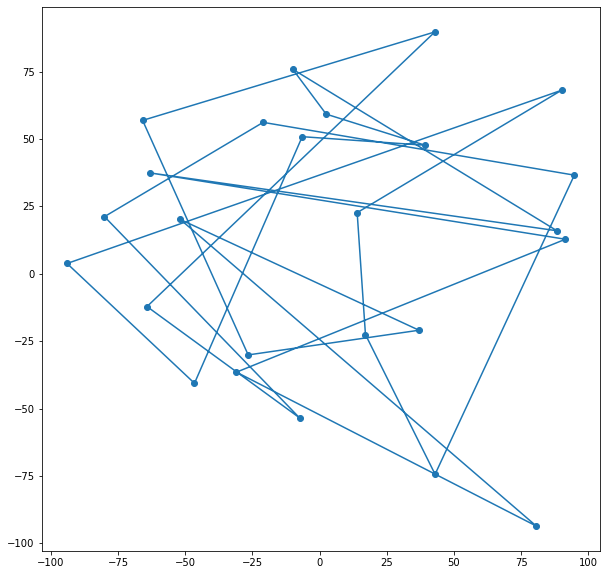

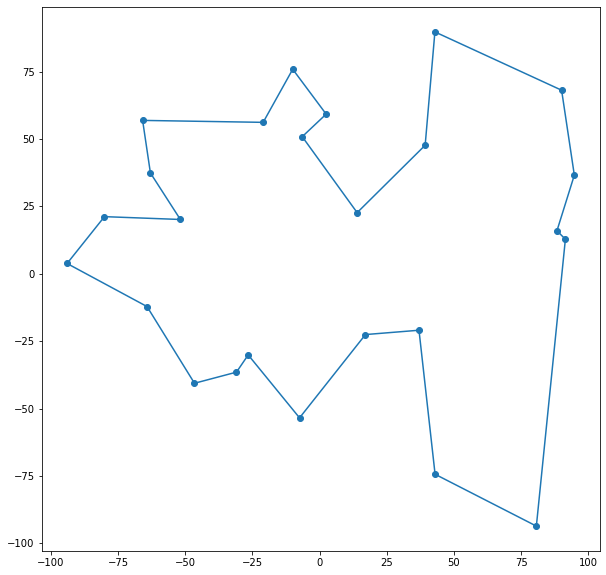

Najlepsze parametry
{'mode': 1, 'func': 'x : 0.999*x', 'max': 2000, 'min': 0.5, 'iter': 8290}
797.4279082441287


In [6]:
n = 25
points = np.random.uniform (low = -100, high = 100, size = (n, 2))
search_hyperparametrs_TSP(points)

Test parametrów
{'mode': 0, 'func': 'x : 0.8*x', 'max': 200, 'min': 0.1, 'iter': 35}
3888.412647098853
Test parametrów
{'mode': 1, 'func': 'x : 0.8*x', 'max': 200, 'min': 0.1, 'iter': 35}
3798.3412104602576
Test parametrów
{'mode': 2, 'func': 'x : 0.8*x', 'max': 200, 'min': 0.1, 'iter': 35}
4265.816511798932
Test parametrów
{'mode': 0, 'func': 'x : 0.99*x', 'max': 200, 'min': 0.1, 'iter': 757}
3215.6869437453347
Test parametrów
{'mode': 1, 'func': 'x : 0.99*x', 'max': 200, 'min': 0.1, 'iter': 757}
2034.2325115508283
Test parametrów
{'mode': 2, 'func': 'x : 0.99*x', 'max': 200, 'min': 0.1, 'iter': 757}
4040.742674222437
Test parametrów
{'mode': 0, 'func': 'x : 0.995*x', 'max': 200, 'min': 0.1, 'iter': 1517}
3446.4581890561194
Test parametrów
{'mode': 1, 'func': 'x : 0.995*x', 'max': 200, 'min': 0.1, 'iter': 1517}
1967.9679389971666
Test parametrów
{'mode': 2, 'func': 'x : 0.995*x', 'max': 200, 'min': 0.1, 'iter': 1517}
3983.6506068163762
Test parametrów
{'mode': 0, 'func': 'x : 0.999*x'

{'mode': 2, 'func': 'x : 0.9999*x', 'max': 200, 'min': 1, 'iter': 19981}
3648.2268211450137
Test parametrów
{'mode': 0, 'func': 'x : x - 1', 'max': 200, 'min': 1, 'iter': 199}
3846.4166468456488
Test parametrów
{'mode': 1, 'func': 'x : x - 1', 'max': 200, 'min': 1, 'iter': 199}
3679.2490336198034
Test parametrów
{'mode': 2, 'func': 'x : x - 1', 'max': 200, 'min': 1, 'iter': 199}
4203.7044601359685
Test parametrów
{'mode': 0, 'func': 'x : x - 5', 'max': 200, 'min': 1, 'iter': 40}
3764.9443280012197
Test parametrów
{'mode': 1, 'func': 'x : x - 5', 'max': 200, 'min': 1, 'iter': 40}
4038.90969706172
Test parametrów
{'mode': 2, 'func': 'x : x - 5', 'max': 200, 'min': 1, 'iter': 40}
3963.718423486534
Test parametrów
{'mode': 0, 'func': 'x : x/(x+1)', 'max': 200, 'min': 1, 'iter': 1}
4365.505678189091
Test parametrów
{'mode': 1, 'func': 'x : x/(x+1)', 'max': 200, 'min': 1, 'iter': 1}
4390.569617456511
Test parametrów
{'mode': 2, 'func': 'x : x/(x+1)', 'max': 200, 'min': 1, 'iter': 1}
4390.569

{'mode': 0, 'func': 'x : 0.995*x', 'max': 500, 'min': 0.1, 'iter': 1700}
3750.6060956456577
Test parametrów
{'mode': 1, 'func': 'x : 0.995*x', 'max': 500, 'min': 0.1, 'iter': 1700}
1826.9978925637697
Test parametrów
{'mode': 2, 'func': 'x : 0.995*x', 'max': 500, 'min': 0.1, 'iter': 1700}
3962.5530155614683
Test parametrów
{'mode': 0, 'func': 'x : 0.999*x', 'max': 500, 'min': 0.1, 'iter': 8513}
3162.1221685289083
Test parametrów
{'mode': 1, 'func': 'x : 0.999*x', 'max': 500, 'min': 0.1, 'iter': 8513}
1484.0995258989794
Test parametrów
{'mode': 2, 'func': 'x : 0.999*x', 'max': 500, 'min': 0.1, 'iter': 8513}
3898.3038961059115
Test parametrów
{'mode': 0, 'func': 'x : 0.9995*x', 'max': 500, 'min': 0.1, 'iter': 17031}
2634.435096224473
Test parametrów
{'mode': 1, 'func': 'x : 0.9995*x', 'max': 500, 'min': 0.1, 'iter': 17031}
1515.4455913137049
Test parametrów
{'mode': 2, 'func': 'x : 0.9995*x', 'max': 500, 'min': 0.1, 'iter': 17031}
3596.657879670381
Test parametrów
{'mode': 0, 'func': 'x :

{'mode': 2, 'func': 'x : 0.99*x', 'max': 500, 'min': 5, 'iter': 459}
3948.4769966398285
Test parametrów
{'mode': 0, 'func': 'x : 0.995*x', 'max': 500, 'min': 5, 'iter': 919}
3731.555045818132
Test parametrów
{'mode': 1, 'func': 'x : 0.995*x', 'max': 500, 'min': 5, 'iter': 919}
2668.145960397301
Test parametrów
{'mode': 2, 'func': 'x : 0.995*x', 'max': 500, 'min': 5, 'iter': 919}
3926.3434241450022
Test parametrów
{'mode': 0, 'func': 'x : 0.999*x', 'max': 500, 'min': 5, 'iter': 4603}
3101.2263074878592
Test parametrów
{'mode': 1, 'func': 'x : 0.999*x', 'max': 500, 'min': 5, 'iter': 4603}
1866.1542897799654
Test parametrów
{'mode': 2, 'func': 'x : 0.999*x', 'max': 500, 'min': 5, 'iter': 4603}
3811.5023161242293
Test parametrów
{'mode': 0, 'func': 'x : 0.9995*x', 'max': 500, 'min': 5, 'iter': 9209}
2831.468133440608
Test parametrów
{'mode': 1, 'func': 'x : 0.9995*x', 'max': 500, 'min': 5, 'iter': 9209}
1865.2647525313316
Test parametrów
{'mode': 2, 'func': 'x : 0.9995*x', 'max': 500, 'min

{'mode': 1, 'func': 'x : np.exp(np.log(x)-0.01)', 'max': 1000, 'min': 0.1, 'iter': 922}
2137.901922604541
Test parametrów
{'mode': 2, 'func': 'x : np.exp(np.log(x)-0.01)', 'max': 1000, 'min': 0.1, 'iter': 922}
4046.16769132679
Test parametrów
{'mode': 0, 'func': 'x : 0.8*x', 'max': 1000, 'min': 0.5, 'iter': 35}
3973.113398919624
Test parametrów
{'mode': 1, 'func': 'x : 0.8*x', 'max': 1000, 'min': 0.5, 'iter': 35}
4077.3376286736584
Test parametrów
{'mode': 2, 'func': 'x : 0.8*x', 'max': 1000, 'min': 0.5, 'iter': 35}
4206.732325844887
Test parametrów
{'mode': 0, 'func': 'x : 0.99*x', 'max': 1000, 'min': 0.5, 'iter': 757}
3588.273108913981
Test parametrów
{'mode': 1, 'func': 'x : 0.99*x', 'max': 1000, 'min': 0.5, 'iter': 757}
2283.4892669419196
Test parametrów
{'mode': 2, 'func': 'x : 0.99*x', 'max': 1000, 'min': 0.5, 'iter': 757}
4171.968756226192
Test parametrów
{'mode': 0, 'func': 'x : 0.995*x', 'max': 1000, 'min': 0.5, 'iter': 1517}
3127.5960097079715
Test parametrów
{'mode': 1, 'fun

{'mode': 0, 'func': 'x : 0.9999*x', 'max': 1000, 'min': 5, 'iter': 20000}
4312.873644467565
Test parametrów
{'mode': 1, 'func': 'x : 0.9999*x', 'max': 1000, 'min': 5, 'iter': 20000}
3982.0757846977385
Test parametrów
{'mode': 2, 'func': 'x : 0.9999*x', 'max': 1000, 'min': 5, 'iter': 20000}
4122.828441384606
Test parametrów
{'mode': 0, 'func': 'x : x - 1', 'max': 1000, 'min': 5, 'iter': 995}
4003.3244596515547
Test parametrów
{'mode': 1, 'func': 'x : x - 1', 'max': 1000, 'min': 5, 'iter': 995}
3904.8158345652655
Test parametrów
{'mode': 2, 'func': 'x : x - 1', 'max': 1000, 'min': 5, 'iter': 995}
4094.5059608569154
Test parametrów
{'mode': 0, 'func': 'x : x - 5', 'max': 1000, 'min': 5, 'iter': 199}
4445.358679397561
Test parametrów
{'mode': 1, 'func': 'x : x - 5', 'max': 1000, 'min': 5, 'iter': 199}
4248.774450099649
Test parametrów
{'mode': 2, 'func': 'x : x - 5', 'max': 1000, 'min': 5, 'iter': 199}
4162.42050011752
Test parametrów
{'mode': 0, 'func': 'x : x/(x+1)', 'max': 1000, 'min': 

{'mode': 0, 'func': 'x : 0.99*x', 'max': 2000, 'min': 0.5, 'iter': 826}
3593.9037595266946
Test parametrów
{'mode': 1, 'func': 'x : 0.99*x', 'max': 2000, 'min': 0.5, 'iter': 826}
2263.7448970941214
Test parametrów
{'mode': 2, 'func': 'x : 0.99*x', 'max': 2000, 'min': 0.5, 'iter': 826}
3913.520494816123
Test parametrów
{'mode': 0, 'func': 'x : 0.995*x', 'max': 2000, 'min': 0.5, 'iter': 1655}
3464.703902408961
Test parametrów
{'mode': 1, 'func': 'x : 0.995*x', 'max': 2000, 'min': 0.5, 'iter': 1655}
2269.207912615971
Test parametrów
{'mode': 2, 'func': 'x : 0.995*x', 'max': 2000, 'min': 0.5, 'iter': 1655}
4047.5600532754056
Test parametrów
{'mode': 0, 'func': 'x : 0.999*x', 'max': 2000, 'min': 0.5, 'iter': 8290}
3185.32366513075
Test parametrów
{'mode': 1, 'func': 'x : 0.999*x', 'max': 2000, 'min': 0.5, 'iter': 8290}
1591.9032303699512
Test parametrów
{'mode': 2, 'func': 'x : 0.999*x', 'max': 2000, 'min': 0.5, 'iter': 8290}
3949.0004721393448
Test parametrów
{'mode': 0, 'func': 'x : 0.999

{'mode': 0, 'func': 'x : x - 5', 'max': 2000, 'min': 5, 'iter': 399}
4089.0591245693568
Test parametrów
{'mode': 1, 'func': 'x : x - 5', 'max': 2000, 'min': 5, 'iter': 399}
4178.9311127385
Test parametrów
{'mode': 2, 'func': 'x : x - 5', 'max': 2000, 'min': 5, 'iter': 399}
4452.712117647531
Test parametrów
{'mode': 0, 'func': 'x : x/(x+1)', 'max': 2000, 'min': 5, 'iter': 1}
4399.029709106933
Test parametrów
{'mode': 1, 'func': 'x : x/(x+1)', 'max': 2000, 'min': 5, 'iter': 1}
4601.753580183835
Test parametrów
{'mode': 2, 'func': 'x : x/(x+1)', 'max': 2000, 'min': 5, 'iter': 1}
4496.396522129271
Test parametrów
{'mode': 0, 'func': 'x : np.exp(np.log(x)-0.01)', 'max': 2000, 'min': 5, 'iter': 600}
3381.7552009765272
Test parametrów
{'mode': 1, 'func': 'x : np.exp(np.log(x)-0.01)', 'max': 2000, 'min': 5, 'iter': 600}
2776.340863468597
Test parametrów
{'mode': 2, 'func': 'x : np.exp(np.log(x)-0.01)', 'max': 2000, 'min': 5, 'iter': 600}
4014.526389689188
Test parametrów
{'mode': 0, 'func': 'x

{'mode': 1, 'func': 'x : 0.995*x', 'max': 5000, 'min': 0.5, 'iter': 1838}
2005.7899214546885
Test parametrów
{'mode': 2, 'func': 'x : 0.995*x', 'max': 5000, 'min': 0.5, 'iter': 1838}
4052.428697612654
Test parametrów
{'mode': 0, 'func': 'x : 0.999*x', 'max': 5000, 'min': 0.5, 'iter': 9206}
3386.967580880755
Test parametrów
{'mode': 1, 'func': 'x : 0.999*x', 'max': 5000, 'min': 0.5, 'iter': 9206}
1748.5467331931088
Test parametrów
{'mode': 2, 'func': 'x : 0.999*x', 'max': 5000, 'min': 0.5, 'iter': 9206}
3755.3491631099814
Test parametrów
{'mode': 0, 'func': 'x : 0.9995*x', 'max': 5000, 'min': 0.5, 'iter': 18417}
2825.110995041064
Test parametrów
{'mode': 1, 'func': 'x : 0.9995*x', 'max': 5000, 'min': 0.5, 'iter': 18417}
1479.736429726418
Test parametrów
{'mode': 2, 'func': 'x : 0.9995*x', 'max': 5000, 'min': 0.5, 'iter': 18417}
3716.5321399476707
Test parametrów
{'mode': 0, 'func': 'x : 0.9999*x', 'max': 5000, 'min': 0.5, 'iter': 20000}
4862.421858176997
Test parametrów
{'mode': 1, 'fun

{'mode': 2, 'func': 'x : 0.99*x', 'max': 5000, 'min': 20, 'iter': 550}
4169.013884165102
Test parametrów
{'mode': 0, 'func': 'x : 0.995*x', 'max': 5000, 'min': 20, 'iter': 1102}
3734.481070619665
Test parametrów
{'mode': 1, 'func': 'x : 0.995*x', 'max': 5000, 'min': 20, 'iter': 1102}
2670.1144085748747
Test parametrów
{'mode': 2, 'func': 'x : 0.995*x', 'max': 5000, 'min': 20, 'iter': 1102}
4126.981367468052
Test parametrów
{'mode': 0, 'func': 'x : 0.999*x', 'max': 5000, 'min': 20, 'iter': 5519}
3605.326006289299
Test parametrów
{'mode': 1, 'func': 'x : 0.999*x', 'max': 5000, 'min': 20, 'iter': 5519}
2247.0505467811313
Test parametrów
{'mode': 2, 'func': 'x : 0.999*x', 'max': 5000, 'min': 20, 'iter': 5519}
4006.0608528274456
Test parametrów
{'mode': 0, 'func': 'x : 0.9995*x', 'max': 5000, 'min': 20, 'iter': 11041}
2847.5304802758665
Test parametrów
{'mode': 1, 'func': 'x : 0.9995*x', 'max': 5000, 'min': 20, 'iter': 11041}
2388.2480875653105
Test parametrów
{'mode': 2, 'func': 'x : 0.999

{'mode': 2, 'func': 'x : x - 1', 'max': 10000, 'min': 0.5, 'iter': 10000}
4088.334472973658
Test parametrów
{'mode': 0, 'func': 'x : x - 5', 'max': 10000, 'min': 0.5, 'iter': 2000}
4267.3676642198825
Test parametrów
{'mode': 1, 'func': 'x : x - 5', 'max': 10000, 'min': 0.5, 'iter': 2000}
4475.018661218263
Test parametrów
{'mode': 2, 'func': 'x : x - 5', 'max': 10000, 'min': 0.5, 'iter': 2000}
4433.682409634027
Test parametrów
{'mode': 0, 'func': 'x : x/(x+1)', 'max': 10000, 'min': 0.5, 'iter': 2}
4338.266604670743
Test parametrów
{'mode': 1, 'func': 'x : x/(x+1)', 'max': 10000, 'min': 0.5, 'iter': 2}
4294.465228222857
Test parametrów
{'mode': 2, 'func': 'x : x/(x+1)', 'max': 10000, 'min': 0.5, 'iter': 2}
4360.523544386386
Test parametrów
{'mode': 0, 'func': 'x : np.exp(np.log(x)-0.01)', 'max': 10000, 'min': 0.5, 'iter': 991}
3303.004463538038
Test parametrów
{'mode': 1, 'func': 'x : np.exp(np.log(x)-0.01)', 'max': 10000, 'min': 0.5, 'iter': 991}
2569.9431328998753
Test parametrów
{'mod

{'mode': 1, 'func': 'x : 0.995*x', 'max': 10000, 'min': 20, 'iter': 1240}
3151.5310565263794
Test parametrów
{'mode': 2, 'func': 'x : 0.995*x', 'max': 10000, 'min': 20, 'iter': 1240}
4110.150655994897
Test parametrów
{'mode': 0, 'func': 'x : 0.999*x', 'max': 10000, 'min': 20, 'iter': 6212}
3459.586345207948
Test parametrów
{'mode': 1, 'func': 'x : 0.999*x', 'max': 10000, 'min': 20, 'iter': 6212}
2392.485656265071
Test parametrów
{'mode': 2, 'func': 'x : 0.999*x', 'max': 10000, 'min': 20, 'iter': 6212}
4108.361905347166
Test parametrów
{'mode': 0, 'func': 'x : 0.9995*x', 'max': 10000, 'min': 20, 'iter': 12427}
3270.747557555247
Test parametrów
{'mode': 1, 'func': 'x : 0.9995*x', 'max': 10000, 'min': 20, 'iter': 12427}
2435.9394490793607
Test parametrów
{'mode': 2, 'func': 'x : 0.9995*x', 'max': 10000, 'min': 20, 'iter': 12427}
3868.541172305788
Test parametrów
{'mode': 0, 'func': 'x : 0.9999*x', 'max': 10000, 'min': 20, 'iter': 20000}
5369.25699228709
Test parametrów
{'mode': 1, 'func':

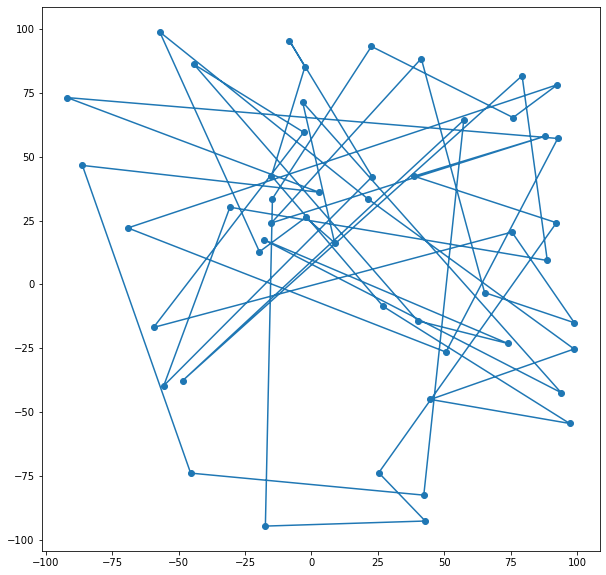

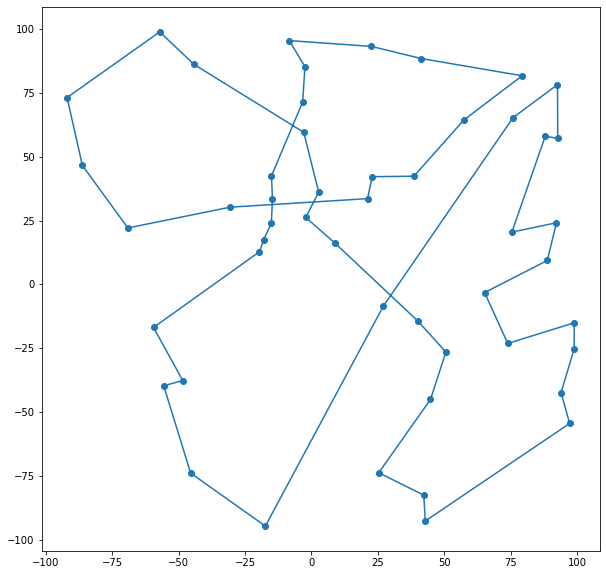

Najlepsze parametry
{'mode': 1, 'func': 'x : 0.9995*x', 'max': 200, 'min': 0.5, 'iter': 11980}
1347.3388838015035


In [7]:
n = 50
points = np.random.uniform (low = -100, high = 100, size = (n, 2))
search_hyperparametrs_TSP(points)

Test parametrów
{'mode': 0, 'func': 'x : 0.8*x', 'max': 200, 'min': 0.1, 'iter': 35}
138.91067639157862
Test parametrów
{'mode': 1, 'func': 'x : 0.8*x', 'max': 200, 'min': 0.1, 'iter': 35}
132.9282448587267
Test parametrów
{'mode': 2, 'func': 'x : 0.8*x', 'max': 200, 'min': 0.1, 'iter': 35}
148.20688249555758
Test parametrów
{'mode': 0, 'func': 'x : 0.99*x', 'max': 200, 'min': 0.1, 'iter': 757}
120.4867258873474
Test parametrów
{'mode': 1, 'func': 'x : 0.99*x', 'max': 200, 'min': 0.1, 'iter': 757}
96.22135766201654
Test parametrów
{'mode': 2, 'func': 'x : 0.99*x', 'max': 200, 'min': 0.1, 'iter': 757}
135.43066187407092
Test parametrów
{'mode': 0, 'func': 'x : 0.995*x', 'max': 200, 'min': 0.1, 'iter': 1517}
115.60705376096816
Test parametrów


/home/glegeza/anaconda3/lib/python3.8/site-packages/scipy/stats/_multivariate.py:664: RuntimeWarning: covariance is not positive-semidefinite.
  out = random_state.multivariate_normal(mean, cov, size)


{'mode': 1, 'func': 'x : 0.995*x', 'max': 200, 'min': 0.1, 'iter': 1517}
85.9864256442716
Test parametrów
{'mode': 2, 'func': 'x : 0.995*x', 'max': 200, 'min': 0.1, 'iter': 1517}
134.23890249780294
Test parametrów
{'mode': 0, 'func': 'x : 0.999*x', 'max': 200, 'min': 0.1, 'iter': 7598}
111.29657107743951
Test parametrów
{'mode': 1, 'func': 'x : 0.999*x', 'max': 200, 'min': 0.1, 'iter': 7598}
65.57757140209785
Test parametrów
{'mode': 2, 'func': 'x : 0.999*x', 'max': 200, 'min': 0.1, 'iter': 7598}
128.0750452229927
Test parametrów
{'mode': 0, 'func': 'x : 0.9995*x', 'max': 200, 'min': 0.1, 'iter': 15199}
116.67090737656945
Test parametrów
{'mode': 1, 'func': 'x : 0.9995*x', 'max': 200, 'min': 0.1, 'iter': 15199}
71.02946863746638
Test parametrów
{'mode': 2, 'func': 'x : 0.9995*x', 'max': 200, 'min': 0.1, 'iter': 15199}
121.30588648503384
Test parametrów
{'mode': 0, 'func': 'x : 0.9999*x', 'max': 200, 'min': 0.1, 'iter': 20000}
153.93608602924536
Test parametrów
{'mode': 1, 'func': 'x : 

{'mode': 0, 'func': 'x : 0.999*x', 'max': 200, 'min': 5, 'iter': 3688}
132.42230123711894
Test parametrów
{'mode': 1, 'func': 'x : 0.999*x', 'max': 200, 'min': 5, 'iter': 3688}
157.92727904972216
Test parametrów
{'mode': 2, 'func': 'x : 0.999*x', 'max': 200, 'min': 5, 'iter': 3688}
133.62398427823484
Test parametrów
{'mode': 0, 'func': 'x : 0.9995*x', 'max': 200, 'min': 5, 'iter': 7376}
147.43455244647336
Test parametrów
{'mode': 1, 'func': 'x : 0.9995*x', 'max': 200, 'min': 5, 'iter': 7376}
153.8473948704305
Test parametrów
{'mode': 2, 'func': 'x : 0.9995*x', 'max': 200, 'min': 5, 'iter': 7376}
140.49791299752692
Test parametrów
{'mode': 0, 'func': 'x : 0.9999*x', 'max': 200, 'min': 5, 'iter': 20000}
180.18342474000488
Test parametrów
{'mode': 1, 'func': 'x : 0.9999*x', 'max': 200, 'min': 5, 'iter': 20000}
176.64816271967473
Test parametrów
{'mode': 2, 'func': 'x : 0.9999*x', 'max': 200, 'min': 5, 'iter': 20000}
167.22942161855215
Test parametrów
{'mode': 0, 'func': 'x : x - 1', 'max'

{'mode': 1, 'func': 'x : 0.99*x', 'max': 500, 'min': 0.5, 'iter': 688}
96.26051518465704
Test parametrów
{'mode': 2, 'func': 'x : 0.99*x', 'max': 500, 'min': 0.5, 'iter': 688}
135.1368360774747
Test parametrów
{'mode': 0, 'func': 'x : 0.995*x', 'max': 500, 'min': 0.5, 'iter': 1379}
134.49165235308607
Test parametrów
{'mode': 1, 'func': 'x : 0.995*x', 'max': 500, 'min': 0.5, 'iter': 1379}
95.77476670724081
Test parametrów
{'mode': 2, 'func': 'x : 0.995*x', 'max': 500, 'min': 0.5, 'iter': 1379}
133.03673349934024
Test parametrów
{'mode': 0, 'func': 'x : 0.999*x', 'max': 500, 'min': 0.5, 'iter': 6905}
112.92192659307386
Test parametrów
{'mode': 1, 'func': 'x : 0.999*x', 'max': 500, 'min': 0.5, 'iter': 6905}
79.08073044558924
Test parametrów
{'mode': 2, 'func': 'x : 0.999*x', 'max': 500, 'min': 0.5, 'iter': 6905}
125.00155173171852
Test parametrów
{'mode': 0, 'func': 'x : 0.9995*x', 'max': 500, 'min': 0.5, 'iter': 13813}
107.4117666685633
Test parametrów
{'mode': 1, 'func': 'x : 0.9995*x',

{'mode': 0, 'func': 'x : 0.999*x', 'max': 500, 'min': 20, 'iter': 3218}
162.72463763096604
Test parametrów
{'mode': 1, 'func': 'x : 0.999*x', 'max': 500, 'min': 20, 'iter': 3218}
137.97596938504705
Test parametrów
{'mode': 2, 'func': 'x : 0.999*x', 'max': 500, 'min': 20, 'iter': 3218}
173.91596161708412
Test parametrów
{'mode': 0, 'func': 'x : 0.9995*x', 'max': 500, 'min': 20, 'iter': 6437}
177.8713404125767
Test parametrów
{'mode': 1, 'func': 'x : 0.9995*x', 'max': 500, 'min': 20, 'iter': 6437}
153.68208831887435
Test parametrów
{'mode': 2, 'func': 'x : 0.9995*x', 'max': 500, 'min': 20, 'iter': 6437}
167.35652917012595
Test parametrów
{'mode': 0, 'func': 'x : 0.9999*x', 'max': 500, 'min': 20, 'iter': 20000}
172.41639934564807
Test parametrów
{'mode': 1, 'func': 'x : 0.9999*x', 'max': 500, 'min': 20, 'iter': 20000}
158.63017458016844
Test parametrów
{'mode': 2, 'func': 'x : 0.9999*x', 'max': 500, 'min': 20, 'iter': 20000}
169.68841769929688
Test parametrów
{'mode': 0, 'func': 'x : x - 

{'mode': 0, 'func': 'x : 0.8*x', 'max': 1000, 'min': 1, 'iter': 31}
165.9516861040958
Test parametrów
{'mode': 1, 'func': 'x : 0.8*x', 'max': 1000, 'min': 1, 'iter': 31}
177.17509061483085
Test parametrów
{'mode': 2, 'func': 'x : 0.8*x', 'max': 1000, 'min': 1, 'iter': 31}
145.80922639402434
Test parametrów
{'mode': 0, 'func': 'x : 0.99*x', 'max': 1000, 'min': 1, 'iter': 688}
129.15821783558866
Test parametrów
{'mode': 1, 'func': 'x : 0.99*x', 'max': 1000, 'min': 1, 'iter': 688}
121.4093936895937
Test parametrów
{'mode': 2, 'func': 'x : 0.99*x', 'max': 1000, 'min': 1, 'iter': 688}
137.80438626005122
Test parametrów
{'mode': 0, 'func': 'x : 0.995*x', 'max': 1000, 'min': 1, 'iter': 1379}
149.6693326207717
Test parametrów
{'mode': 1, 'func': 'x : 0.995*x', 'max': 1000, 'min': 1, 'iter': 1379}
114.0182086333378
Test parametrów
{'mode': 2, 'func': 'x : 0.995*x', 'max': 1000, 'min': 1, 'iter': 1379}
136.1620708357085
Test parametrów
{'mode': 0, 'func': 'x : 0.999*x', 'max': 1000, 'min': 1, 'i

{'mode': 2, 'func': 'x : 0.9999*x', 'max': 1000, 'min': 20, 'iter': 20000}
187.69379723015012
Test parametrów
{'mode': 0, 'func': 'x : x - 1', 'max': 1000, 'min': 20, 'iter': 980}
179.31141883723473
Test parametrów
{'mode': 1, 'func': 'x : x - 1', 'max': 1000, 'min': 20, 'iter': 980}
159.53419511889777
Test parametrów
{'mode': 2, 'func': 'x : x - 1', 'max': 1000, 'min': 20, 'iter': 980}
157.37518031919114
Test parametrów
{'mode': 0, 'func': 'x : x - 5', 'max': 1000, 'min': 20, 'iter': 196}
166.33451456762802
Test parametrów
{'mode': 1, 'func': 'x : x - 5', 'max': 1000, 'min': 20, 'iter': 196}
156.68418373460986
Test parametrów
{'mode': 2, 'func': 'x : x - 5', 'max': 1000, 'min': 20, 'iter': 196}
166.52565671111066
Test parametrów
{'mode': 0, 'func': 'x : x/(x+1)', 'max': 1000, 'min': 20, 'iter': 1}
157.58920907023605
Test parametrów
{'mode': 1, 'func': 'x : x/(x+1)', 'max': 1000, 'min': 20, 'iter': 1}
168.07278210839385
Test parametrów
{'mode': 2, 'func': 'x : x/(x+1)', 'max': 1000, 'm

{'mode': 0, 'func': 'x : 0.995*x', 'max': 2000, 'min': 1, 'iter': 1517}
119.0257334641131
Test parametrów
{'mode': 1, 'func': 'x : 0.995*x', 'max': 2000, 'min': 1, 'iter': 1517}
106.41852280985435
Test parametrów
{'mode': 2, 'func': 'x : 0.995*x', 'max': 2000, 'min': 1, 'iter': 1517}
141.22206412612047
Test parametrów
{'mode': 0, 'func': 'x : 0.999*x', 'max': 2000, 'min': 1, 'iter': 7598}
102.74939859704172
Test parametrów
{'mode': 1, 'func': 'x : 0.999*x', 'max': 2000, 'min': 1, 'iter': 7598}
91.8091826338517
Test parametrów
{'mode': 2, 'func': 'x : 0.999*x', 'max': 2000, 'min': 1, 'iter': 7598}
142.34492400549146
Test parametrów
{'mode': 0, 'func': 'x : 0.9995*x', 'max': 2000, 'min': 1, 'iter': 15199}
95.16958037799262
Test parametrów
{'mode': 1, 'func': 'x : 0.9995*x', 'max': 2000, 'min': 1, 'iter': 15199}
96.46306425972068
Test parametrów
{'mode': 2, 'func': 'x : 0.9995*x', 'max': 2000, 'min': 1, 'iter': 15199}
126.08747255960935
Test parametrów
{'mode': 0, 'func': 'x : 0.9999*x', 

{'mode': 2, 'func': 'x : x - 5', 'max': 2000, 'min': 20, 'iter': 396}
167.37716979569197
Test parametrów
{'mode': 0, 'func': 'x : x/(x+1)', 'max': 2000, 'min': 20, 'iter': 1}
163.79051039351506
Test parametrów
{'mode': 1, 'func': 'x : x/(x+1)', 'max': 2000, 'min': 20, 'iter': 1}
166.85864711318914
Test parametrów
{'mode': 2, 'func': 'x : x/(x+1)', 'max': 2000, 'min': 20, 'iter': 1}
166.02913702992475
Test parametrów
{'mode': 0, 'func': 'x : np.exp(np.log(x)-0.01)', 'max': 2000, 'min': 20, 'iter': 461}
152.57414422935398
Test parametrów
{'mode': 1, 'func': 'x : np.exp(np.log(x)-0.01)', 'max': 2000, 'min': 20, 'iter': 461}
171.72614534974943
Test parametrów
{'mode': 2, 'func': 'x : np.exp(np.log(x)-0.01)', 'max': 2000, 'min': 20, 'iter': 461}
178.34830313859635
Test parametrów
{'mode': 0, 'func': 'x : 0.8*x', 'max': 5000, 'min': 0.1, 'iter': 49}
141.4570583845703
Test parametrów
{'mode': 1, 'func': 'x : 0.8*x', 'max': 5000, 'min': 0.1, 'iter': 49}
144.90605651671373
Test parametrów
{'mod

{'mode': 0, 'func': 'x : 0.999*x', 'max': 5000, 'min': 1, 'iter': 8513}
99.82566904691687
Test parametrów
{'mode': 1, 'func': 'x : 0.999*x', 'max': 5000, 'min': 1, 'iter': 8513}
93.99686394164917
Test parametrów
{'mode': 2, 'func': 'x : 0.999*x', 'max': 5000, 'min': 1, 'iter': 8513}
130.20416262282316
Test parametrów
{'mode': 0, 'func': 'x : 0.9995*x', 'max': 5000, 'min': 1, 'iter': 17031}
97.06567177453246
Test parametrów
{'mode': 1, 'func': 'x : 0.9995*x', 'max': 5000, 'min': 1, 'iter': 17031}
82.46868906475251
Test parametrów
{'mode': 2, 'func': 'x : 0.9995*x', 'max': 5000, 'min': 1, 'iter': 17031}
134.16990185520453
Test parametrów
{'mode': 0, 'func': 'x : 0.9999*x', 'max': 5000, 'min': 1, 'iter': 20000}
178.00408844134733
Test parametrów
{'mode': 1, 'func': 'x : 0.9999*x', 'max': 5000, 'min': 1, 'iter': 20000}
183.26164893441336
Test parametrów
{'mode': 2, 'func': 'x : 0.9999*x', 'max': 5000, 'min': 1, 'iter': 20000}
179.91805315703152
Test parametrów
{'mode': 0, 'func': 'x : x - 

{'mode': 2, 'func': 'x : 0.99*x', 'max': 10000, 'min': 0.1, 'iter': 1146}
125.3210343687119
Test parametrów
{'mode': 0, 'func': 'x : 0.995*x', 'max': 10000, 'min': 0.1, 'iter': 2297}
106.18388283901913
Test parametrów
{'mode': 1, 'func': 'x : 0.995*x', 'max': 10000, 'min': 0.1, 'iter': 2297}
84.82645099688948
Test parametrów
{'mode': 2, 'func': 'x : 0.995*x', 'max': 10000, 'min': 0.1, 'iter': 2297}
129.31073655047098
Test parametrów
{'mode': 0, 'func': 'x : 0.999*x', 'max': 10000, 'min': 0.1, 'iter': 11508}
98.5032909126988
Test parametrów
{'mode': 1, 'func': 'x : 0.999*x', 'max': 10000, 'min': 0.1, 'iter': 11508}
67.24424277901113
Test parametrów
{'mode': 2, 'func': 'x : 0.999*x', 'max': 10000, 'min': 0.1, 'iter': 11508}
129.06572809427308
Test parametrów
{'mode': 0, 'func': 'x : 0.9995*x', 'max': 10000, 'min': 0.1, 'iter': 20000}
90.3054690032248
Test parametrów
{'mode': 1, 'func': 'x : 0.9995*x', 'max': 10000, 'min': 0.1, 'iter': 20000}
77.80381262277976
Test parametrów
{'mode': 2, 

{'mode': 2, 'func': 'x : x - 1', 'max': 10000, 'min': 1, 'iter': 9999}
142.52569523658715
Test parametrów
{'mode': 0, 'func': 'x : x - 5', 'max': 10000, 'min': 1, 'iter': 2000}
167.81241220989386
Test parametrów
{'mode': 1, 'func': 'x : x - 5', 'max': 10000, 'min': 1, 'iter': 2000}
147.92711151683736
Test parametrów
{'mode': 2, 'func': 'x : x - 5', 'max': 10000, 'min': 1, 'iter': 2000}
166.87239681406268
Test parametrów
{'mode': 0, 'func': 'x : x/(x+1)', 'max': 10000, 'min': 1, 'iter': 1}
164.94405422523388
Test parametrów
{'mode': 1, 'func': 'x : x/(x+1)', 'max': 10000, 'min': 1, 'iter': 1}
168.31424908216306
Test parametrów
{'mode': 2, 'func': 'x : x/(x+1)', 'max': 10000, 'min': 1, 'iter': 1}
172.50521623233215
Test parametrów
{'mode': 0, 'func': 'x : np.exp(np.log(x)-0.01)', 'max': 10000, 'min': 1, 'iter': 922}
130.19938901213337
Test parametrów
{'mode': 1, 'func': 'x : np.exp(np.log(x)-0.01)', 'max': 10000, 'min': 1, 'iter': 922}
114.25258643375382
Test parametrów
{'mode': 2, 'func

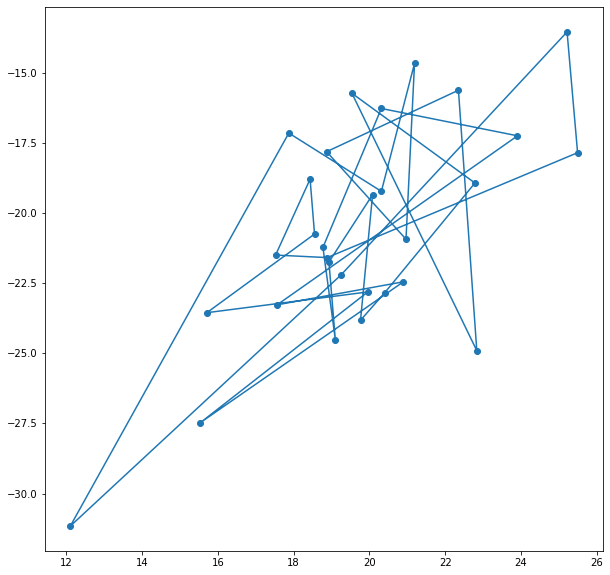

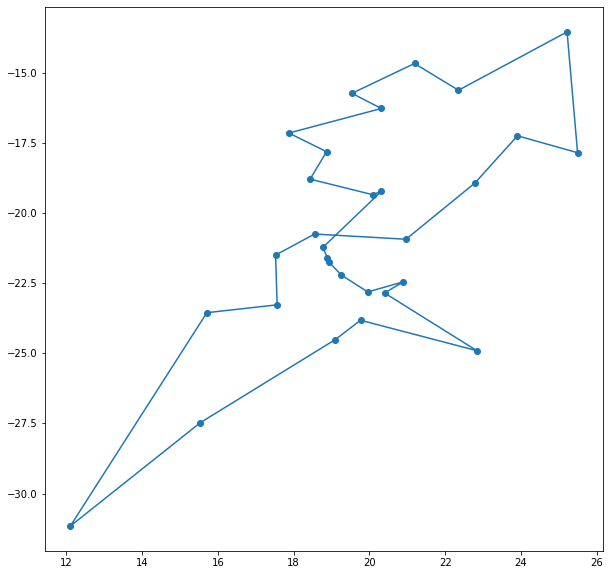

Najlepsze parametry
{'mode': 1, 'func': 'x : 0.9995*x', 'max': 500, 'min': 0.1, 'iter': 17031}
64.62865671977708


In [8]:
n = 30
points = mvn.rvs(mean=[20,-20], cov = [[10,20],[10,10]], size = n)
points = np.random.permutation (points)
search_hyperparametrs_TSP(points)

Test parametrów
{'mode': 0, 'func': 'x : 0.8*x', 'max': 200, 'min': 0.1, 'iter': 35}
3047.6066363269983
Test parametrów
{'mode': 1, 'func': 'x : 0.8*x', 'max': 200, 'min': 0.1, 'iter': 35}
3030.360966171672
Test parametrów
{'mode': 2, 'func': 'x : 0.8*x', 'max': 200, 'min': 0.1, 'iter': 35}
3011.1707721549133
Test parametrów
{'mode': 0, 'func': 'x : 0.99*x', 'max': 200, 'min': 0.1, 'iter': 757}
2538.8859522611688
Test parametrów
{'mode': 1, 'func': 'x : 0.99*x', 'max': 200, 'min': 0.1, 'iter': 757}
1760.442915162546
Test parametrów
{'mode': 2, 'func': 'x : 0.99*x', 'max': 200, 'min': 0.1, 'iter': 757}
2892.745854398906
Test parametrów
{'mode': 0, 'func': 'x : 0.995*x', 'max': 200, 'min': 0.1, 'iter': 1517}
2081.4470606961786
Test parametrów
{'mode': 1, 'func': 'x : 0.995*x', 'max': 200, 'min': 0.1, 'iter': 1517}
1275.308439622698
Test parametrów
{'mode': 2, 'func': 'x : 0.995*x', 'max': 200, 'min': 0.1, 'iter': 1517}
2897.0893961662023
Test parametrów
{'mode': 0, 'func': 'x : 0.999*x',

{'mode': 2, 'func': 'x : 0.9999*x', 'max': 200, 'min': 1, 'iter': 20000}
2795.59475644276
Test parametrów
{'mode': 0, 'func': 'x : x - 1', 'max': 200, 'min': 1, 'iter': 199}
2869.1001159689076
Test parametrów
{'mode': 1, 'func': 'x : x - 1', 'max': 200, 'min': 1, 'iter': 199}
2722.0280257993822
Test parametrów
{'mode': 2, 'func': 'x : x - 1', 'max': 200, 'min': 1, 'iter': 199}
2935.340283803641
Test parametrów
{'mode': 0, 'func': 'x : x - 5', 'max': 200, 'min': 1, 'iter': 40}
3229.647245100655
Test parametrów
{'mode': 1, 'func': 'x : x - 5', 'max': 200, 'min': 1, 'iter': 40}
3069.055407400087
Test parametrów
{'mode': 2, 'func': 'x : x - 5', 'max': 200, 'min': 1, 'iter': 40}
2840.5892307002073
Test parametrów
{'mode': 0, 'func': 'x : x/(x+1)', 'max': 200, 'min': 1, 'iter': 1}
3221.59977304535
Test parametrów
{'mode': 1, 'func': 'x : x/(x+1)', 'max': 200, 'min': 1, 'iter': 1}
3199.042344654079
Test parametrów
{'mode': 2, 'func': 'x : x/(x+1)', 'max': 200, 'min': 1, 'iter': 1}
3291.876074

{'mode': 0, 'func': 'x : 0.995*x', 'max': 500, 'min': 0.1, 'iter': 1700}
2566.5435076604517
Test parametrów
{'mode': 1, 'func': 'x : 0.995*x', 'max': 500, 'min': 0.1, 'iter': 1700}
1465.9494678500926
Test parametrów
{'mode': 2, 'func': 'x : 0.995*x', 'max': 500, 'min': 0.1, 'iter': 1700}
2696.270456549968
Test parametrów
{'mode': 0, 'func': 'x : 0.999*x', 'max': 500, 'min': 0.1, 'iter': 8513}
2147.584469641185
Test parametrów
{'mode': 1, 'func': 'x : 0.999*x', 'max': 500, 'min': 0.1, 'iter': 8513}
839.2909853860718
Test parametrów
{'mode': 2, 'func': 'x : 0.999*x', 'max': 500, 'min': 0.1, 'iter': 8513}
2758.940336453277
Test parametrów
{'mode': 0, 'func': 'x : 0.9995*x', 'max': 500, 'min': 0.1, 'iter': 17031}
1834.9281922316866
Test parametrów
{'mode': 1, 'func': 'x : 0.9995*x', 'max': 500, 'min': 0.1, 'iter': 17031}
851.0963260253749
Test parametrów
{'mode': 2, 'func': 'x : 0.9995*x', 'max': 500, 'min': 0.1, 'iter': 17031}
2694.535339458772
Test parametrów
{'mode': 0, 'func': 'x : 0.9

{'mode': 2, 'func': 'x : 0.99*x', 'max': 500, 'min': 5, 'iter': 459}
2892.5891826843376
Test parametrów
{'mode': 0, 'func': 'x : 0.995*x', 'max': 500, 'min': 5, 'iter': 919}
2581.871815838199
Test parametrów
{'mode': 1, 'func': 'x : 0.995*x', 'max': 500, 'min': 5, 'iter': 919}
1917.8788064135033
Test parametrów
{'mode': 2, 'func': 'x : 0.995*x', 'max': 500, 'min': 5, 'iter': 919}
2928.035671879684
Test parametrów
{'mode': 0, 'func': 'x : 0.999*x', 'max': 500, 'min': 5, 'iter': 4603}
2183.3627215220577
Test parametrów
{'mode': 1, 'func': 'x : 0.999*x', 'max': 500, 'min': 5, 'iter': 4603}
1336.0930709836082
Test parametrów
{'mode': 2, 'func': 'x : 0.999*x', 'max': 500, 'min': 5, 'iter': 4603}
2630.1889323306864
Test parametrów
{'mode': 0, 'func': 'x : 0.9995*x', 'max': 500, 'min': 5, 'iter': 9209}
1941.6014130254023
Test parametrów
{'mode': 1, 'func': 'x : 0.9995*x', 'max': 500, 'min': 5, 'iter': 9209}
1112.943685448749
Test parametrów
{'mode': 2, 'func': 'x : 0.9995*x', 'max': 500, 'min

{'mode': 2, 'func': 'x : np.exp(np.log(x)-0.01)', 'max': 1000, 'min': 0.1, 'iter': 922}
2803.761204420801
Test parametrów
{'mode': 0, 'func': 'x : 0.8*x', 'max': 1000, 'min': 0.5, 'iter': 35}
3033.7151837952583
Test parametrów
{'mode': 1, 'func': 'x : 0.8*x', 'max': 1000, 'min': 0.5, 'iter': 35}
3056.509149800719
Test parametrów
{'mode': 2, 'func': 'x : 0.8*x', 'max': 1000, 'min': 0.5, 'iter': 35}
3017.6213495876254
Test parametrów
{'mode': 0, 'func': 'x : 0.99*x', 'max': 1000, 'min': 0.5, 'iter': 757}
2545.953869773432
Test parametrów
{'mode': 1, 'func': 'x : 0.99*x', 'max': 1000, 'min': 0.5, 'iter': 757}
1857.5154885604302
Test parametrów
{'mode': 2, 'func': 'x : 0.99*x', 'max': 1000, 'min': 0.5, 'iter': 757}
2835.1041894833024
Test parametrów
{'mode': 0, 'func': 'x : 0.995*x', 'max': 1000, 'min': 0.5, 'iter': 1517}
2363.043978230427
Test parametrów
{'mode': 1, 'func': 'x : 0.995*x', 'max': 1000, 'min': 0.5, 'iter': 1517}
1546.7193116336805
Test parametrów
{'mode': 2, 'func': 'x : 0.

{'mode': 1, 'func': 'x : 0.9999*x', 'max': 1000, 'min': 5, 'iter': 20000}
3191.4383411673552
Test parametrów
{'mode': 2, 'func': 'x : 0.9999*x', 'max': 1000, 'min': 5, 'iter': 20000}
3379.2817441045922
Test parametrów
{'mode': 0, 'func': 'x : x - 1', 'max': 1000, 'min': 5, 'iter': 995}
2884.274159248585
Test parametrów
{'mode': 1, 'func': 'x : x - 1', 'max': 1000, 'min': 5, 'iter': 995}
2663.8322461005296
Test parametrów
{'mode': 2, 'func': 'x : x - 1', 'max': 1000, 'min': 5, 'iter': 995}
2852.8176558007212
Test parametrów
{'mode': 0, 'func': 'x : x - 5', 'max': 1000, 'min': 5, 'iter': 199}
3144.8037778600724
Test parametrów
{'mode': 1, 'func': 'x : x - 5', 'max': 1000, 'min': 5, 'iter': 199}
2742.6575075492074
Test parametrów
{'mode': 2, 'func': 'x : x - 5', 'max': 1000, 'min': 5, 'iter': 199}
2898.6440251967456
Test parametrów
{'mode': 0, 'func': 'x : x/(x+1)', 'max': 1000, 'min': 5, 'iter': 1}
3283.8839182621177
Test parametrów
{'mode': 1, 'func': 'x : x/(x+1)', 'max': 1000, 'min': 

{'mode': 1, 'func': 'x : 0.99*x', 'max': 2000, 'min': 0.5, 'iter': 826}
1489.8750163491634
Test parametrów
{'mode': 2, 'func': 'x : 0.99*x', 'max': 2000, 'min': 0.5, 'iter': 826}
2896.1565358065077
Test parametrów
{'mode': 0, 'func': 'x : 0.995*x', 'max': 2000, 'min': 0.5, 'iter': 1655}
2383.6685848726306
Test parametrów
{'mode': 1, 'func': 'x : 0.995*x', 'max': 2000, 'min': 0.5, 'iter': 1655}
1374.3939330883175
Test parametrów
{'mode': 2, 'func': 'x : 0.995*x', 'max': 2000, 'min': 0.5, 'iter': 1655}
2811.0686952527426
Test parametrów
{'mode': 0, 'func': 'x : 0.999*x', 'max': 2000, 'min': 0.5, 'iter': 8290}
2140.4275195476052
Test parametrów
{'mode': 1, 'func': 'x : 0.999*x', 'max': 2000, 'min': 0.5, 'iter': 8290}
939.924118078332
Test parametrów
{'mode': 2, 'func': 'x : 0.999*x', 'max': 2000, 'min': 0.5, 'iter': 8290}
2777.768768985837
Test parametrów
{'mode': 0, 'func': 'x : 0.9995*x', 'max': 2000, 'min': 0.5, 'iter': 16584}
1934.1958659806598
Test parametrów
{'mode': 1, 'func': 'x :

{'mode': 1, 'func': 'x : x - 5', 'max': 2000, 'min': 5, 'iter': 399}
3031.238896878264
Test parametrów
{'mode': 2, 'func': 'x : x - 5', 'max': 2000, 'min': 5, 'iter': 399}
3015.299397874418
Test parametrów
{'mode': 0, 'func': 'x : x/(x+1)', 'max': 2000, 'min': 5, 'iter': 1}
3242.4365422134524
Test parametrów
{'mode': 1, 'func': 'x : x/(x+1)', 'max': 2000, 'min': 5, 'iter': 1}
3264.4753290114804
Test parametrów
{'mode': 2, 'func': 'x : x/(x+1)', 'max': 2000, 'min': 5, 'iter': 1}
3316.6787958946975
Test parametrów
{'mode': 0, 'func': 'x : np.exp(np.log(x)-0.01)', 'max': 2000, 'min': 5, 'iter': 600}
2491.2184624918673
Test parametrów
{'mode': 1, 'func': 'x : np.exp(np.log(x)-0.01)', 'max': 2000, 'min': 5, 'iter': 600}
2107.831968202571
Test parametrów
{'mode': 2, 'func': 'x : np.exp(np.log(x)-0.01)', 'max': 2000, 'min': 5, 'iter': 600}
2917.9136578154435
Test parametrów
{'mode': 0, 'func': 'x : 0.8*x', 'max': 2000, 'min': 20, 'iter': 21}
3208.302437414981
Test parametrów
{'mode': 1, 'func

{'mode': 0, 'func': 'x : 0.999*x', 'max': 5000, 'min': 0.5, 'iter': 9206}
2037.723825798811
Test parametrów
{'mode': 1, 'func': 'x : 0.999*x', 'max': 5000, 'min': 0.5, 'iter': 9206}
946.4472144223905
Test parametrów
{'mode': 2, 'func': 'x : 0.999*x', 'max': 5000, 'min': 0.5, 'iter': 9206}
2721.7278006799284
Test parametrów
{'mode': 0, 'func': 'x : 0.9995*x', 'max': 5000, 'min': 0.5, 'iter': 18417}
1932.8214037068828
Test parametrów
{'mode': 1, 'func': 'x : 0.9995*x', 'max': 5000, 'min': 0.5, 'iter': 18417}
871.192951615484
Test parametrów
{'mode': 2, 'func': 'x : 0.9995*x', 'max': 5000, 'min': 0.5, 'iter': 18417}
2768.7737093759497
Test parametrów
{'mode': 0, 'func': 'x : 0.9999*x', 'max': 5000, 'min': 0.5, 'iter': 20000}
3449.116004206684
Test parametrów
{'mode': 1, 'func': 'x : 0.9999*x', 'max': 5000, 'min': 0.5, 'iter': 20000}
3309.713205415094
Test parametrów
{'mode': 2, 'func': 'x : 0.9999*x', 'max': 5000, 'min': 0.5, 'iter': 20000}
3370.6185980430782
Test parametrów
{'mode': 0, '

{'mode': 2, 'func': 'x : 0.99*x', 'max': 5000, 'min': 20, 'iter': 550}
2881.2123138438797
Test parametrów
{'mode': 0, 'func': 'x : 0.995*x', 'max': 5000, 'min': 20, 'iter': 1102}
2723.293955662817
Test parametrów
{'mode': 1, 'func': 'x : 0.995*x', 'max': 5000, 'min': 20, 'iter': 1102}
2320.8946150771994
Test parametrów
{'mode': 2, 'func': 'x : 0.995*x', 'max': 5000, 'min': 20, 'iter': 1102}
2925.757002709773
Test parametrów
{'mode': 0, 'func': 'x : 0.999*x', 'max': 5000, 'min': 20, 'iter': 5519}
2747.9809344698688
Test parametrów
{'mode': 1, 'func': 'x : 0.999*x', 'max': 5000, 'min': 20, 'iter': 5519}
1866.433872159048
Test parametrów
{'mode': 2, 'func': 'x : 0.999*x', 'max': 5000, 'min': 20, 'iter': 5519}
2802.5820582526676
Test parametrów
{'mode': 0, 'func': 'x : 0.9995*x', 'max': 5000, 'min': 20, 'iter': 11041}
2407.4614016060455
Test parametrów
{'mode': 1, 'func': 'x : 0.9995*x', 'max': 5000, 'min': 20, 'iter': 11041}
2246.314790692295
Test parametrów
{'mode': 2, 'func': 'x : 0.999

{'mode': 2, 'func': 'x : x - 1', 'max': 10000, 'min': 0.5, 'iter': 10000}
2833.2155175432167
Test parametrów
{'mode': 0, 'func': 'x : x - 5', 'max': 10000, 'min': 0.5, 'iter': 2000}
3226.177197664267
Test parametrów
{'mode': 1, 'func': 'x : x - 5', 'max': 10000, 'min': 0.5, 'iter': 2000}
3175.824839587399
Test parametrów
{'mode': 2, 'func': 'x : x - 5', 'max': 10000, 'min': 0.5, 'iter': 2000}
3034.9643636088445
Test parametrów
{'mode': 0, 'func': 'x : x/(x+1)', 'max': 10000, 'min': 0.5, 'iter': 2}
3226.869729599278
Test parametrów
{'mode': 1, 'func': 'x : x/(x+1)', 'max': 10000, 'min': 0.5, 'iter': 2}
3198.0342801781917
Test parametrów
{'mode': 2, 'func': 'x : x/(x+1)', 'max': 10000, 'min': 0.5, 'iter': 2}
3349.365313833343
Test parametrów
{'mode': 0, 'func': 'x : np.exp(np.log(x)-0.01)', 'max': 10000, 'min': 0.5, 'iter': 991}
2317.538691252802
Test parametrów
{'mode': 1, 'func': 'x : np.exp(np.log(x)-0.01)', 'max': 10000, 'min': 0.5, 'iter': 991}
1651.8383325289356
Test parametrów
{'m

{'mode': 1, 'func': 'x : 0.995*x', 'max': 10000, 'min': 20, 'iter': 1240}
2345.196162401556
Test parametrów
{'mode': 2, 'func': 'x : 0.995*x', 'max': 10000, 'min': 20, 'iter': 1240}
2875.8250815675065
Test parametrów
{'mode': 0, 'func': 'x : 0.999*x', 'max': 10000, 'min': 20, 'iter': 6212}
2519.968163861881
Test parametrów
{'mode': 1, 'func': 'x : 0.999*x', 'max': 10000, 'min': 20, 'iter': 6212}
2288.935308195878
Test parametrów
{'mode': 2, 'func': 'x : 0.999*x', 'max': 10000, 'min': 20, 'iter': 6212}
2866.251390490822
Test parametrów
{'mode': 0, 'func': 'x : 0.9995*x', 'max': 10000, 'min': 20, 'iter': 12427}
2465.4653215951944
Test parametrów
{'mode': 1, 'func': 'x : 0.9995*x', 'max': 10000, 'min': 20, 'iter': 12427}
2196.852370206661
Test parametrów
{'mode': 2, 'func': 'x : 0.9995*x', 'max': 10000, 'min': 20, 'iter': 12427}
2919.260215132657
Test parametrów
{'mode': 0, 'func': 'x : 0.9999*x', 'max': 10000, 'min': 20, 'iter': 20000}
3366.3878341977884
Test parametrów
{'mode': 1, 'func

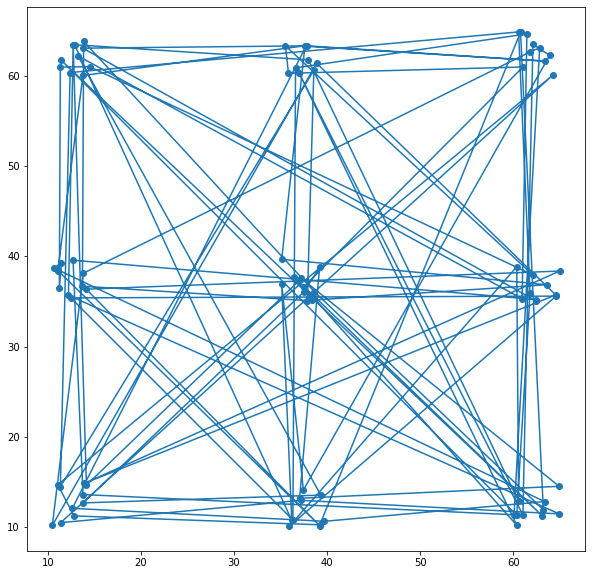

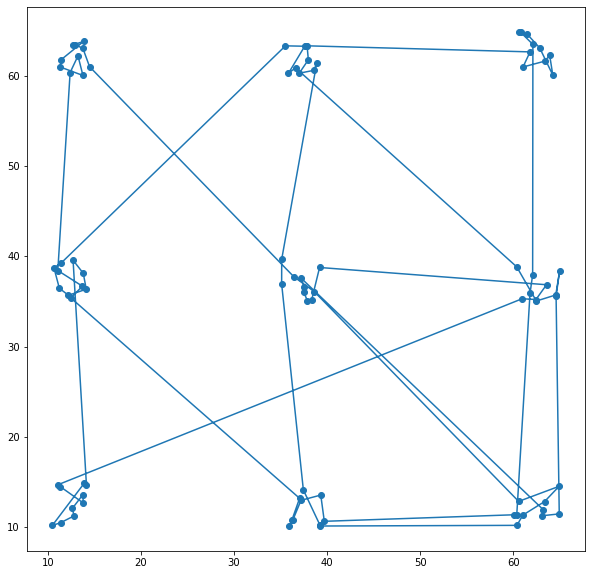

Najlepsze parametry
{'mode': 1, 'func': 'x : 0.999*x', 'max': 5000, 'min': 0.1, 'iter': 10815}
645.4582926156526


In [9]:
n = 10
points = np.array([[0, 0]])
for i in [0, 25, 50]:
    for j in [0, 25, 50]:
        tmp = np.random.uniform (low = 10, high = 15, size = (n, 2))
        to_sum = np.array([[i, j] for _ in range (n)])
        tmp = tmp + to_sum
        points = np.concatenate((points, tmp))
points = points[1:,:]
points = np.random.permutation (points)

search_hyperparametrs_TSP(points)

Na podstawie powyższych parametrów stwierdzam, że optymalne wartości parametrów to: `mode` = 1, `stop` = 0.1 i funkcja redukcji temperatury `x : 0.9995*x`. Z przeprowadzonych testów zauwazyłem, że optymalna funkcja redukcji temperatury zależy od parametru `N`. Jeśli pozwolimy na więcej iteracji, algorytm będzie chciał je wykorzystać i będzie wybierał temperatury wolniej zbiegające do 0. Początkowa wartość temperatury zależy od wartości liczonej energii. Parametr ten powinien być na tyle duży aby początkowe prawdopodobieństwo akceptacji złego wyniku było duże (aby algorytm na początku miał duże wahania). Dla danych w moich przykładach i dla zadanej funkcji redukcji temperatury optymalna wartość temperatury to 2000. Pozwala to wykorzystać dużą liczbę iteracji. Dzięki temu trudniejsze zadania będą znajdowały optymalne rozwiązania, a prostsze będą miały początek mało znaczący, jednakże nadal będą znajdowały rozwiązanie.

Dla zobrazowania różnic pomiędzy parametrami wywołam dla jednego zbioru funkcję `visual_hyperparametrs_TSP`, która jest zubożałą wersją funkcji `search_hyperparametrs_TSP`.

In [10]:
def visual_hyperparametrs_TSP (points):
    i_plot = 4
    plt.figure(3, figsize=(10,10))
    plt.scatter(points[:,0], points[:,1])
    plt.plot(np.append(points[:,0], points[0, 0]), np.append(points[:,1], points[0, 1]))
    initial_state = np.array([i for i in range (len(points))])
    max_T = [1000, 500, 10000]
    min_T = [0.1, 20]
    functions = [lambda x : 0.8*x, lambda x : 0.9995*x, lambda x : x - 1]
    print_func = ["x : 0.8*x", "x : 0.9995*x", "x : x - 1"]
    mode = [0, 1]
    best_result = np.Inf
    solution = None
    best_param = {'mode': None, 'func': None, 'max': None, 'min': None, 'iter':None}
    for mT in max_T:
        for nT in min_T:
            for fi, f in enumerate(functions):
                for m in mode:
                    print ("Test parametrów")
                    tsp = TSP (initial_state.copy(), points, m, temperature = mT, stop = nT, f_reduce = f, visual = 2)
                    X, value, n_iter = tsp.anneal ()
                    tmp_dict = {}
                    tmp_dict['mode'] = m
                    tmp_dict['func'] = print_func[fi]
                    tmp_dict['max'] = mT
                    tmp_dict['min'] = nT
                    tmp_dict['iter'] = n_iter
                    print (tmp_dict)
                    print (value)
                    result = []
                    for i in X:
                        result.append(points[i])
                    result.append(points[X[0]])
                    result = np.array(result)
                    plt.figure(i_plot, figsize=(10,10))
                    i_plot += 1
                    plt.scatter(result[:-1,0], result[:-1,1])
                    plt.plot(result[:,0], result[:,1])
                    if value < best_result or (value == best_result and n_iter < best_param['iter']):
                        best_param['mode'] = m
                        best_param['func'] = print_func[fi]
                        best_param['max'] = mT
                        best_param['min'] = nT
                        best_param['iter'] = n_iter
                        best_result = value
                        solution = X
    result = []
    for i in solution:
        result.append(points[i])
    result.append(points[solution[0]])
    result = np.array(result)
    plt.figure(i_plot, figsize=(10,10))
    plt.scatter(result[:-1,0], result[:-1,1])
    plt.plot(result[:,0], result[:,1])
    plt.show()
    print ("Najlepsze parametry")
    print (best_param)
    print (best_result)
    #return best_result, solution, best_param

Test parametrów


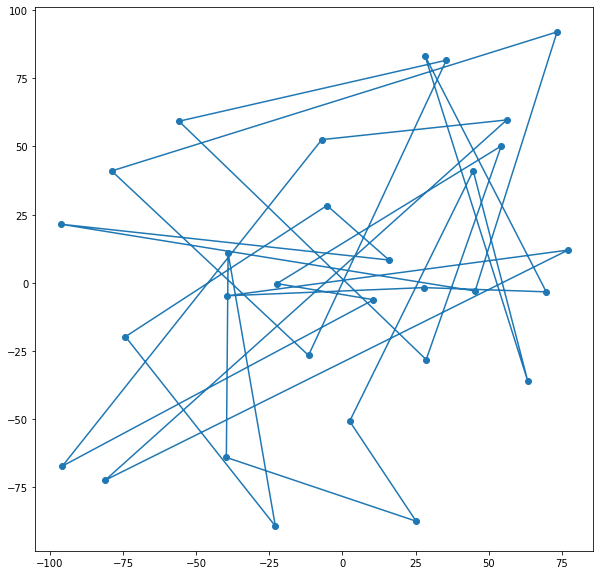

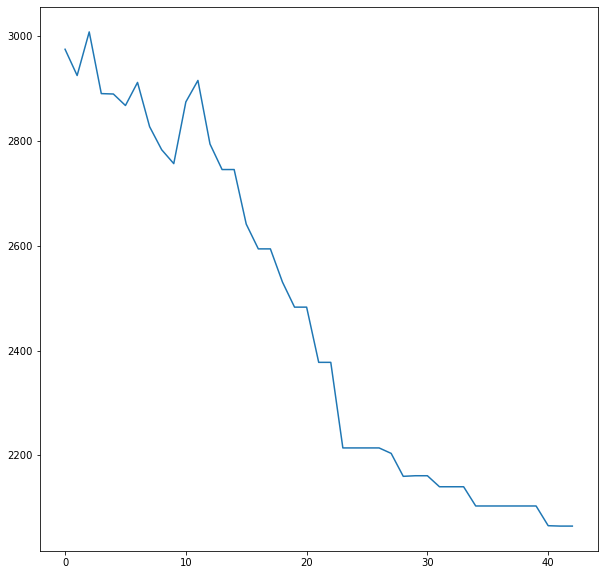

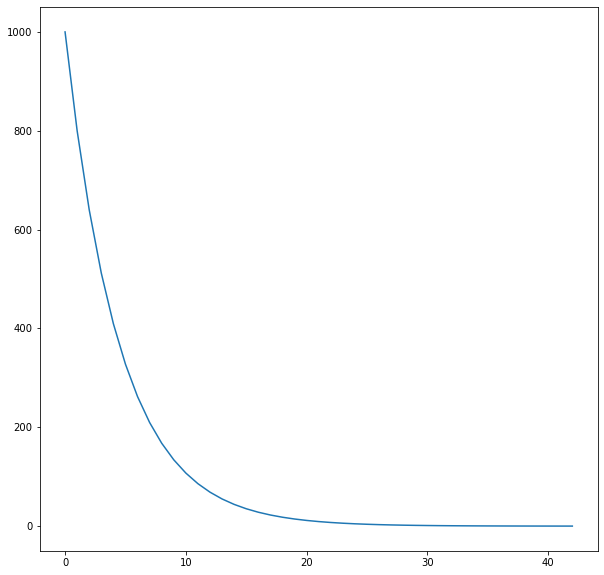

{'mode': 0, 'func': 'x : 0.8*x', 'max': 1000, 'min': 0.1, 'iter': 42}
2065.091532977026
Test parametrów


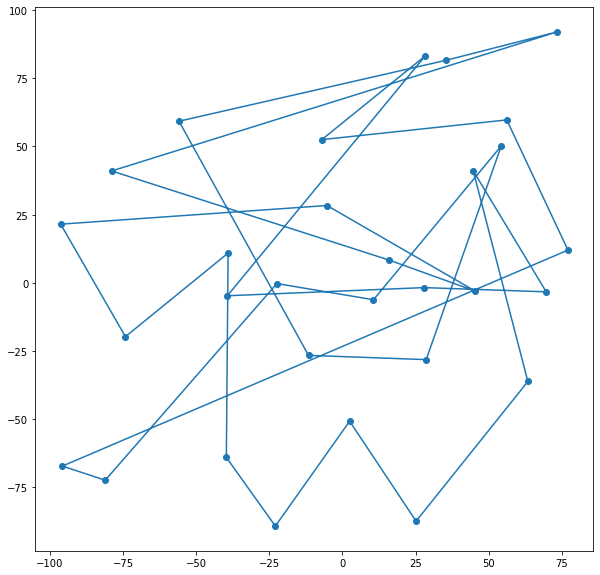

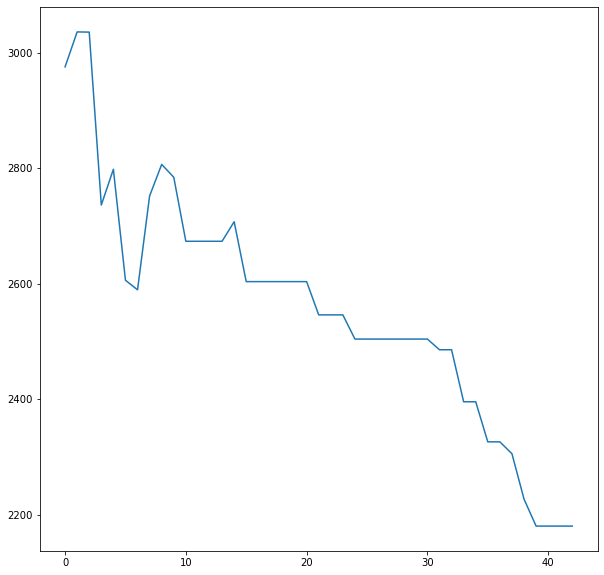

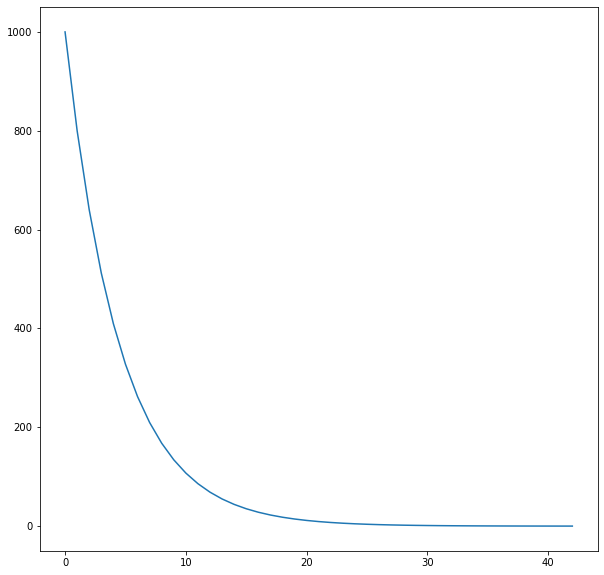

{'mode': 1, 'func': 'x : 0.8*x', 'max': 1000, 'min': 0.1, 'iter': 42}
2180.1545509972284
Test parametrów


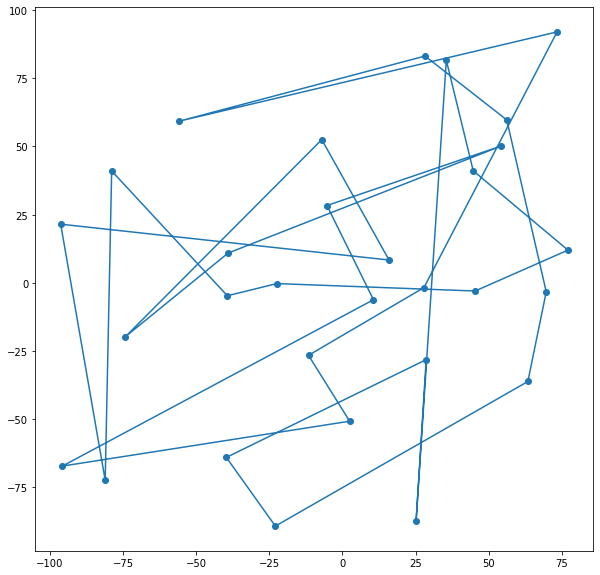

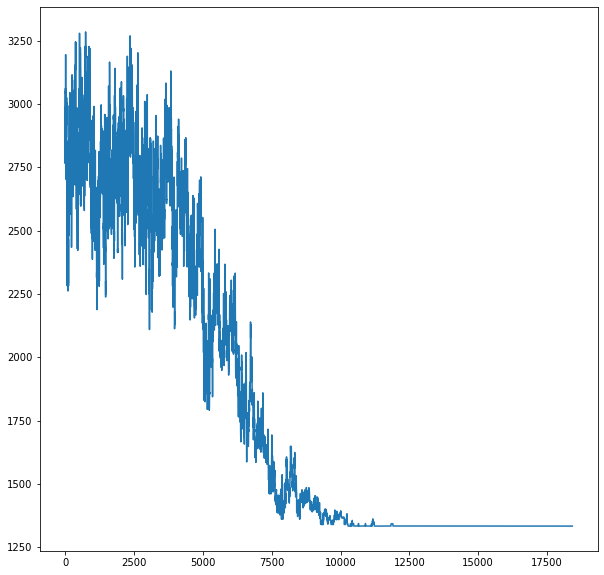

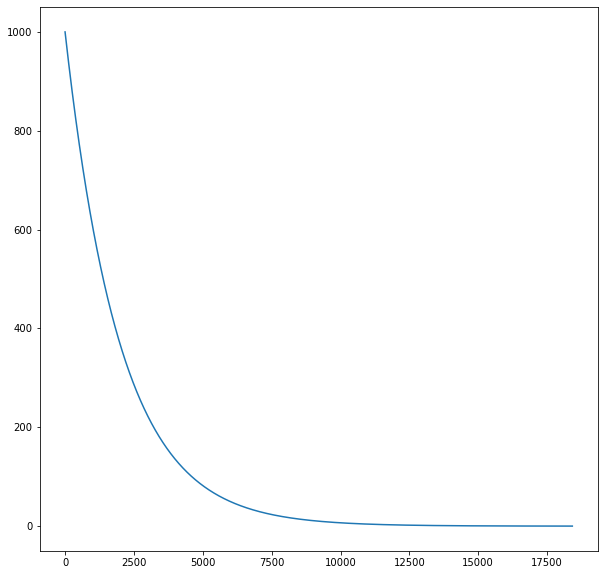

{'mode': 0, 'func': 'x : 0.9995*x', 'max': 1000, 'min': 0.1, 'iter': 18417}
1333.3423519721096
Test parametrów


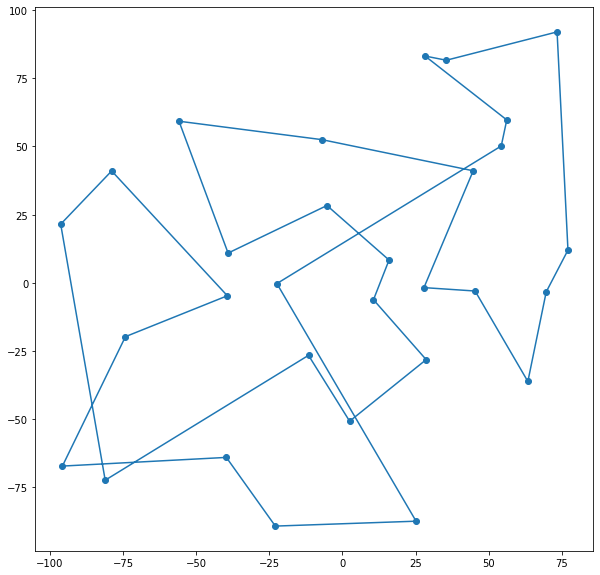

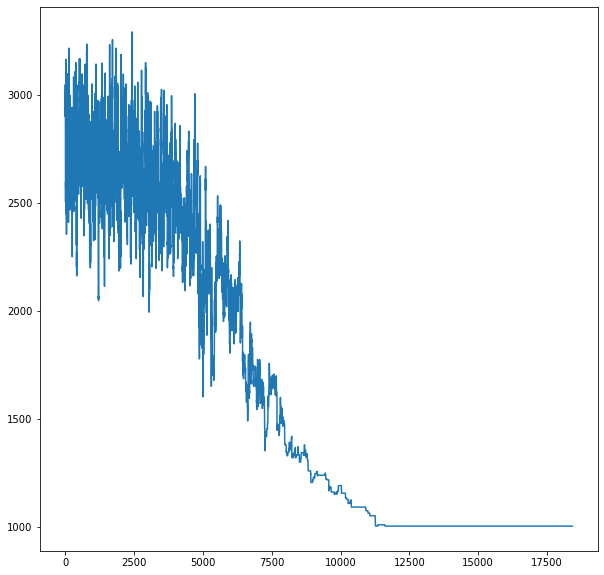

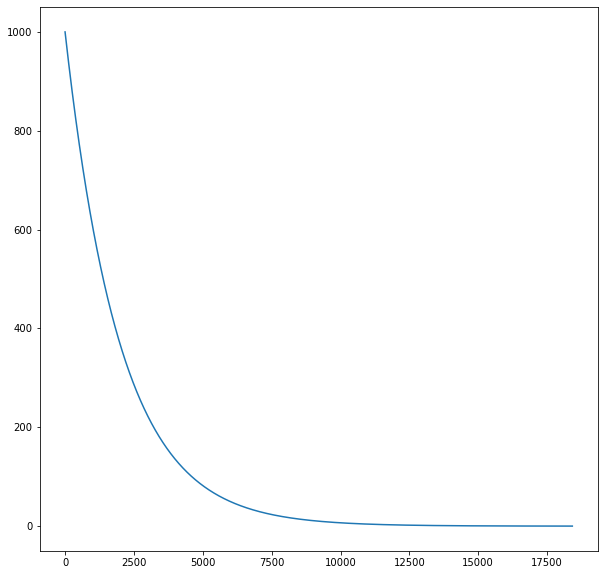

{'mode': 1, 'func': 'x : 0.9995*x', 'max': 1000, 'min': 0.1, 'iter': 18417}
1005.9754171196306
Test parametrów


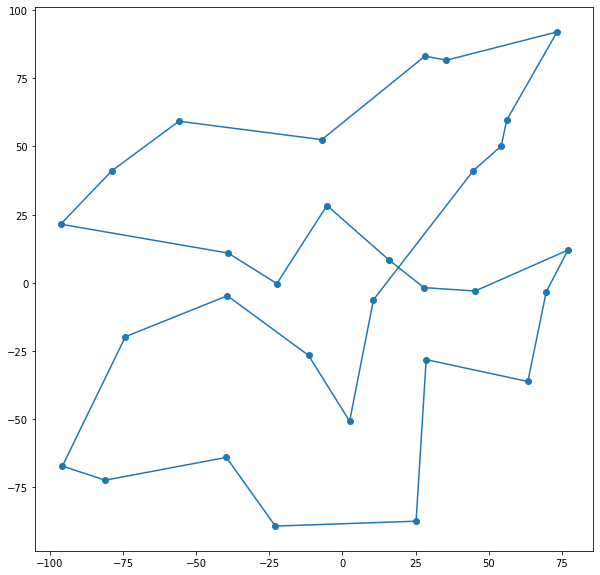

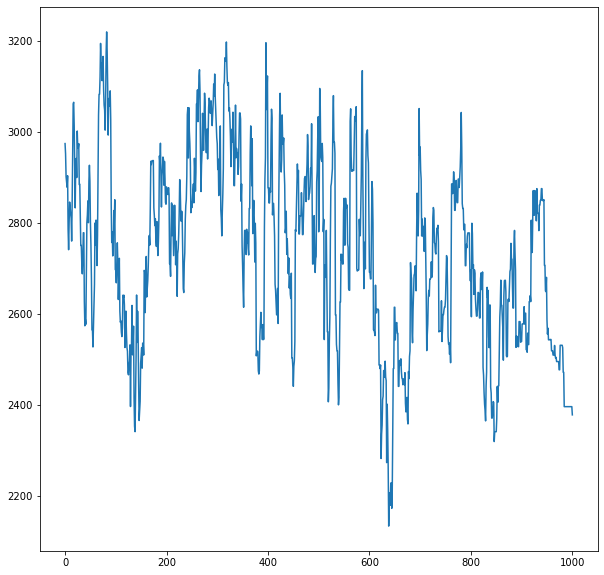

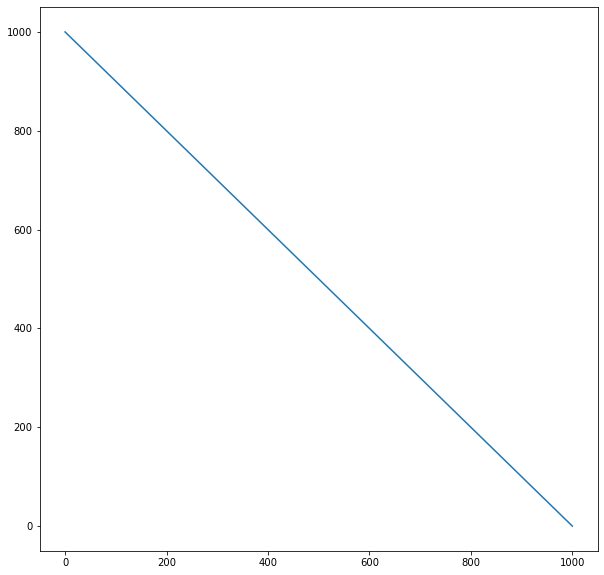

{'mode': 0, 'func': 'x : x - 1', 'max': 1000, 'min': 0.1, 'iter': 1000}
2379.1569433104414
Test parametrów


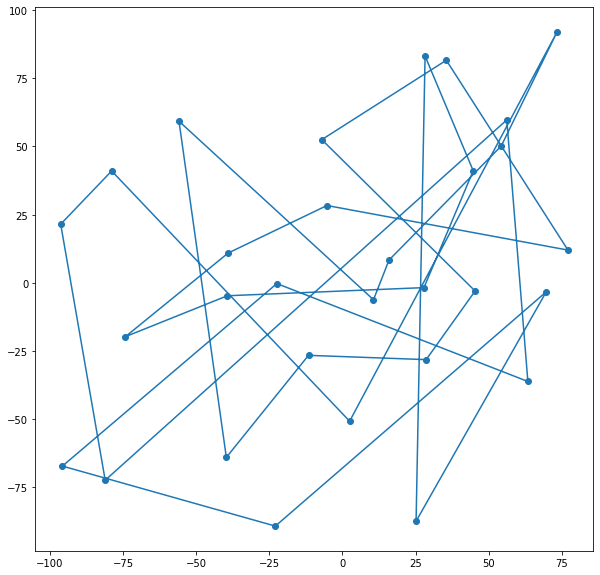

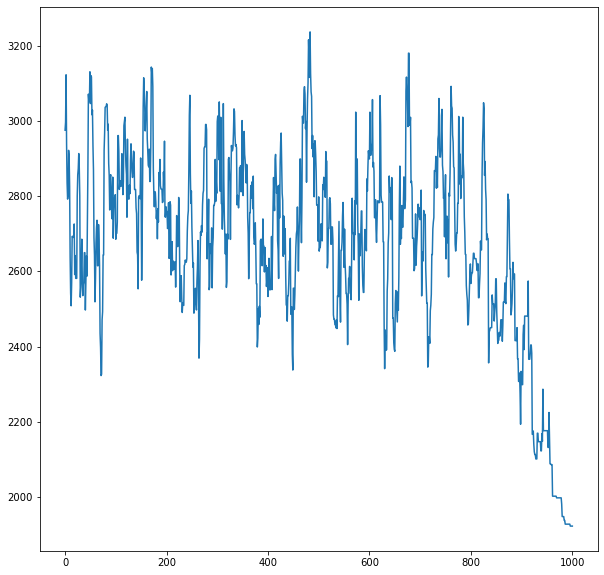

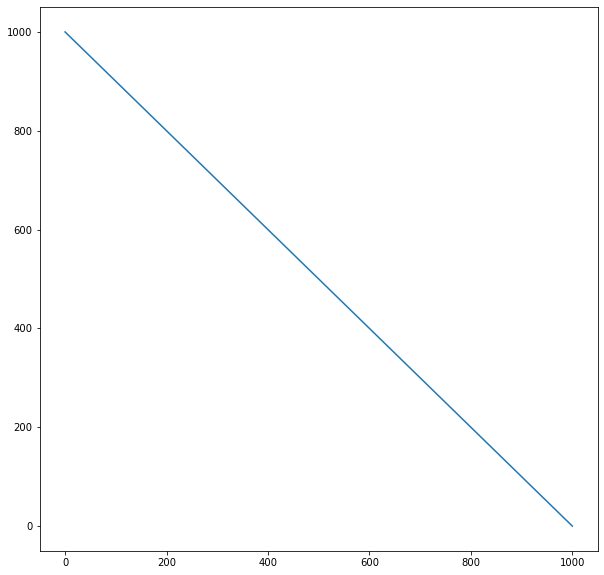

{'mode': 1, 'func': 'x : x - 1', 'max': 1000, 'min': 0.1, 'iter': 1000}
1922.6233439971488
Test parametrów


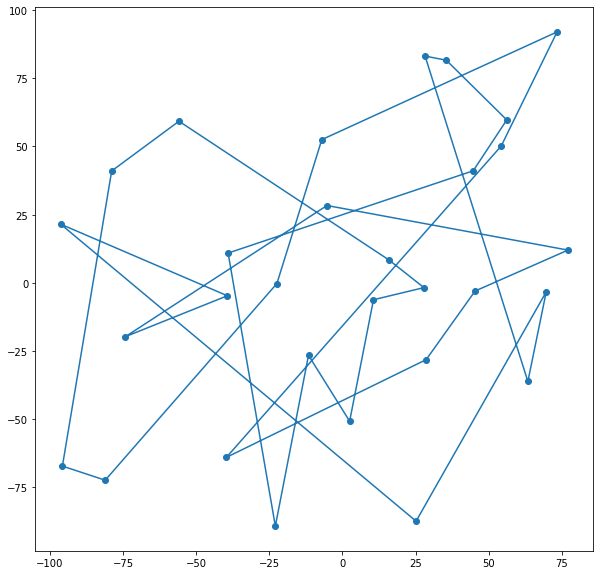

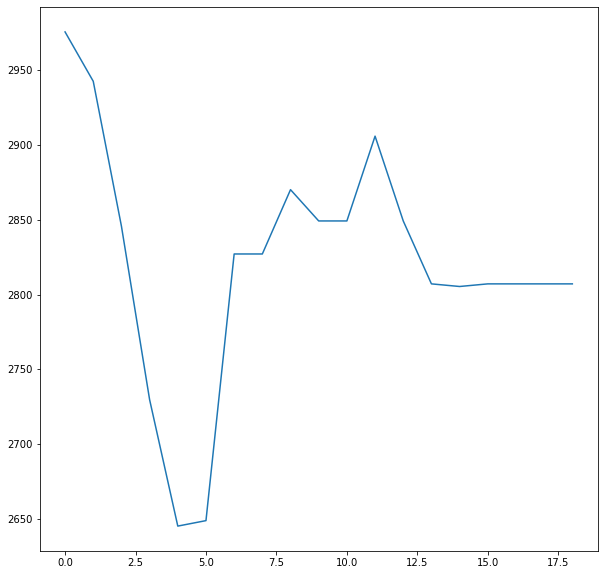

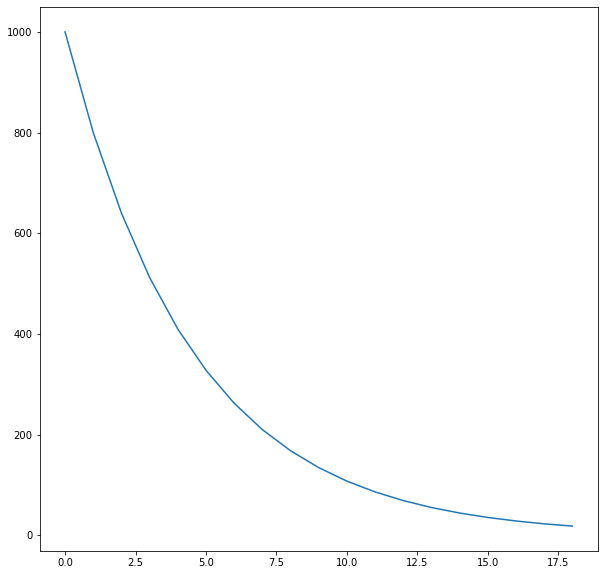

{'mode': 0, 'func': 'x : 0.8*x', 'max': 1000, 'min': 20, 'iter': 18}
2807.1381126940078
Test parametrów


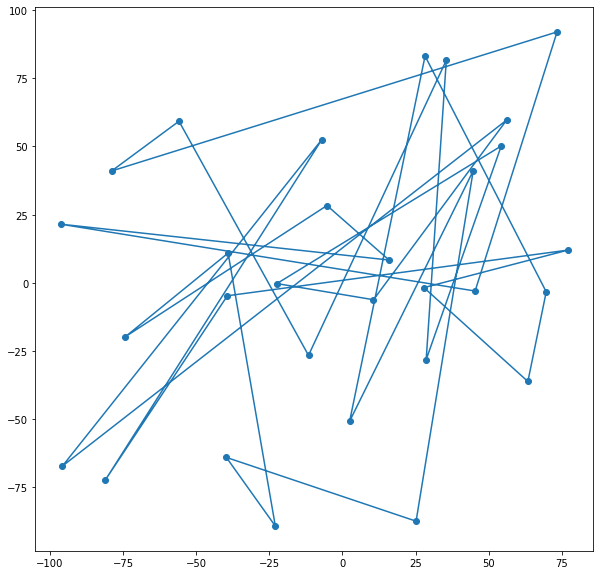

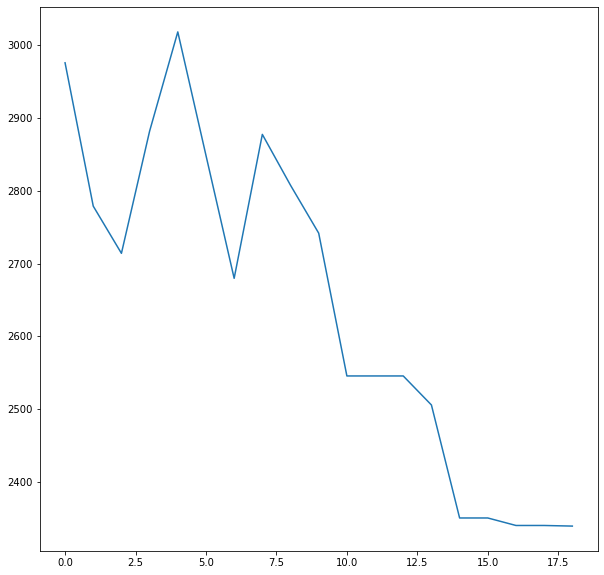

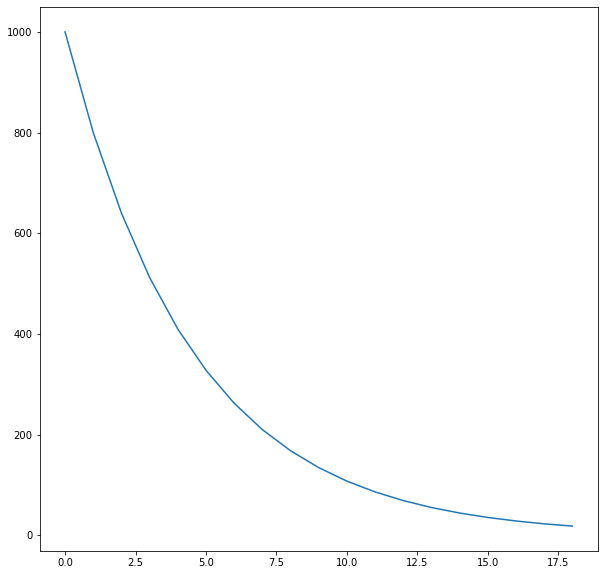

{'mode': 1, 'func': 'x : 0.8*x', 'max': 1000, 'min': 20, 'iter': 18}
2339.5101744184535
Test parametrów


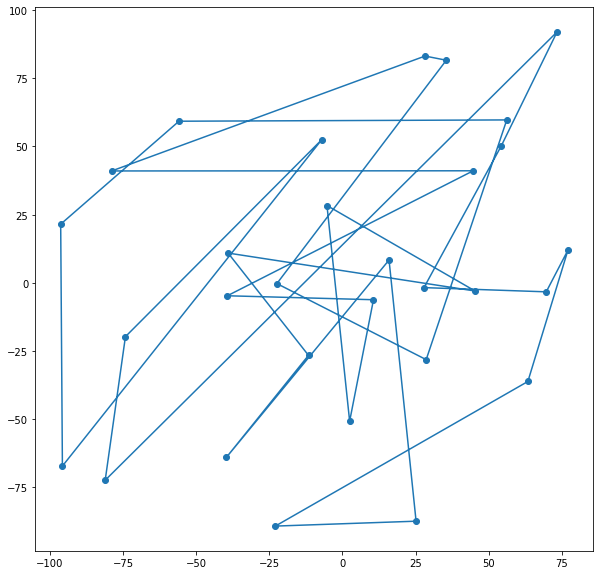

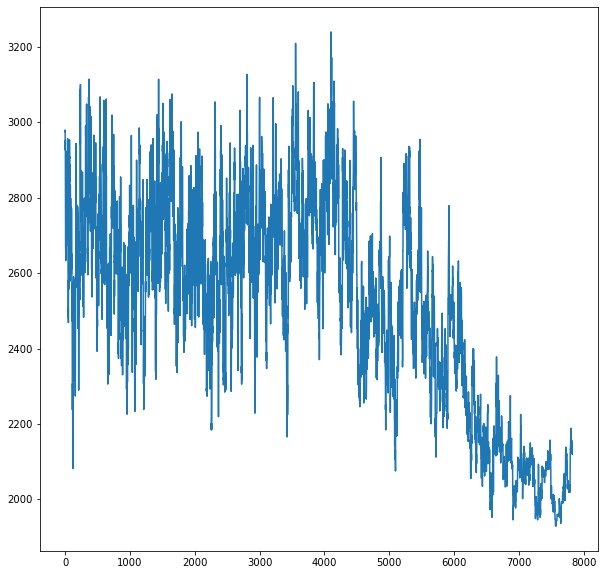

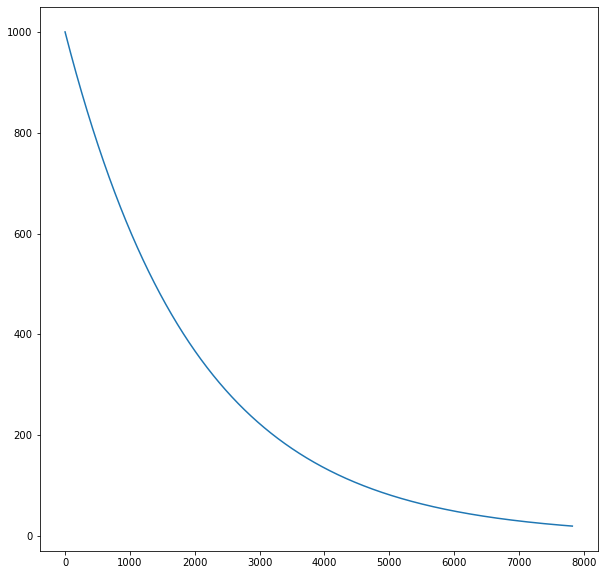

{'mode': 0, 'func': 'x : 0.9995*x', 'max': 1000, 'min': 20, 'iter': 7823}
2122.7685102183846
Test parametrów


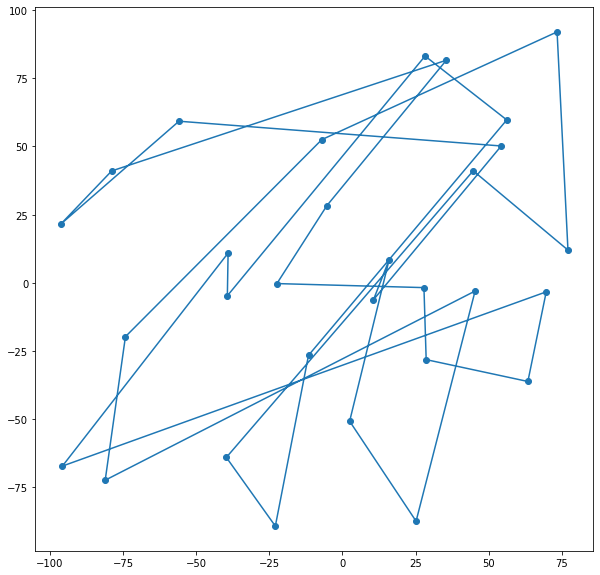

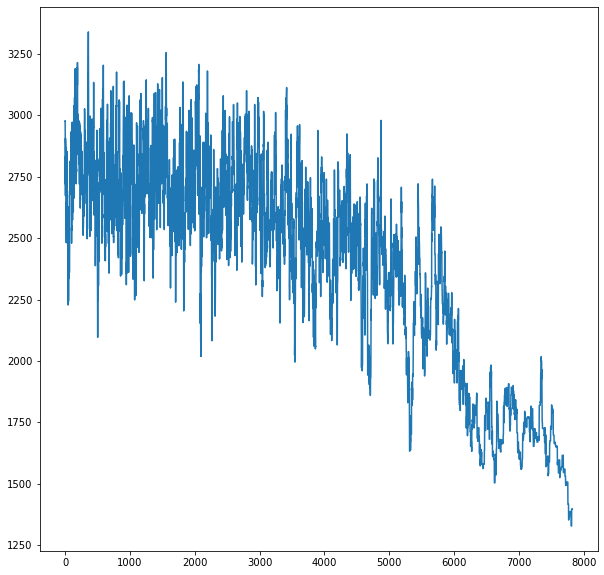

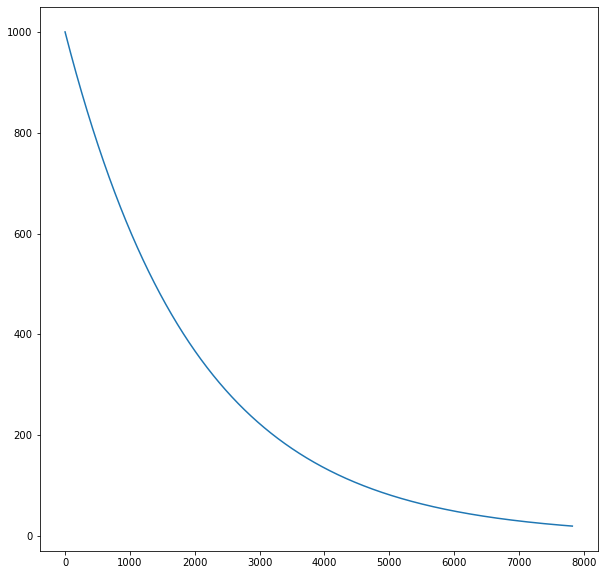

{'mode': 1, 'func': 'x : 0.9995*x', 'max': 1000, 'min': 20, 'iter': 7823}
1398.8204652227873
Test parametrów


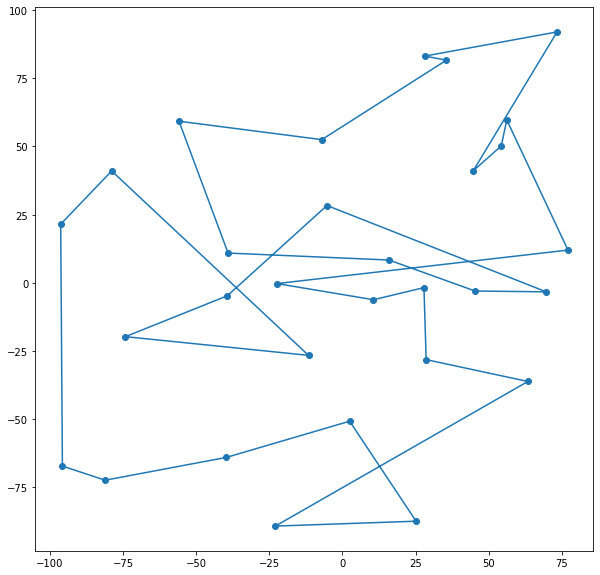

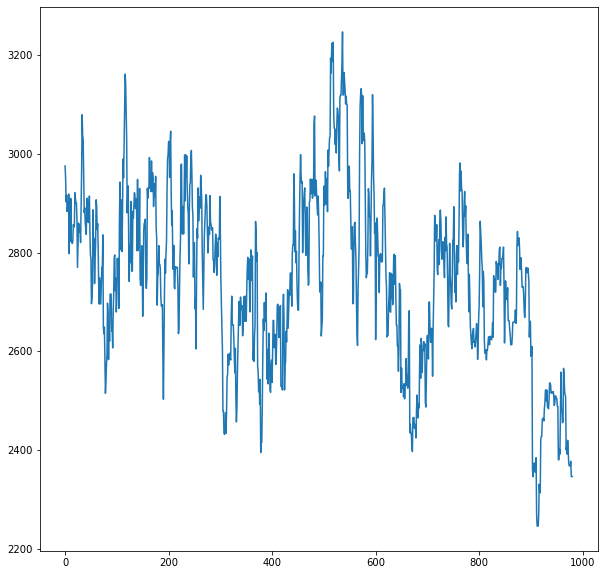

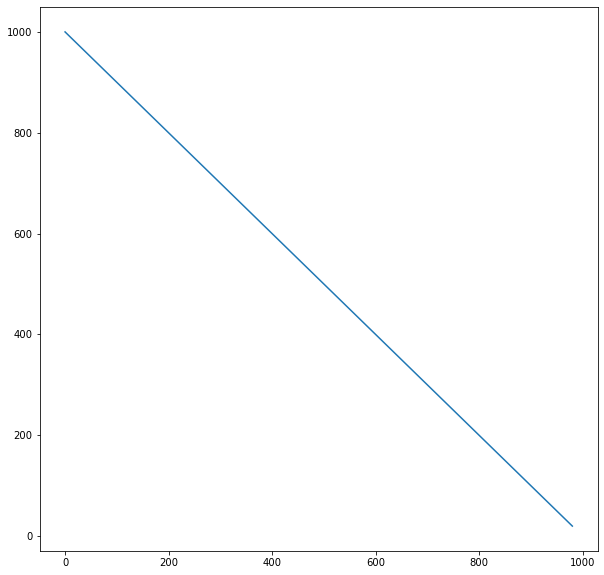

{'mode': 0, 'func': 'x : x - 1', 'max': 1000, 'min': 20, 'iter': 980}
2346.3644657127193
Test parametrów


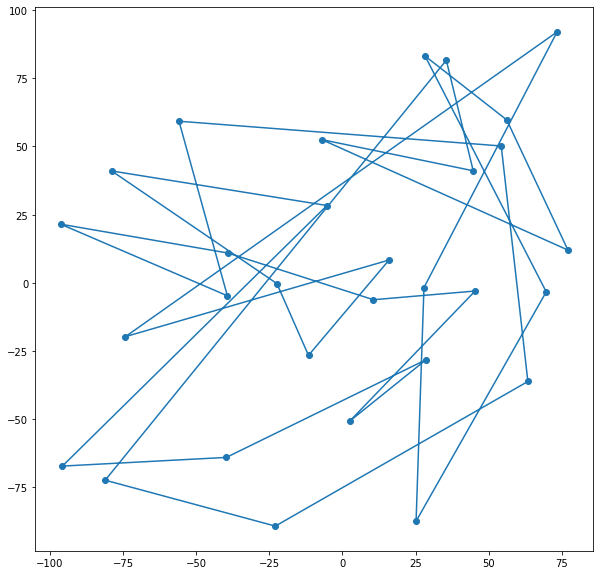

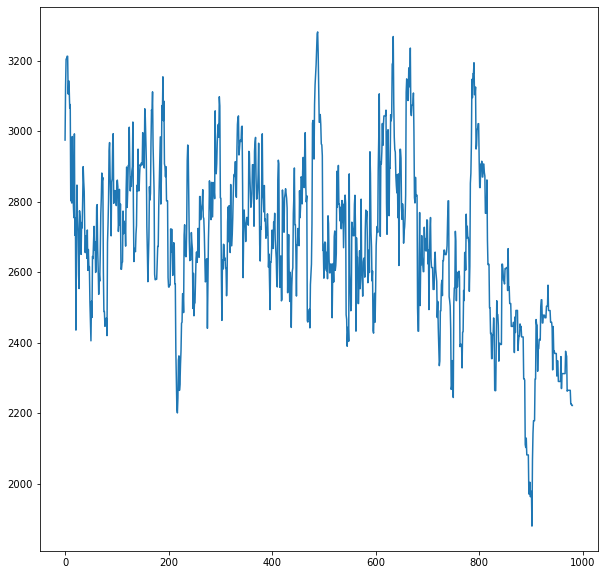

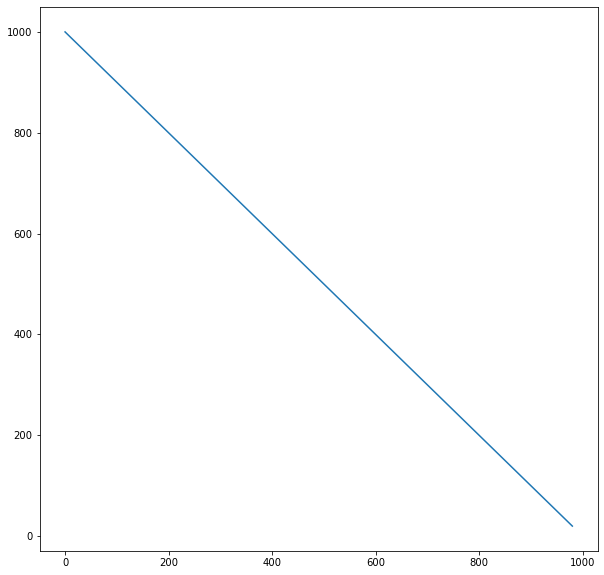

{'mode': 1, 'func': 'x : x - 1', 'max': 1000, 'min': 20, 'iter': 980}
2221.8605870284277
Test parametrów


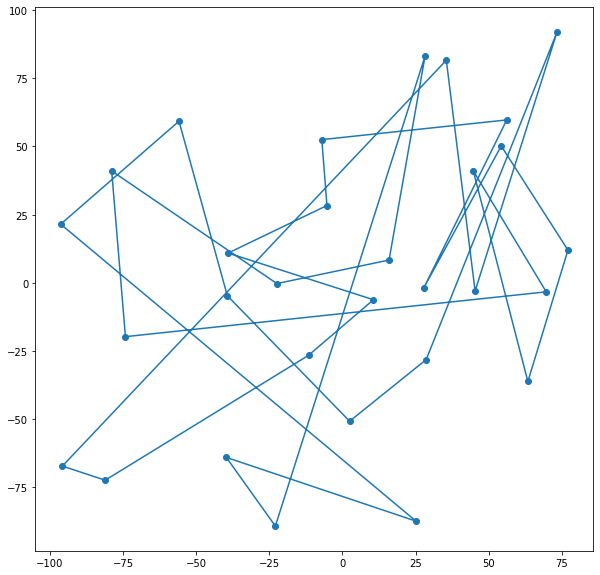

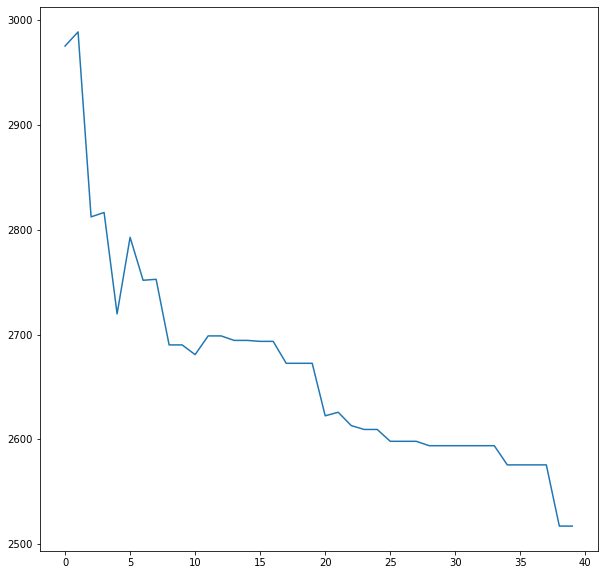

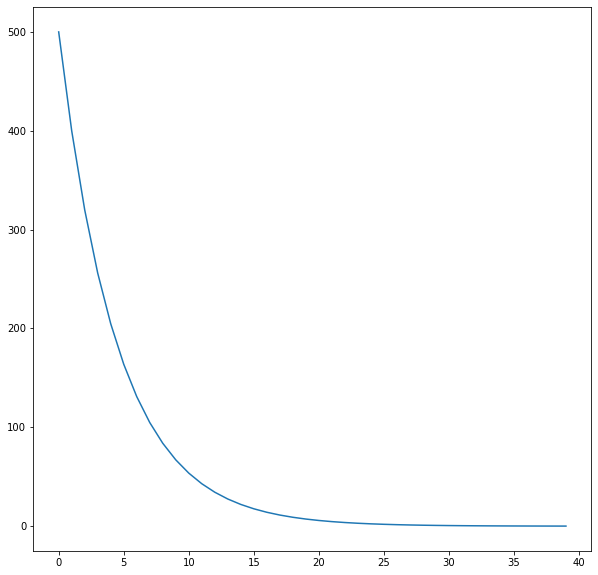

{'mode': 0, 'func': 'x : 0.8*x', 'max': 500, 'min': 0.1, 'iter': 39}
2517.1514094223285
Test parametrów


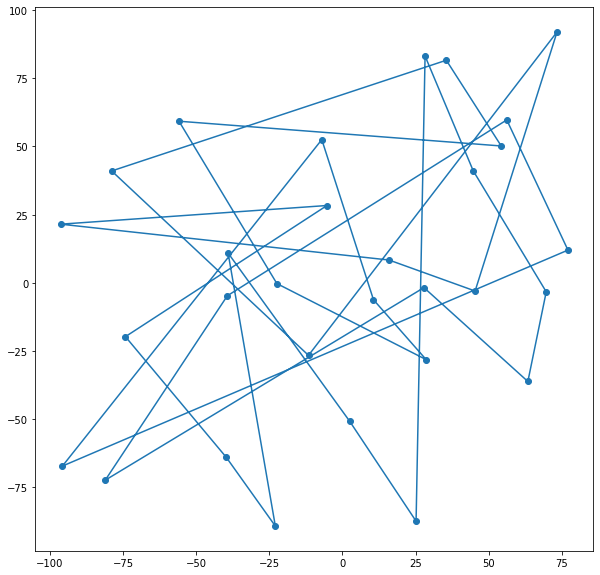

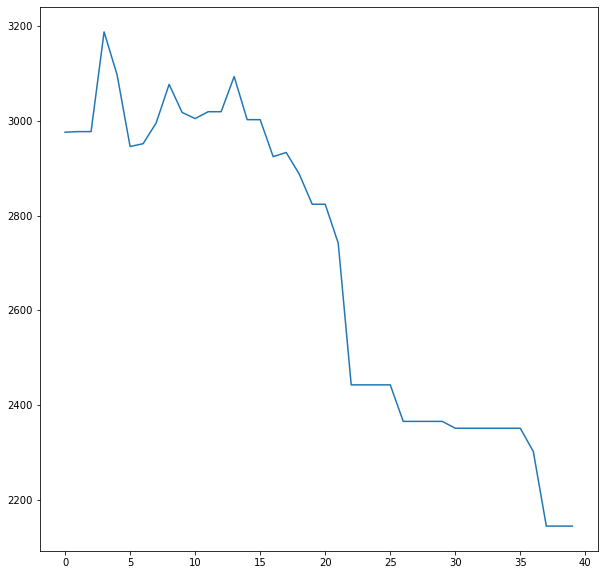

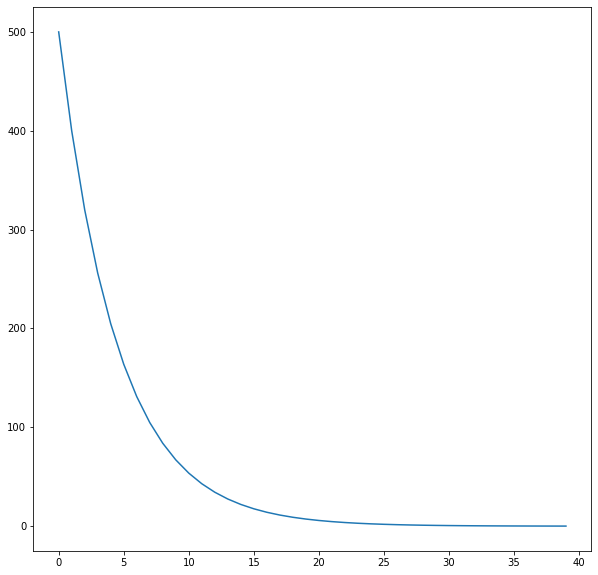

{'mode': 1, 'func': 'x : 0.8*x', 'max': 500, 'min': 0.1, 'iter': 39}
2145.8125356977066
Test parametrów


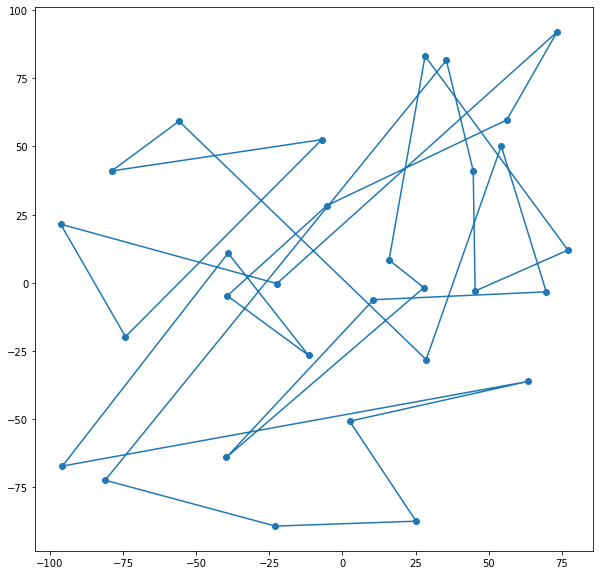

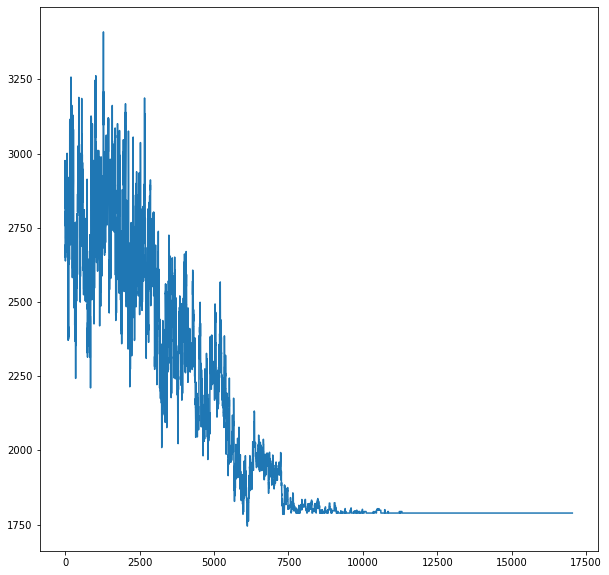

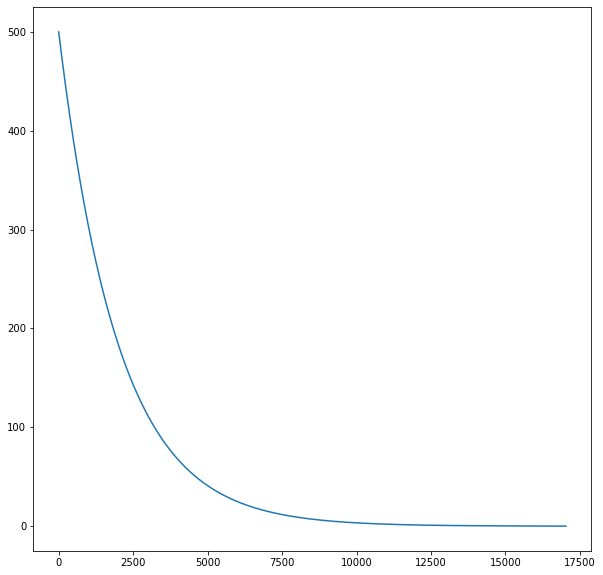

{'mode': 0, 'func': 'x : 0.9995*x', 'max': 500, 'min': 0.1, 'iter': 17031}
1789.1233877401933
Test parametrów


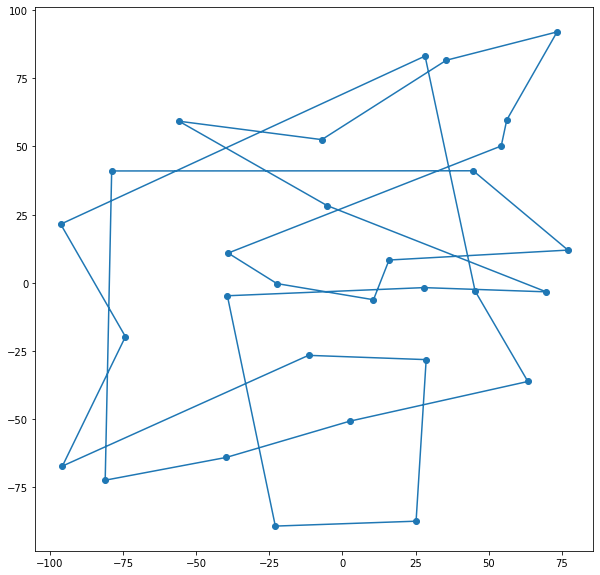

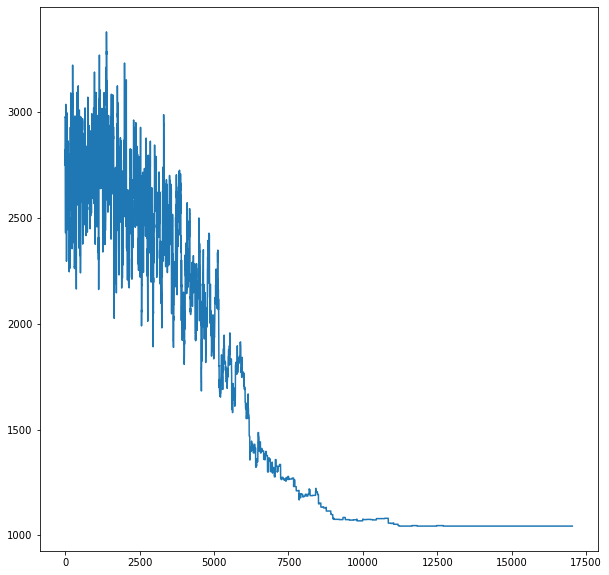

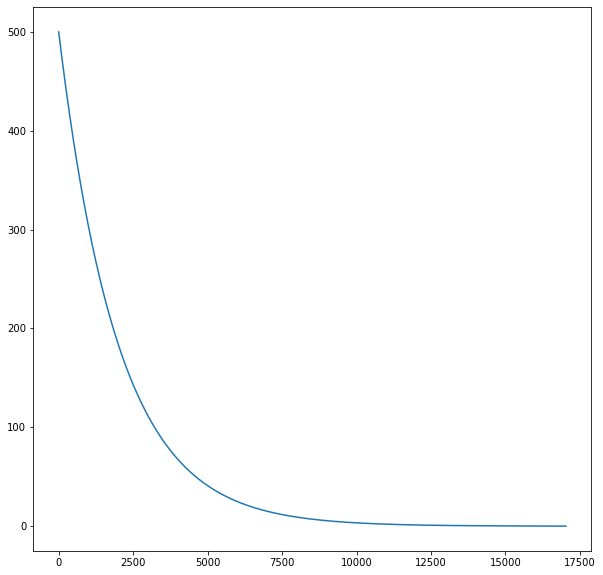

{'mode': 1, 'func': 'x : 0.9995*x', 'max': 500, 'min': 0.1, 'iter': 17031}
1044.30391735948
Test parametrów


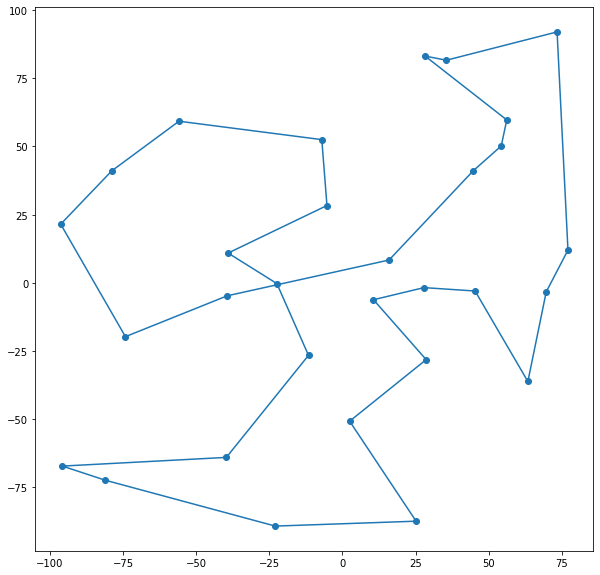

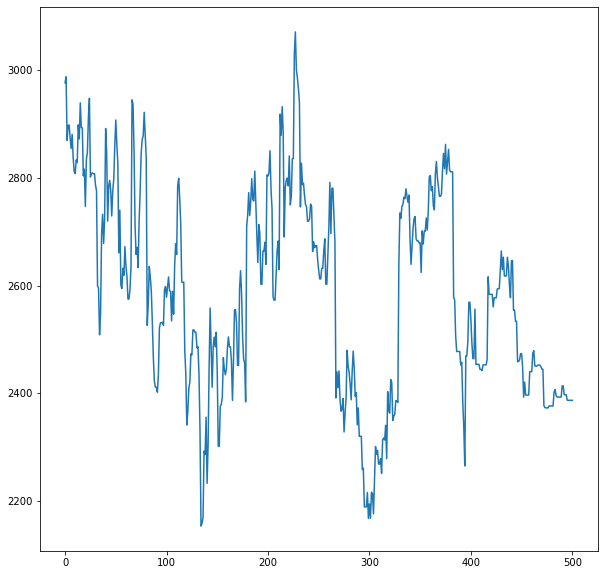

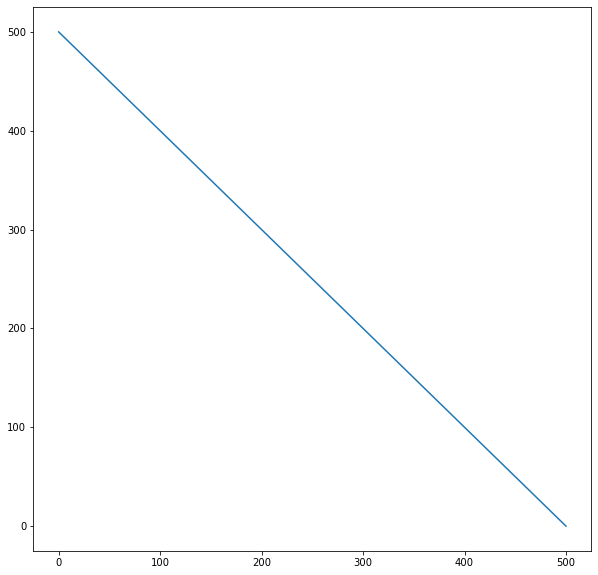

{'mode': 0, 'func': 'x : x - 1', 'max': 500, 'min': 0.1, 'iter': 500}
2387.336730444717
Test parametrów


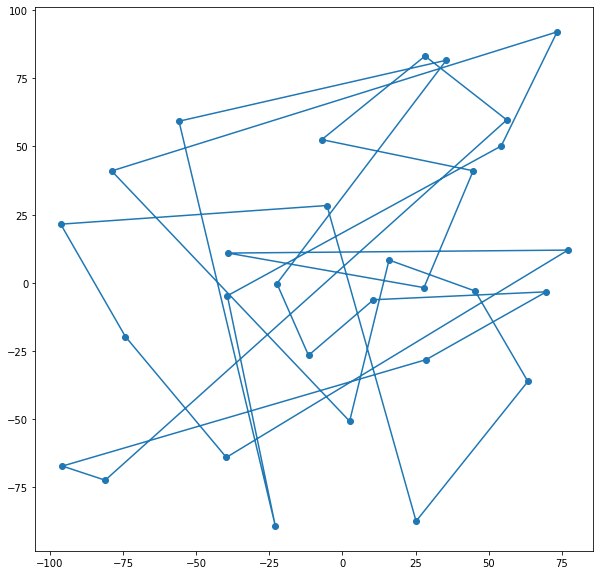

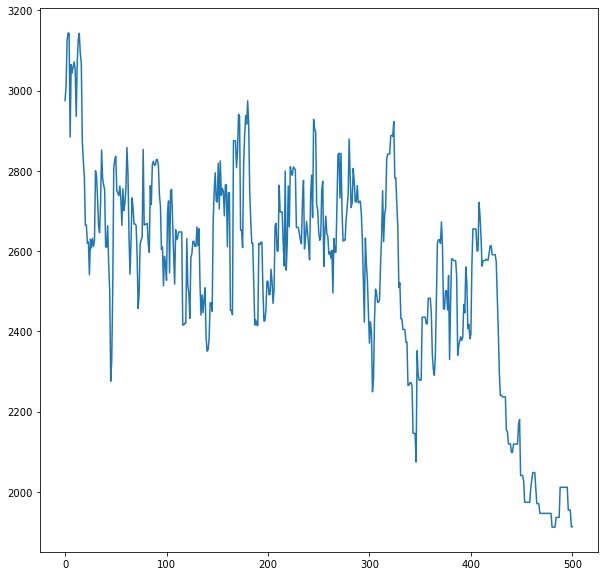

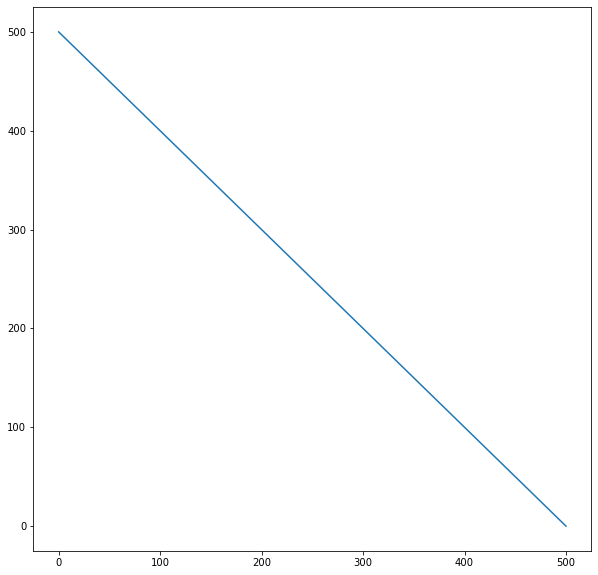

{'mode': 1, 'func': 'x : x - 1', 'max': 500, 'min': 0.1, 'iter': 500}
1913.2093837368122
Test parametrów


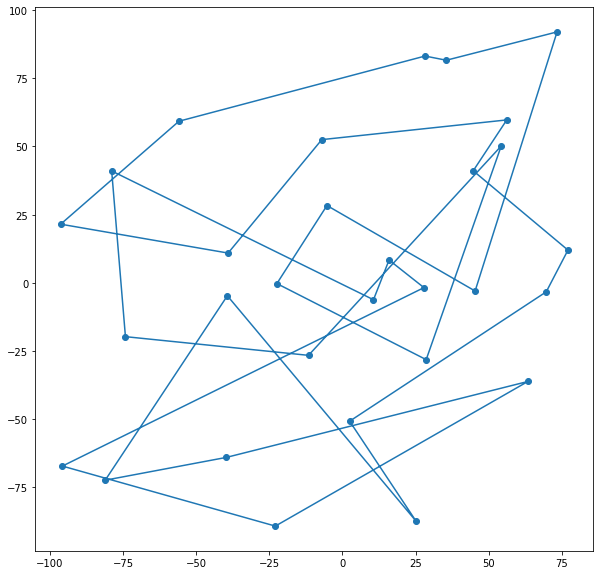

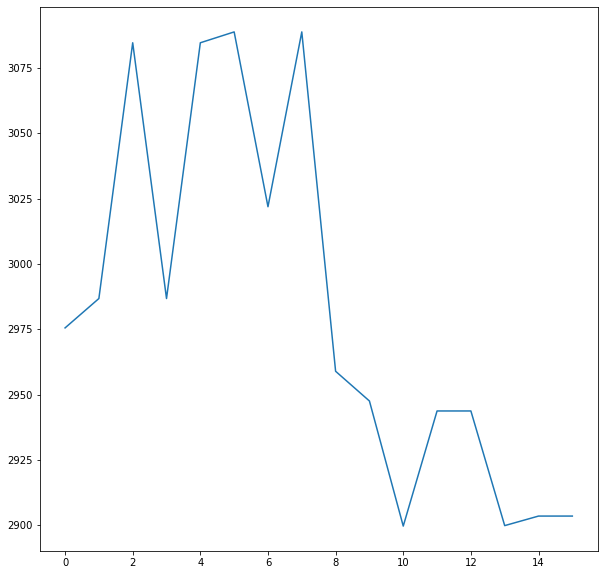

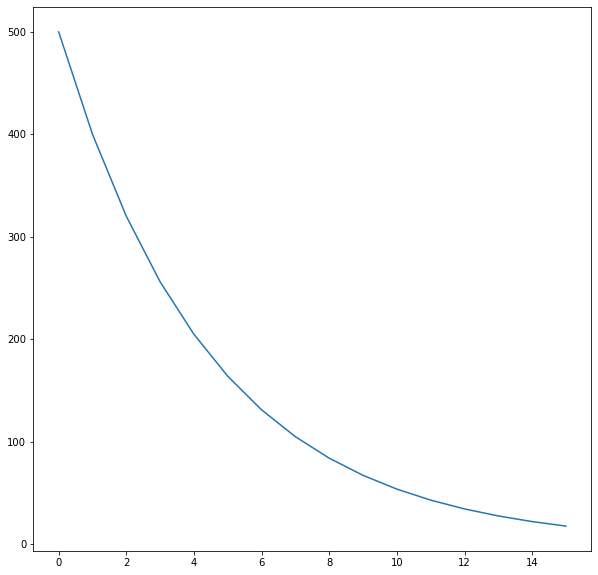

{'mode': 0, 'func': 'x : 0.8*x', 'max': 500, 'min': 20, 'iter': 15}
2903.5356215765505
Test parametrów


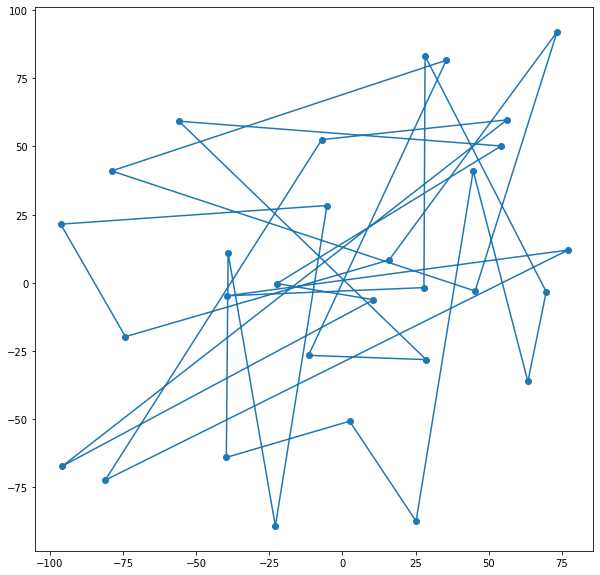

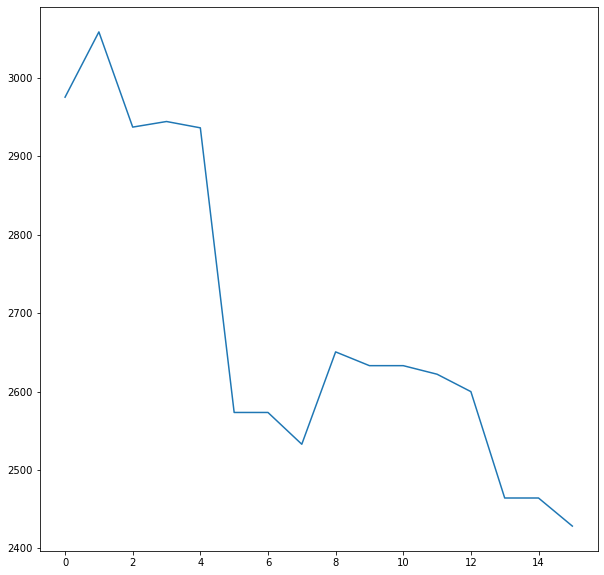

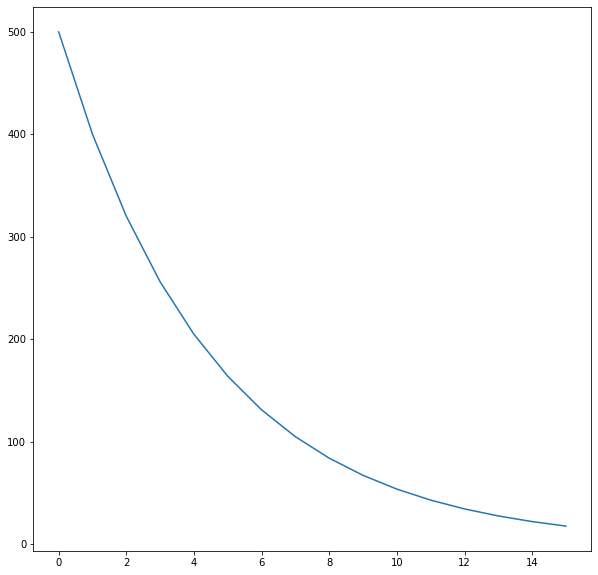

{'mode': 1, 'func': 'x : 0.8*x', 'max': 500, 'min': 20, 'iter': 15}
2428.443892542608
Test parametrów


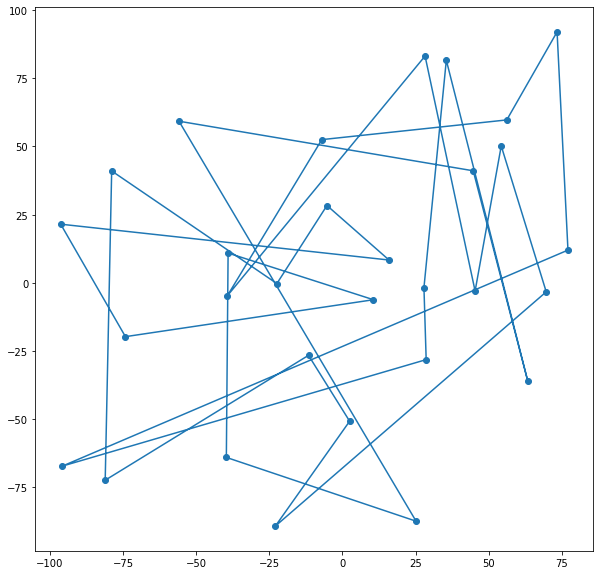

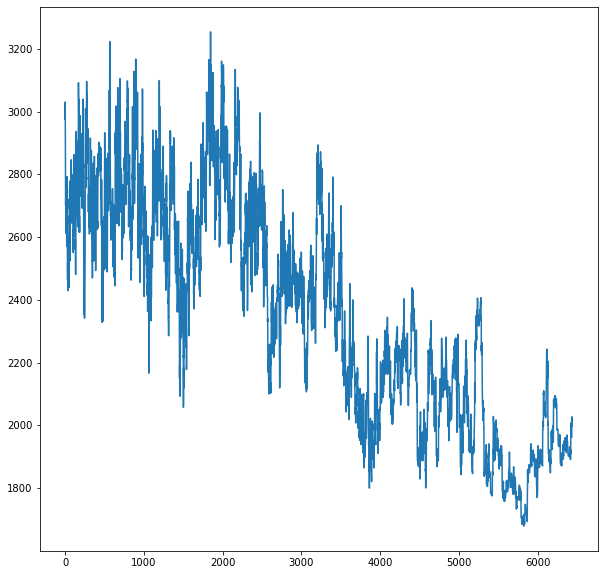

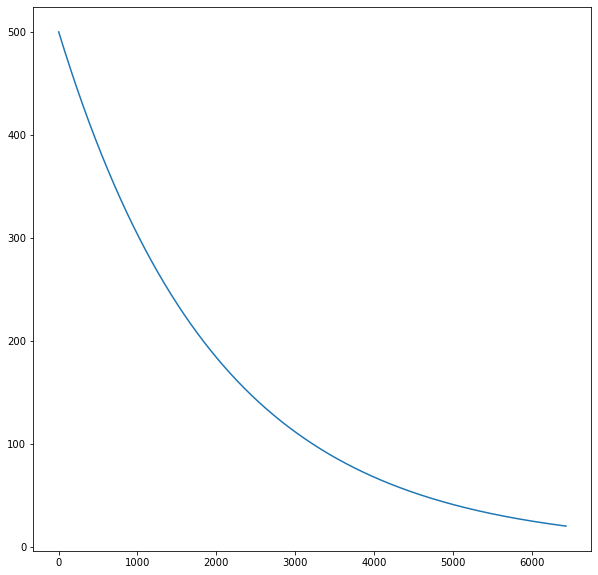

{'mode': 0, 'func': 'x : 0.9995*x', 'max': 500, 'min': 20, 'iter': 6437}
1997.9667957781944
Test parametrów


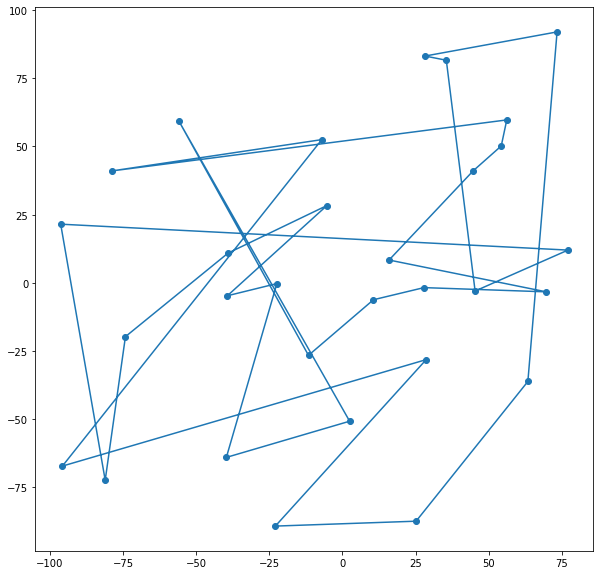

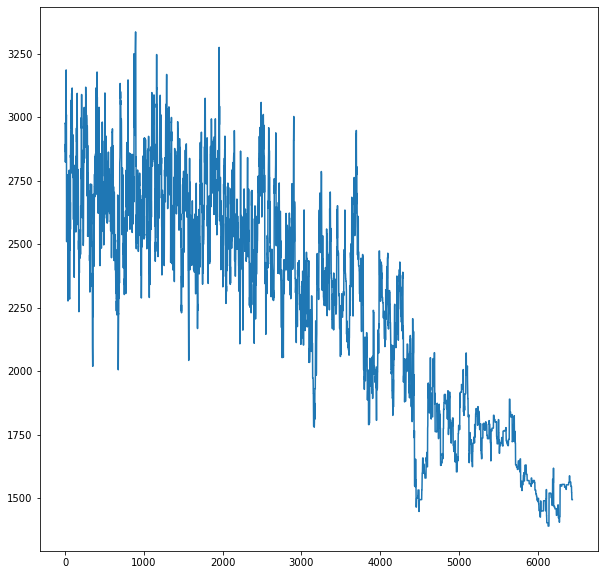

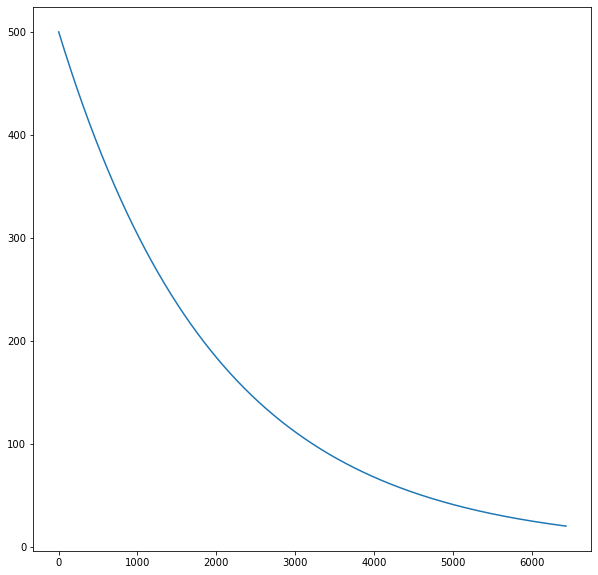

{'mode': 1, 'func': 'x : 0.9995*x', 'max': 500, 'min': 20, 'iter': 6437}
1493.5218573339644
Test parametrów


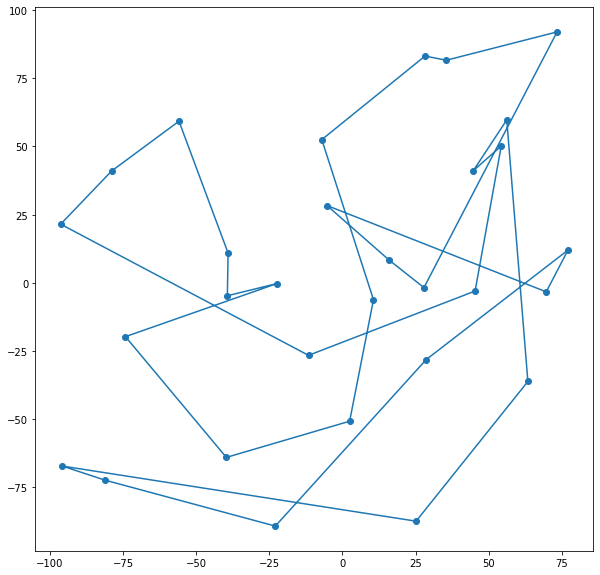

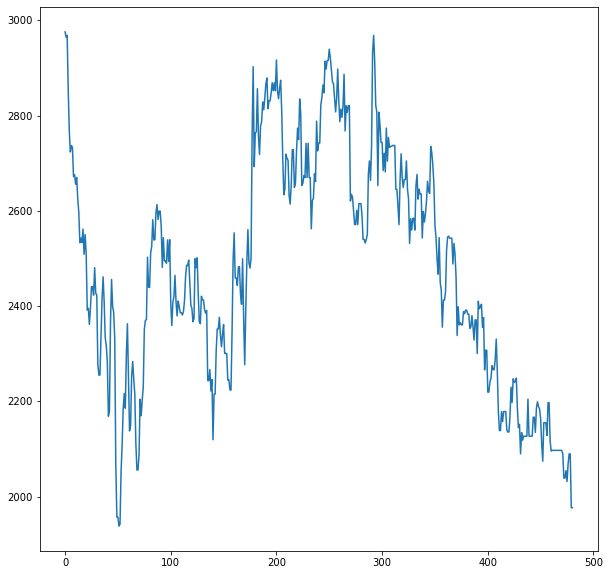

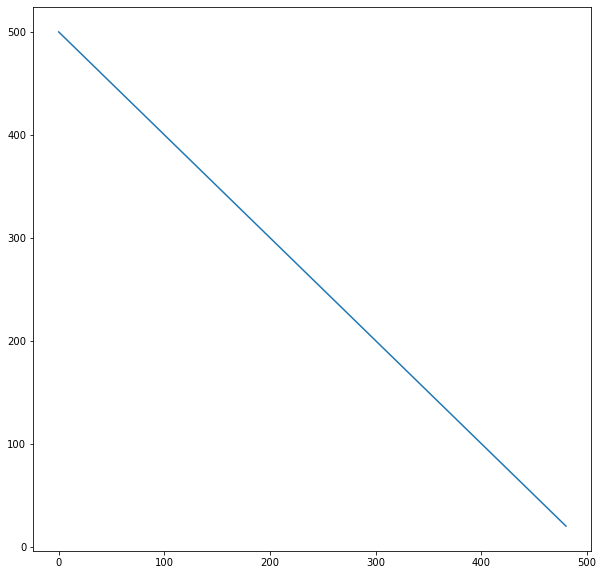

{'mode': 0, 'func': 'x : x - 1', 'max': 500, 'min': 20, 'iter': 480}
1976.7957319917255
Test parametrów


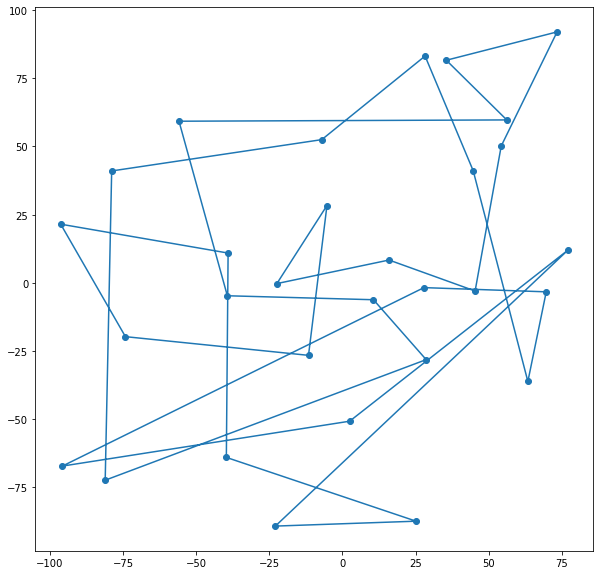

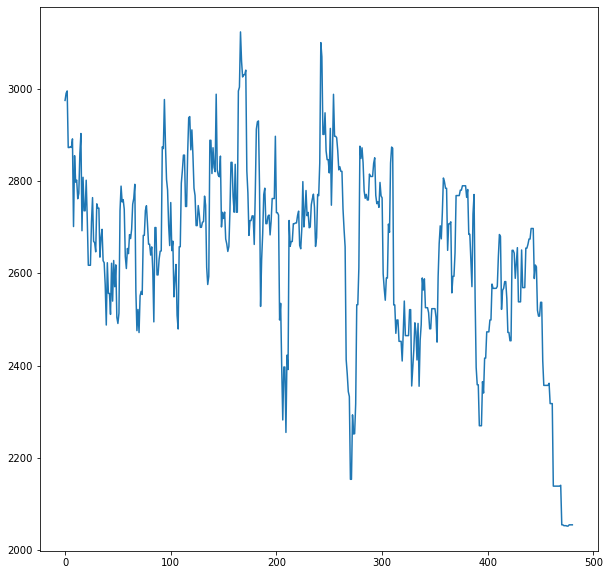

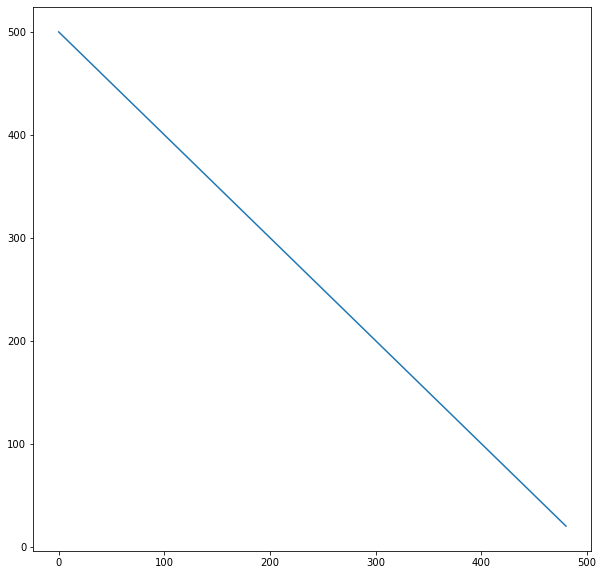

{'mode': 1, 'func': 'x : x - 1', 'max': 500, 'min': 20, 'iter': 480}
2054.1613876240613
Test parametrów


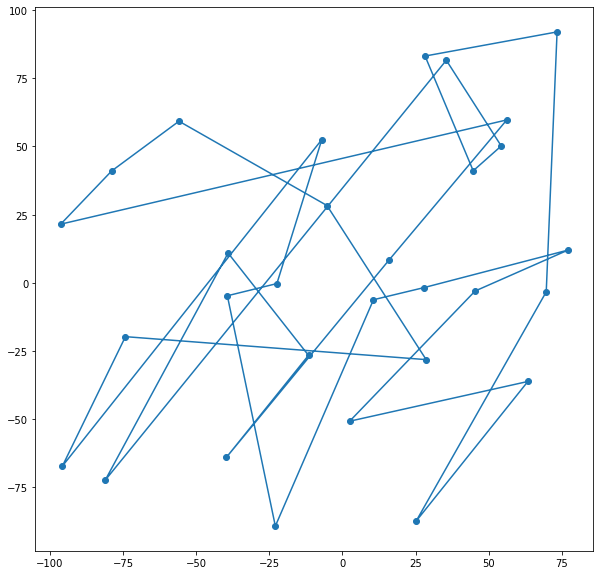

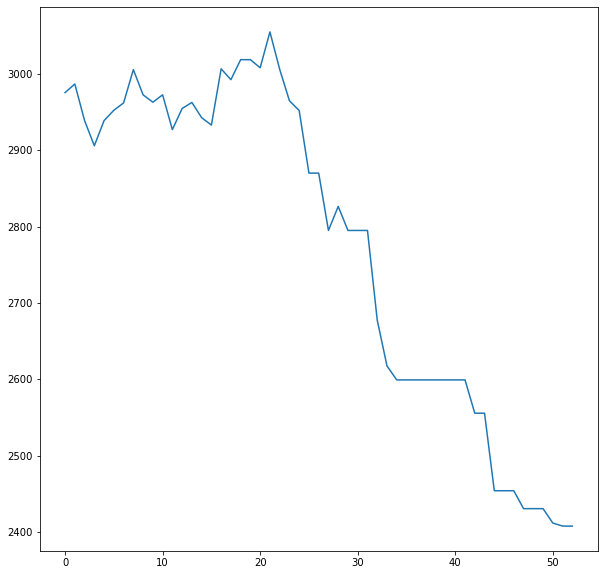

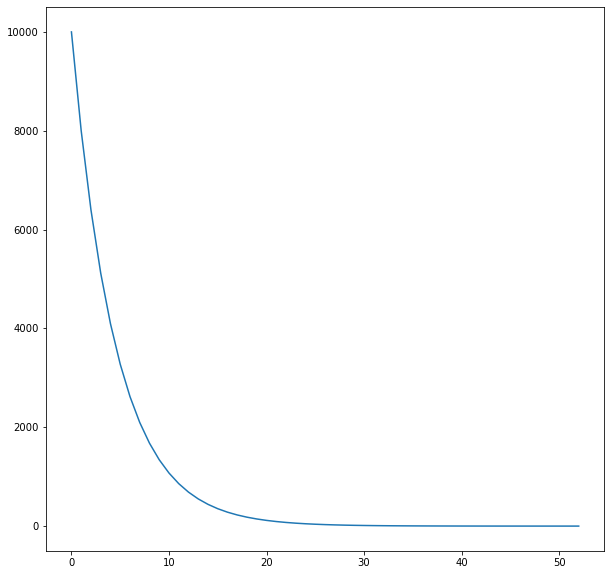

{'mode': 0, 'func': 'x : 0.8*x', 'max': 10000, 'min': 0.1, 'iter': 52}
2407.783725775237
Test parametrów


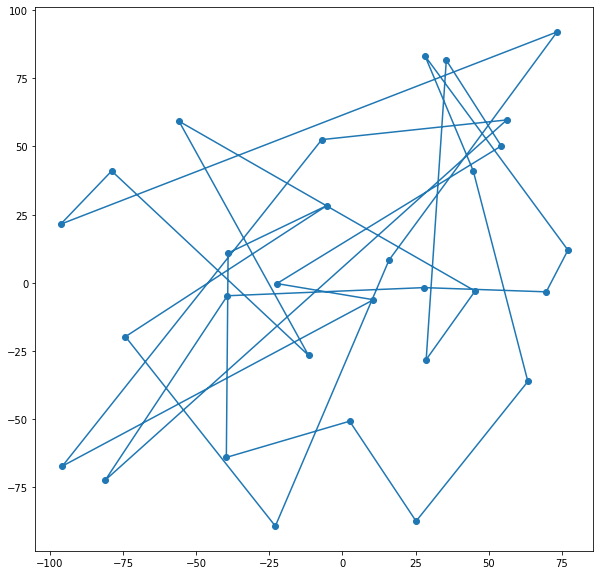

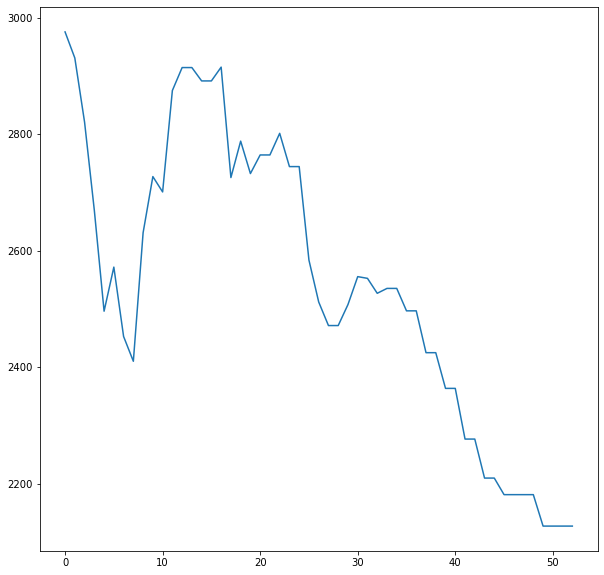

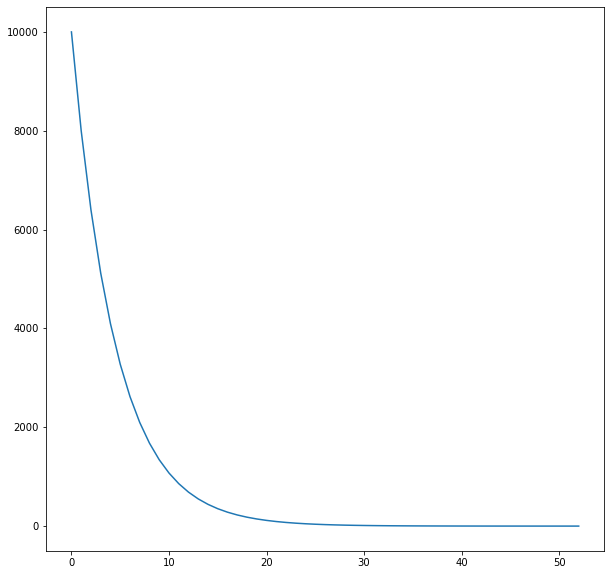

{'mode': 1, 'func': 'x : 0.8*x', 'max': 10000, 'min': 0.1, 'iter': 52}
2127.532121263912
Test parametrów


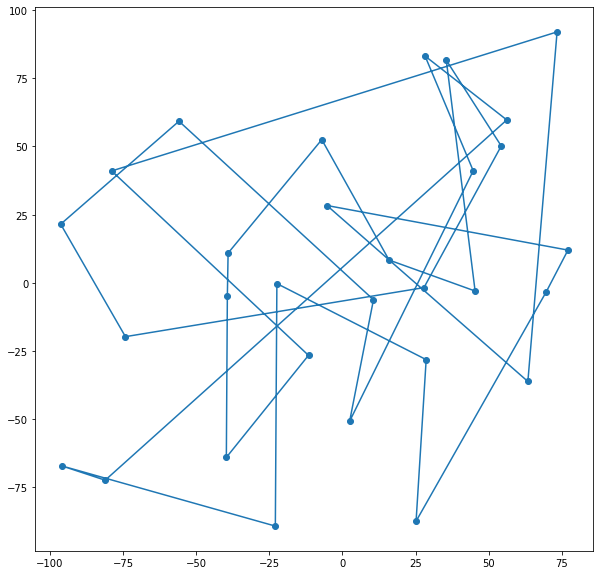

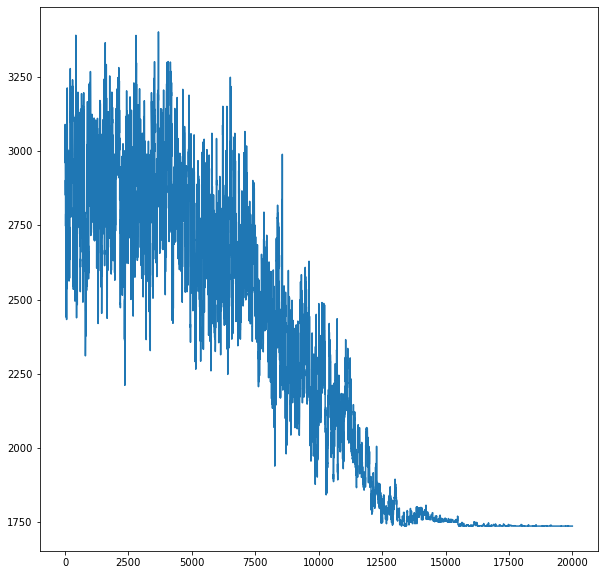

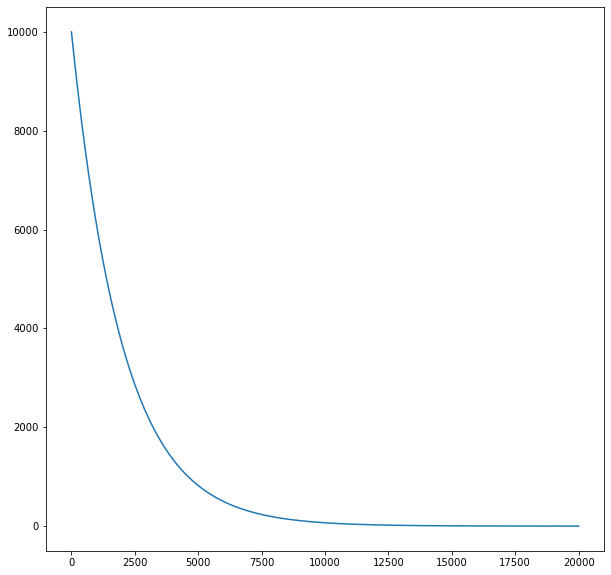

{'mode': 0, 'func': 'x : 0.9995*x', 'max': 10000, 'min': 0.1, 'iter': 20000}
1737.819888532641
Test parametrów


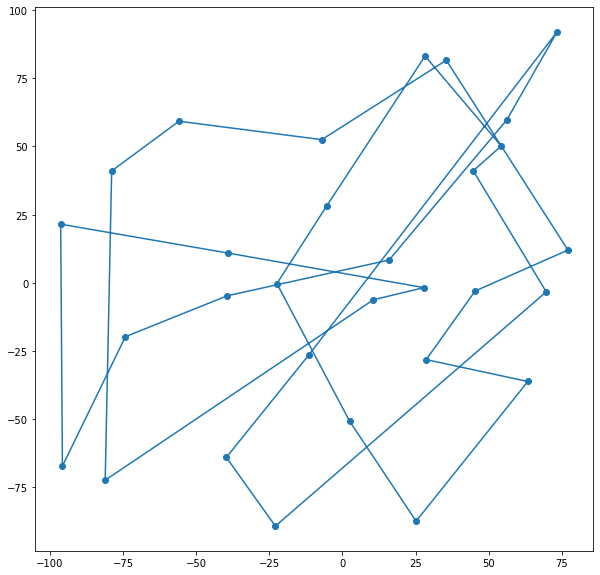

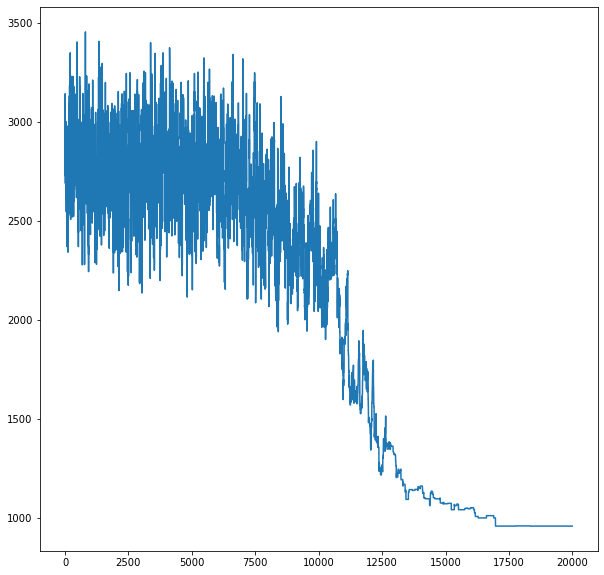

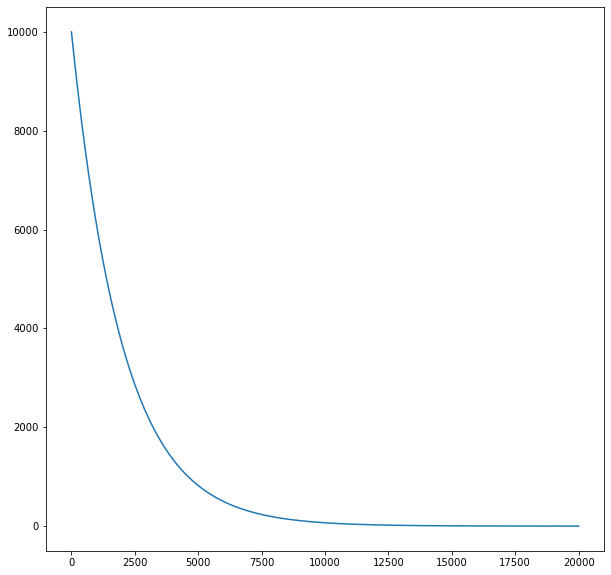

{'mode': 1, 'func': 'x : 0.9995*x', 'max': 10000, 'min': 0.1, 'iter': 20000}
957.5393847615331
Test parametrów


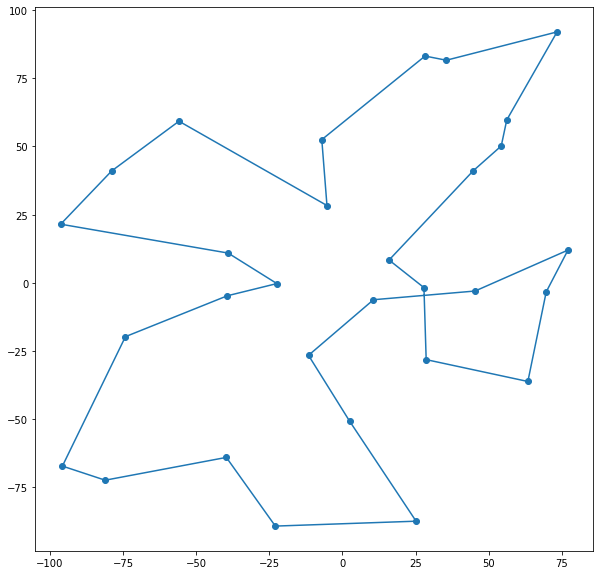

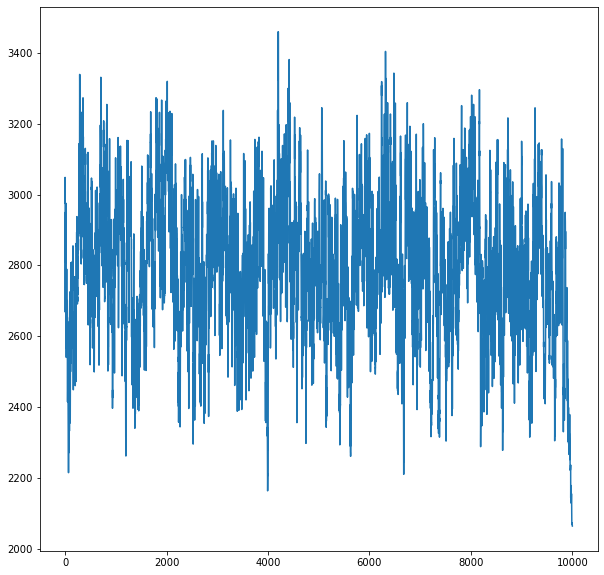

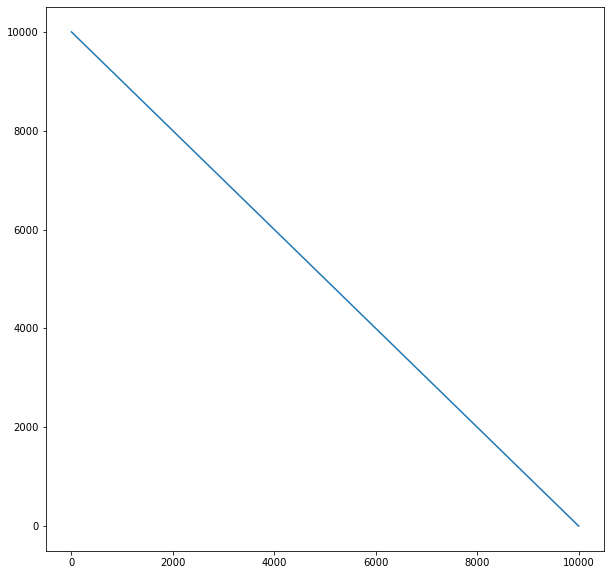

{'mode': 0, 'func': 'x : x - 1', 'max': 10000, 'min': 0.1, 'iter': 10000}
2063.9754352122745
Test parametrów


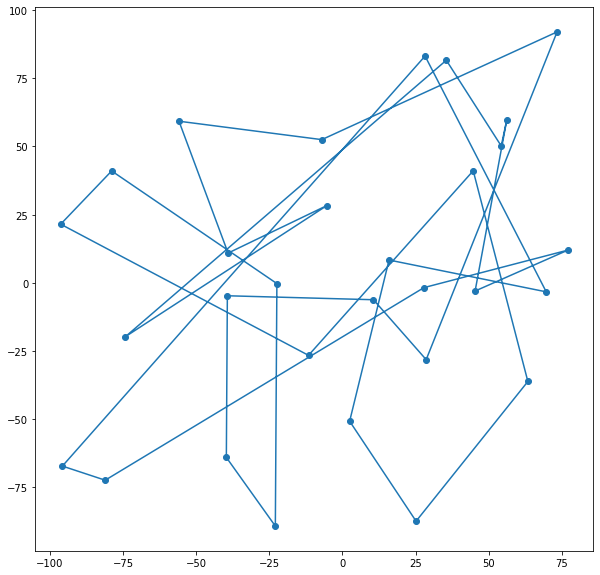

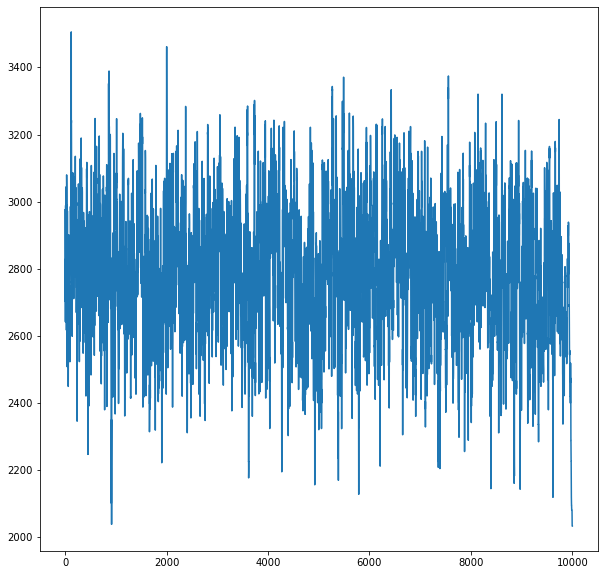

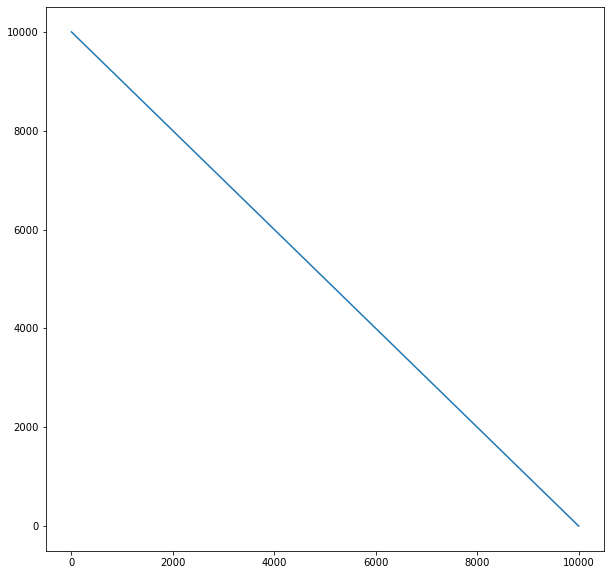

{'mode': 1, 'func': 'x : x - 1', 'max': 10000, 'min': 0.1, 'iter': 10000}
2032.0241221722813
Test parametrów


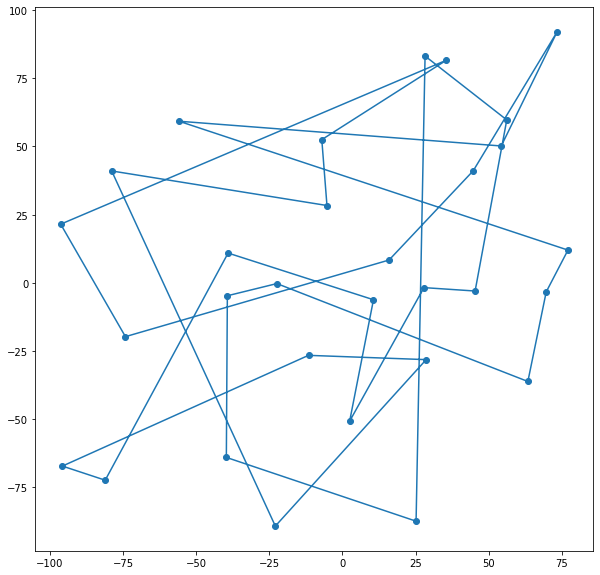

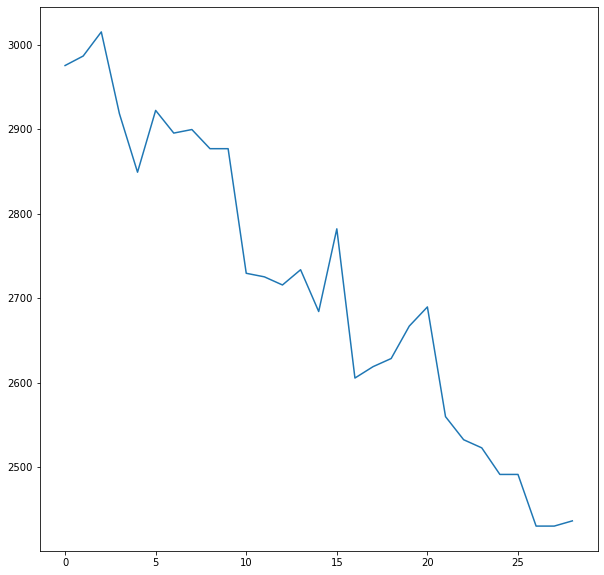

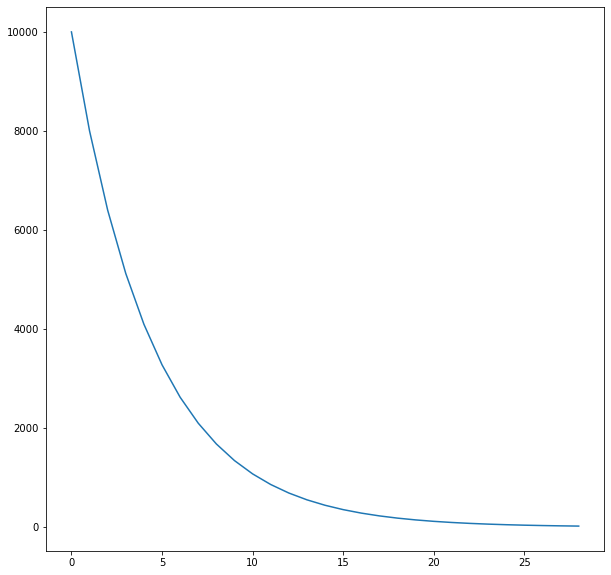

{'mode': 0, 'func': 'x : 0.8*x', 'max': 10000, 'min': 20, 'iter': 28}
2436.6103871981
Test parametrów


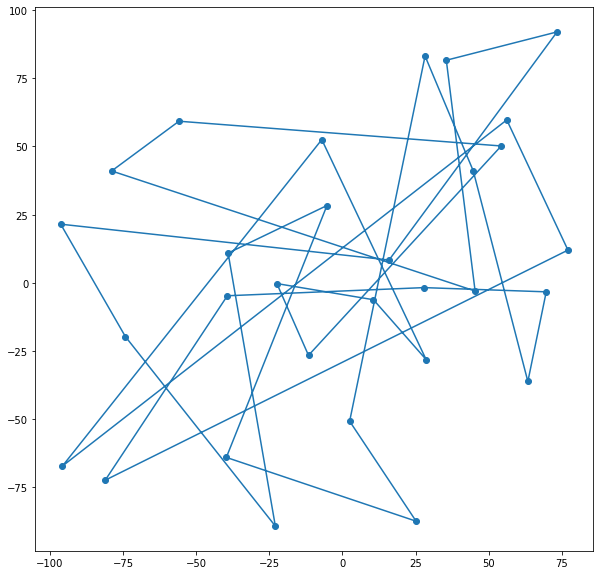

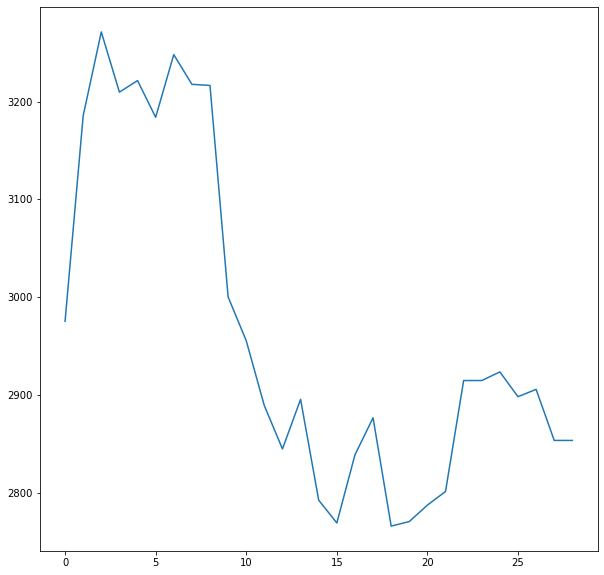

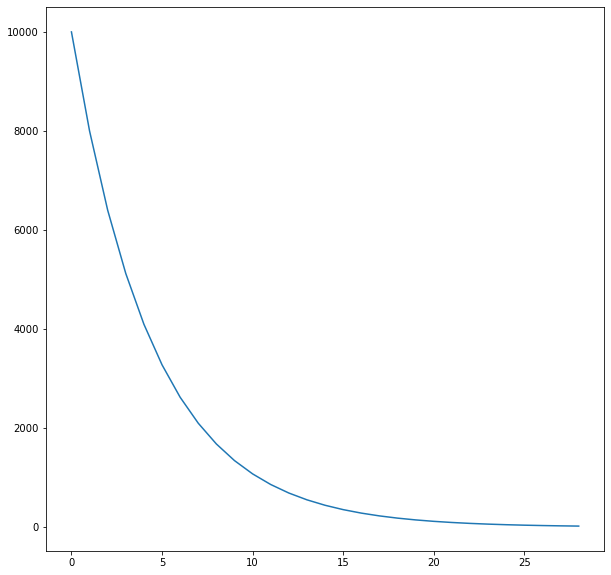

{'mode': 1, 'func': 'x : 0.8*x', 'max': 10000, 'min': 20, 'iter': 28}
2853.8843352095932
Test parametrów


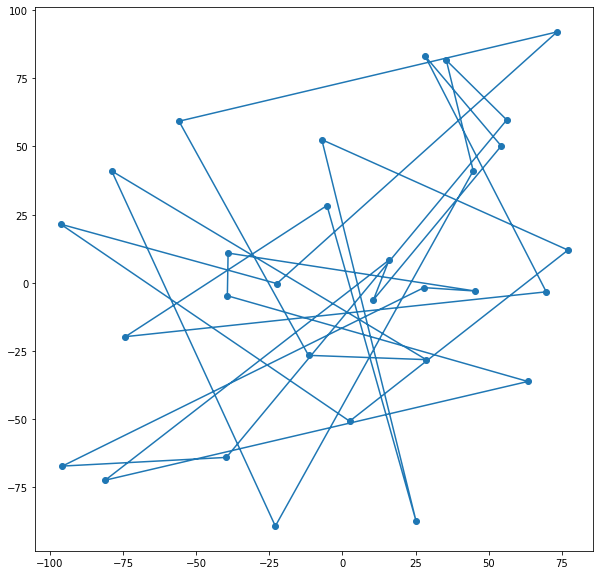

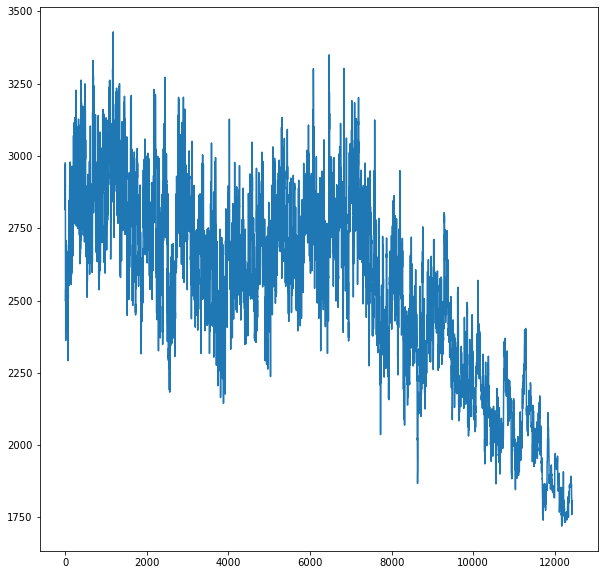

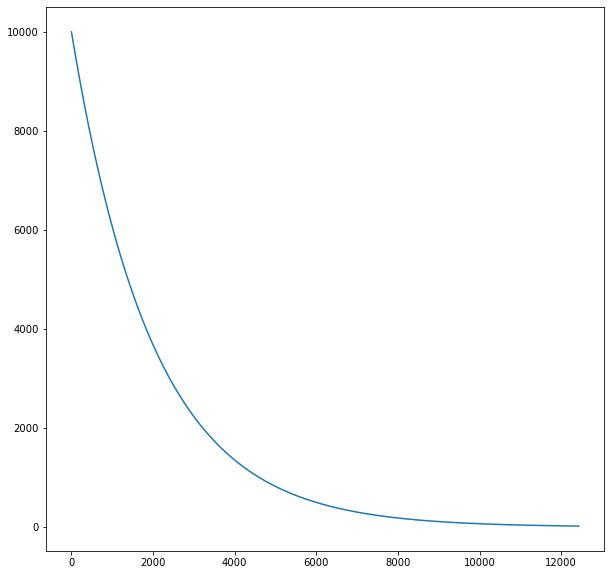

{'mode': 0, 'func': 'x : 0.9995*x', 'max': 10000, 'min': 20, 'iter': 12427}
1807.986285665793
Test parametrów


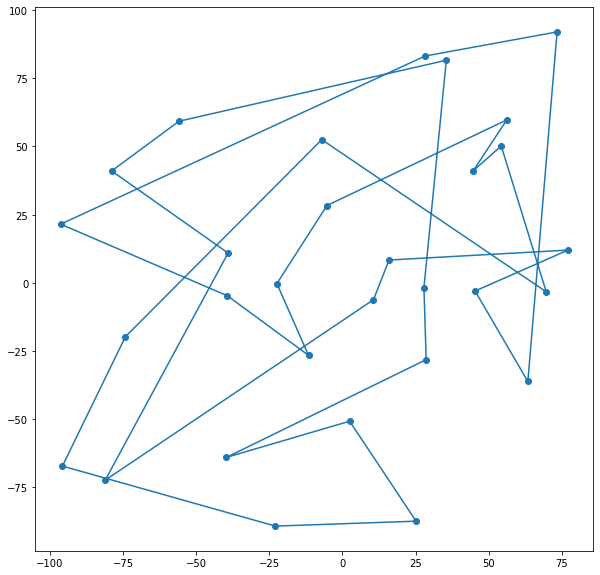

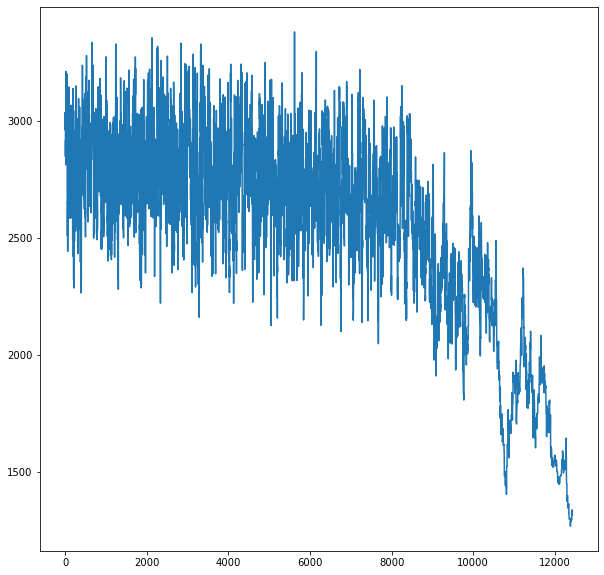

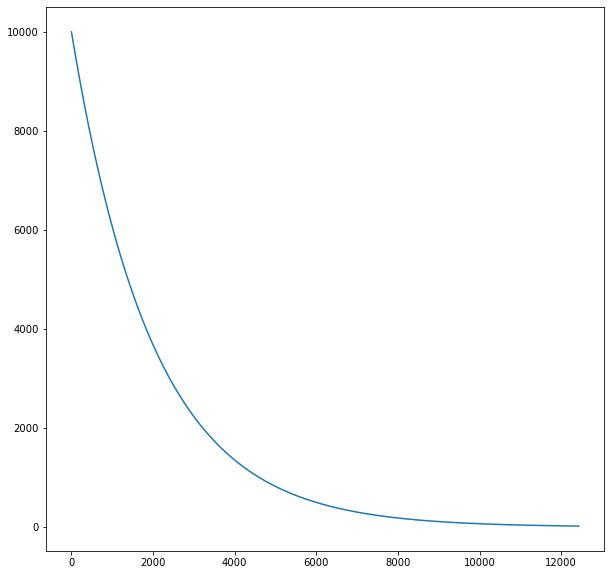

{'mode': 1, 'func': 'x : 0.9995*x', 'max': 10000, 'min': 20, 'iter': 12427}
1313.0700499163675
Test parametrów


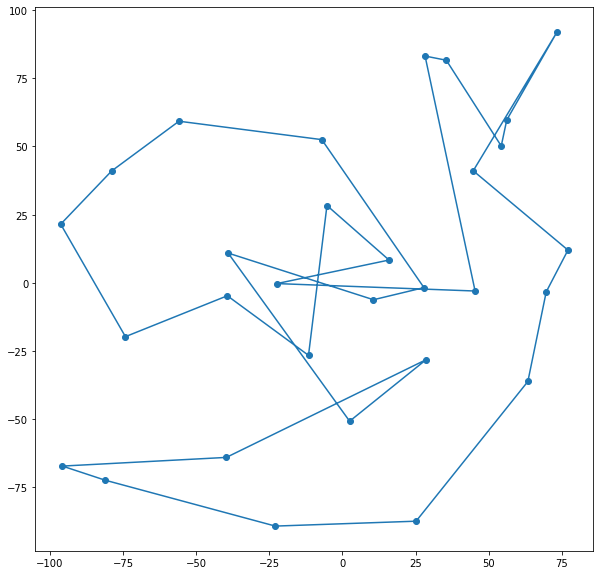

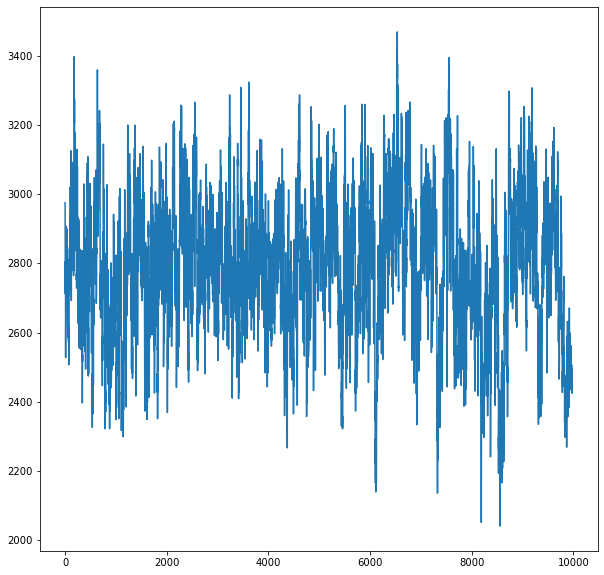

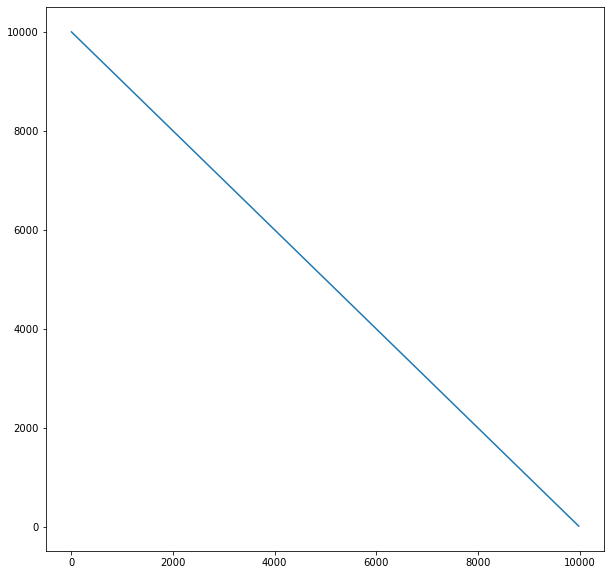

{'mode': 0, 'func': 'x : x - 1', 'max': 10000, 'min': 20, 'iter': 9980}
2444.162714118783
Test parametrów


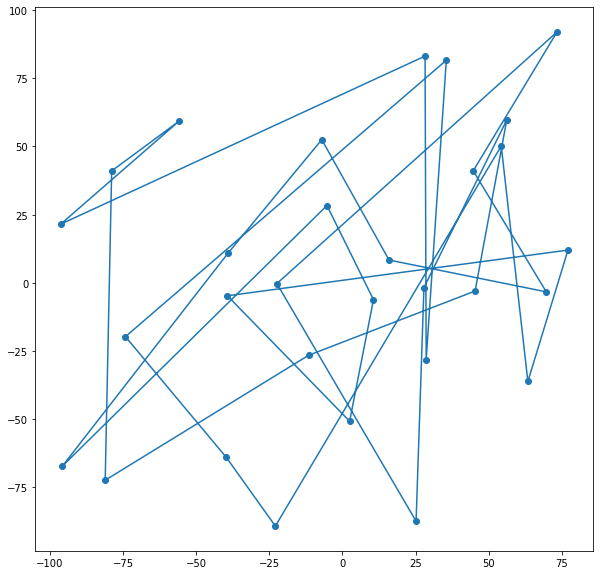

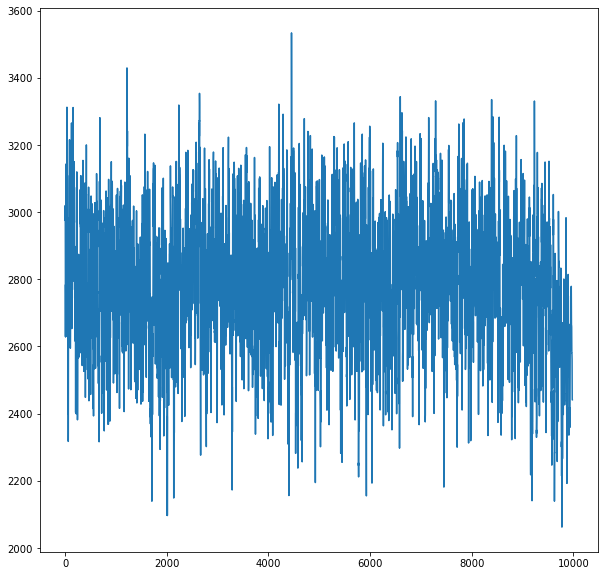

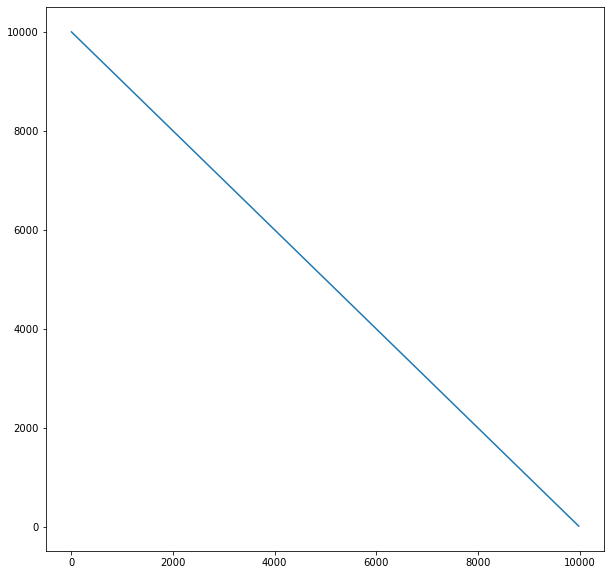

{'mode': 1, 'func': 'x : x - 1', 'max': 10000, 'min': 20, 'iter': 9980}
2440.8843217767503


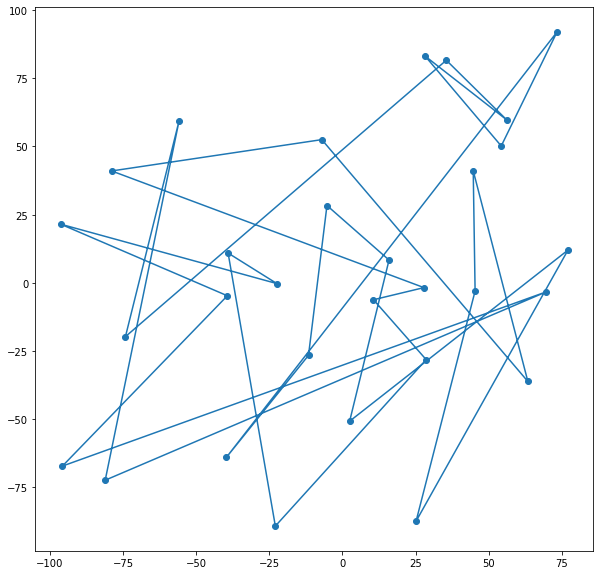

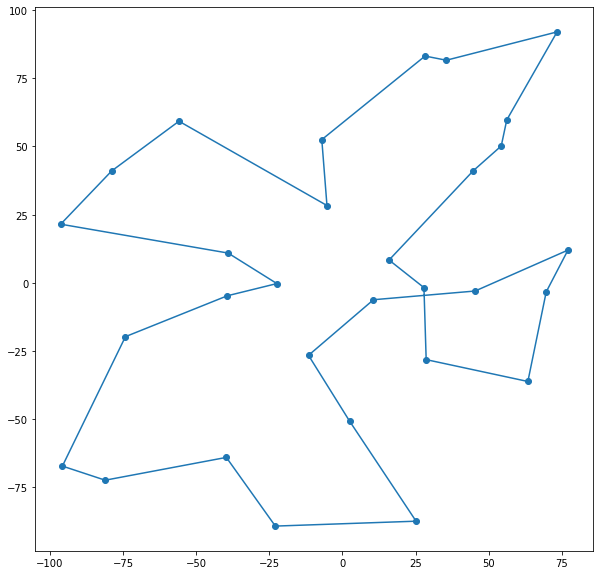

Najlepsze parametry
{'mode': 1, 'func': 'x : 0.9995*x', 'max': 10000, 'min': 0.1, 'iter': 20000}
957.5393847615331


In [11]:
n = 30
points = np.random.uniform (low = -100, high = 100, size = (n, 2))
visual_hyperparametrs_TSP(points)

Wizualizacja pozwala porównać zbieżność procesu iteracyjnego dla różnych metod.

Na początek porównam sposoby poszukiwania sąsiedniego stanu. Łatwo możemy zauważyć, że lepsze wyniki (krótszą ścieżkę) uzyskujemy dla zamieniania miejscami dwóch sąsiednich wierzchołków w rozwiązaniu (`mode` = 1). Sugeruje to jasno, że jest to lepszy sposób generacji sąsiedniego stanu. Kolejną obserwacją jest, że dla `mode` = 0 nawet dla niższych temperatur algorytm może utracić dobre rozwiązanie. Widzimy spore skoki energii na wykresach. Jest to spowodowane losowym wybieraniem obydwu wierzchołków do zamiany co powoduje słabe związanie stanów sąsiednich. Dla tej metody zdarzyło mi się, że algorytm miał lepsze rozwiązanie podczas procesu iteracyjnego a zbiegł do gorszego. Aby symulowane wyżarzanie działało dobrze stany sąsiednie muszą być ze sobą związane, aby po wielu skokach energii na początku, gdy algorytm wejdzie w dobrą "ścieżkę" zbiegał nią do optymalnego wyniku. Zamiana dwóch sąsiadów jest metodą lepiej zbieżną.

Funkcja redukcji temperatury ma duży wpływ na zbieżność procesu iteracyjnego. Możemy zaobserwować dla funkcji w których funkcja temperatury dość szybko spada, że nie obserwujemy wgl zbieżności procesu iteracyjnego. Spowodowane jest do ciągle utrzymującym się dużym prawdopodobieństwem akceptacji złego wyniku. Funkcja musi mieć długi "ogon" na końcu z wartościmai bliskimi minimum. Funkcja temperatury powinna też odpowiednio szybko spadać na początku bo przy długo utrzymującym się dużym prawdopodobieństwie akceptacji gorszego rozwiązania wykonujemy bezsensowne iteracje, które nie porzybliżają nas do rozwiązania. Na podstawie analizy wykresów, możemy zauważyć, że funkcja wykładnicza spełnia nasze postulaty. Ważne jest dobre określenie minimum dla naczego problemu, aby prawdopodobieństwo przez jakiś czas było bliskie 0. Funkcja liniowa łamie oba postualty i możemy zauważyć, że nie jest zbieżna. Natomiast funkcja wykładnicza o zbyt małym współczynniku spada zbyt szybko i nie pozwala wykorzystać możliwości symulowanego wyżarzania. Na podstawie testów najlepiej sprawdziły się funkcje typu `x : a*x`, gdzie a jest bliskie 1 i wynosi ok. 0.999.

### Testy

Dla różnych zbiorów punktów rozwiążę problem komiwojażera z hiperparametrami obliczonymi wcześniej. Posłuży mi do tego funkcja `test_TSP`. Wyświetla stan wejściowy ścieżki, wykres energi i temperatury od iteracji oraz znalezione rozwiązanie.

In [12]:
def test_TSP (points):
    plt.figure(10, figsize=(10,10))
    plt.scatter(points[:,0], points[:,1])
    plt.plot(np.append(points[:,0], points[0, 0]), np.append(points[:,1], points[0, 1]))
    initial_state = np.array([i for i in range (len(points))])
    tsp = TSP (initial_state, points, 1, temperature = 2000, stop = 0.1, f_reduce = lambda x : 0.9995*x, visual = 2)
    solution, value, n_iter = tsp.anneal ()
    result = []
    for i in solution:
        result.append(points[i])
    result.append(points[solution[0]])
    result = np.array(result)
    plt.figure(11, figsize=(10,10))
    plt.scatter(result[:-1,0], result[:-1,1])
    plt.plot(result[:,0], result[:,1])
    plt.show()
    print ("Uzyskano wynik:", value)

#### Rozkład jednostajny

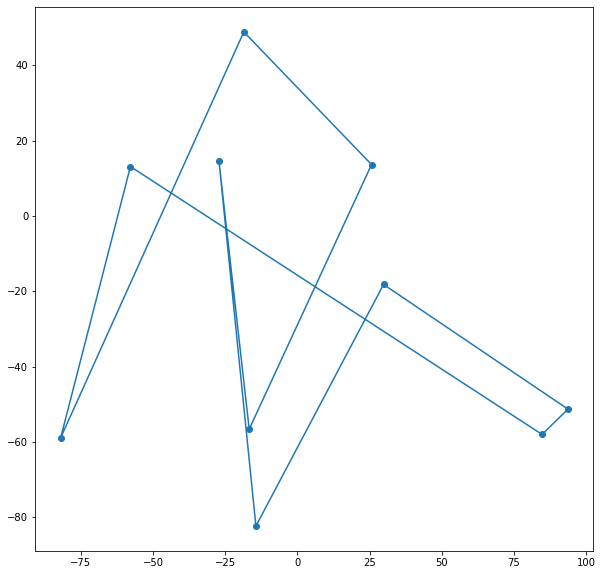

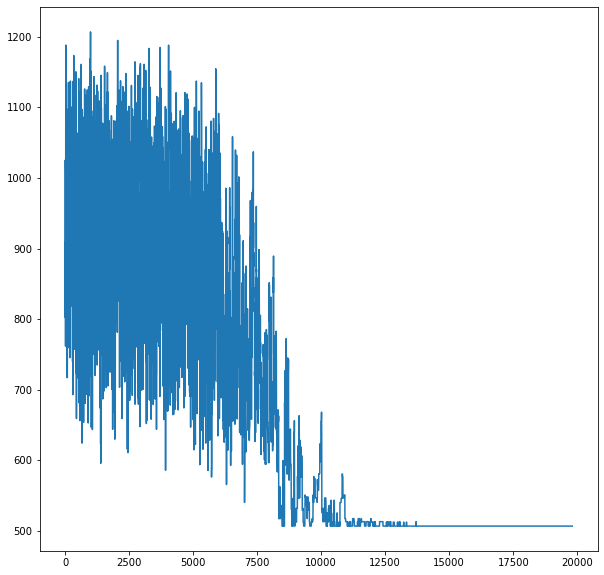

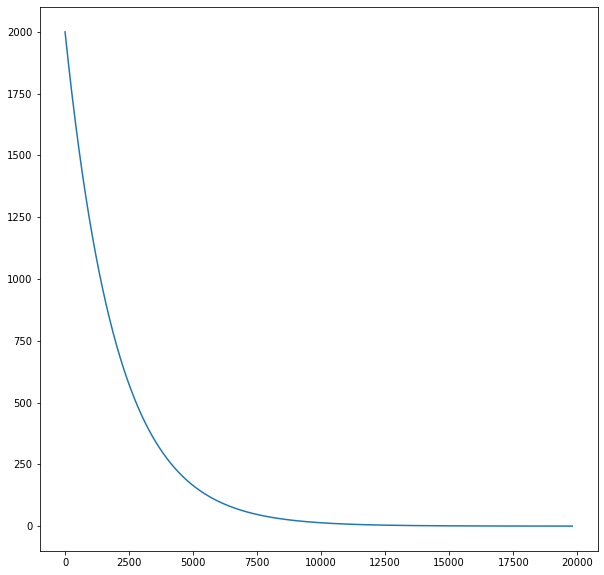

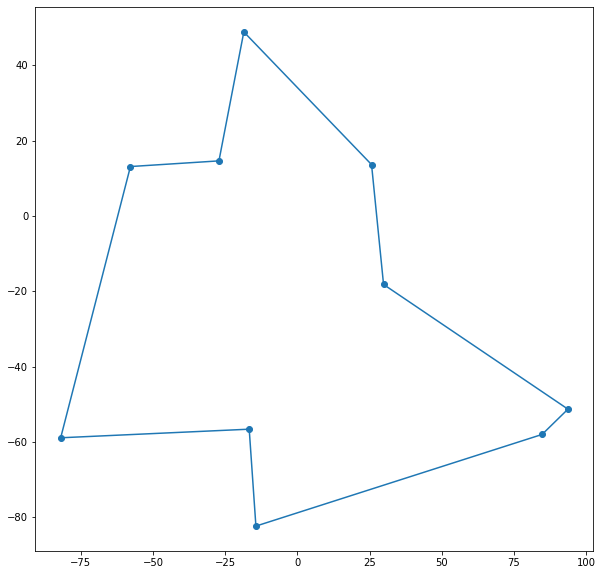

Uzyskano wynik: 507.029708386131


In [13]:
n = 10
points = np.random.uniform (low = -100, high = 100, size = (n, 2))
test_TSP (points)

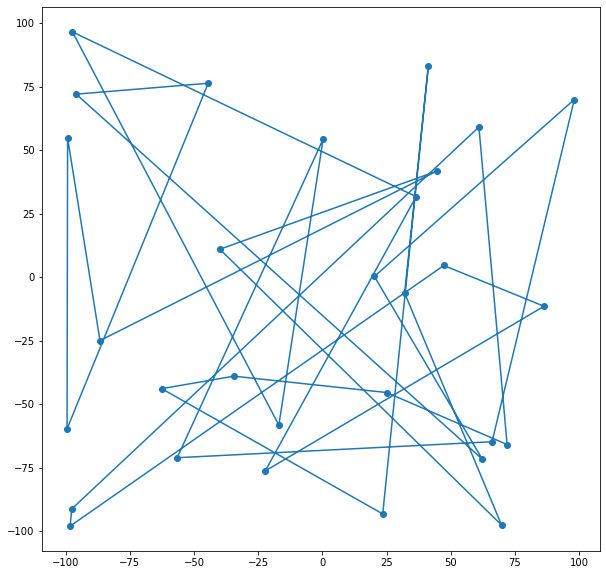

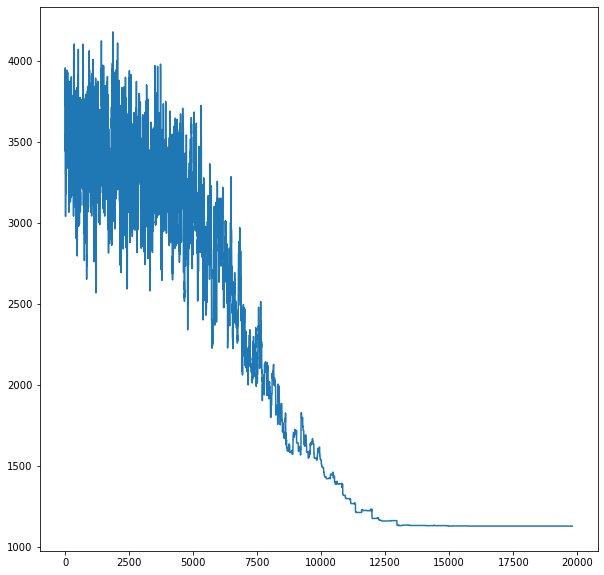

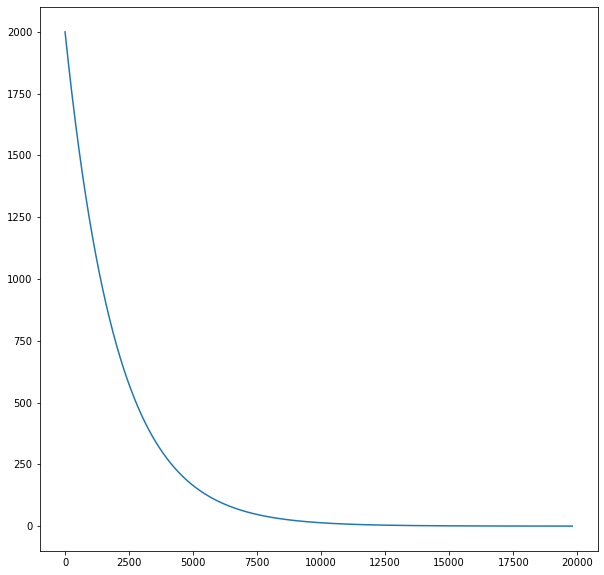

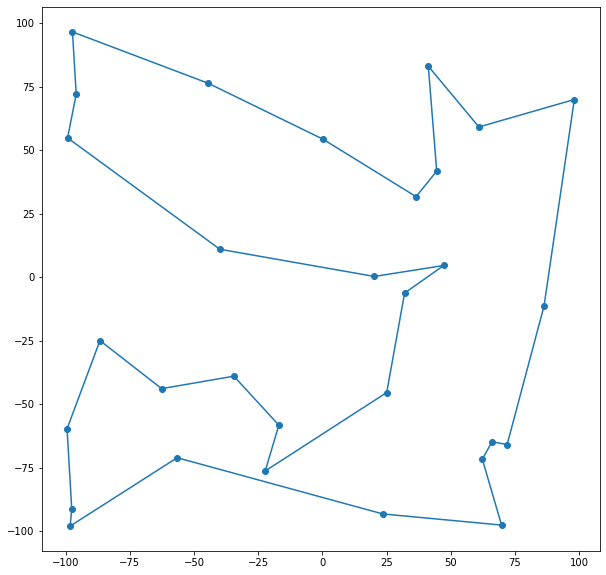

Uzyskano wynik: 1130.2556630113631


In [14]:
n = 30
points = np.random.uniform (low = -100, high = 100, size = (n, 2))
test_TSP (points)

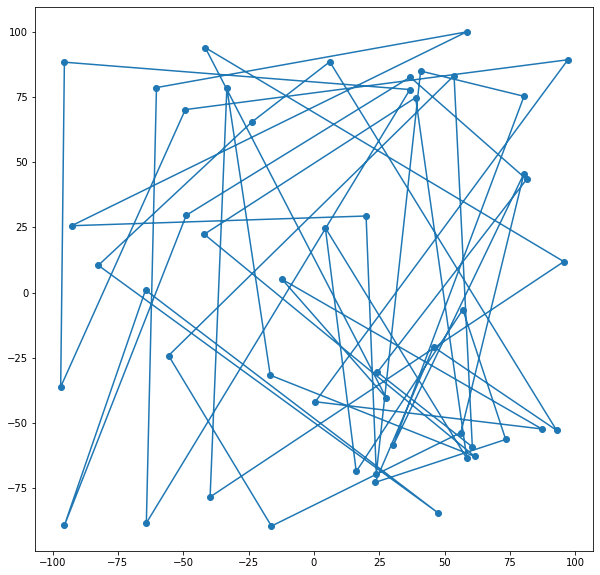

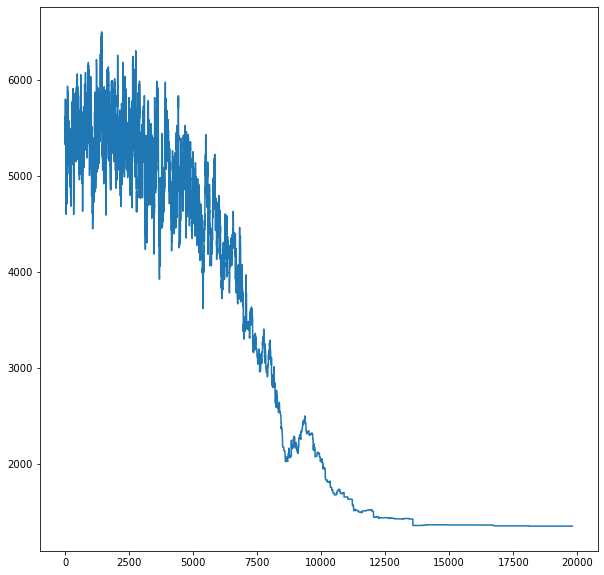

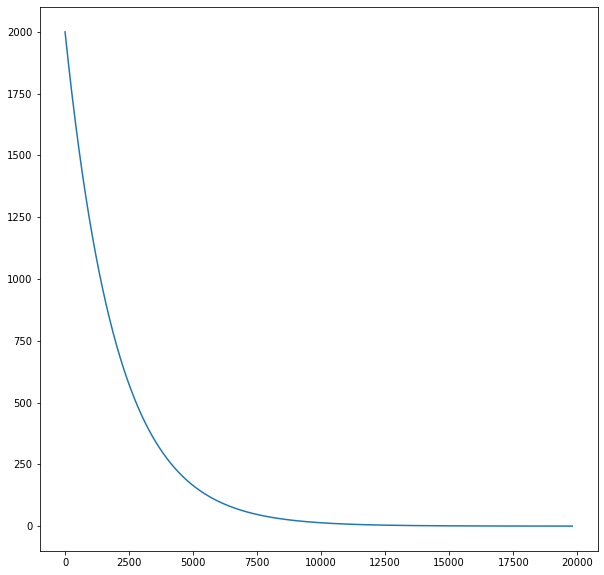

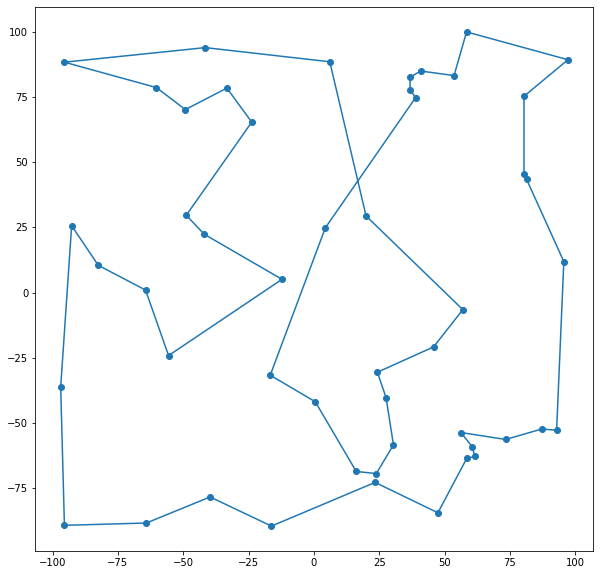

Uzyskano wynik: 1348.2631188151859


In [15]:
n = 50
points = np.random.uniform (low = -100, high = 100, size = (n, 2))
test_TSP (points)

#### Rozkład normalny

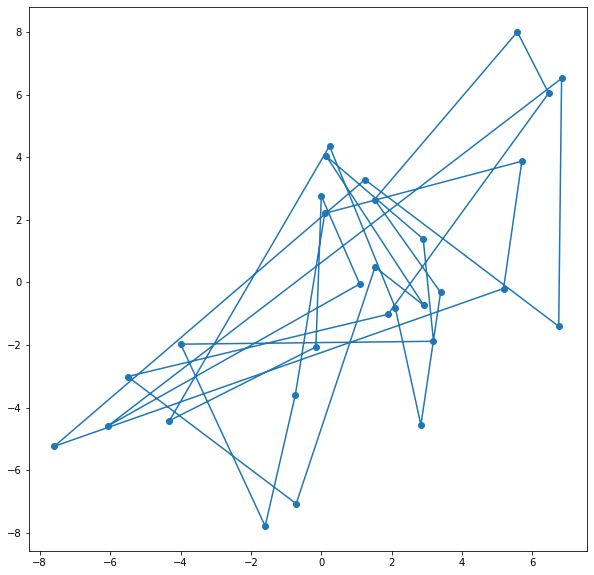

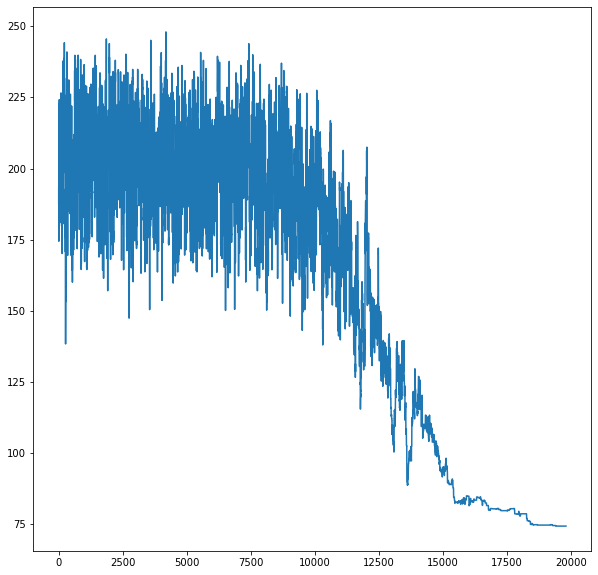

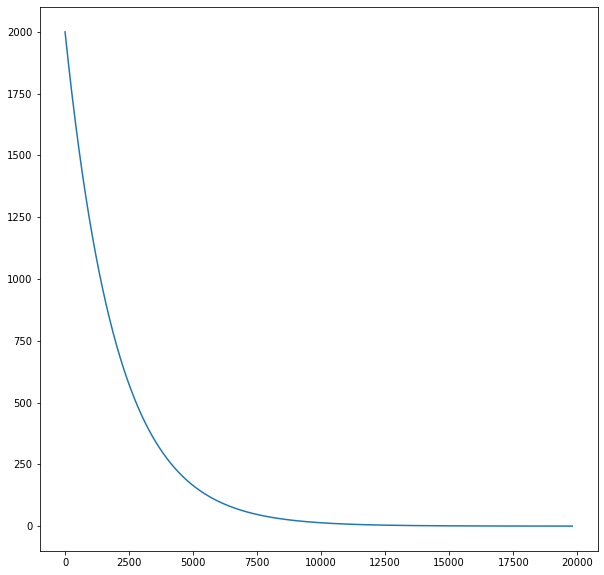

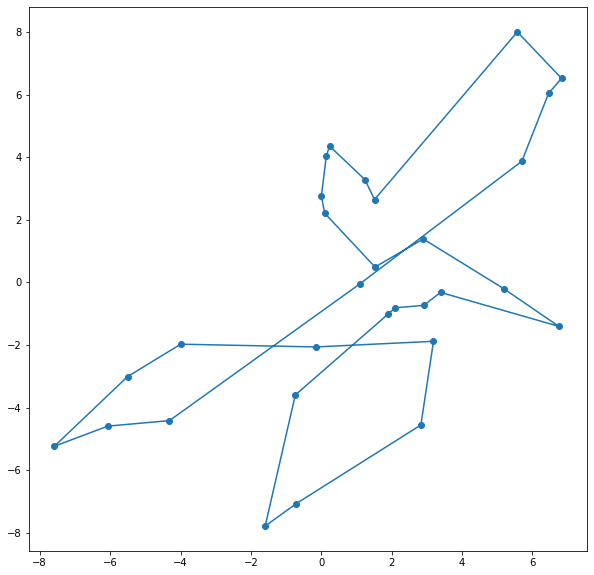

Uzyskano wynik: 74.43813121828723


In [16]:
n = 30
points = mvn.rvs(mean=[0,0], cov = [[10,4],[4,10]], size = n)
points = np.random.permutation (points)
test_TSP(points)

/home/glegeza/anaconda3/lib/python3.8/site-packages/scipy/stats/_multivariate.py:664: RuntimeWarning: covariance is not positive-semidefinite.
  out = random_state.multivariate_normal(mean, cov, size)


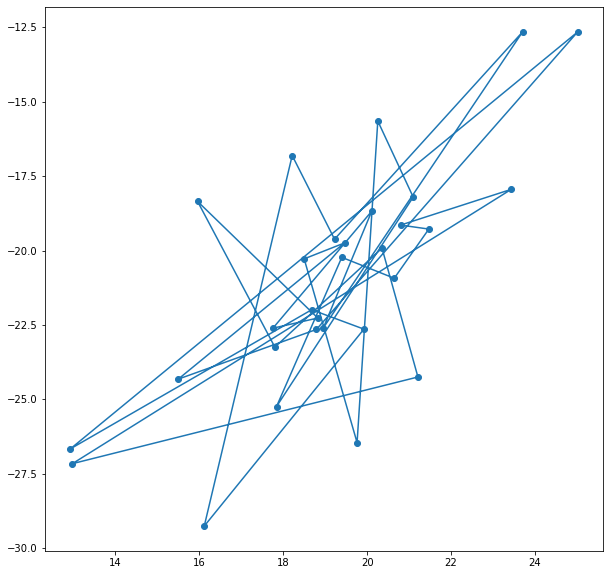

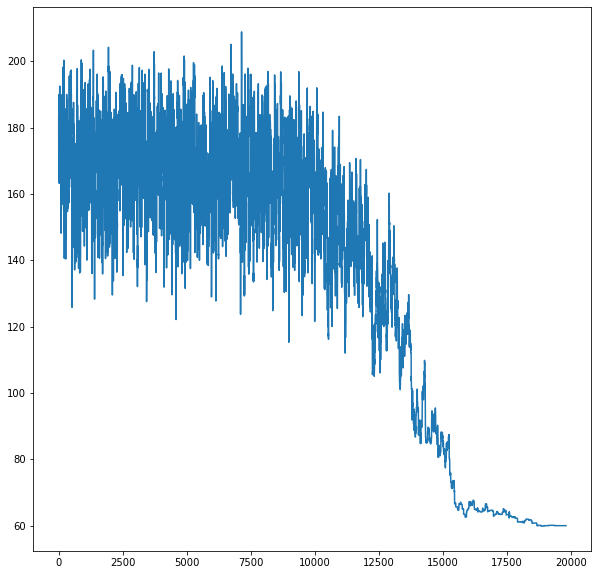

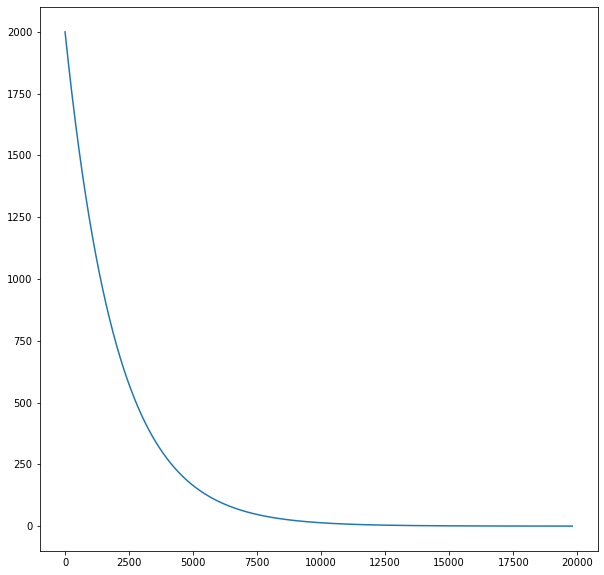

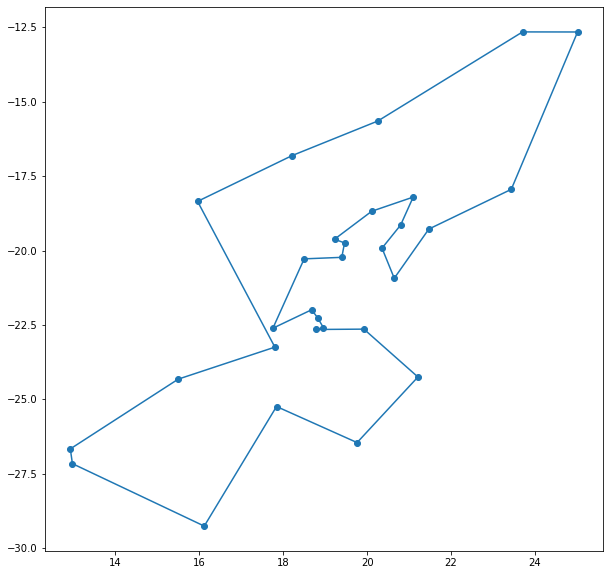

Uzyskano wynik: 60.05676221615537


In [17]:
n = 30
points = mvn.rvs(mean=[20,-20], cov = [[10,20],[10,10]], size = n)
points = np.random.permutation (points)
test_TSP(points)

/home/glegeza/anaconda3/lib/python3.8/site-packages/scipy/stats/_multivariate.py:664: RuntimeWarning: covariance is not positive-semidefinite.
  out = random_state.multivariate_normal(mean, cov, size)


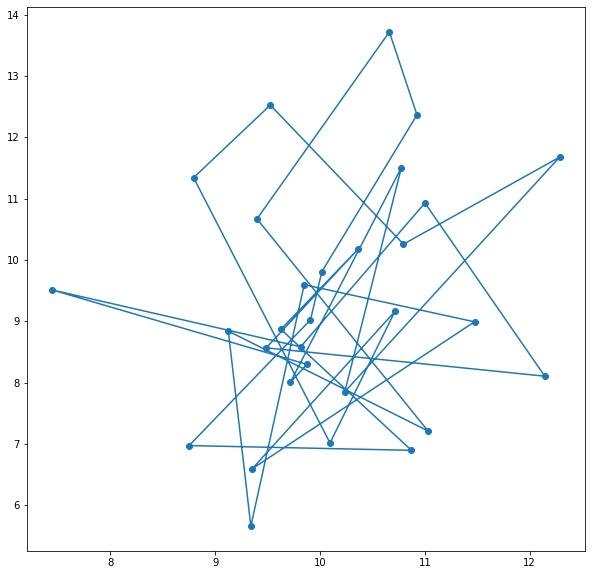

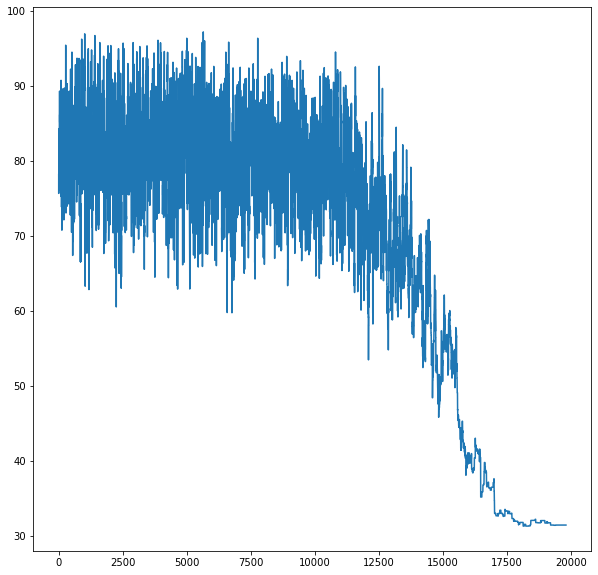

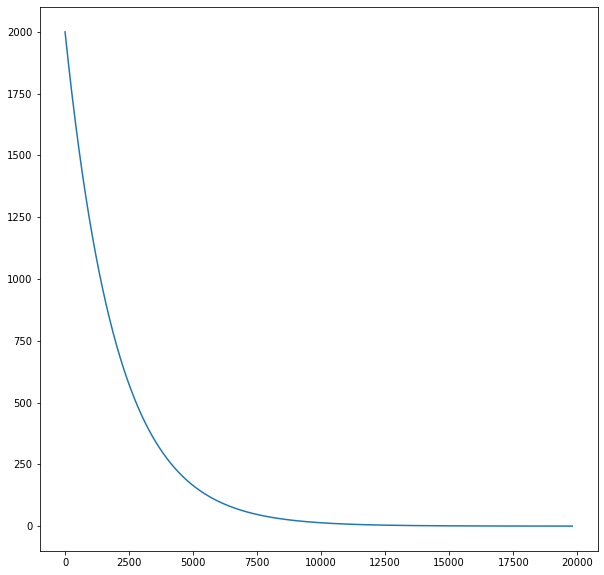

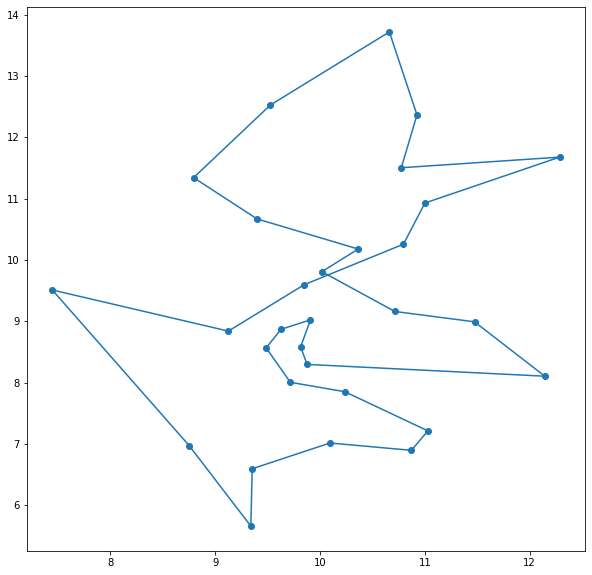

Uzyskano wynik: 31.424301269383253


In [18]:
n = 30
points = mvn.rvs(mean=[10,10], cov = [[1,5],[1,1]], size = n)
points = np.random.permutation (points)
test_TSP(points)

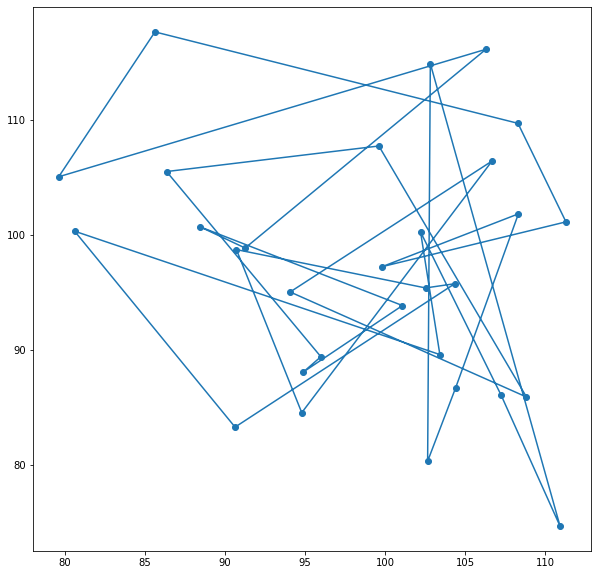

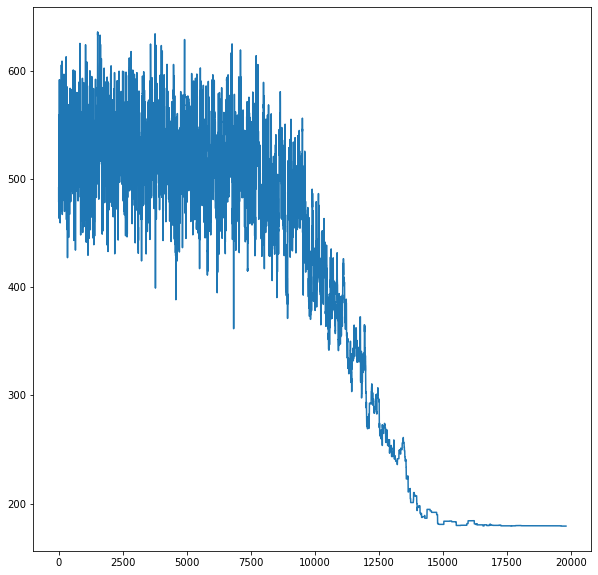

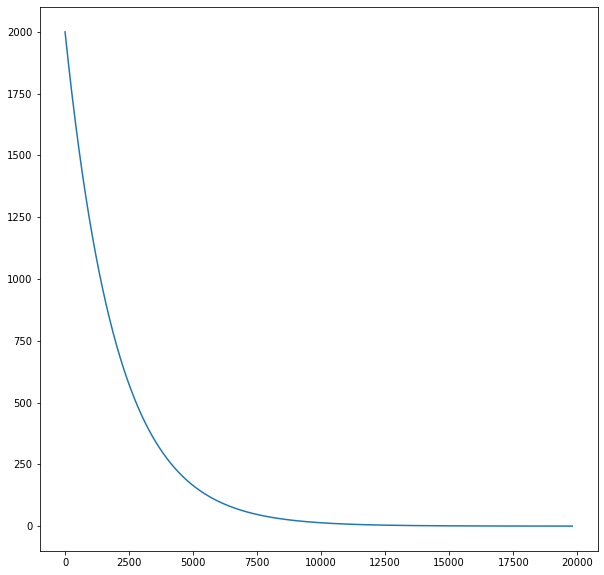

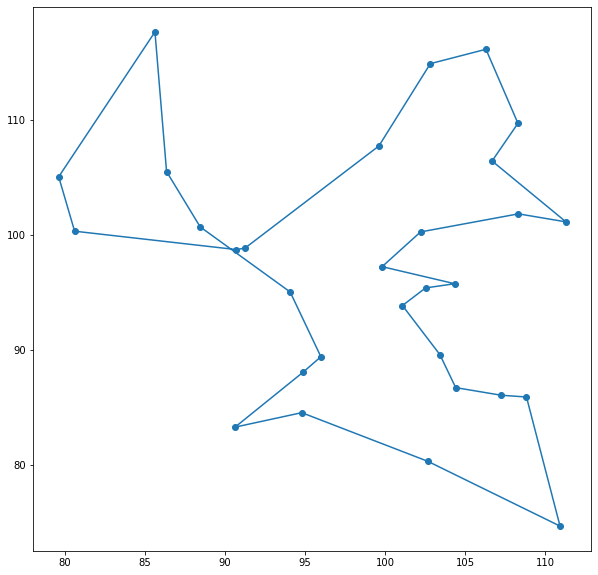

Uzyskano wynik: 179.27391371375705


In [19]:
n = 30
points = mvn.rvs(mean=[100,100], cov = [[100,0],[0,100]], size = n)
points = np.random.permutation (points)
test_TSP(points)

#### Rozkład normalny wiele na jednym

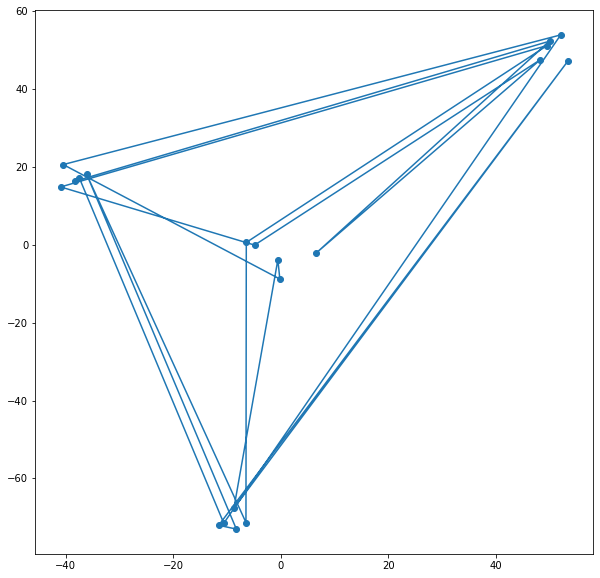

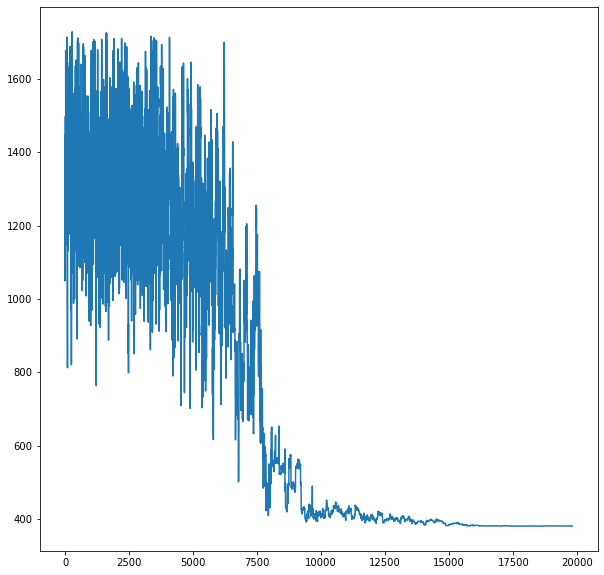

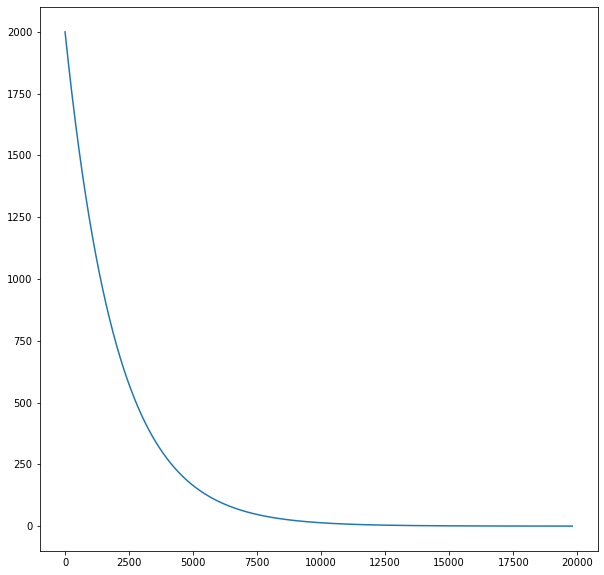

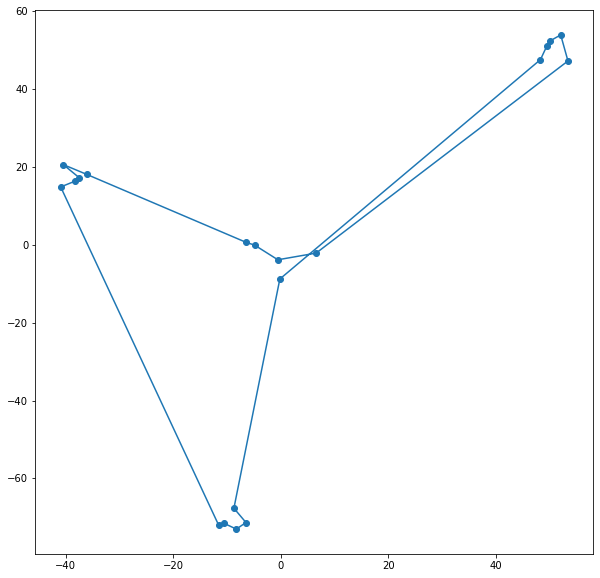

Uzyskano wynik: 381.5959211010258


In [20]:
n = 5
points = mvn.rvs(mean=[0,0], cov = [[10,0],[0,10]], size = n)
points = np.concatenate((points, mvn.rvs(mean=[50,50], cov = [[5,0],[0,5]], size = n)))
points = np.concatenate((points, mvn.rvs(mean=[-40,20], cov = [[5,0],[0,5]], size = n)))
points = np.concatenate((points, mvn.rvs(mean=[-10,-70], cov = [[5,0],[0,5]], size = n)))
points = np.random.permutation (points)
test_TSP(points)

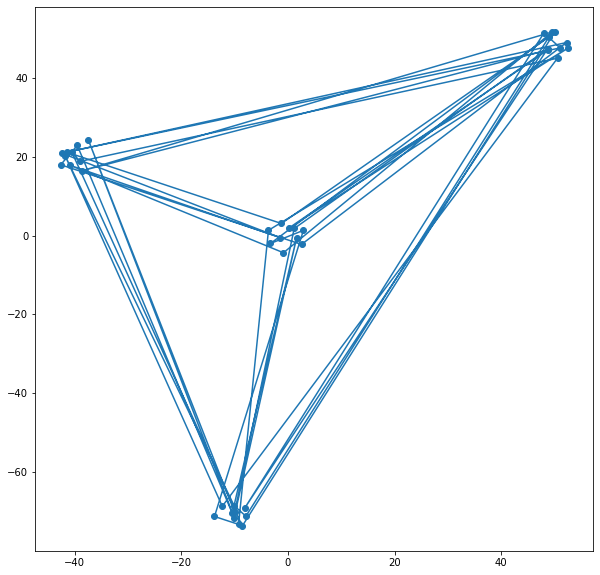

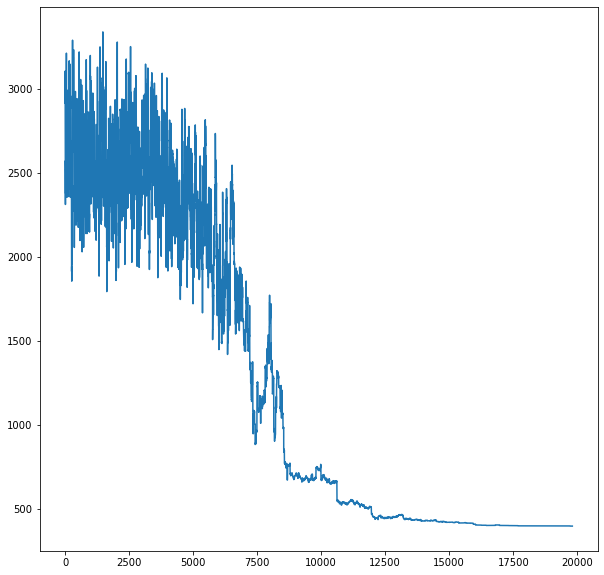

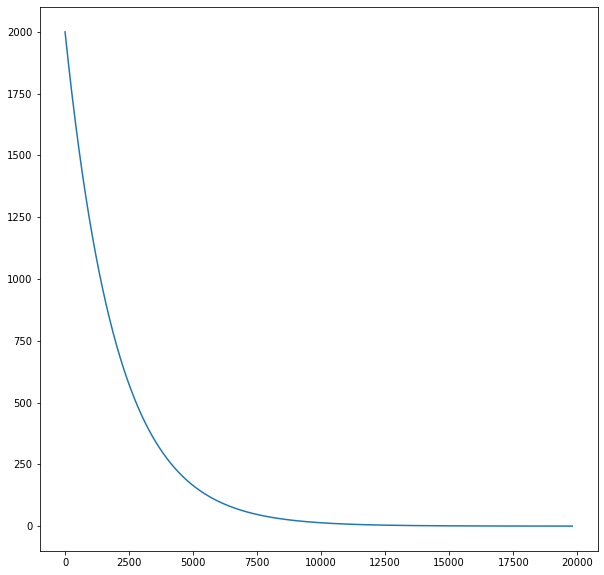

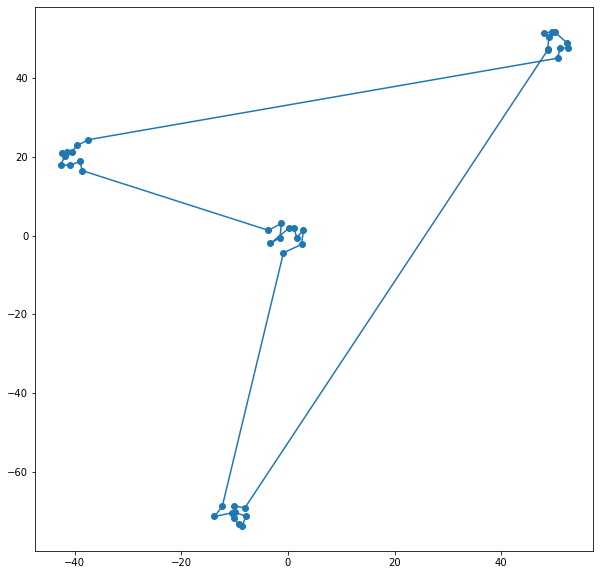

Uzyskano wynik: 401.225436528655


In [21]:
n = 10
points = mvn.rvs(mean=[0,0], cov = [[10,0],[0,10]], size = n)
points = np.concatenate((points, mvn.rvs(mean=[50,50], cov = [[5,0],[0,5]], size = n)))
points = np.concatenate((points, mvn.rvs(mean=[-40,20], cov = [[5,0],[0,5]], size = n)))
points = np.concatenate((points, mvn.rvs(mean=[-10,-70], cov = [[5,0],[0,5]], size = n)))
points = np.random.permutation (points)
test_TSP(points)

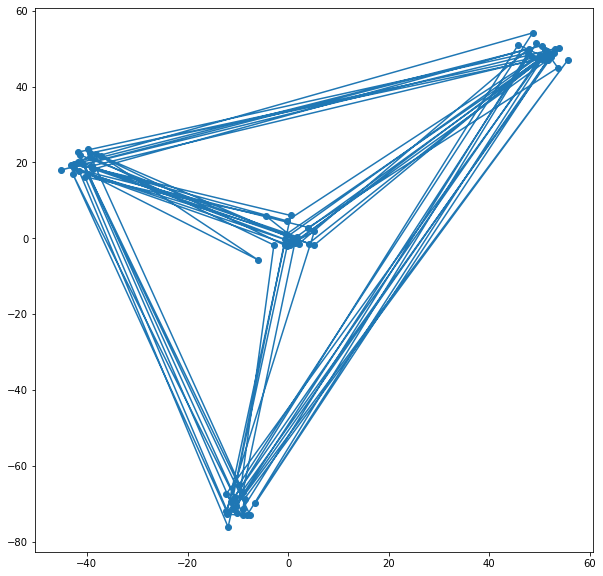

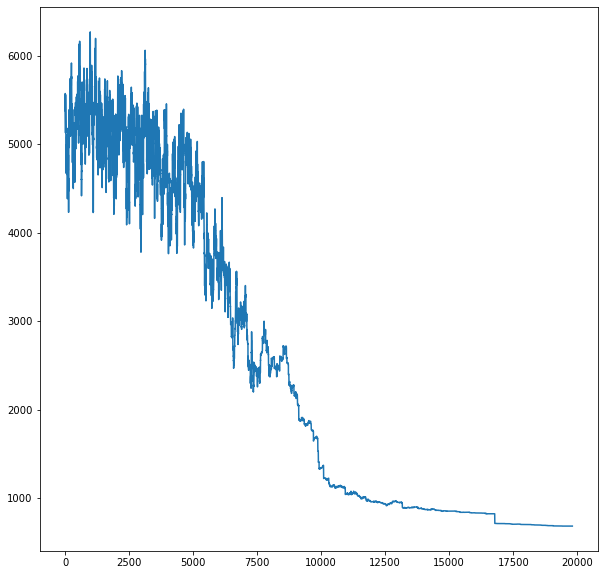

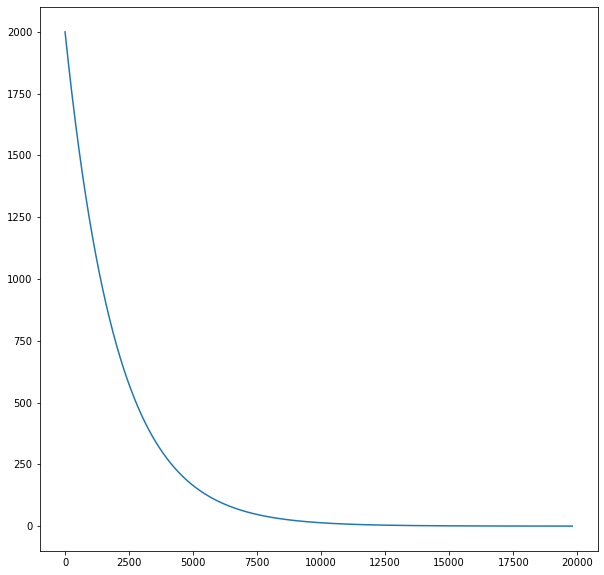

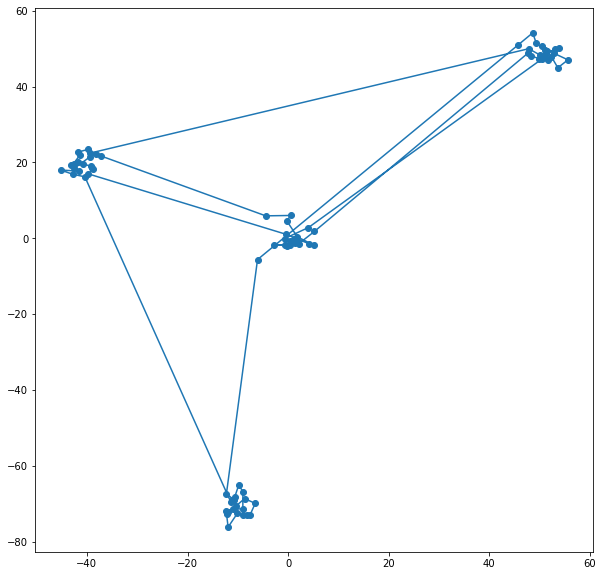

Uzyskano wynik: 685.5120739883108


In [22]:
n = 20
points = mvn.rvs(mean=[0,0], cov = [[10,0],[0,10]], size = n)
points = np.concatenate((points, mvn.rvs(mean=[50,50], cov = [[5,0],[0,5]], size = n)))
points = np.concatenate((points, mvn.rvs(mean=[-40,20], cov = [[5,0],[0,5]], size = n)))
points = np.concatenate((points, mvn.rvs(mean=[-10,-70], cov = [[5,0],[0,5]], size = n)))
points = np.random.permutation (points)
test_TSP(points)

#### 9 grup

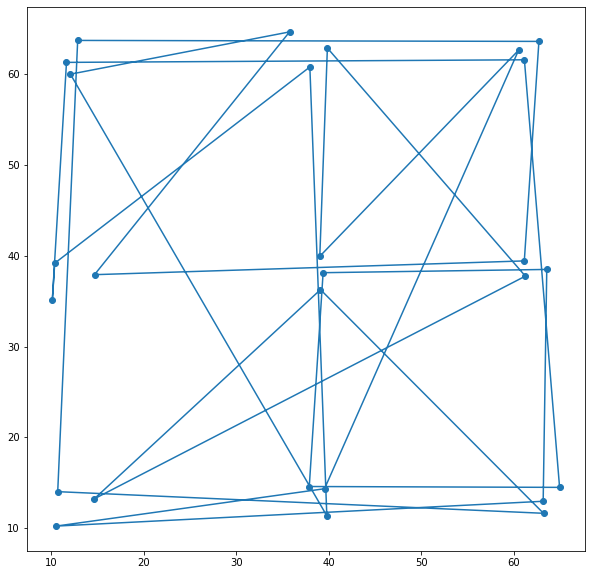

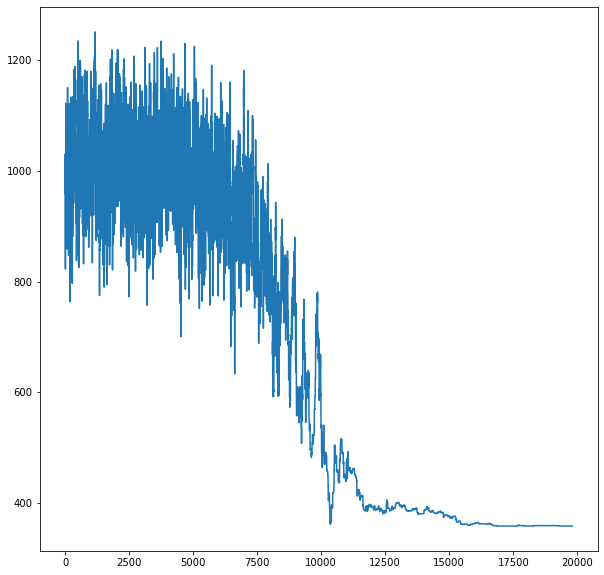

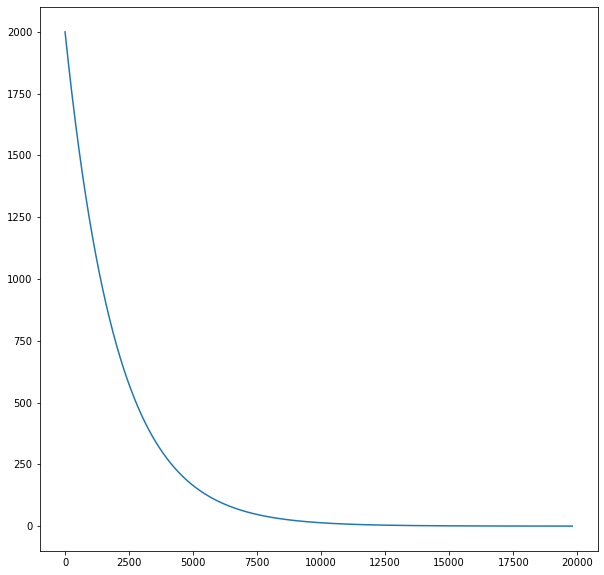

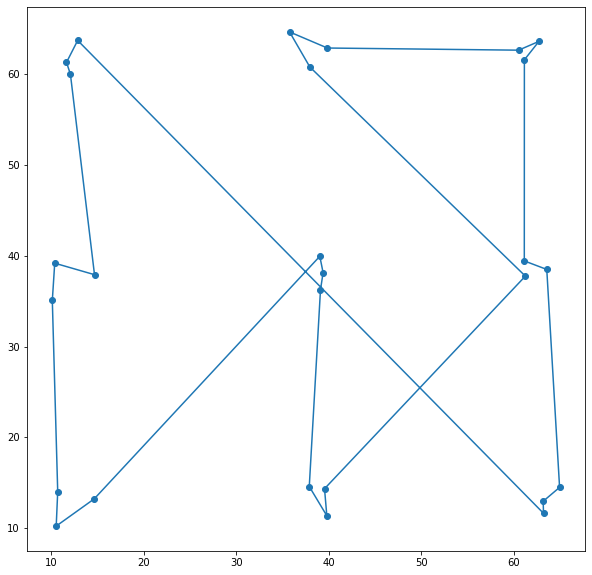

Uzyskano wynik: 357.4817995074943


In [23]:
n = 3
points = np.array([[0, 0]])
for i in [0, 25, 50]:
    for j in [0, 25, 50]:
        tmp = np.random.uniform (low = 10, high = 15, size = (n, 2))
        to_sum = np.array([[i, j] for _ in range (n)])
        tmp = tmp + to_sum
        points = np.concatenate((points, tmp))
points = points[1:,:]
points = np.random.permutation (points)

test_TSP(points)

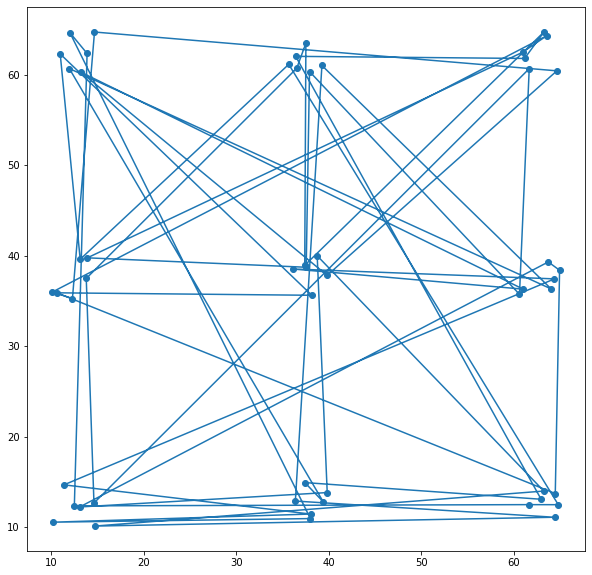

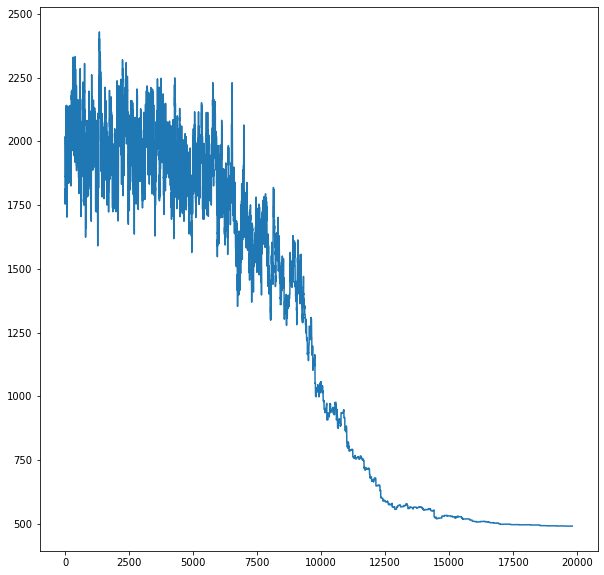

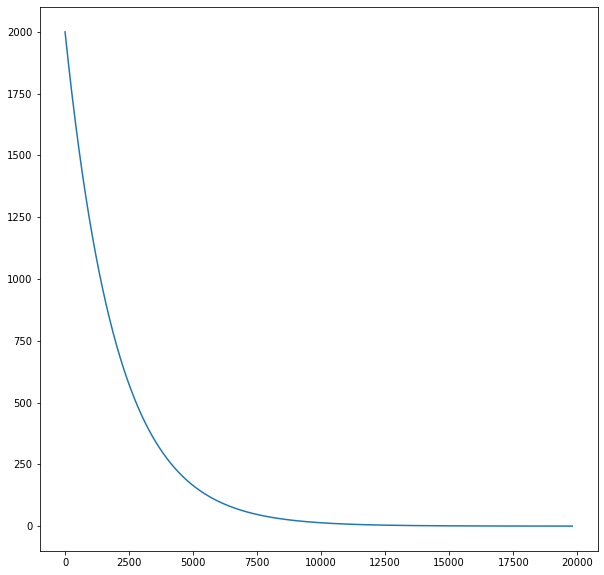

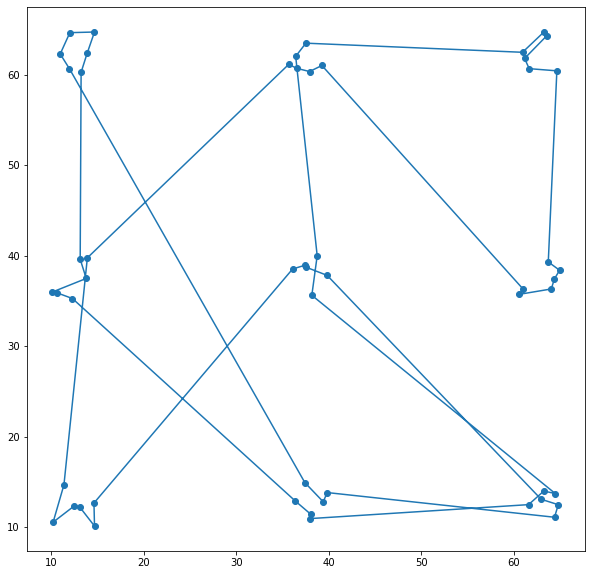

Uzyskano wynik: 491.550331153354


In [24]:
n = 6
points = np.array([[0, 0]])
for i in [0, 25, 50]:
    for j in [0, 25, 50]:
        tmp = np.random.uniform (low = 10, high = 15, size = (n, 2))
        to_sum = np.array([[i, j] for _ in range (n)])
        tmp = tmp + to_sum
        points = np.concatenate((points, tmp))
points = points[1:,:]
points = np.random.permutation (points)

test_TSP(points)

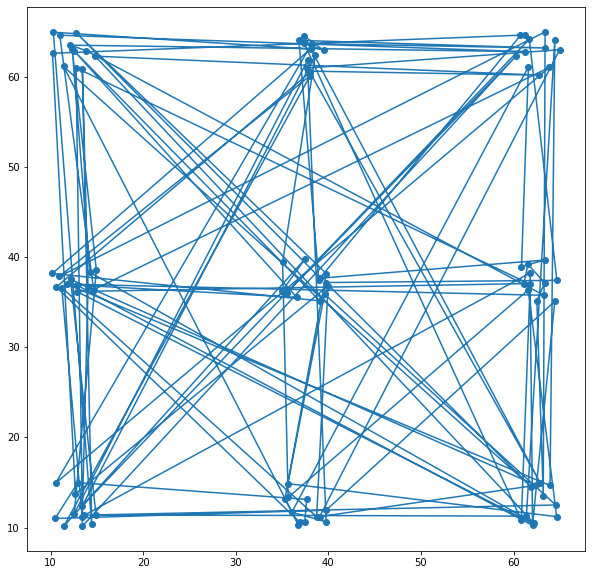

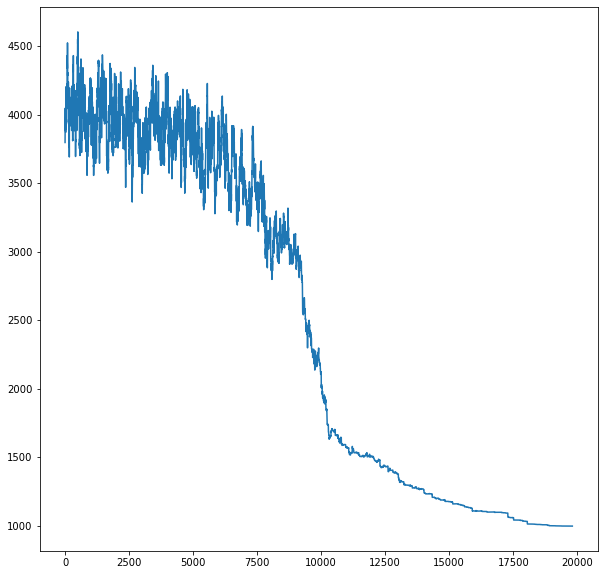

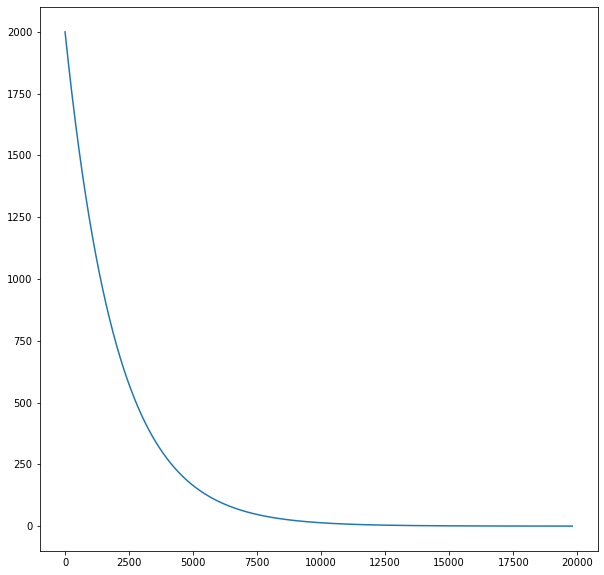

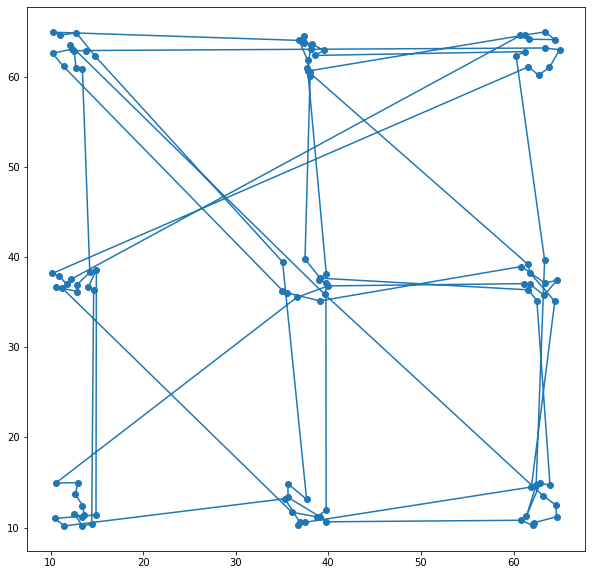

Uzyskano wynik: 996.1081227962989


In [25]:
n = 12
points = np.array([[0, 0]])
for i in [0, 25, 50]:
    for j in [0, 25, 50]:
        tmp = np.random.uniform (low = 10, high = 15, size = (n, 2))
        to_sum = np.array([[i, j] for _ in range (n)])
        tmp = tmp + to_sum
        points = np.concatenate((points, tmp))
points = points[1:,:]
points = np.random.permutation (points)

test_TSP(points)

Symulowane wyżarzanie działa prawidłowo, udało się znaleźć rozwiązania dla zadanych problemów. Im więcej punktów tym rozwiązania są gorszej jakości. W takiej sytuacji mogło by pomóc zwiększenie temperatury i liczby możliwych iteracji do wykonania. Jednak chciałem pokazać dla tych samych hiperparametrów by było widać jak ważne jest dostosowywanie parametrów do zadanego problemu.

## Obraz binarny

Klasa `BinaryImage` tworzy nowy obraz binarny minimalizując funkcję energii. Funkcja energii jest sumą energii dla każdego czarnego piksela. Funkcja ta to `point_energy` i jest ona przekazywana do konstruktora jako argument. Klasa realizuje funkcje poszukiwania stanu sąsiedniego poprzez wylosowanie k pól i zamienienie je miejscami parami (`mode` = 1). Kolejną możliwością poszukiwania stanu sąsiedniego jest losowanie k pól i zamienienie je z sąsiadem w lewym górnym rogu (`mode` = 2). Z racji dużej złożoności problemu (duże obrazy) stosuje funkcję spadku temperatury z podgrzewaniem (wzrost temperatury dla kilku okreslonych wartości) oraz powolny spadek temperatury. Liczba możliwych iteracji została znacznie zwiększona do jednego miliona.

In [26]:
@jit(nopython=True)
def bi_energy (X, size, point_energy):
    res = np.arange(1, dtype = np.int64)
    for x in range (size):
        for y in range (size):
            if X[x, y]:
                res += point_energy (x, y, size, X)
    return res[0]

In [27]:
class BinaryImage (Annealing):
    def __init__ (self, image, point_energy, mode = 1, k = 2, **kwargs):
        self.k = k
        self.point_energy = point_energy
        self.n = image.shape[0]
        self.mode = mode
        super(BinaryImage, self).__init__(image, N = 1000000, **kwargs)
        
    def move (self):
        if self.mode == 1:
            change_list = np.random.randint(self.n, size = (self.k*2, 2))
            for i in range (0, self.k*2-1, 2):
                self.X[change_list[i][0], change_list[i][1]], self.X[change_list[i+1][0], change_list[i+1][1]] = self.X[change_list[i+1][0], change_list[i+1][1]], self.X[change_list[i][0], change_list[i][1]]
        elif self.mode == 2:
            change_list = np.random.randint(self.n, size = (self.k, 2))
            for x, y in change_list:
                self.X[x, y], self.X[x-1, y-1] = self.X[x-1, y-1], self.X[x, y]
    
    def point_energy (self, x, y):
        e = 0
        if self.X[x-1, y]:
            e += 5
        if self.X[x, y-1]:
            e += 5
        if x+1 < self.n and self.X[x+1, y]:
            e += 5
        if y+1 < self.n and self.X[x, y+1]:
            e += 5
        return e  
    
    def energy (self):
        return bi_energy(self.X, self.n, self.point_energy)
    
    def reduce (self, x):
        if self.iter % 20000 == 0 and self.iter < 400 * self.max_T:
            if x > 1:
                x *= 3
            else:
                x *= 5
        if self.f_reduce:
            return self.f_reduce (x)
        return 0.9999 * x

Generowanie obrazu o zadanej wielkości i ilości procentowej czarnych pól.

In [28]:
def gen_image (n, sigma):
    raw = np.random.randint(10, size=(n,n))
    mask = (raw >= 10*sigma)
    I = np.ones_like (mask)
    I[mask] = 0
    return I

### Testowanie różnego typu sąsiedztwa i funkcji zmiany temperatury

Na podstawie obserwacji podczas algorytmu TSP oraz testów z obrazami binarnymi przyjmuję jako temperaturę minimalną 0.001 (zwiększenie iteracji dla niskiej temperatury pozytywnie wpływa na rezultat), temperaturę początkową jako liczbę czarnych pikseli na rysunku (zależna od złożoności problemu). Testuję najpierw wpyływ wyboru sąsiedztwa na wynik algorytmu. Test dla dwóch różnych funkcji energii. Następnie testuje funkcje redukcji temperatury dla funkcji energii która jest obliczana jako suma białych pól w 8-sąsiedztwie. Jest to funkcja łatwa w wizualnej ocenie efektywności ponieważ dąży do połączenia czarnych pól w jedną całość.

In [40]:
def test_BI_mode (image, point_energy):
    plt.figure(3, figsize=(10,10))
    plt.imshow(1 - image, cmap=plt.cm.gray)
    temp = np.sum(image)
    f = lambda x : 0.9999*x
    mode = [1, 2]
    K = [1, 2, 3, 4]
    R1 = []
    R2 = []
    E1 = []
    E2 = []
    best_result = np.Inf
    solution = None
    best_param = {'mode': None, 'k': None, 'iter':None}
    for m in mode:
        for k in K:
            print ("Test parametrów")
            BI = BinaryImage(image.copy(), point_energy, mode = m, k = k, temperature = temp, visual = 0, stop = 0.001, f_reduce = f)
            new_image, energy, n_iter = BI.anneal()
            if m == 1:
                R1.append(n_iter)
                E1.append(energy)
            else:
                R2.append(n_iter)
                E2.append(energy)
            tmp_dict = {}
            tmp_dict['mode'] = m
            tmp_dict['k'] = k
            tmp_dict['iter'] = n_iter
            print (tmp_dict)
            print (energy)
            if energy < best_result or (energy == best_result and n_iter < best_param['iter']):
                best_param['mode'] = m
                best_param['iter'] = n_iter
                best_param['k'] = k
                best_result = energy
                solution = new_image
    
    print ("Najlepsze parametry")
    print (best_param)
    print (best_result)
    plt.figure(4, figsize=(10,10))
    plt.imshow(1 - solution, cmap=plt.cm.gray)
    print ("Zależność liczby iteracji od k dla obydwu trybów (niebieski - mode = 1, czerwony - mode = 2)")
    plt.figure(5, figsize=(10,10))
    plt.plot(K, R1, color='blue')
    plt.plot(K, R2, color='red')
    print ("Zależność energii uzyskanej od k dla obydwu trybów (niebieski - mode = 1, czerwony - mode = 2)")
    plt.figure(6, figsize=(10,10))
    plt.plot(K, E1, color='blue')
    plt.plot(K, E2, color='red')
    
    plt.show ()

In [44]:
def test_BI_funct (image, point_energy):
    plt.figure(3, figsize=(10,10))
    plt.imshow(1 - image, cmap=plt.cm.gray)
    temp = np.sum(image)
    functions = [lambda x : 0.995*x, lambda x : 0.999*x, lambda x : 0.9995*x, lambda x : 0.9999*x, lambda x : x - 0.005, lambda x : x/(x+1), lambda x : np.exp(np.log(x)-0.01)]
    print_func = ["x : 0.995*x", "x : 0.999*x", "x : 0.9995*x", "x : 0.9999*x", "x : x - 0.005", "x : x/(x+1)", "x : np.exp(np.log(x)-0.01)"]
    best_result = np.Inf
    solution = None
    best_param = {'func': None, 'iter':None}
    for fi, f in enumerate(functions):
        BI = BinaryImage(image.copy(), point_energy, mode = 1, k = 2, temperature = temp, visual = 2, stop = 0.001, f_reduce = f)
        new_image, energy, n_iter = BI.anneal()
        tmp_dict = {}
        tmp_dict['func'] = print_func[fi]
        tmp_dict['iter'] = n_iter
        print ("Test parametrów")
        print (tmp_dict)
        print (energy)
        plt.figure(fi+4, figsize=(10,10))
        plt.imshow(1 - new_image, cmap=plt.cm.gray)
        if energy < best_result or (energy == best_result and n_iter < best_param['iter']):
            best_param['func'] = print_func[fi]
            best_param['iter'] = n_iter
            best_result = energy
            solution = new_image
    
    print ("Najlepsze parametry")
    print (best_param)
    print (best_result)
    plt.figure(15, figsize=(10,10))
    plt.imshow(1 - solution, cmap=plt.cm.gray)
    plt.show ()

Test parametrów
{'mode': 1, 'k': 1, 'iter': 277850}
1544
Test parametrów
{'mode': 1, 'k': 2, 'iter': 285474}
1556
Test parametrów
{'mode': 1, 'k': 3, 'iter': 295798}
1548
Test parametrów
{'mode': 1, 'k': 4, 'iter': 272368}
1574
Test parametrów
{'mode': 2, 'k': 1, 'iter': 286446}
1736
Test parametrów
{'mode': 2, 'k': 2, 'iter': 259154}
1766
Test parametrów
{'mode': 2, 'k': 3, 'iter': 263685}
1772
Test parametrów
{'mode': 2, 'k': 4, 'iter': 267741}
1836
Najlepsze parametry
{'mode': 1, 'k': 1, 'iter': 277850}
1544
Zależność liczby iteracji od k dla obydwu trybów (niebieski - mode = 1, czerwony - mode = 2)
Zależność energii uzyskanej od k dla obydwu trybów (niebieski - mode = 1, czerwony - mode = 2)


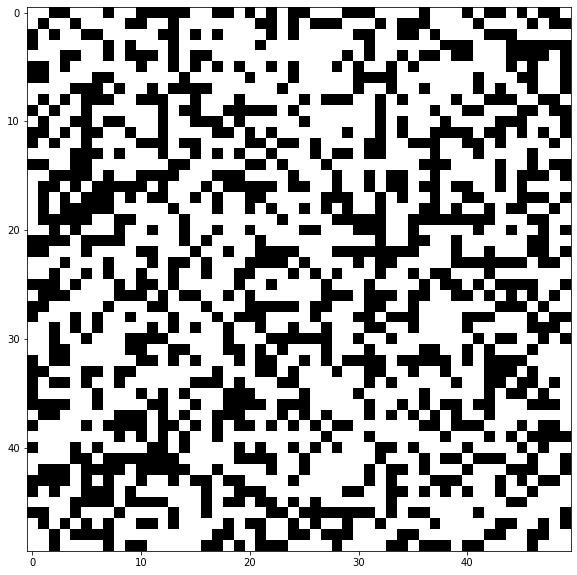

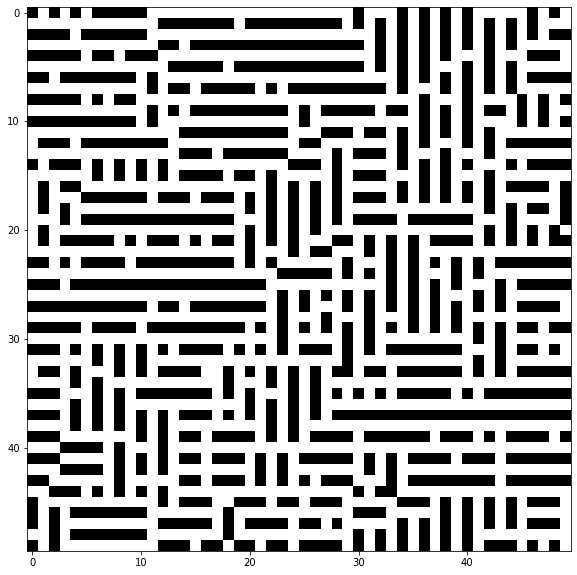

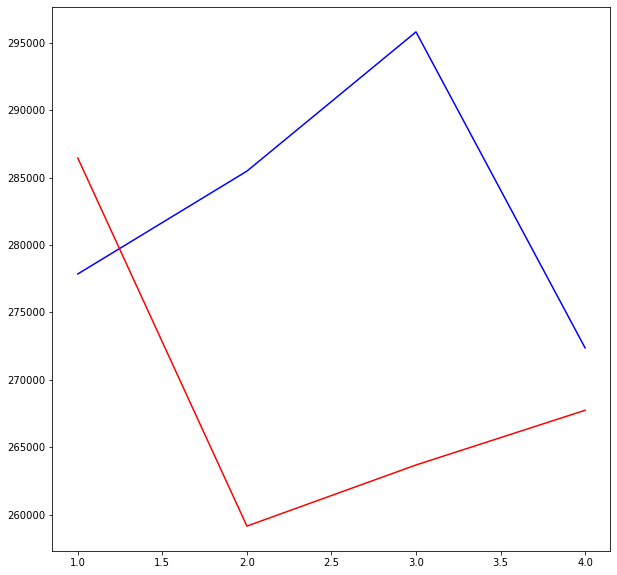

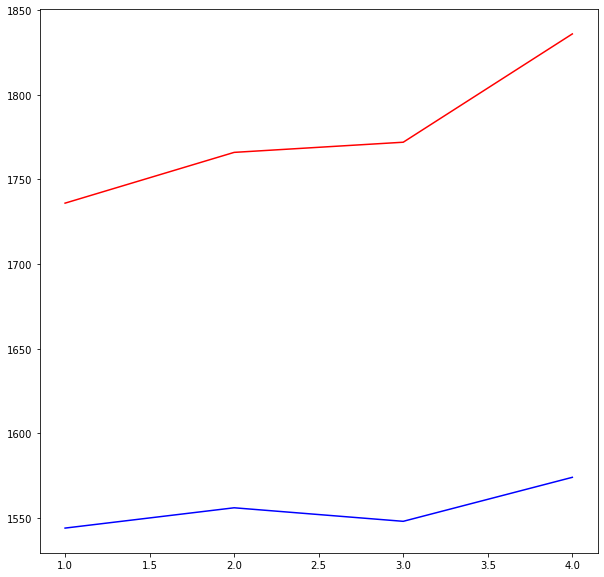

Test parametrów
{'mode': 1, 'k': 1, 'iter': 268399}
550
Test parametrów
{'mode': 1, 'k': 2, 'iter': 250719}
526
Test parametrów
{'mode': 1, 'k': 3, 'iter': 247307}
534
Test parametrów
{'mode': 1, 'k': 4, 'iter': 245874}
556
Test parametrów
{'mode': 2, 'k': 1, 'iter': 246547}
642
Test parametrów
{'mode': 2, 'k': 2, 'iter': 251549}
666
Test parametrów
{'mode': 2, 'k': 3, 'iter': 263179}
656
Test parametrów
{'mode': 2, 'k': 4, 'iter': 261581}
668
Najlepsze parametry
{'mode': 1, 'k': 2, 'iter': 250719}
526
Zależność liczby iteracji od k dla obydwu trybów (niebieski - mode = 1, czerwony - mode = 2)
Zależność energii uzyskanej od k dla obydwu trybów (niebieski - mode = 1, czerwony - mode = 2)


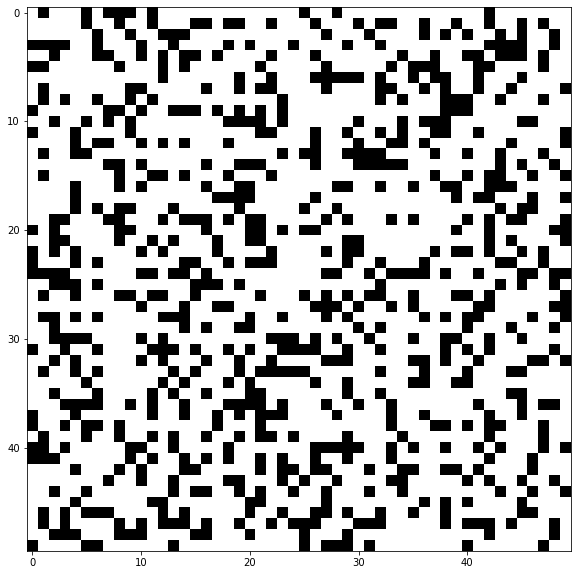

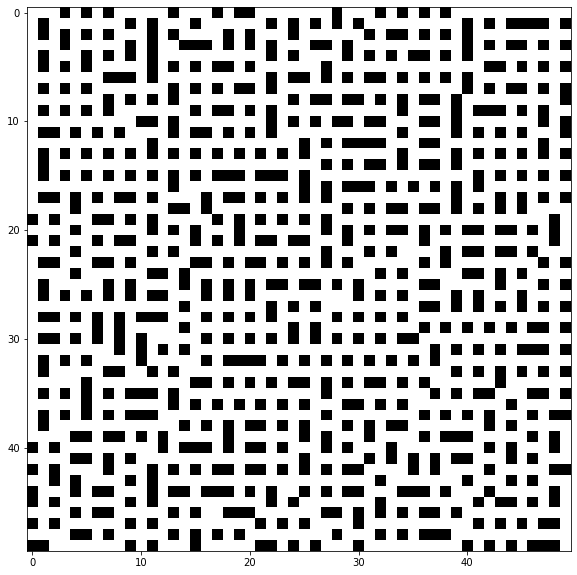

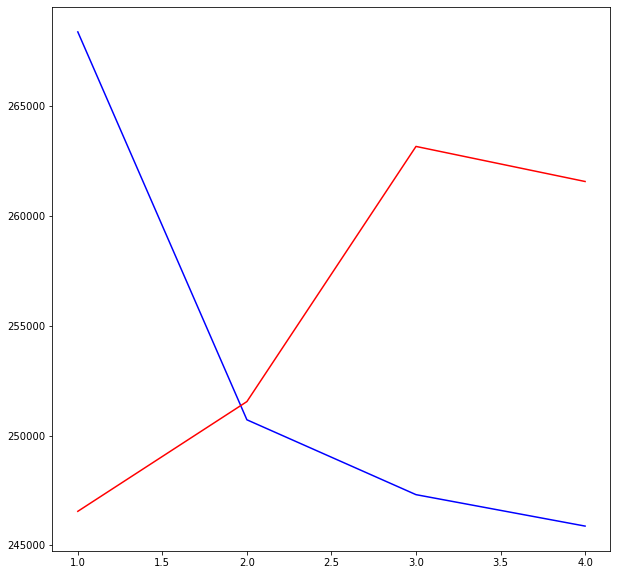

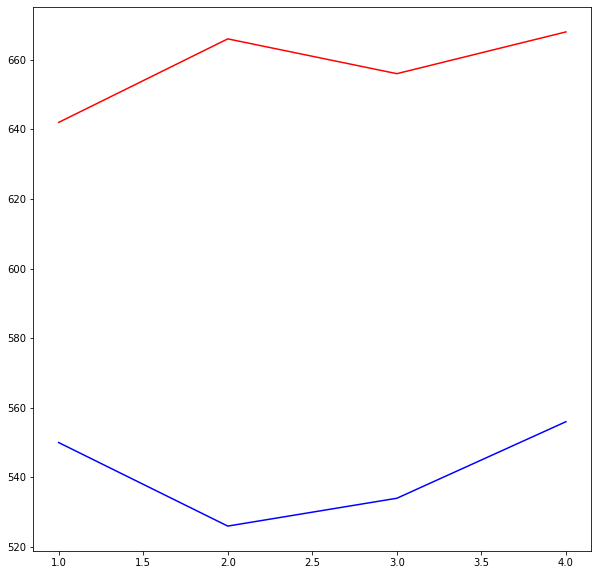

In [42]:
@jit(nopython=True)
def point_energy3 (x, y, size, X):
    e = 0
    
    #4 po bokach
    if X[x-1, y]:
        e += 1
    if X[x, y-1]:
        e += 1
    if X[(x+1)%size, y]:
        e += 1
    if X[x, (y+1)%size]:
        e += 1
        
    #4 na skos
    if X[x-1, y-1]:
        e += 1
    if X[(x+1)%size, (y+1)%size]:
        e += 1
    if X[(x+1)%size, y-1]:
        e += 1
    if X[x-1, (y+1)%size]:
        e += 1
        
    return e

test_BI_mode (gen_image(50, 0.4), point_energy3)
test_BI_mode (gen_image(50, 0.3), point_energy3)

Test parametrów
{'mode': 1, 'k': 1, 'iter': 248323}
3600
Test parametrów
{'mode': 1, 'k': 2, 'iter': 254474}
3602
Test parametrów
{'mode': 1, 'k': 3, 'iter': 260575}
3600
Test parametrów
{'mode': 1, 'k': 4, 'iter': 255393}
3600
Test parametrów
{'mode': 2, 'k': 1, 'iter': 261986}
3640
Test parametrów
{'mode': 2, 'k': 2, 'iter': 237440}
3632
Test parametrów
{'mode': 2, 'k': 3, 'iter': 256771}
3632
Test parametrów
{'mode': 2, 'k': 4, 'iter': 248924}
3658
Najlepsze parametry
{'mode': 1, 'k': 1, 'iter': 248323}
3600
Zależność liczby iteracji od k dla obydwu trybów (niebieski - mode = 1, czerwony - mode = 2)
Zależność energii uzyskanej od k dla obydwu trybów (niebieski - mode = 1, czerwony - mode = 2)


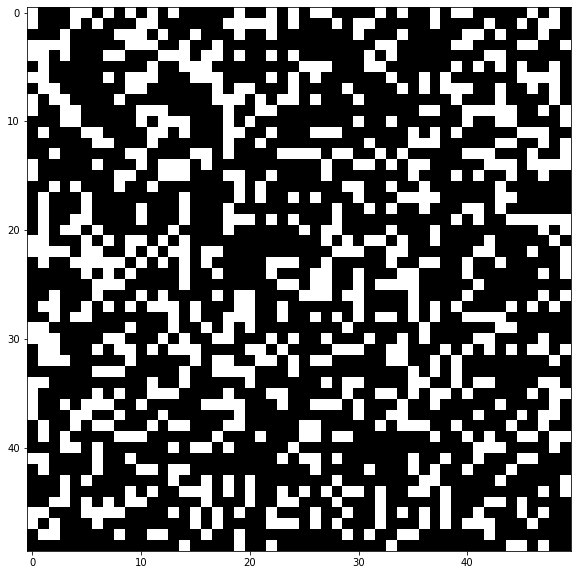

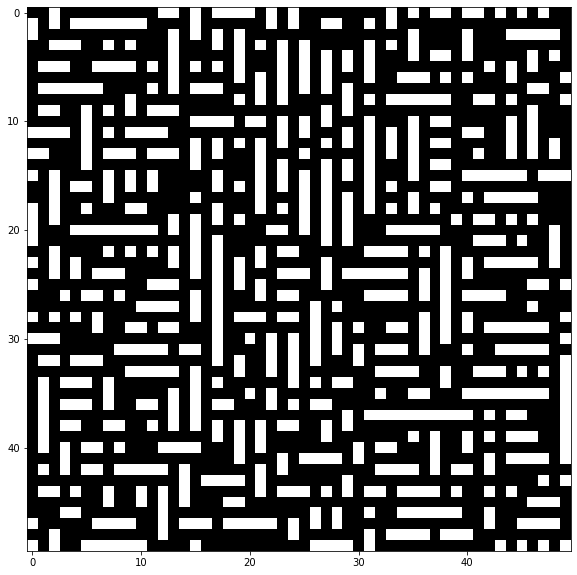

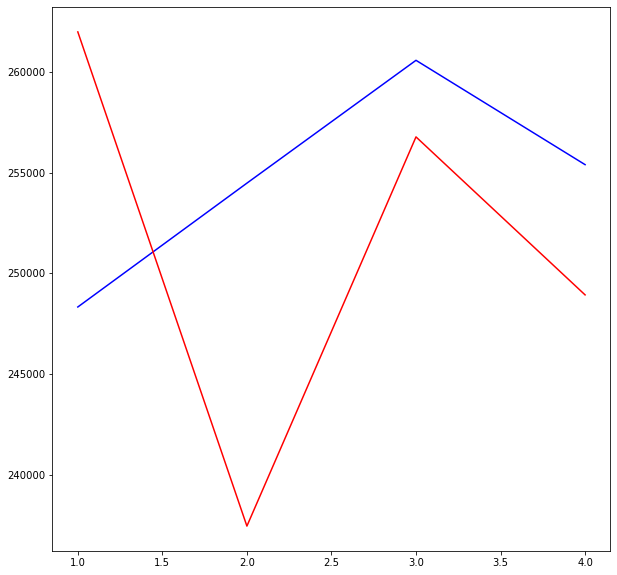

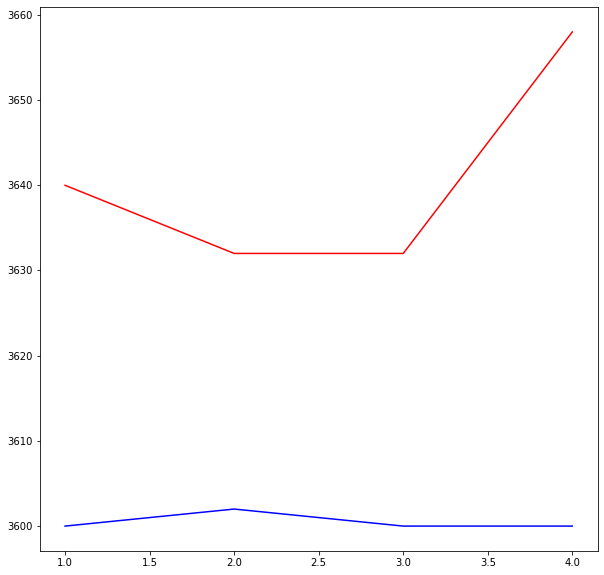

Test parametrów
{'mode': 1, 'k': 1, 'iter': 226765}
0
Test parametrów
{'mode': 1, 'k': 2, 'iter': 223064}
0
Test parametrów
{'mode': 1, 'k': 3, 'iter': 219495}
0
Test parametrów
{'mode': 1, 'k': 4, 'iter': 219450}
0
Test parametrów
{'mode': 2, 'k': 1, 'iter': 229050}
2
Test parametrów
{'mode': 2, 'k': 2, 'iter': 231352}
0
Test parametrów
{'mode': 2, 'k': 3, 'iter': 218289}
4
Test parametrów
{'mode': 2, 'k': 4, 'iter': 222233}
0
Najlepsze parametry
{'mode': 1, 'k': 4, 'iter': 219450}
0
Zależność liczby iteracji od k dla obydwu trybów (niebieski - mode = 1, czerwony - mode = 2)
Zależność energii uzyskanej od k dla obydwu trybów (niebieski - mode = 1, czerwony - mode = 2)


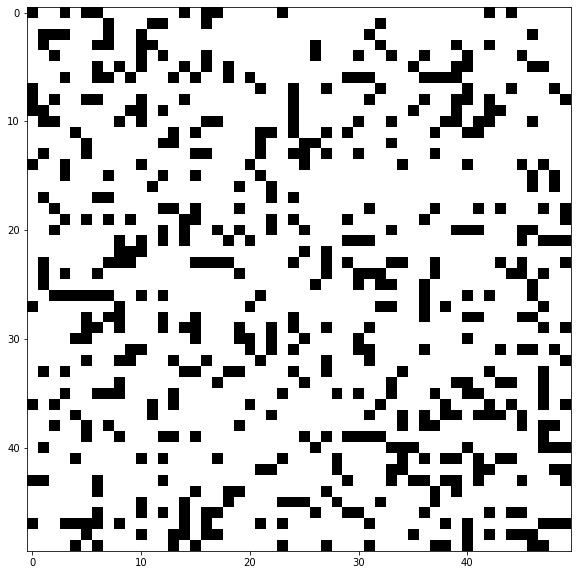

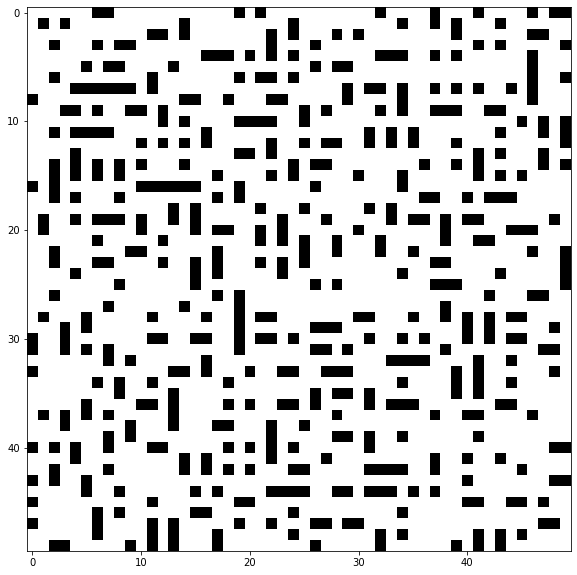

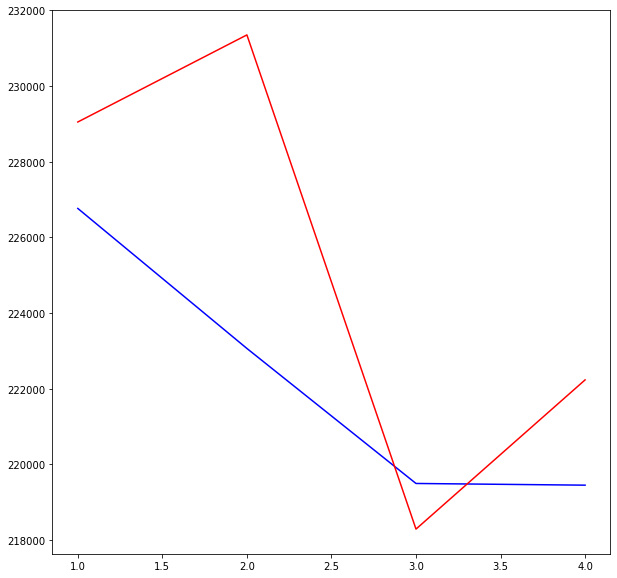

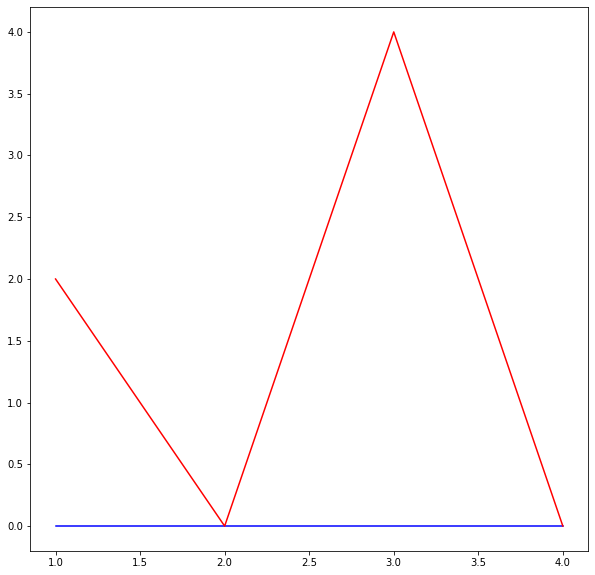

In [43]:
@jit(nopython=True)
def point_energy2 (x, y, size, X):
    e = 0
    
    #4 na skos
    if X[x-1, y-1]:
        e += 1
    if X[(x+1)%size, (y+1)%size]:
        e += 1
    if X[(x+1)%size, y-1]:
        e += 1
    if X[x-1, (y+1)%size]:
        e += 1
        
    return e

test_BI_mode (gen_image(50, 0.7), point_energy2)
test_BI_mode (gen_image(50, 0.2), point_energy2)

Na podstawie testów mogę stwierdzić, że `mode` = 1  i `k` = 2 jest najlepsze, dlatego też w dalszych funkcjach będę takie stosował. Możemy zaobserwować, że dla drugiego sposobu proces jest dużo gorzej zbieżny co możemy ocenić wizualnie po funkcji zmiany energii. Na podstawie wykresów podsumowujących obserwujemy, że dla pierwszego sposobu wyniki są wiele lepsze, nie obserwujemy dużych różnic dla różnych wartości k. Na drugim wykresie z każdego testu linia niebieska jest dużo niżej. Wartość k nie ma dużego wpływu na wartośc uzyskiwanej energii. Liczba iteracji jest różna i ma na to wpływ losowość algorytmu. Ze względów na długi czas działania algorytmu nie przygotowałem zestawienia dla kilkunastu testów na tym samym zestawie danych co pozwoliło by wykluczyć losowość procesu. Na podstawie analizy stwierdzam, że `k` = 2 jest optymalne.

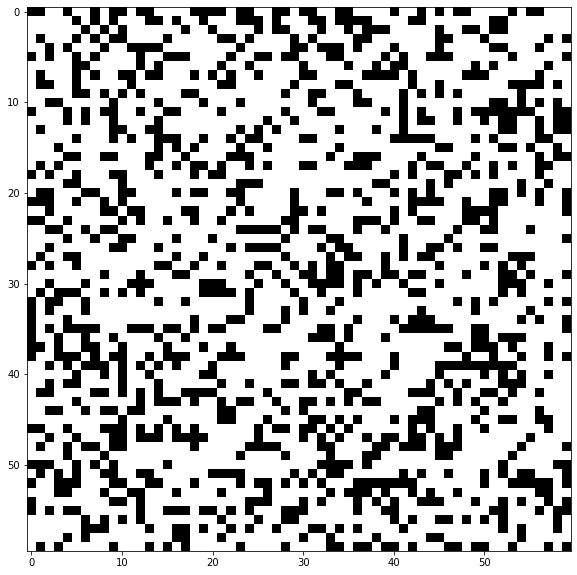

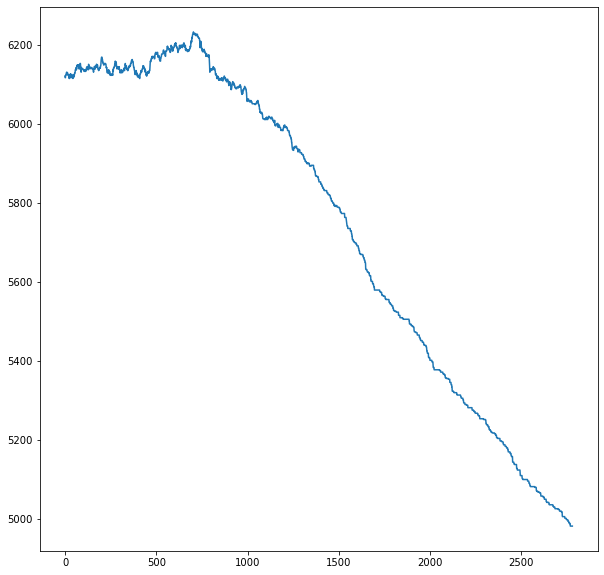

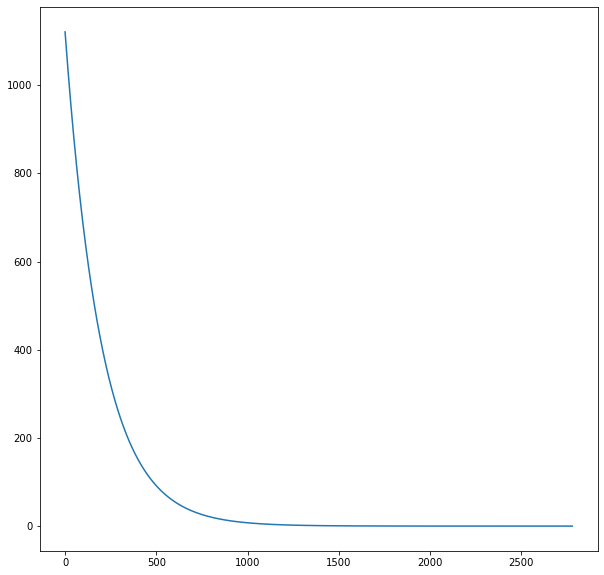

Test parametrów
{'func': 'x : 0.995*x', 'iter': 2779}
4982


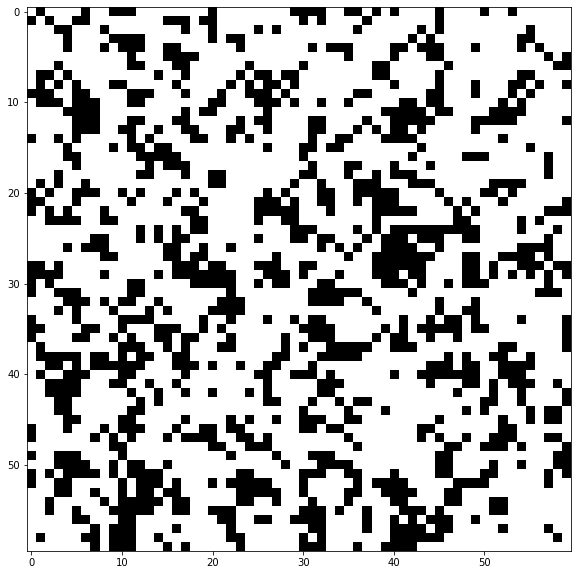

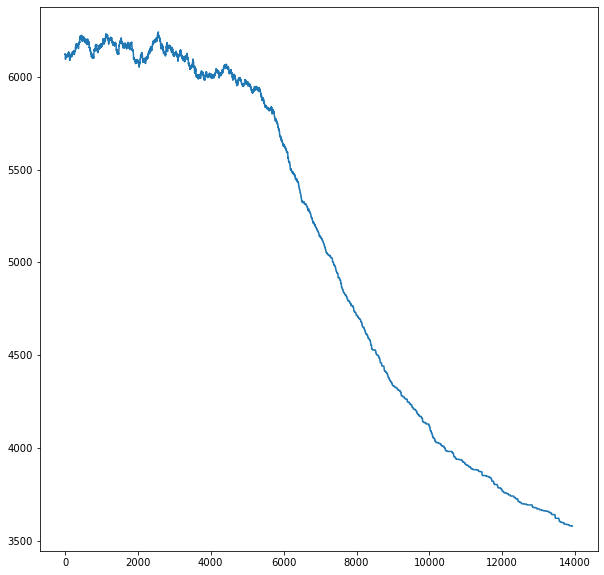

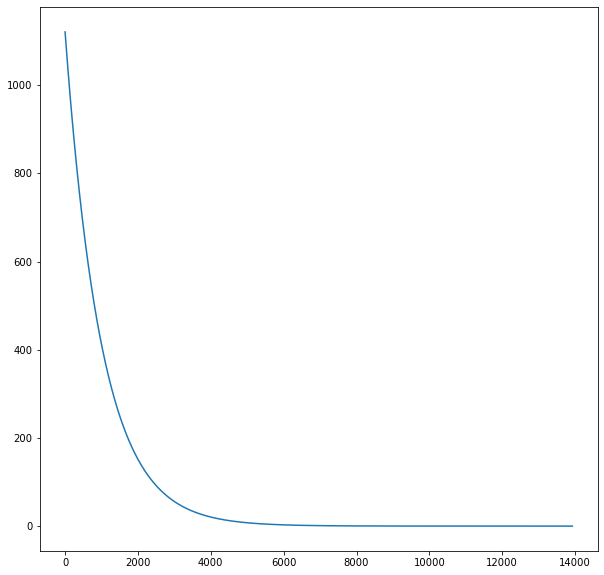

Test parametrów
{'func': 'x : 0.999*x', 'iter': 13923}
3580


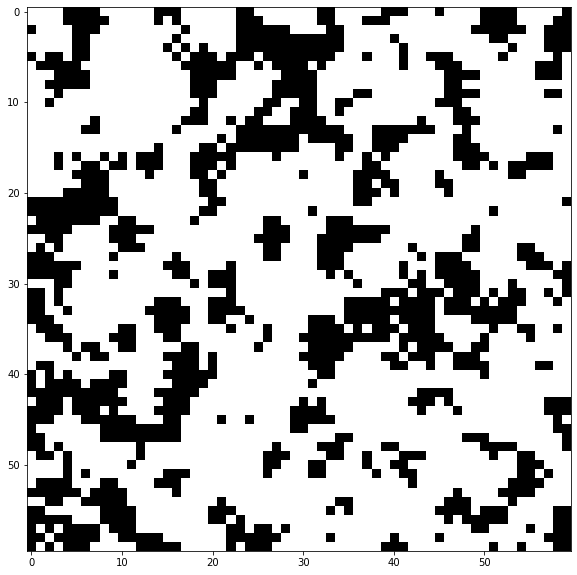

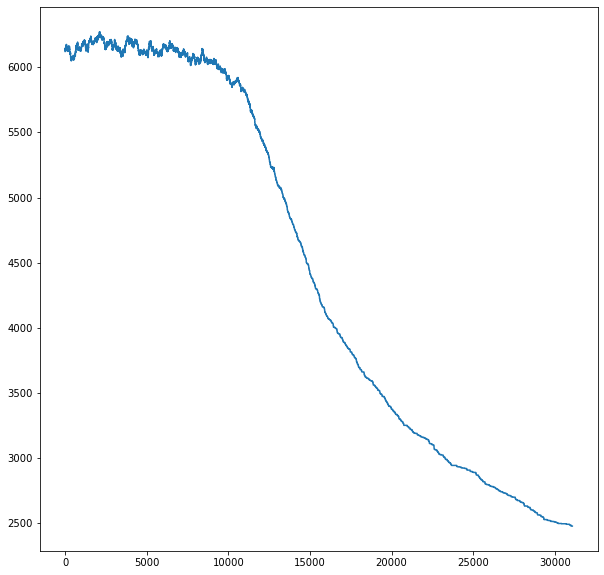

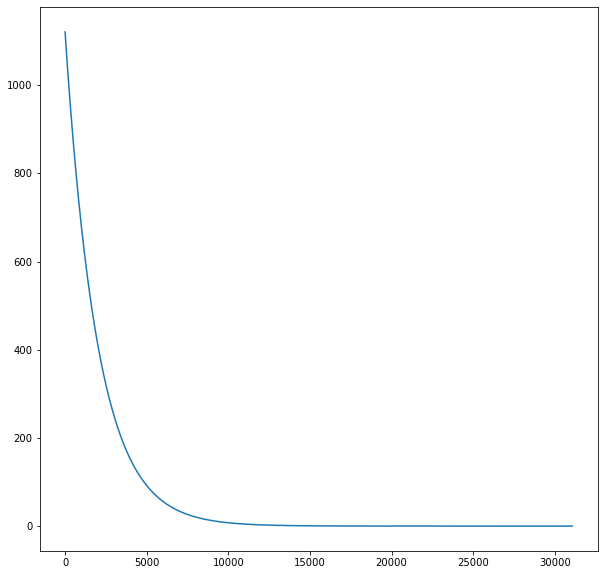

Test parametrów
{'func': 'x : 0.9995*x', 'iter': 31071}
2476


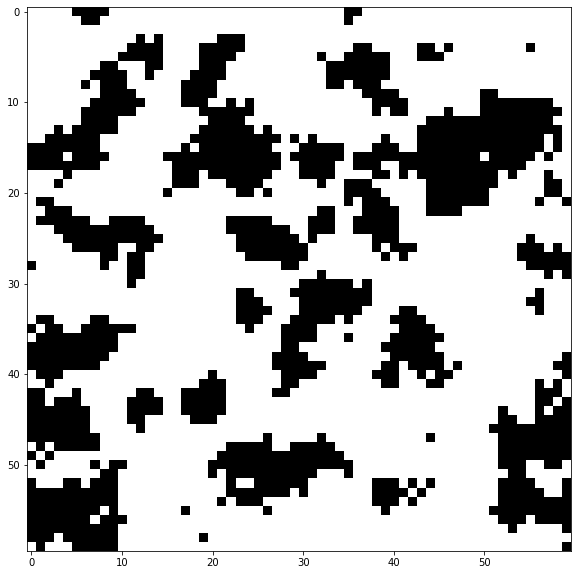

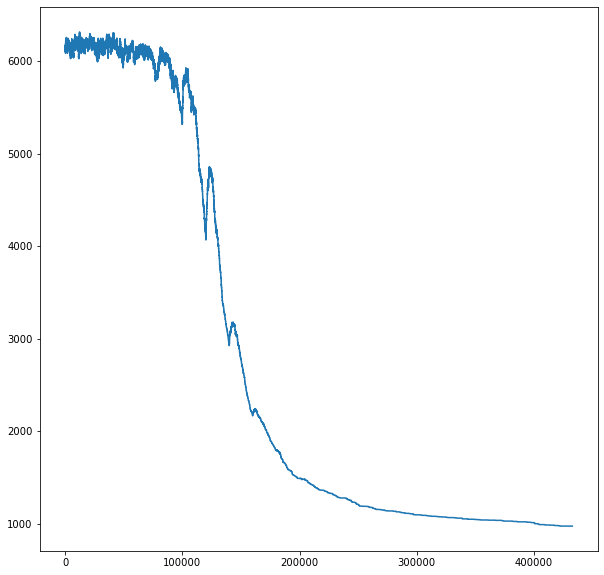

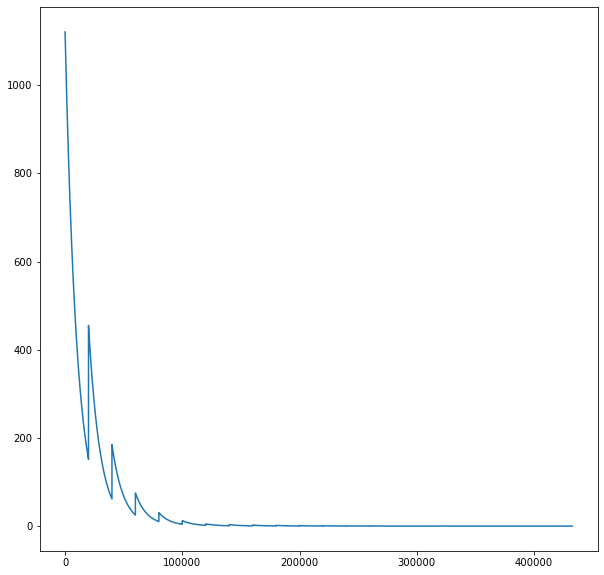

Test parametrów
{'func': 'x : 0.9999*x', 'iter': 432704}
972


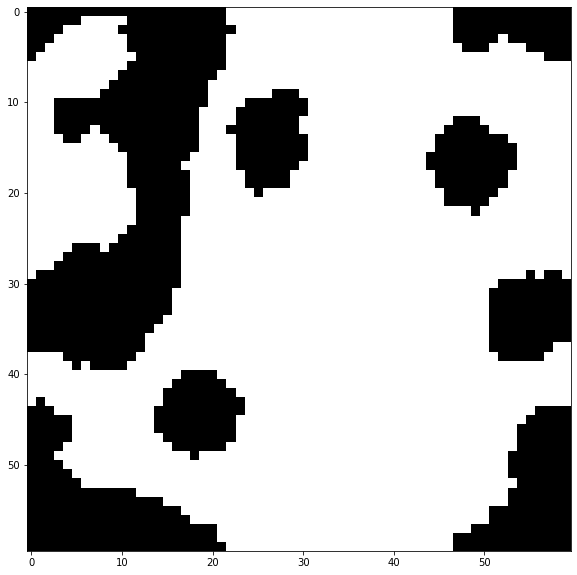

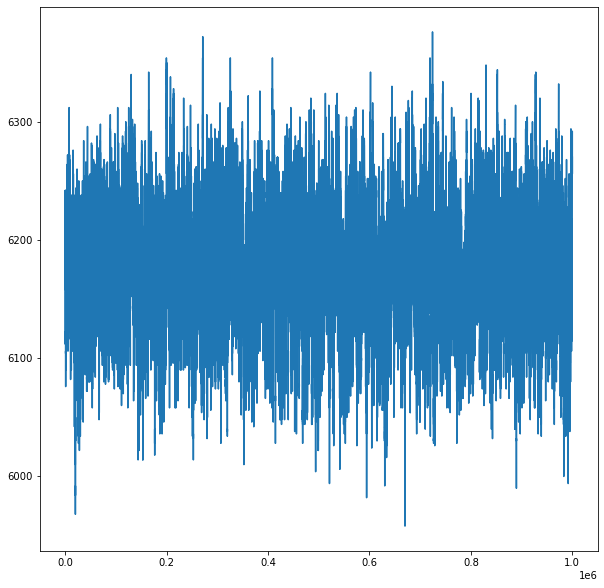

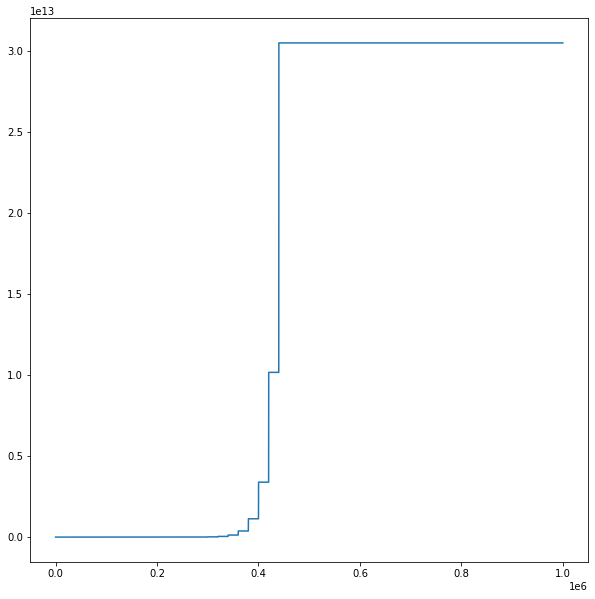

Test parametrów
{'func': 'x : x - 0.005', 'iter': 1000000}
6270


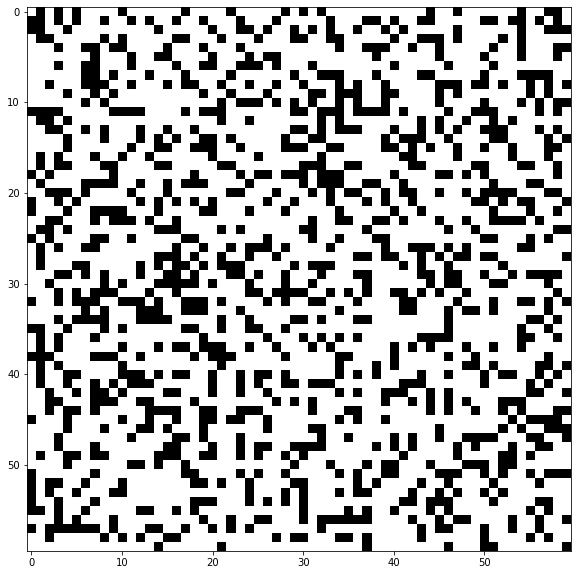

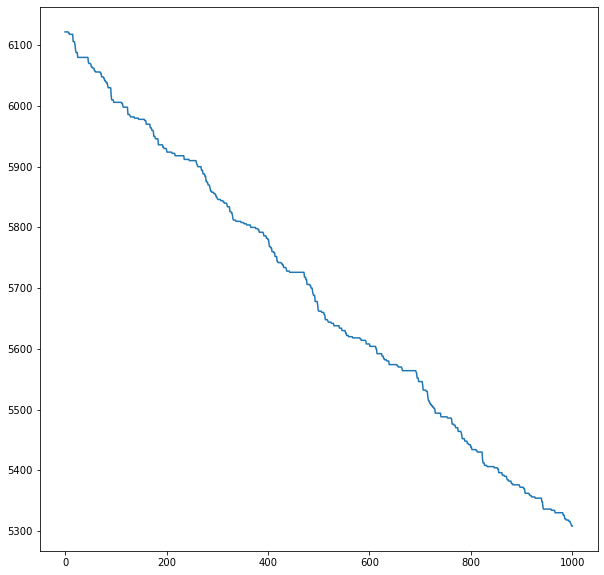

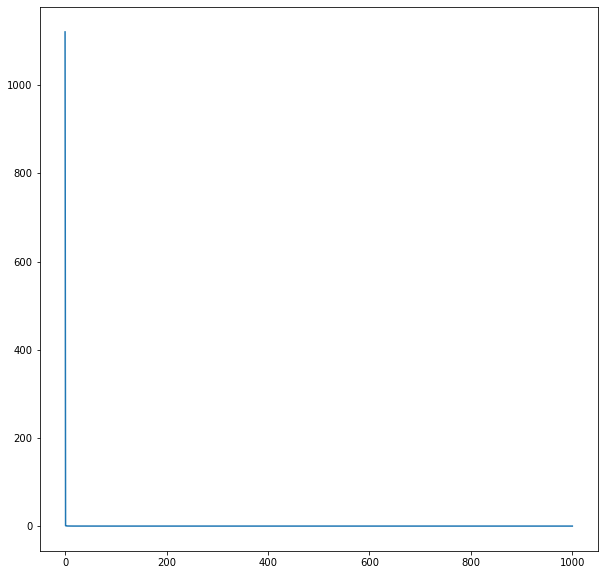

Test parametrów
{'func': 'x : x/(x+1)', 'iter': 1000}
5308


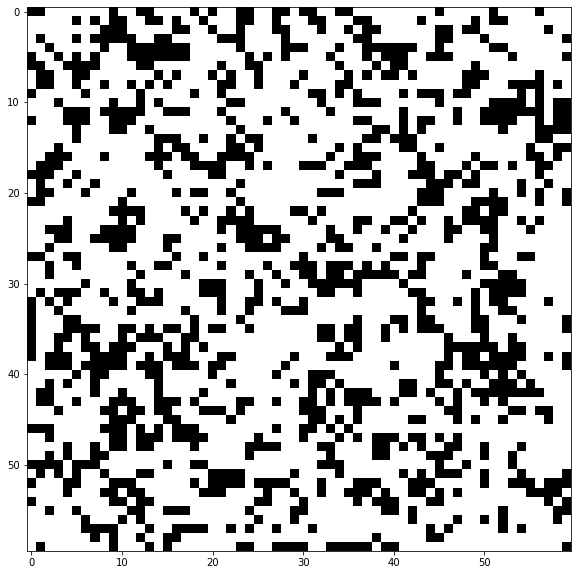

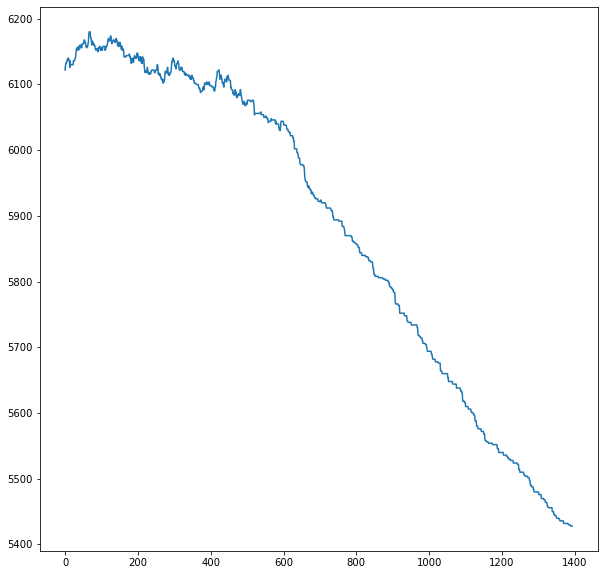

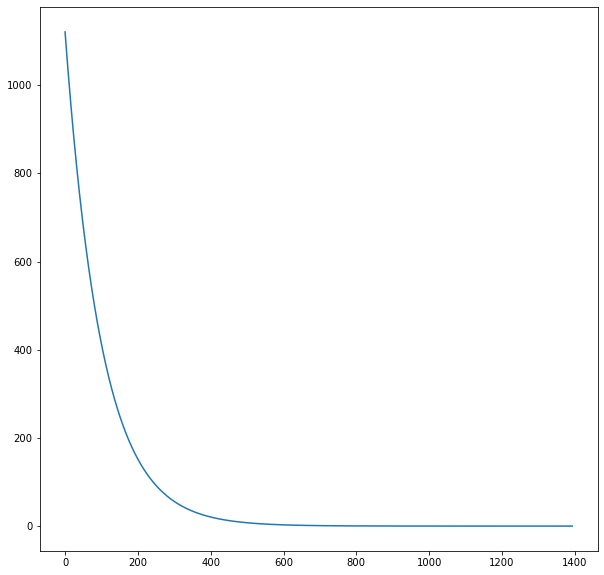

Test parametrów
{'func': 'x : np.exp(np.log(x)-0.01)', 'iter': 1393}
5428
Najlepsze parametry
{'func': 'x : 0.9999*x', 'iter': 432704}
972


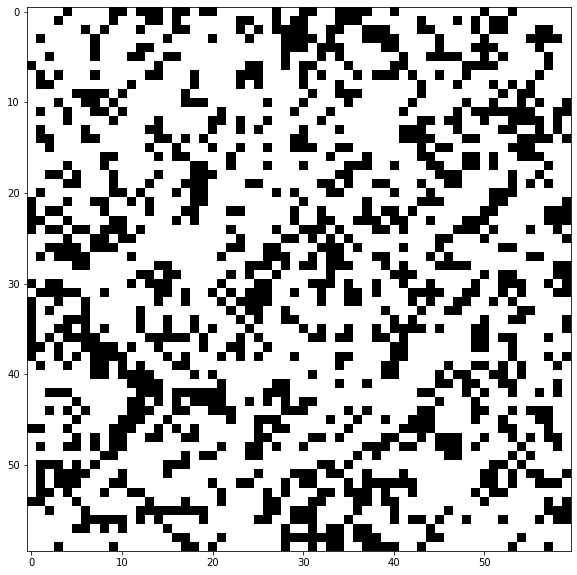

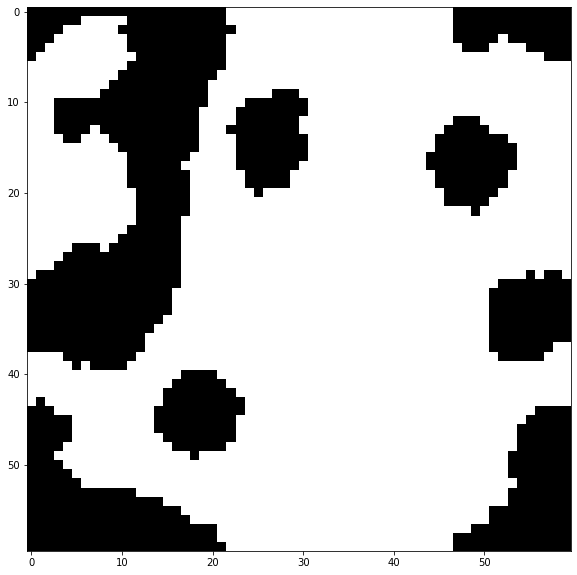

In [45]:
@jit(nopython=True)
def point_energy4 (x, y, size, X):
    e = 0
    
    #4 po bokach
    if not X[x-1, y]:
        e += 1
    if not X[x, y-1]:
        e += 1
    if not X[(x+1)%size, y]:
        e += 1
    if not X[x, (y+1)%size]:
        e += 1
        
    #4 na skos
    if not X[x-1, y-1]:
        e += 1
    if not X[(x+1)%size, (y+1)%size]:
        e += 1
    if not X[(x+1)%size, y-1]:
        e += 1
    if not X[x-1, (y+1)%size]:
        e += 1
        
    return e

test_BI_funct (gen_image(60, 0.25), point_energy4)

Na podstawie powyższego testu widzimy, że podobnie jak dla poprzedniego problemu funkcja 'x : a*x' sprawuje się najlepiej dla odpowiedniego a. Dlatego też dla dalszych obliczeń przyjmę a = 0.9999. Możemy zauważyć, że dla mniejszego a obraz zmienia się i pojawiają się czarne "wyspy". Jednakże dla a = 0.999 są one niewielkie i bardzo liczne. Im a zbliża się bardziej do 1 uzyskujemy większe wyspy by dla a = 0.9999 zaobserwować duże czarne plamy, których jest kilka. Dla innych funkcji zmiany temperatury obraz zmienia się niewiele i nie uzyskujemy oczekiwanego efektu wizualnego.

### Testy

Funkcja `gen_image` generuje obraz w postaci tablicy NumPy. Funkcja `test_BI` tworzy jeden obraz i wywołuje na nim algorytm wyżarzania. Parametry temperatury przyjmuje jak w testach powyżej. Na podstawie testów powyżej wybieram funkcję spadku temperatury jako: "x : 0.9999*x" oraz szukanie stanów sąsiednich metodą 1 dla k wynoszącego 2, Testy przeprowadzam dla sigma równego 0.1, 0.3 i 0.4 oraz różnych funkcji liczenia kosztu. Koszt zawsze liczony jako suma kosztu dla każdego czarnego pola.

In [46]:
def test_BI (n, sigma, point_energy):
    image = gen_image (n, sigma)
    plt.figure(3, figsize=(10,10))
    plt.imshow(1 - image, cmap=plt.cm.gray)
    BI = BinaryImage(image, point_energy, mode = 1, k = 2, temperature = np.sum(image), visual = 0, stop = 0.001)
    new_image, energy, n = BI.anneal()
    print ("Uzyskano energię", energy, "po", n, "iteracjach.")
    plt.figure(4, figsize=(10,10))
    plt.imshow(1 - new_image, cmap=plt.cm.gray)
    plt.show ()

#### 4 - sąsiedztwo

Energia pola to suma czarnych pól mających wspólny bok z zadanym. Spodziewamy się jedynie sąsiadów po skosie w najbliższym sąsiedztwie i to udaje się osiągnąć na ile to możliwe algorytmem wyżarzania.

Uzyskano energię 0 po 135797 iteracjach.


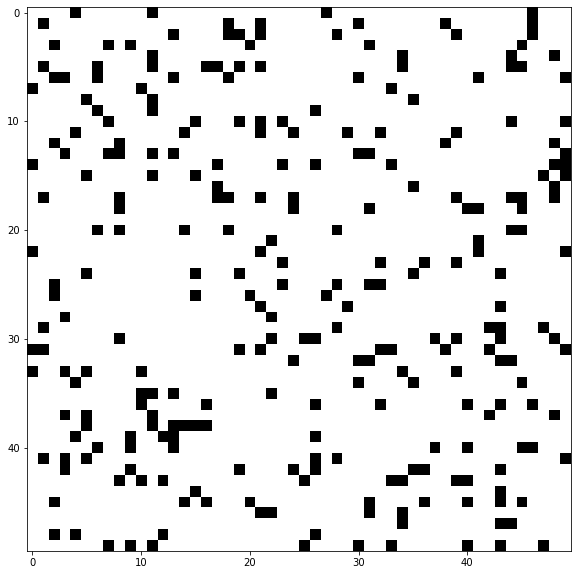

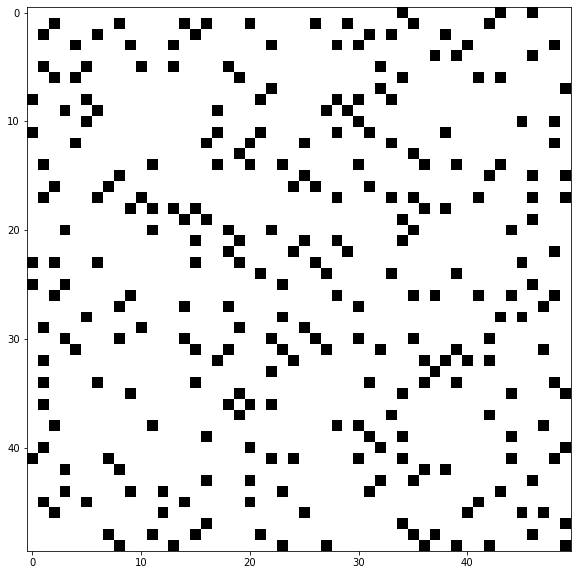


*****************

Uzyskano energię 0 po 241132 iteracjach.


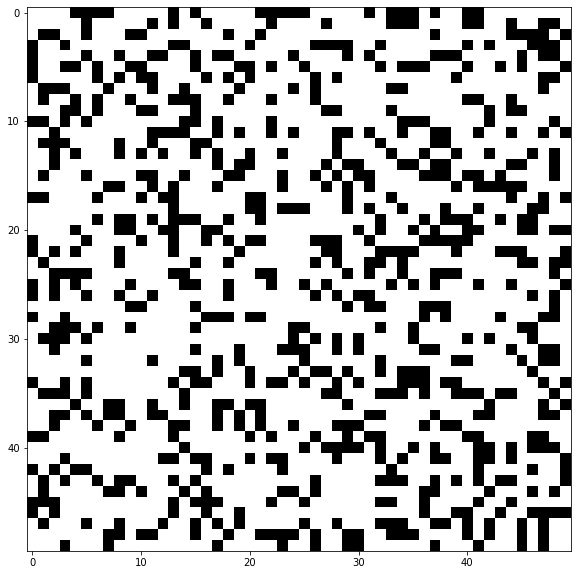

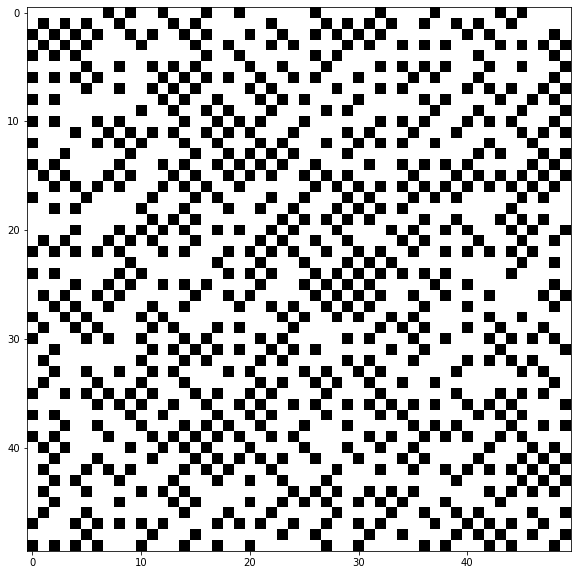


*****************

Uzyskano energię 2 po 270464 iteracjach.


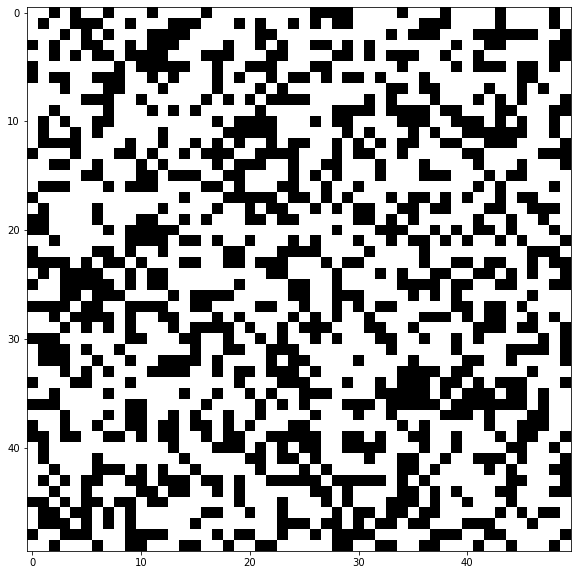

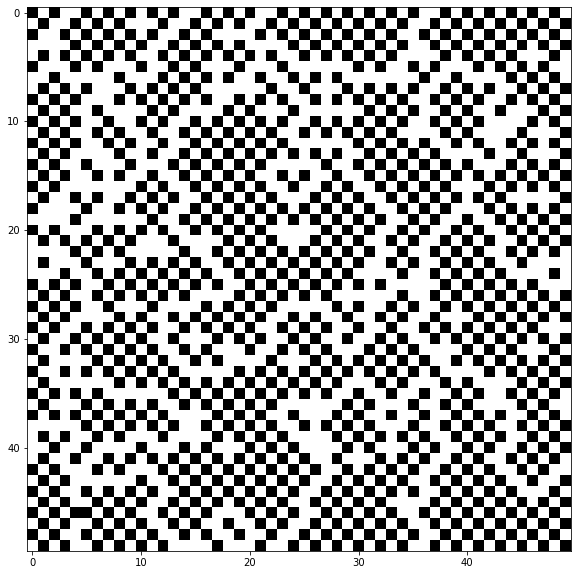

In [47]:
@jit(nopython=True)
def point_energy1 (x, y, size, X):
    e = 0
    
    #4 po bokach
    if X[x-1, y]:
        e += 1
    if X[x, y-1]:
        e += 1
    if X[(x+1)%size, y]:
        e += 1
    if X[x, (y+1)%size]:
        e += 1
    
    return e

test_BI (50, 0.1, point_energy1)
print ()
print ("*****************")
print ()
test_BI (50, 0.3, point_energy1)
print ()
print ("*****************")
print ()
test_BI (50, 0.4, point_energy1)

#### 4 - sąsiedztwo na krzyż

Energia pola to suma czarnych pól leżących najbliżej możliwie zadanego na skos. Jest to przykład podobny do tego wyże. W tym wypadku sąsiedzi będą tylko tacy którzy mają wspólny bok. Uzyskujemy "wężyki" z pikseli.

Uzyskano energię 0 po 139499 iteracjach.


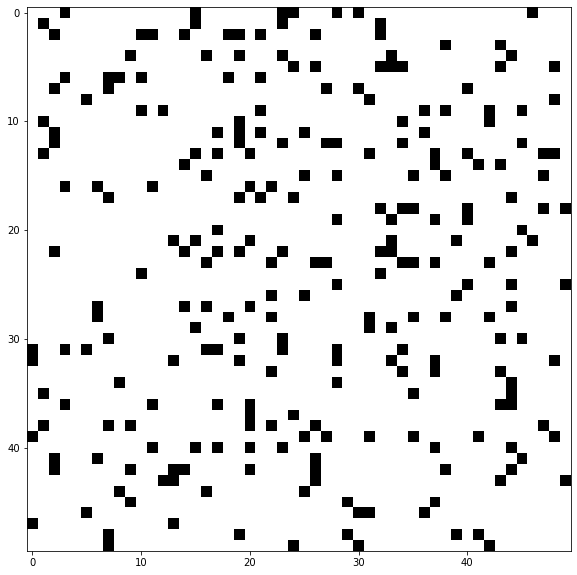

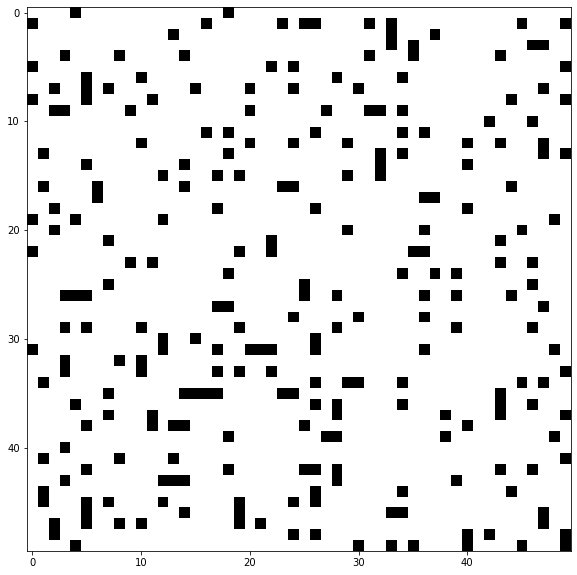


*****************

Uzyskano energię 0 po 234886 iteracjach.


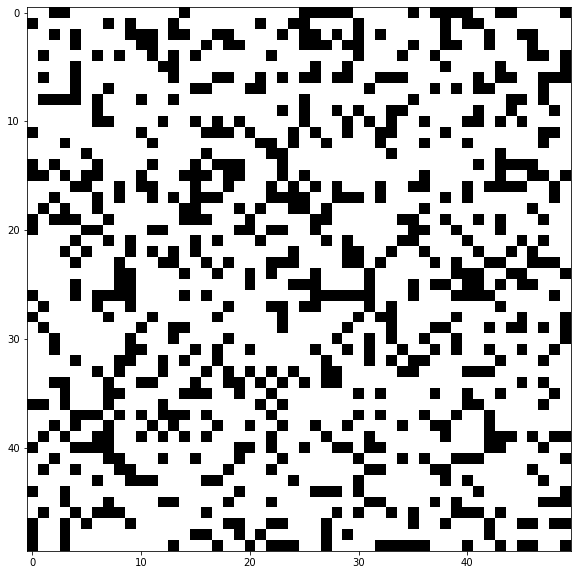

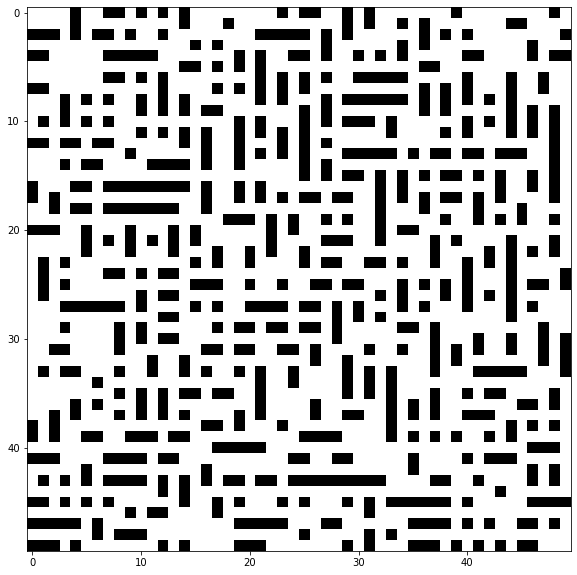


*****************

Uzyskano energię 4 po 281849 iteracjach.


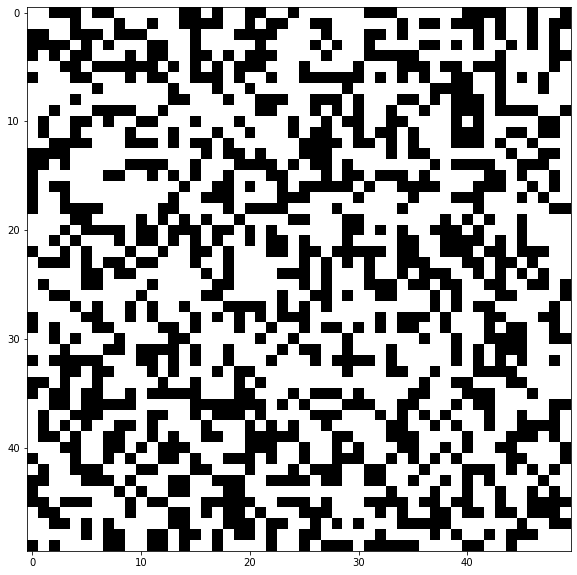

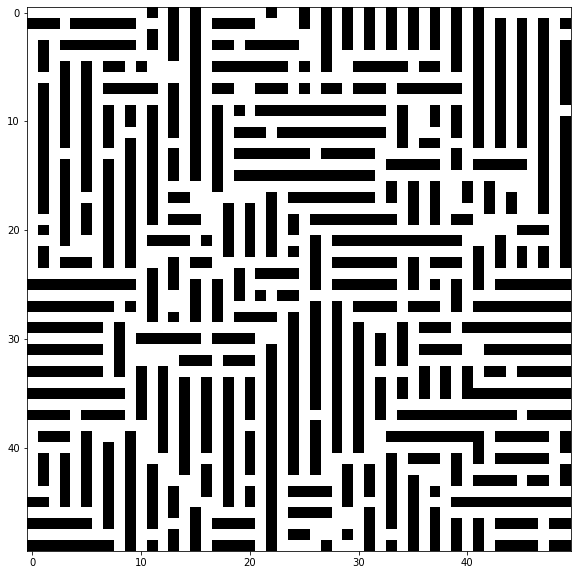

In [48]:
@jit(nopython=True)
def point_energy2 (x, y, size, X):
    e = 0
    
    #4 na skos
    if X[x-1, y-1]:
        e += 1
    if X[(x+1)%size, (y+1)%size]:
        e += 1
    if X[(x+1)%size, y-1]:
        e += 1
    if X[x-1, (y+1)%size]:
        e += 1
        
    return e

test_BI (50, 0.1, point_energy2)
print ()
print ("*****************")
print ()
test_BI (50, 0.3, point_energy2)
print ()
print ("*****************")
print ()
test_BI (50, 0.4, point_energy2)

#### 8 - sąsiedztwo

Energia pola to suma czarnych pól otaczających zadane pole. Oczekujemy, że każdy punkt będzie odseparowany od innych. Jest to niemożliwe dla większej sigmy. Uzyskujemy wtedy efekt podobny do przykładu wyżej, tylko "wężyki" są krótsze i pojawiają się punkty z sąsiedztwem na skos.

Uzyskano energię 0 po 116609 iteracjach.


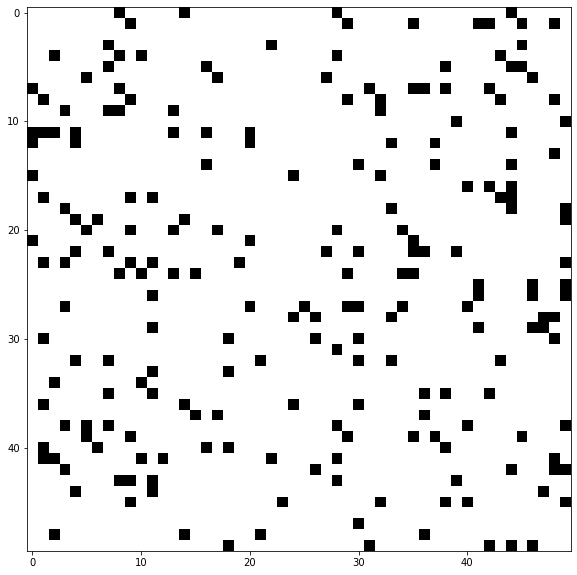

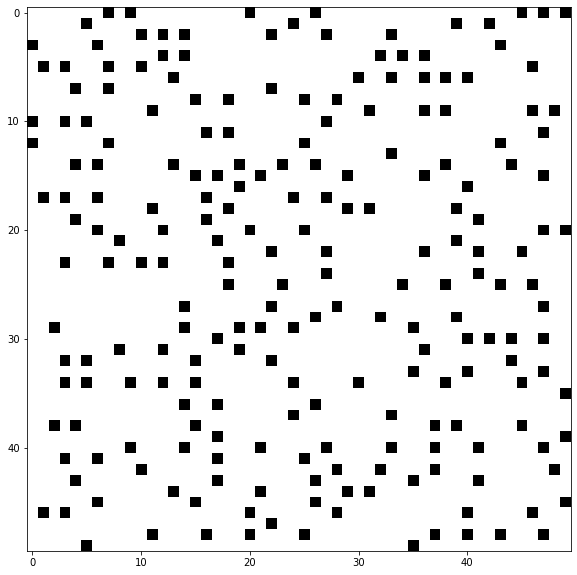


*****************

Uzyskano energię 456 po 293880 iteracjach.


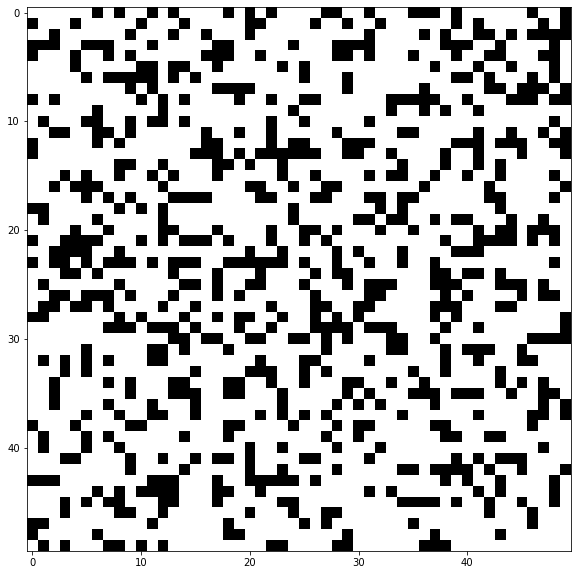

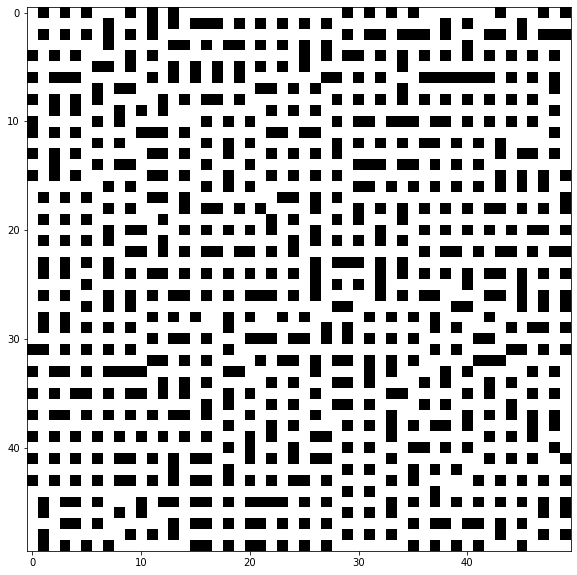


*****************

Uzyskano energię 1298 po 302107 iteracjach.


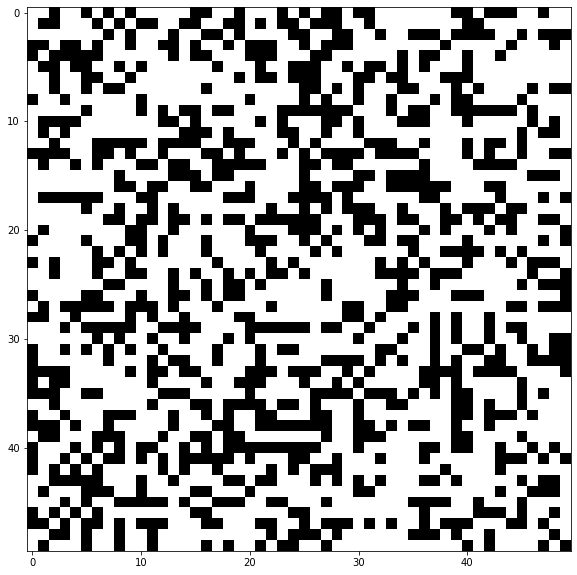

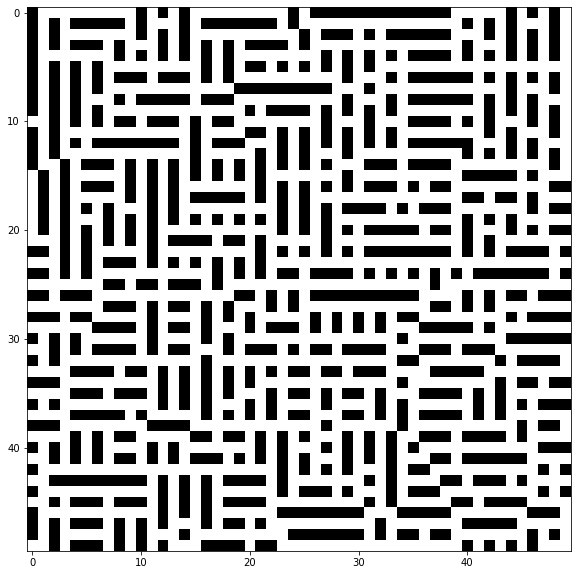

In [49]:
@jit(nopython=True)
def point_energy3 (x, y, size, X):
    e = 0
    
    #4 po bokach
    if X[x-1, y]:
        e += 1
    if X[x, y-1]:
        e += 1
    if X[(x+1)%size, y]:
        e += 1
    if X[x, (y+1)%size]:
        e += 1
        
    #4 na skos
    if X[x-1, y-1]:
        e += 1
    if X[(x+1)%size, (y+1)%size]:
        e += 1
    if X[(x+1)%size, y-1]:
        e += 1
    if X[x-1, (y+1)%size]:
        e += 1
        
    return e

test_BI (50, 0.1, point_energy3)
print ()
print ("*****************")
print ()
test_BI (50, 0.3, point_energy3)
print ()
print ("*****************")
print ()
test_BI (50, 0.4, point_energy3)

#### Białe pola

Energia pola to suma białych pól otaczających zadane pole. Oczekujemy połączenia się wszystkich czarnych pól w jedną dużą plamę. Idealnie by było, gdyby ta plama była w kształcie koła jednakże nie uzyskujemy, aż tak dobrego efektu. W wyniku pojawia się kilka czarnych "wysp".

Uzyskano energię 492 po 167904 iteracjach.


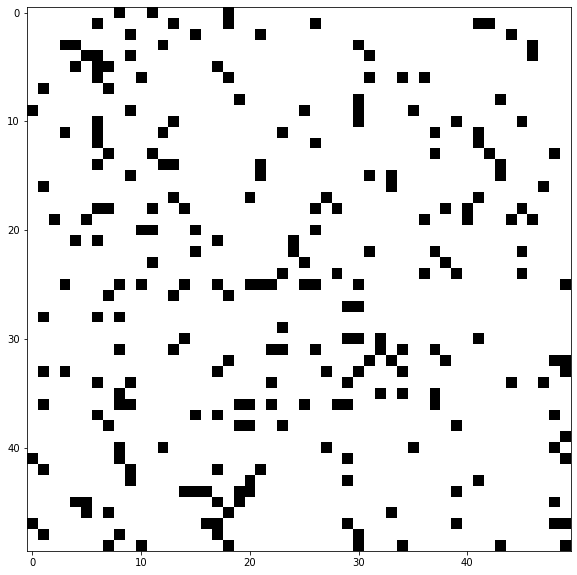

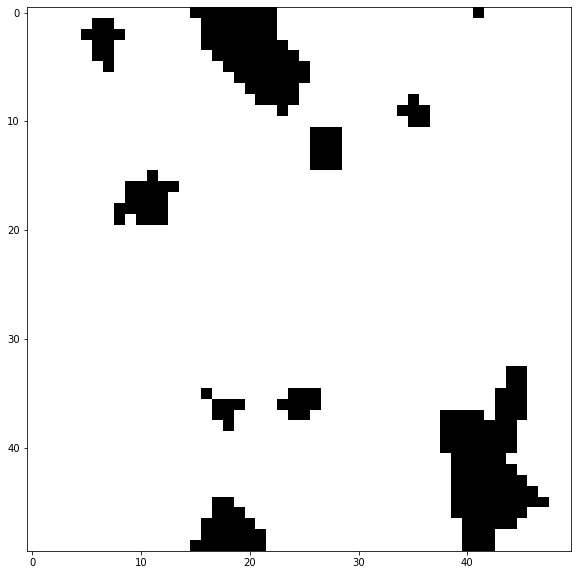


*****************

Uzyskano energię 578 po 329773 iteracjach.


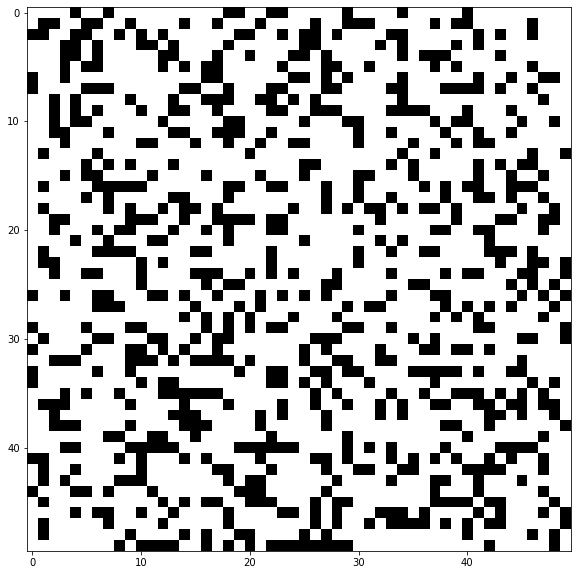

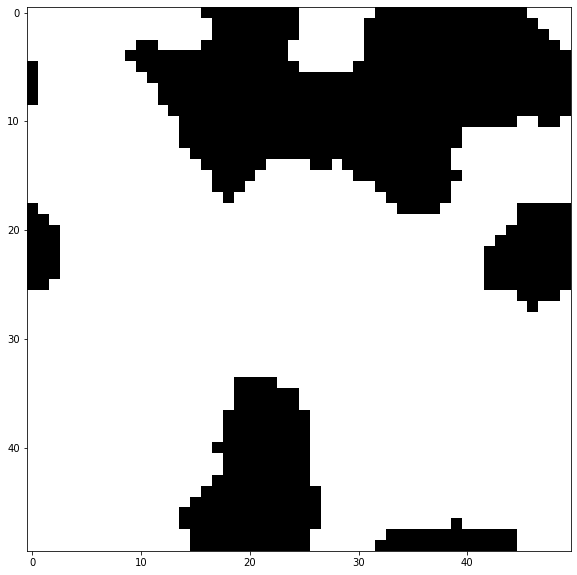


*****************

Uzyskano energię 630 po 374710 iteracjach.


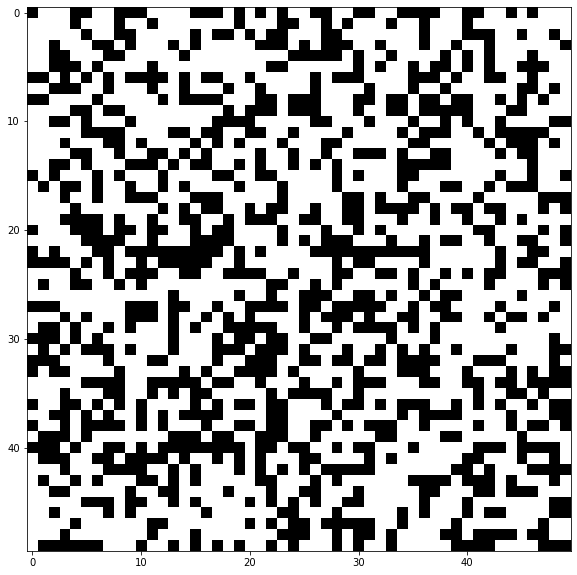

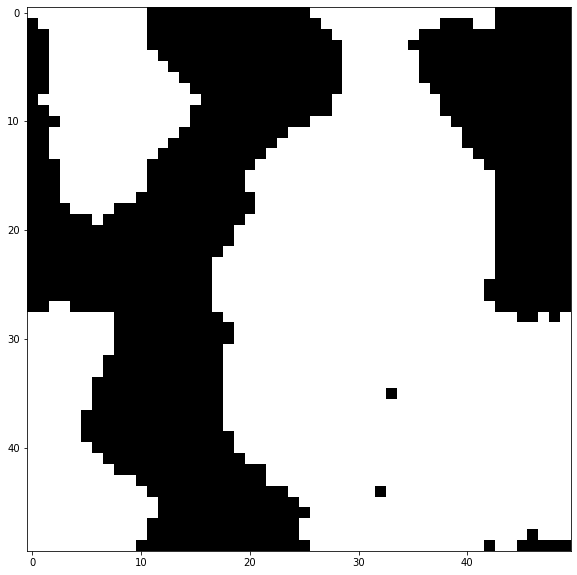

In [50]:
@jit(nopython=True)
def point_energy4 (x, y, size, X):
    e = 0
    
    #4 po bokach
    if not X[x-1, y]:
        e += 1
    if not X[x, y-1]:
        e += 1
    if not X[(x+1)%size, y]:
        e += 1
    if not X[x, (y+1)%size]:
        e += 1
        
    #4 na skos
    if not X[x-1, y-1]:
        e += 1
    if not X[(x+1)%size, (y+1)%size]:
        e += 1
    if not X[(x+1)%size, y-1]:
        e += 1
    if not X[x-1, (y+1)%size]:
        e += 1
        
    return e

test_BI (50, 0.1, point_energy4)
print ()
print ("*****************")
print ()
test_BI (50, 0.3, point_energy4)
print ()
print ("*****************")
print ()
test_BI (50, 0.4, point_energy4)

#### 8-16 sąsiedztwo

Energia pola to suma wystąpień czarnych pól w 8-16 sąsiedztwie. Powinno to stworzyć punkty odseparowane od siebie na odległość dwóch pól. Jest to nierealne ze względu na sigmę więc dostajemy punkty łączące się w linie ze "zgrubieniami" na tych liniach które tworzą takie "odseparowane" grupy punktów ale są one połączone ze względu na sigmę.

Uzyskano energię 84 po 184637 iteracjach.


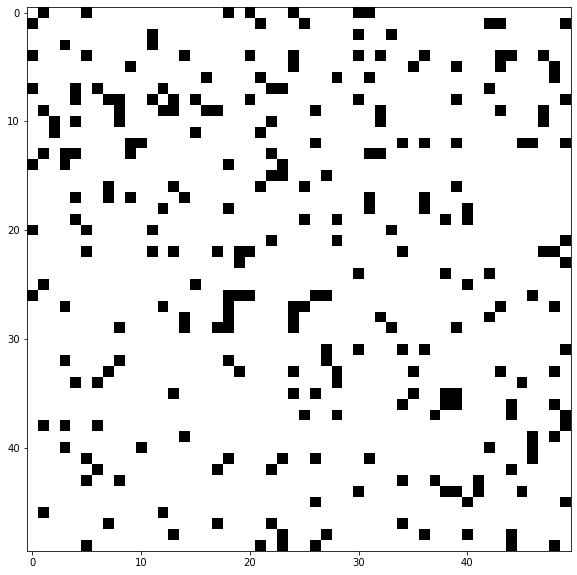

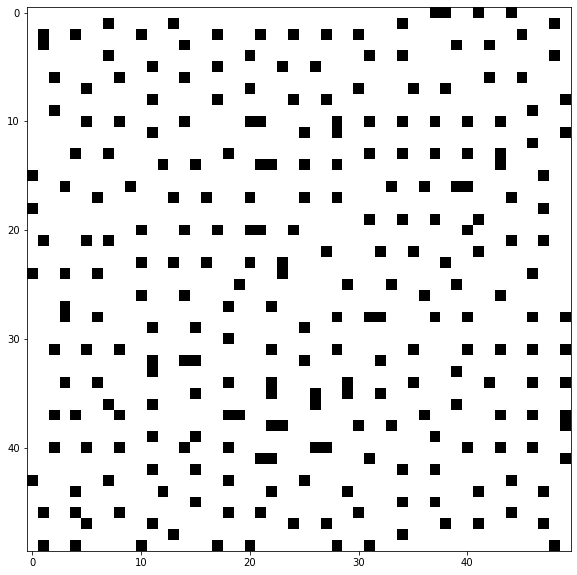


*****************

Uzyskano energię 2655 po 329636 iteracjach.


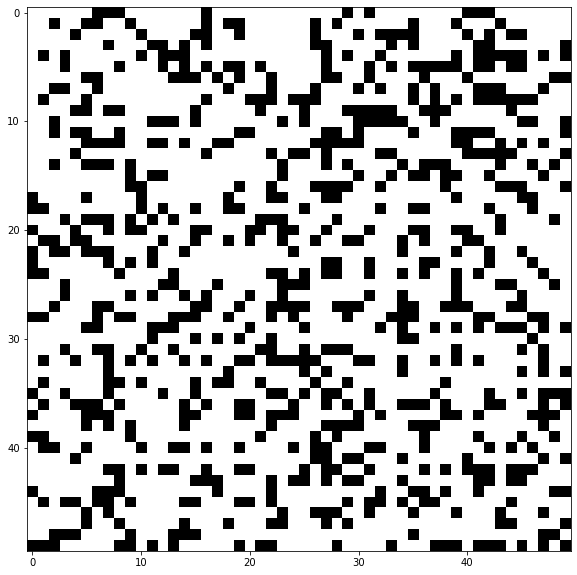

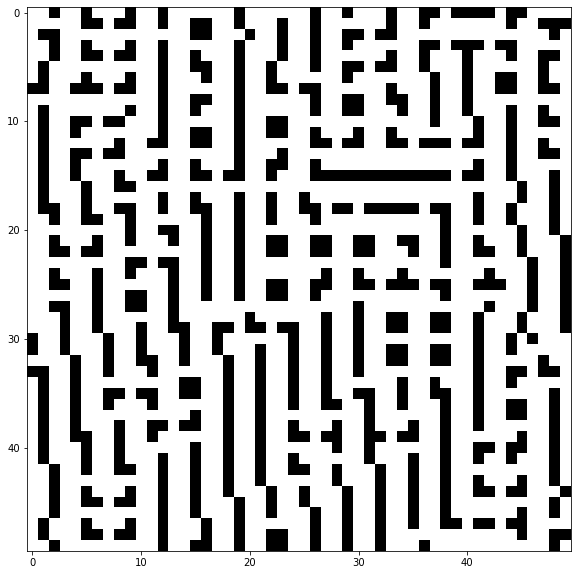


*****************

Uzyskano energię 6408 po 294448 iteracjach.


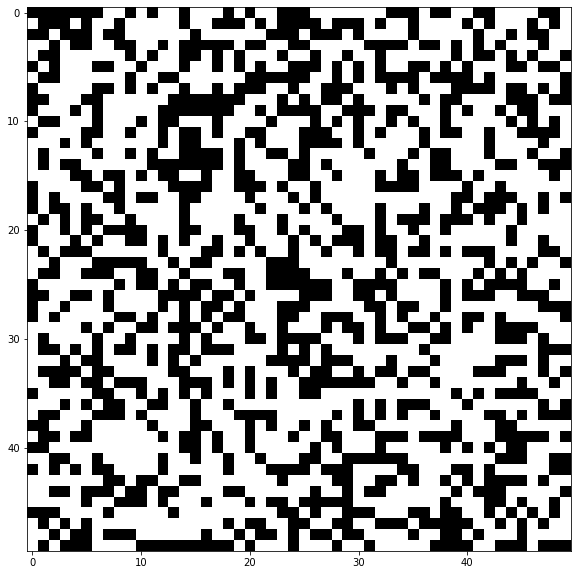

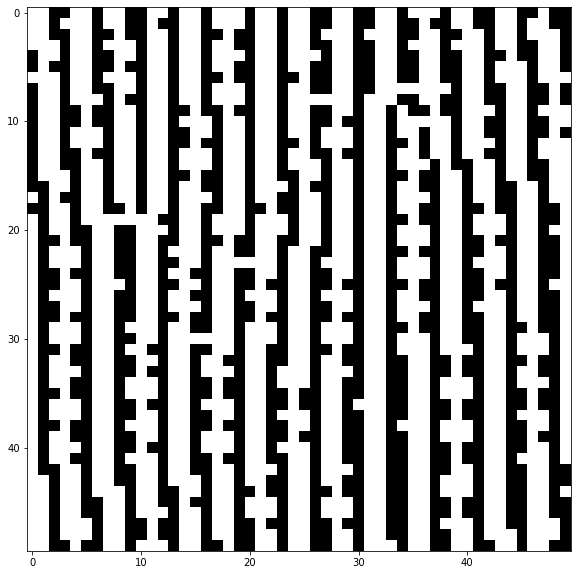

In [51]:
@jit(nopython=True)
def point_energy5 (x, y, size, X):
    e = 0
    #4 po bokach
    if X[x-1, y]:
        e += 1
    if X[x, y-1]:
        e += 1
    if X[(x+1)%size, y]:
        e += 1
    if X[x, (y+1)%size]:
        e += 1
        
    #4 na skos
    if X[x-1, y-1]:
        e += 1
    if X[(x+1)%size, (y+1)%size]:
        e += 1
    if X[(x+1)%size, y-1]:
        e += 1
    if X[x-1, (y+1)%size]:
        e += 1
        
    #4 dalej na skos
    if X[x-2, y-2]:
        e += 1
    if X[(x+2)%size, (y+2)%size]:
        e += 1
    if X[(x+2)%size, y-2]:
        e += 1
    if X[x-2, (y+2)%size]:
        e += 1
        
    #4 dalej po bokach
    if X[x-2, y]:
        e += 1
    if X[x, y-2]:
        e += 1
    if X[(x+2)%size, y]:
        e += 1
    if X[x, (y+2)%size]:
        e += 1
        
    #po dwa
    #góra
    if X[x-1, y-2]:
        e += 1
    if X[(x+1)%size, y-2]:
        e += 1
    #prawo
    if X[(x+2)%size, (y+2)%size]:
        e += 1
    if X[(x+2)%size, y+2]:
        e += 1
    #dół
    if X[x-1, (y+2)%size]:
        e += 1
    if X[(x+1)%size, (y+2)%size]:
        e += 1
    #lewo
    if X[x-2, y-1]:
        e += 1
    if X[x-2, (y+1)%size]:
        e += 1
    
    return e

test_BI (50, 0.1, point_energy5)
print ()
print ("*****************")
print ()
test_BI (50, 0.3, point_energy5)
print ()
print ("*****************")
print ()
test_BI (50, 0.4, point_energy5)

#### 16 sąsiedztwo

Energia pola to suma wystąpień czarnych pól w 16 sąsiedztwie. Taka funkcja powinna sprawić połączenie punktów w grupy po kilka punktów na pierwszy rzut oka. Jednak nie jest to takie proste bo punkty na zewnątrz miały by sporą energię. W efekcie uzyskujemy to czego się spodziewalismy, jednakże dla wiekszej sigmy dodatkowo połączone są liniami te grupy punktów. Efekt podobny do przykładu wcześniej.

Uzyskano energię 1 po 144358 iteracjach.


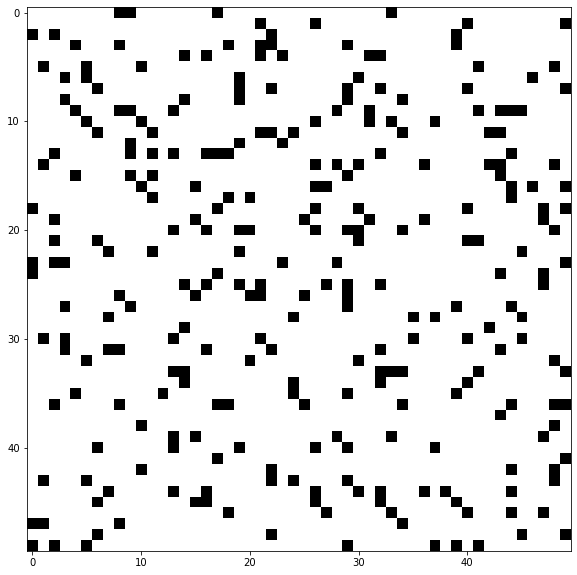

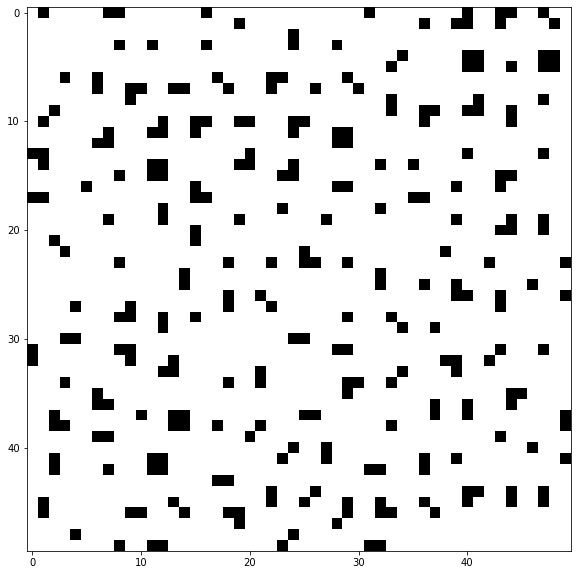


*****************

Uzyskano energię 728 po 287760 iteracjach.


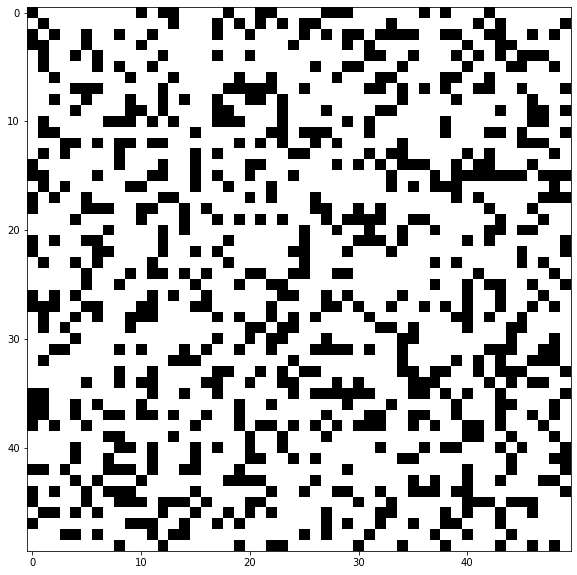

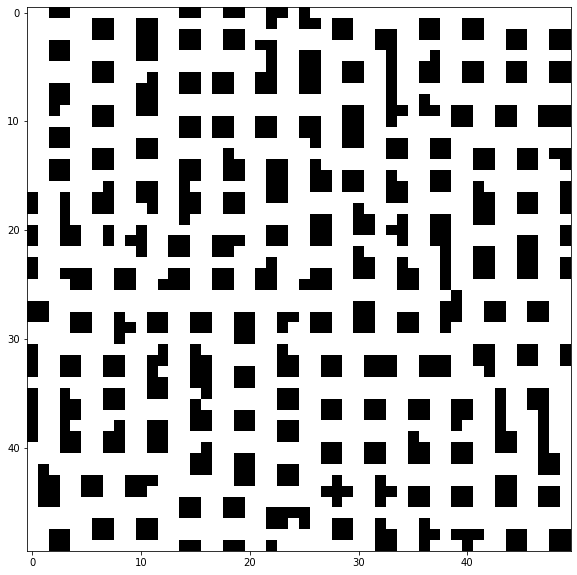


*****************

Uzyskano energię 2196 po 289412 iteracjach.


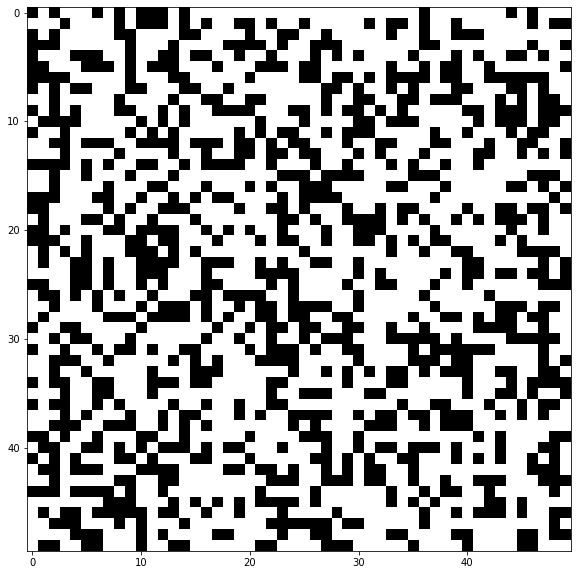

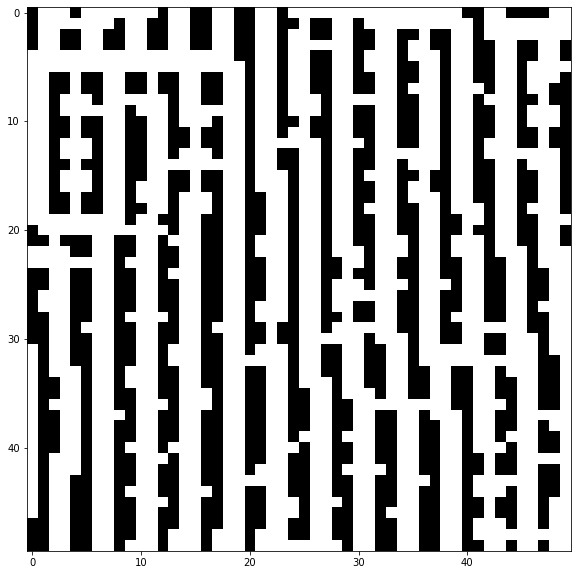

In [52]:
@jit(nopython=True)
def point_energy6 (x, y, size, X):
    e = 0
            
    #4 dalej na skos
    if X[x-2, y-2]:
        e += 1
    if X[(x+2)%size, (y+2)%size]:
        e += 1
    if X[(x+2)%size, y-2]:
        e += 1
    if X[x-2, (y+2)%size]:
        e += 1
        
    #4 dalej po bokach
    if X[x-2, y]:
        e += 1
    if X[x, y-2]:
        e += 1
    if X[(x+2)%size, y]:
        e += 1
    if X[x, (y+2)%size]:
        e += 1
        
    #po dwa
    #góra
    if X[x-1, y-2]:
        e += 1
    if X[(x+1)%size, y-2]:
        e += 1
    #prawo
    if X[(x+2)%size, (y+2)%size]:
        e += 1
    if X[(x+2)%size, y+2]:
        e += 1
    #dół
    if X[x-1, (y+2)%size]:
        e += 1
    if X[(x+1)%size, (y+2)%size]:
        e += 1
    #lewo
    if X[x-2, y-1]:
        e += 1
    if X[x-2, (y+1)%size]:
        e += 1
    
    return e

test_BI (50, 0.1, point_energy6)
print ()
print ("*****************")
print ()
test_BI (50, 0.3, point_energy6)
print ()
print ("*****************")
print ()
test_BI (50, 0.4, point_energy6)

#### Biała siatka

Energia punktu to suma czarnych pól w 8-sąsiedztwie od której odejmuję po 10 za każde czarne pole w odległości dwóch pól na prawo, lewo, w górę lub w dół. Celem tej funkcji jest stworzenie białej siatki z czarnymi polami wewnątrz. Udaje się osiągnąć taki efekt. Jednakże dla większej sigmy nie jest to możliwe, więc punkty łączą się w linie.

Uzyskano energię -8080 po 184637 iteracjach.


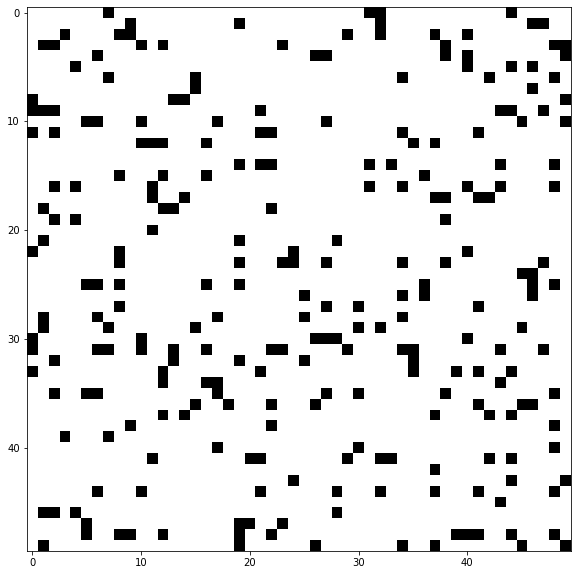

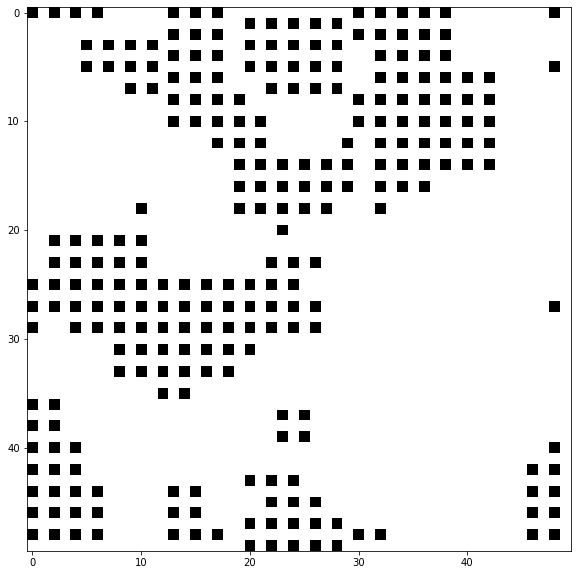


*****************

Uzyskano energię -25288 po 329498 iteracjach.


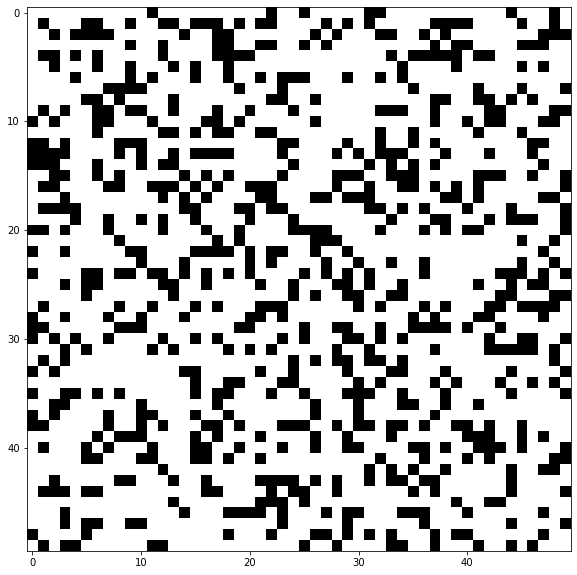

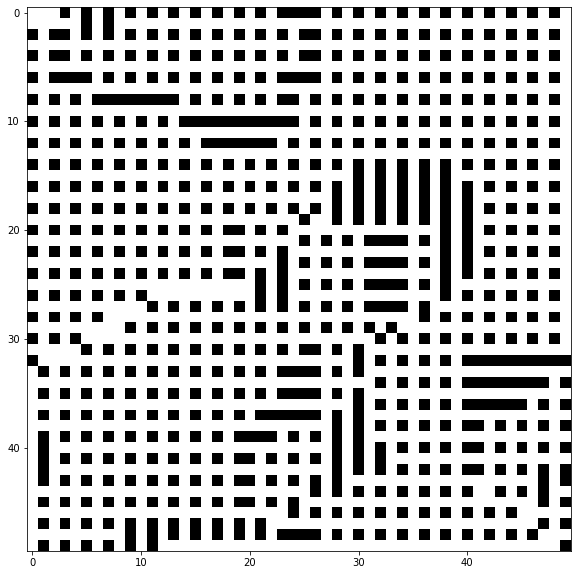


*****************

Uzyskano energię -35536 po 336695 iteracjach.


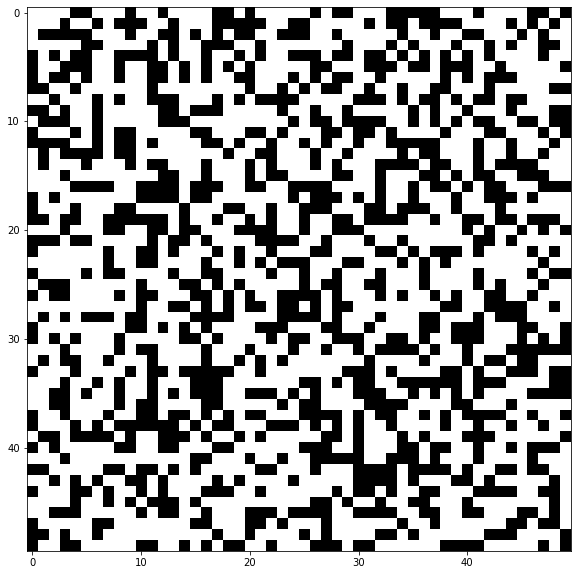

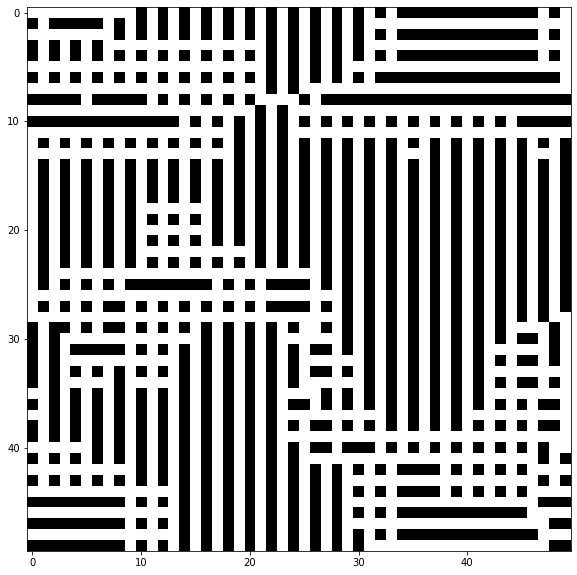

In [53]:
@jit(nopython=True)
def point_energy7 (x, y, size, X):
    e = 0
    #4 po bokach
    if X[x-1, y]:
        e += 1
    if X[x, y-1]:
        e += 1
    if X[(x+1)%size, y]:
        e += 1
    if X[x, (y+1)%size]:
        e += 1
        
    #4 na skos
    if X[x-1, y-1]:
        e += 1
    if X[(x+1)%size, (y+1)%size]:
        e += 1
    if X[(x+1)%size, y-1]:
        e += 1
    if X[x-1, (y+1)%size]:
        e += 1
        
    #4 dalej po bokach
    if X[x-2, y]:
        e += -10
    if X[x, y-2]:
        e += -10
    if X[(x+2)%size, y]:
        e += -10
    if X[x, (y+2)%size]:
        e += -10
    
    return e

test_BI (50, 0.1, point_energy7)
print ()
print ("*****************")
print ()
test_BI (50, 0.3, point_energy7)
print ()
print ("*****************")
print ()
test_BI (50, 0.4, point_energy7)

#### Okręgi

Energia pola to suma czarnych pól w 8-sąsiedztwie i białych w 16-sąsiedztwie. Celem jest uzyskanie okręgów czarnych punktów, jednakże nie jest to proste bo punkty na okręgu w 16 sąsiedztwie będą miały dodatnią energię. W efekcie uzyskujemy ciekawy obraz jednopikselowo szerokich czarnych linii przeplecionych z białymi. Obraz ten jest niespodziewany, jednakże dla takiego ułożenia energia jest najmniejsza.

Uzyskano energię 1772 po 168229 iteracjach.


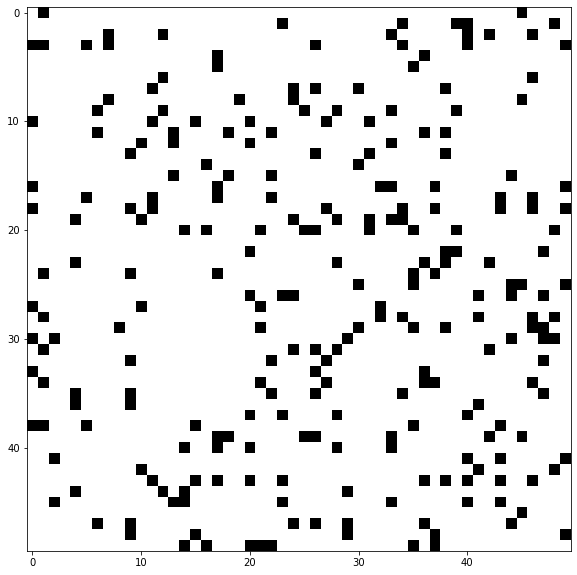

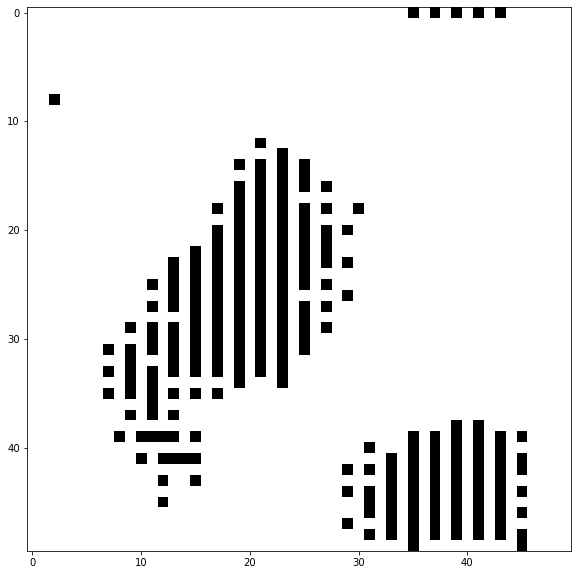


*****************

Uzyskano energię 4038 po 346134 iteracjach.


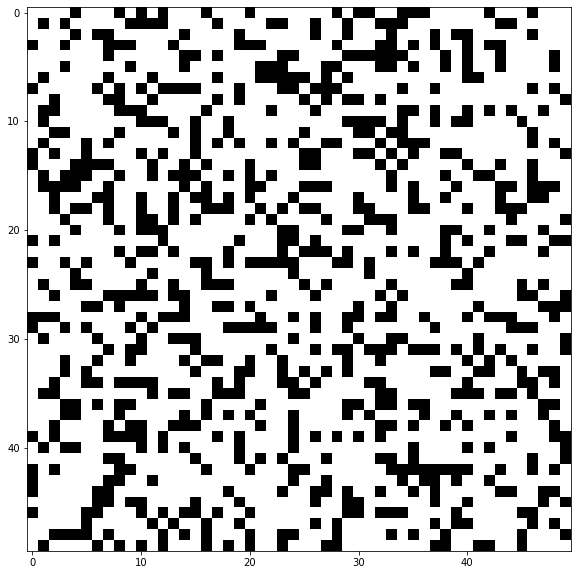

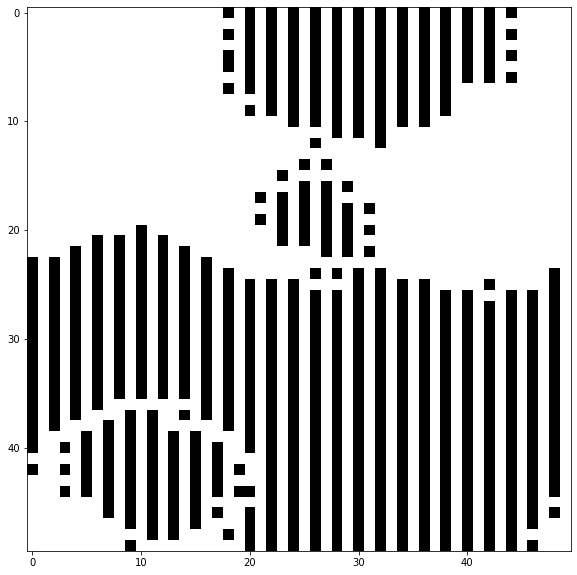


*****************

Uzyskano energię 4522 po 343408 iteracjach.


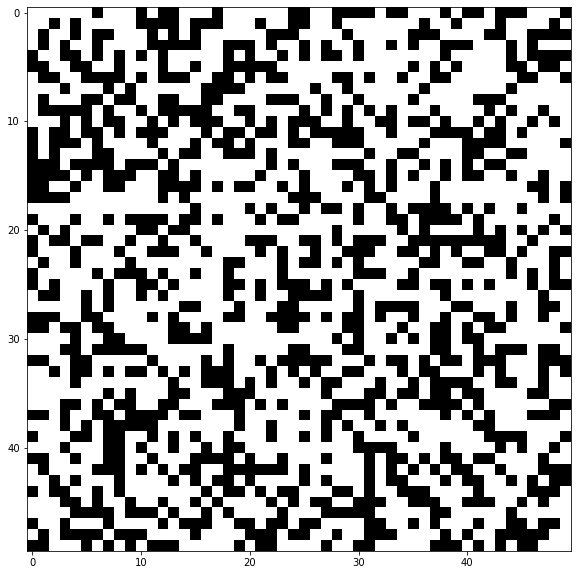

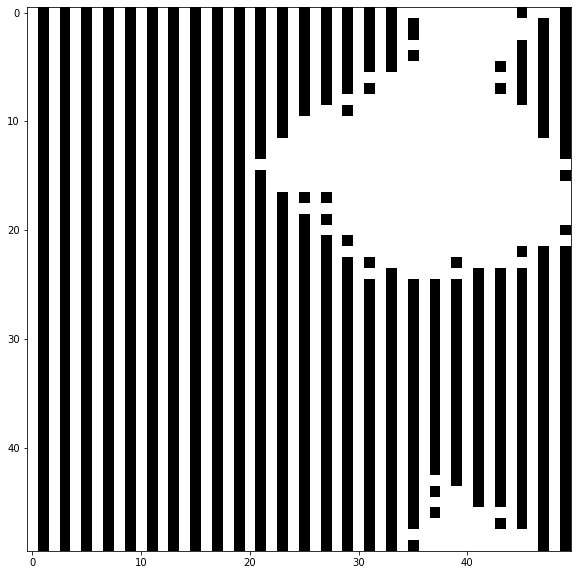

In [54]:
@jit(nopython=True)
def point_energy8 (x, y, size, X):
    e = 0
    #4 po bokach
    if X[x-1, y]:
        e += 1
    if X[x, y-1]:
        e += 1
    if X[(x+1)%size, y]:
        e += 1
    if X[x, (y+1)%size]:
        e += 1
        
    #4 na skos
    if X[x-1, y-1]:
        e += 1
    if X[(x+1)%size, (y+1)%size]:
        e += 1
    if X[(x+1)%size, y-1]:
        e += 1
    if X[x-1, (y+1)%size]:
        e += 1
        
    #4 dalej na skos
    if not X[x-2, y-2]:
        e += 1
    if not X[(x+2)%size, (y+2)%size]:
        e += 1
    if not X[(x+2)%size, y-2]:
        e += 1
    if not X[x-2, (y+2)%size]:
        e += 1
        
    #4 dalej po bokach
    if not X[x-2, y]:
        e += 1
    if not X[x, y-2]:
        e += 1
    if not X[(x+2)%size, y]:
        e += 1
    if not X[x, (y+2)%size]:
        e += 1
        
    #po dwa
    #góra
    if not X[x-1, y-2]:
        e += 1
    if not X[(x+1)%size, y-2]:
        e += 1
    #prawo
    if not X[(x+2)%size, (y+2)%size]:
        e += 1
    if not X[(x+2)%size, y+2]:
        e += 1
    #dół
    if not X[x-1, (y+2)%size]:
        e += 1
    if not X[(x+1)%size, (y+2)%size]:
        e += 1
    #lewo
    if not X[x-2, y-1]:
        e += 1
    if not X[x-2, (y+1)%size]:
        e += 1
    
    return e

test_BI (50, 0.1, point_energy8)
print ()
print ("*****************")
print ()
test_BI (50, 0.3, point_energy8)
print ()
print ("*****************")
print ()
test_BI (50, 0.4, point_energy8)

#### Kwadraty 3x3

Energia pola to suma białych pól w 8-sąsiedztwie i czarnych w 16-sąsiedztwie. Podobnie jak wyżej dla danego punktu idealnym rozwiązaniem był by kwadrat 3x3 jednakże punkty na boku w kwadracie miałyby dodatnią energię. A więc wyżarzanie prowadzi do tworzenia kwadratów 2x2 które wraz ze wzrostem sigmy łączą się tworząc linie o szerokości dwóch pikseli.

Uzyskano energię 1336 po 184637 iteracjach.


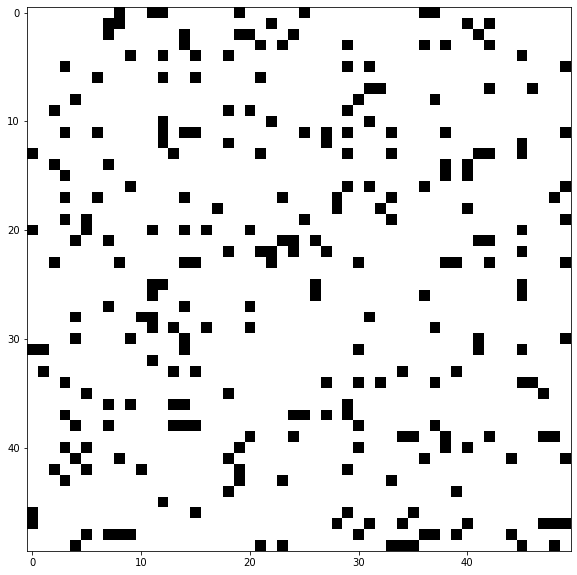

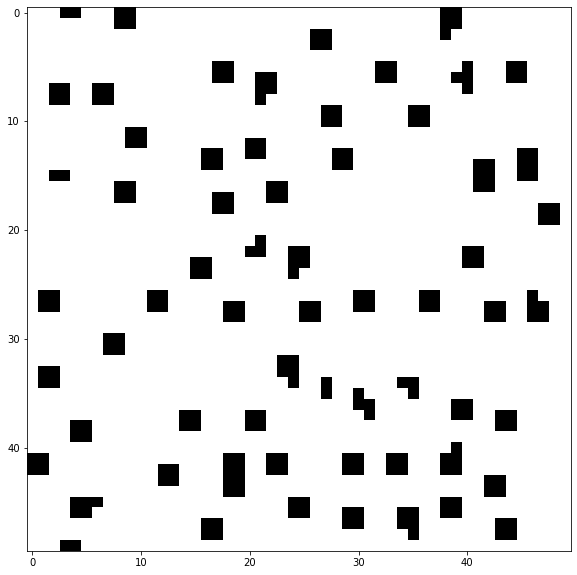


*****************

Uzyskano energię 4321 po 298827 iteracjach.


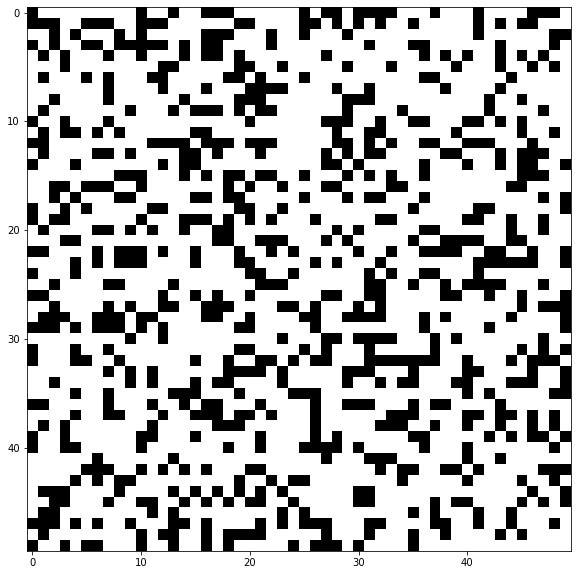

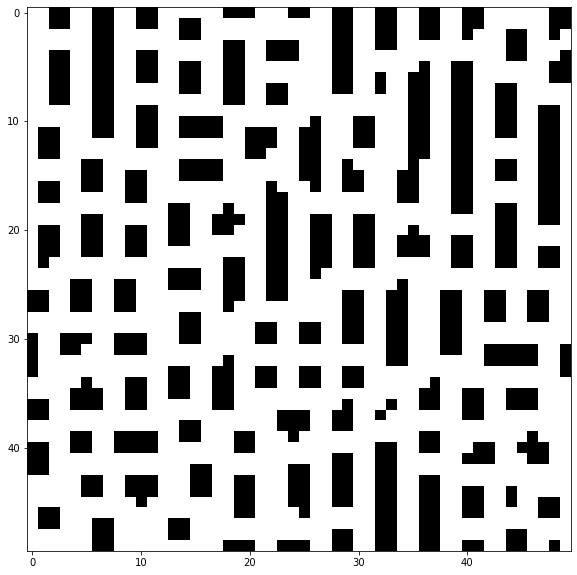


*****************

Uzyskano energię 5894 po 371940 iteracjach.


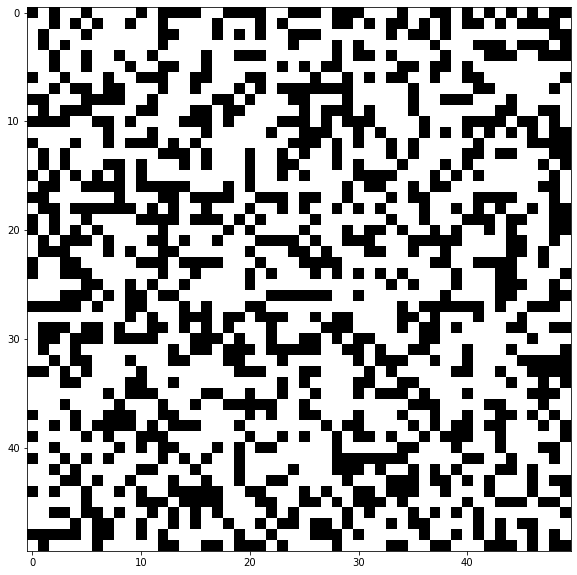

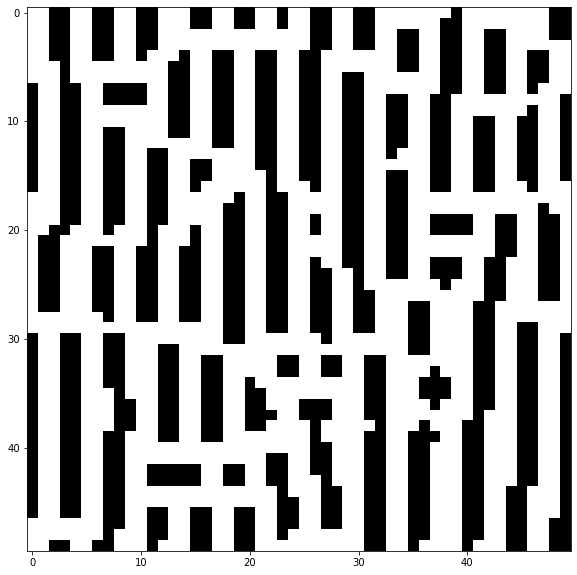

In [55]:
@jit(nopython=True)
def point_energy9 (x, y, size, X):
    e = 0
    #4 po bokach
    if not X[x-1, y]:
        e += 1
    if not X[x, y-1]:
        e += 1
    if not X[(x+1)%size, y]:
        e += 1
    if not X[x, (y+1)%size]:
        e += 1
        
    #4 na skos
    if not X[x-1, y-1]:
        e += 1
    if not X[(x+1)%size, (y+1)%size]:
        e += 1
    if not X[(x+1)%size, y-1]:
        e += 1
    if not X[x-1, (y+1)%size]:
        e += 1
        
    #4 dalej na skos
    if X[x-2, y-2]:
        e += 1
    if X[(x+2)%size, (y+2)%size]:
        e += 1
    if X[(x+2)%size, y-2]:
        e += 1
    if X[x-2, (y+2)%size]:
        e += 1
        
    #4 dalej po bokach
    if X[x-2, y]:
        e += 1
    if X[x, y-2]:
        e += 1
    if X[(x+2)%size, y]:
        e += 1
    if X[x, (y+2)%size]:
        e += 1
        
    #po dwa
    #góra
    if X[x-1, y-2]:
        e += 1
    if X[(x+1)%size, y-2]:
        e += 1
    #prawo
    if X[(x+2)%size, (y+2)%size]:
        e += 1
    if X[(x+2)%size, y+2]:
        e += 1
    #dół
    if X[x-1, (y+2)%size]:
        e += 1
    if X[(x+1)%size, (y+2)%size]:
        e += 1
    #lewo
    if X[x-2, y-1]:
        e += 1
    if X[x-2, (y+1)%size]:
        e += 1
    
    return e

test_BI (50, 0.1, point_energy9)
print ()
print ("*****************")
print ()
test_BI (50, 0.3, point_energy9)
print ()
print ("*****************")
print ()
test_BI (50, 0.4, point_energy9)

## Sudoku

Klasa `Sudoku` ma za zadanie znaleźć rozwiązanie planszy sudoku za pomocą symulowanego wyżarzania. Funkcja energii jest liczona zgodnie z propozycją z konspektu, czyli liczy liczbę powtórzeń cyfr w każdej kolumnie, wierszu i kwadracie 3x3. Sprawą kluczową jest sposób szukania stanów sąsiednich. Wpisywanie losowych liczb nie zdaje rezultatu z racji charakteru sudoku, ciężko jest losowo trafić w odpowiednią liczbę przy tak dużej liczbie kombinacji. Po kilku próbach ostatecznie postawiłem na specjalne uzupełnienie luk i wykorzystywanie tego faktu w funkcji `move`. Wczytując sudoku z pliku czytam każdy kwadrat 3x3 i uzupełniam go losowo brakującymi liczbami, tak aby występowały w nim wszytskie cyfry od 1 do 9. Dzięki temu mogę zastosować następującą funkcję szukania stanu sąsiedniego: wybieram losowo kwadrat 9x9 i w nim wybieram 2 miejsca i zamieniam liczby w nich miejscami. Wybór kwadratu 3x3 przebiega zgodnie z prawdopodobieństwem w zależności od liczby pól do uzupełnienia. Ma to na celu zapobieganie wybierania częstego kwadratu z dwoma polami do uzupełnienia gdzie nie ma możliwości dużych zamian. Taka funkcja poszukiwania stanu sąsiedniego pozwala uprościć funkcję energii, nie muszę sprawdzać kwadratów 3x3, które zawsze są prawidłowo uzupełnione. W funkcji energii dodano nową funkcjonalność, gdy energia osiągnie 0 (rozwiązane sudoku) zmienia temperaturę na 0 dzięki czemu kończy działanie symulowanego wyżarzania. Korzystając z tej funkcjonalności wyłączam warunek końca zatrzymania sie funkcji energii poprzez zmienną `sud`. Warunek ten nie ma sensu bo jesli nie osiągnę zera to nie wolno mi kończyc algorytmu lecz powinienem liczyć, że wraz z ogrzewaniem uda się znaleźć rozwiązanie. Górne ograniczenie na liczbę iteracji zostało wprowadzone na 1,5 milion. Funkcja zmiany energii ma postać "x : 0.9999*x", zgodnie z obserwacjami z poprzednich zadań. Stosuję podgrzewanie, aby wydłużyć proces wyżarzania. Z racji specyficznego warunku końca mogę sobie na to pozwolić. Podgrzewanie jest tak ustawione aby proces trwał nieco ponad milion iteracji jeśli nie znajdzie rozwiązania. Gdy podgrzewam wartość temperatury jest niska, więc często zanim podgrzeje udaje się znaleźć rozwiązanie. Uzyskuje to dzięki podgrzewaniu co 20 000 iteracji. Temperatura jest zwiększana wtedy trzy-krotnie jeśli była większa od 0.5 w przeciwnym wypadku wzrost jest 10-krotny. Zabieg ten ma na celu ciągłe podgrzewanie w cyklu ale też nie pozwolenie na spadek poniżej 0.01 co oznaczałoby przedwczesne zakończenie procesu. Wartości 3 i 10 zostały obliczone na podstawie testów ale także poprzez analizę matematyczną, tak aby proces był podtrzymywany. Wartość graniczna 0.5 ma na celu pozwolenie na częste schodzenie do stanu stabilizacji, co oznacza dużą liczbę cykli. Efekt ten jest widoczny na wykresie funkcji energii, gdzie cyklicznie pojawia się stabilizacja energii na małej wartości. Oznacza to znalezienie prawie idealnego rozwiązania, jednakże skoro nie jest to sudoku rozwiązane to następuje podgrzanie, aby popsuć je i spróbować znaleźć nowe dobre. W tym zadaniu funkcja temperatury musi pozwolić na cykliczne obniżanie temperatury do poziomu stabilizacji. Pozwala to na kilkukrotne poszukiwanie rozwiązania sudoku.

In [76]:
@jit(nopython=True)
def calculate (arr):
    k = 0
    for i in range (1, 10):
        t = np.sum(arr == i)
        if t > 1:
            k += t-1
    return k

@jit(nopython=True)
def s_energy (X):
    res = 0
    for i in range (9):
        res+=calculate (X[i,:])
        res+=calculate (X[:,i])
    return res

In [77]:
class Sudoku (Annealing):
    def __init__ (self, X, to_fill, **kwargs):
        self.fields = to_fill
        #tworzenie probability do funkcji choice w move
        s = 0
        for el in self.fields:
            s += len(el)
        self.prob = []
        for el in self.fields:
            self.prob.append(len(el)/s)
        
        super(Sudoku, self).__init__(X, sud = 1, N = 1500000, **kwargs)
        
    def move (self):
        square = np.random.choice (len (self.fields), p = self.prob)
        #square = np.random.randint (len(self.fields))
        size = len (self.fields[square])
        i = np.random.randint (size)
        j = np.random.randint (size)
        while i == j:
            j = np.random.randint (size)
        xi, yi = self.fields[square][i]
        xj, yj = self.fields[square][j]
        self.X[xi, yi], self.X[xj, yj] = self.X[xj, yj], self.X[xi, yi]
        
    def energy (self):
        res = s_energy (self.X)
        if res == 0:
            self.temperature = 0
        return res * 5
    
    def reduce (self, x):
        if self.iter % 20000 == 0 and self.iter < 1000000:
            if x > 0.5:
                x *= 3
            else:
                x *= 10
        if self.f_reduce:
            return self.f_reduce (x)
        return 0.9999 * x

Funkcja `read_sudoku` odczytuje pliki zawierające sudoka i korzystając z `make_sudoku_data` tworzy tablicę z sudoku oraz zbiór zawierający współrzędne pól do uzupełnienia. Odczytuje wszystkie sudoka podane na zajęciach.

In [78]:
def make_sudoku_data (arr):
    before = np.array(arr)
    S = [[] for _ in range(9)]
    k = 0
    to_delete = []
    for i in [0,3,6]:
        for j in [0,3,6]:
            c = [0]*10
            for x in range (i, i+3):
                for y in range (j, j+3):
                    c[arr[x][y]] = 1                    
                    if arr[x][y] == 0:
                        S[k].append((x,y))
            to_set = []
            for ix in range (1, 10):
                if c[ix] == 0:
                    to_set.append(ix)
            to_set = np.random.permutation(to_set)
            for ix, t in enumerate (S[k]):
                x, y = t
                arr[x][y] = to_set[ix]
            if len (S[k]) <= 1:
                to_delete.append (k)
            k+=1
    to_delete.reverse()
    for i in range (len(to_delete)):
        del S[to_delete[i]]
    return np.array(arr), S, before

In [79]:
def read_sudoku ():
    f = open ("sudoku.txt", 'r')
    text = f.read()
    f.close()
    text = text.split(sep="\n")
    S = []
    for i in range (0, len(text)-1, 10):
        txt = text[i+1: i+10]
        sudoku = []
        for j, line in enumerate(txt):
            sudoku.append([])
            for i in range (9):
                t = line[i]
                if t == 'x':
                    t = 0
                else:
                    t = int(t)
                sudoku[-1].append(t)
        S.append(make_sudoku_data (sudoku))
    
    l = list(os.listdir("sudoku"))
    for file in l:
        f = open ("sudoku/" + file, 'r')
        text = f.read()
        f.close()
        text = text.split(sep="\n")
        sudoku = []
        for line in text:
            if (len (line) < 9):
                continue
            line = line.split(sep=" ")
            sudoku.append([])
            for i, el in enumerate(line):
                if i == 9:
                    break;
                sudoku[-1].append(int(el))
        S.append(make_sudoku_data (sudoku))
    return S

Rozwiązywanie sudoku wraz ze statystykami.

[[0 0 3 0 2 0 6 0 0]
 [9 0 0 3 0 5 0 0 1]
 [0 0 1 8 0 6 4 0 0]
 [0 0 8 1 0 2 9 0 0]
 [7 0 0 0 0 0 0 0 8]
 [0 0 6 7 0 8 2 0 0]
 [0 0 2 6 0 9 5 0 0]
 [8 0 0 2 0 3 0 0 9]
 [0 0 5 0 1 0 3 0 0]]


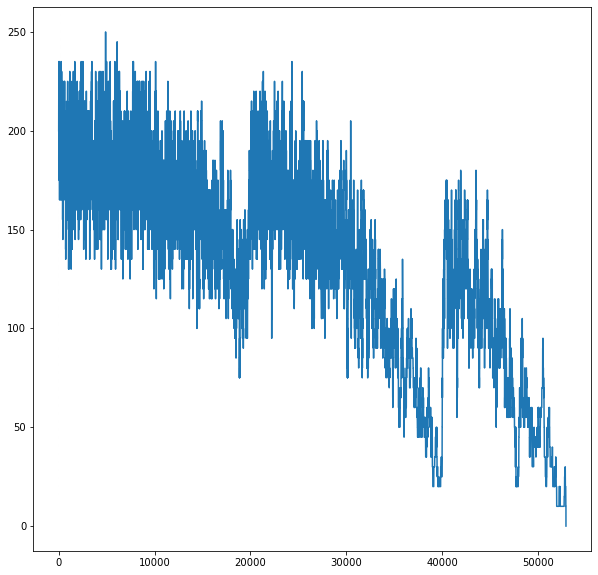

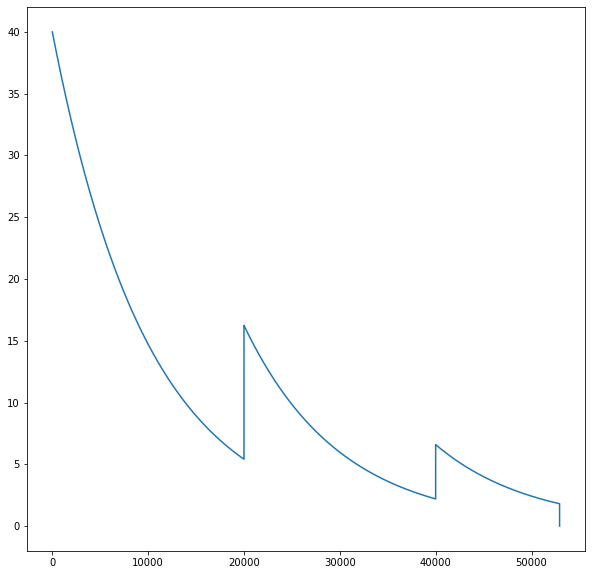

[[4 8 3 9 2 1 6 5 7]
 [9 6 7 3 4 5 8 2 1]
 [2 5 1 8 7 6 4 9 3]
 [5 4 8 1 3 2 9 7 6]
 [7 2 9 5 6 4 1 3 8]
 [1 3 6 7 9 8 2 4 5]
 [3 7 2 6 8 9 5 1 4]
 [8 1 4 2 5 3 7 6 9]
 [6 9 5 4 1 7 3 8 2]]
Znaleziono prawidłowe rozwiązanie w 52930 iteracjach

****************

[[2 0 0 0 8 0 3 0 0]
 [0 6 0 0 7 0 0 8 4]
 [0 3 0 5 0 0 2 0 9]
 [0 0 0 1 0 5 4 0 8]
 [0 0 0 0 0 0 0 0 0]
 [4 0 2 7 0 6 0 0 0]
 [3 0 1 0 0 7 0 4 0]
 [7 2 0 0 4 0 0 6 0]
 [0 0 4 0 1 0 0 0 3]]


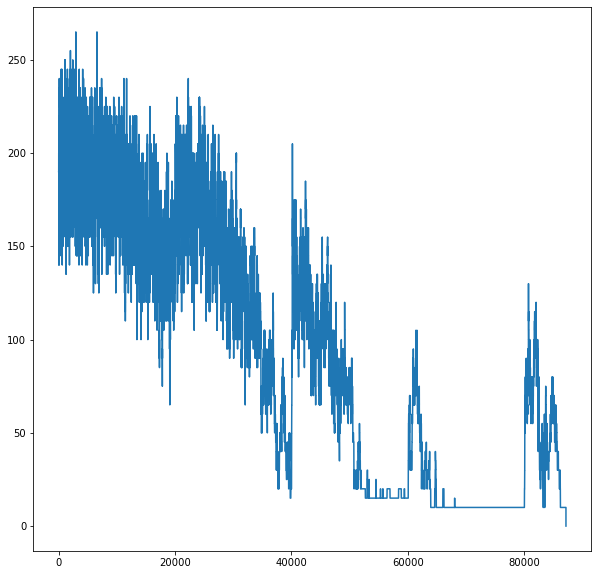

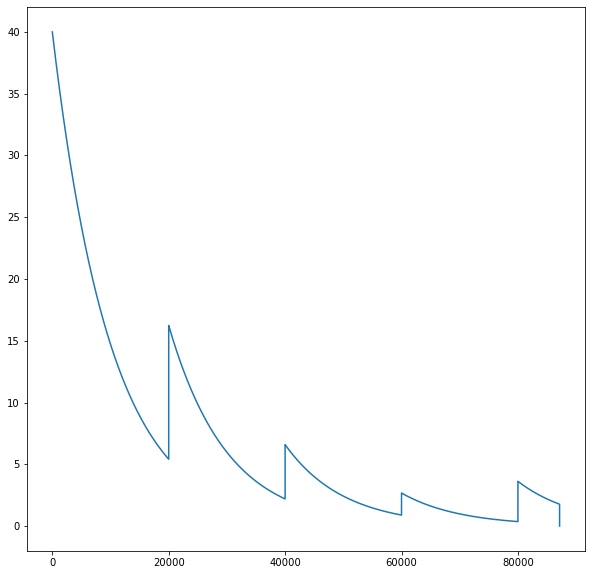

[[2 4 5 9 8 1 3 7 6]
 [1 6 9 2 7 3 5 8 4]
 [8 3 7 5 6 4 2 1 9]
 [9 7 6 1 2 5 4 3 8]
 [5 1 3 4 9 8 6 2 7]
 [4 8 2 7 3 6 9 5 1]
 [3 9 1 6 5 7 8 4 2]
 [7 2 8 3 4 9 1 6 5]
 [6 5 4 8 1 2 7 9 3]]
Znaleziono prawidłowe rozwiązanie w 87158 iteracjach

****************

[[0 0 0 0 0 0 9 0 7]
 [0 0 0 4 2 0 1 8 0]
 [0 0 0 7 0 5 0 2 6]
 [1 0 0 9 0 4 0 0 0]
 [0 5 0 0 0 0 0 4 0]
 [0 0 0 5 0 7 0 0 9]
 [9 2 0 1 0 8 0 0 0]
 [0 3 4 0 5 9 0 0 0]
 [5 0 7 0 0 0 0 0 0]]


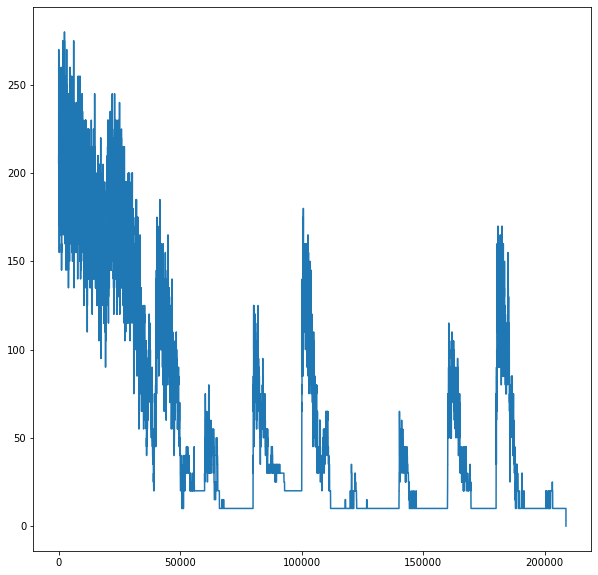

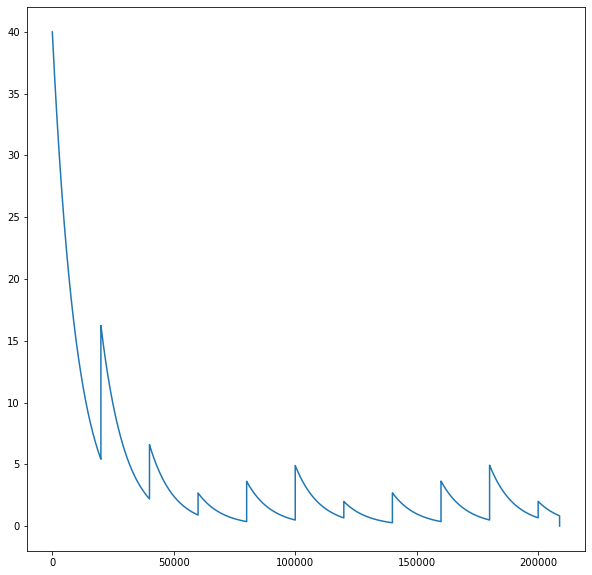

[[4 6 2 8 3 1 9 5 7]
 [7 9 5 4 2 6 1 8 3]
 [3 8 1 7 9 5 4 2 6]
 [1 7 3 9 8 4 2 6 5]
 [6 5 9 3 1 2 7 4 8]
 [2 4 8 5 6 7 3 1 9]
 [9 2 6 1 7 8 5 3 4]
 [8 3 4 2 5 9 6 7 1]
 [5 1 7 6 4 3 8 9 2]]
Znaleziono prawidłowe rozwiązanie w 208816 iteracjach

****************

[[0 3 0 0 5 0 0 4 0]
 [0 0 8 0 1 0 5 0 0]
 [4 6 0 0 0 0 0 1 2]
 [0 7 0 5 0 2 0 8 0]
 [0 0 0 6 0 3 0 0 0]
 [0 4 0 1 0 9 0 3 0]
 [2 5 0 0 0 0 0 9 8]
 [0 0 1 0 2 0 6 0 0]
 [0 8 0 0 6 0 0 2 0]]


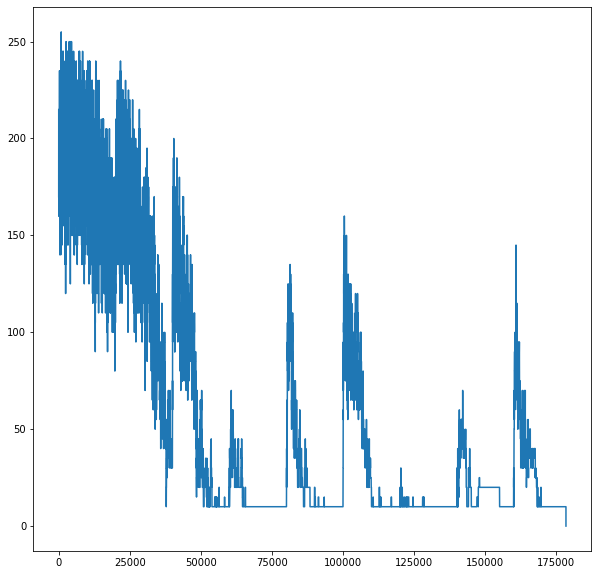

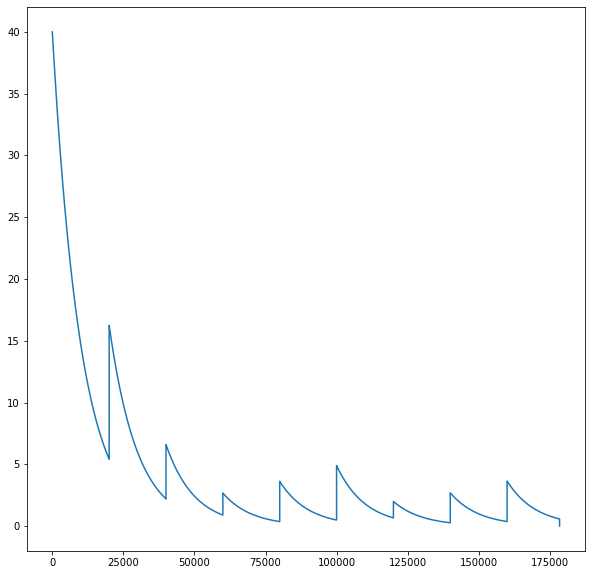

[[1 3 7 2 5 6 8 4 9]
 [9 2 8 3 1 4 5 6 7]
 [4 6 5 8 9 7 3 1 2]
 [6 7 3 5 4 2 9 8 1]
 [8 1 9 6 7 3 2 5 4]
 [5 4 2 1 8 9 7 3 6]
 [2 5 6 7 3 1 4 9 8]
 [3 9 1 4 2 8 6 7 5]
 [7 8 4 9 6 5 1 2 3]]
Znaleziono prawidłowe rozwiązanie w 178458 iteracjach

****************

[[0 2 0 8 1 0 7 4 0]
 [7 0 0 0 0 3 1 0 0]
 [0 9 0 0 0 2 8 0 5]
 [0 0 9 0 4 0 0 8 7]
 [4 0 0 2 0 8 0 0 3]
 [1 6 0 0 3 0 2 0 0]
 [3 0 2 7 0 0 0 6 0]
 [0 0 5 6 0 0 0 0 8]
 [0 7 6 0 5 1 0 9 0]]


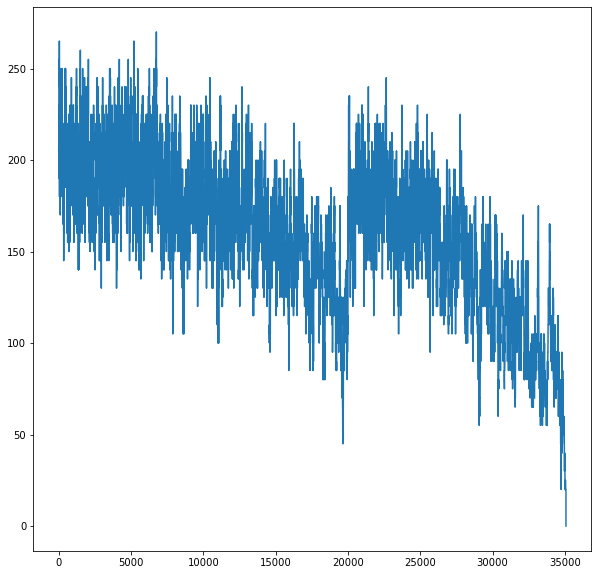

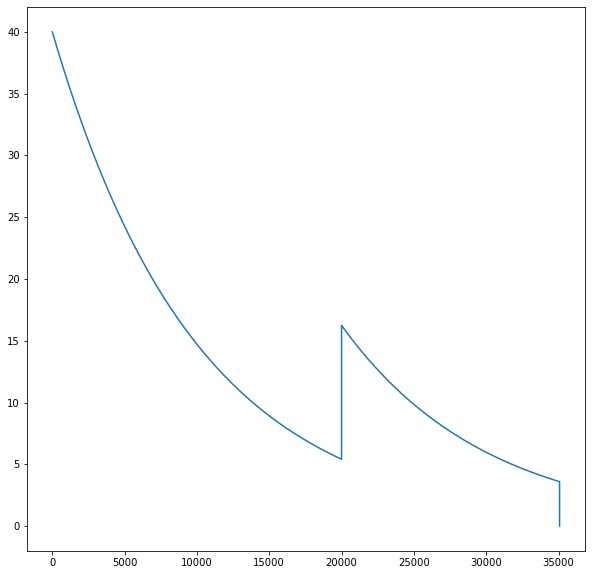

[[5 2 3 8 1 6 7 4 9]
 [7 8 4 5 9 3 1 2 6]
 [6 9 1 4 7 2 8 3 5]
 [2 3 9 1 4 5 6 8 7]
 [4 5 7 2 6 8 9 1 3]
 [1 6 8 9 3 7 2 5 4]
 [3 4 2 7 8 9 5 6 1]
 [9 1 5 6 2 4 3 7 8]
 [8 7 6 3 5 1 4 9 2]]
Znaleziono prawidłowe rozwiązanie w 35074 iteracjach

****************

[[1 0 0 9 2 0 0 0 0]
 [5 2 4 0 1 0 0 0 0]
 [0 0 0 0 0 0 0 7 0]
 [0 5 0 0 0 8 1 0 2]
 [0 0 0 0 0 0 0 0 0]
 [4 0 2 7 0 0 0 9 0]
 [0 6 0 0 0 0 0 0 0]
 [0 0 0 0 3 0 9 4 5]
 [0 0 0 0 7 1 0 0 6]]


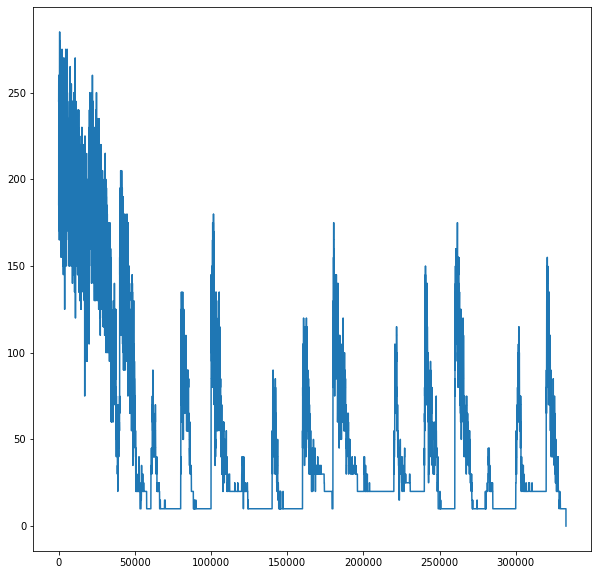

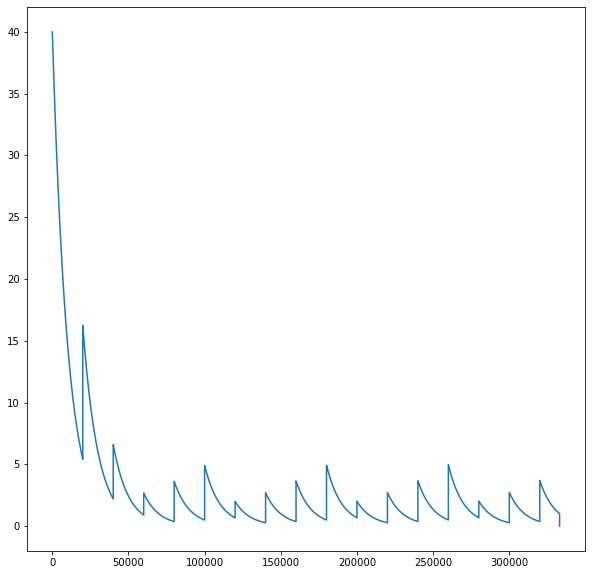

[[1 7 6 9 2 3 5 8 4]
 [5 2 4 8 1 7 6 3 9]
 [8 9 3 6 5 4 2 7 1]
 [9 5 7 3 4 8 1 6 2]
 [6 3 8 1 9 2 4 5 7]
 [4 1 2 7 6 5 3 9 8]
 [2 6 5 4 8 9 7 1 3]
 [7 8 1 2 3 6 9 4 5]
 [3 4 9 5 7 1 8 2 6]]
Znaleziono prawidłowe rozwiązanie w 333012 iteracjach

****************

[[0 4 3 0 8 0 2 5 0]
 [6 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 1 0 9 4]
 [9 0 0 0 0 4 0 7 0]
 [0 0 0 6 0 8 0 0 0]
 [0 1 0 2 0 0 0 0 3]
 [8 2 0 5 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 5]
 [0 3 4 0 9 0 7 1 0]]


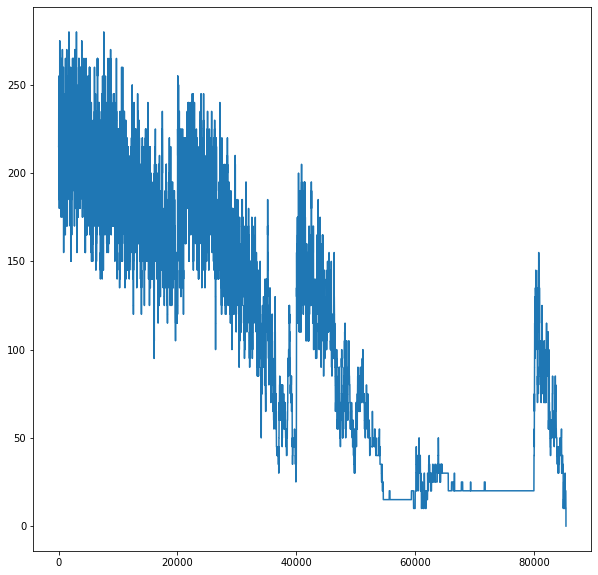

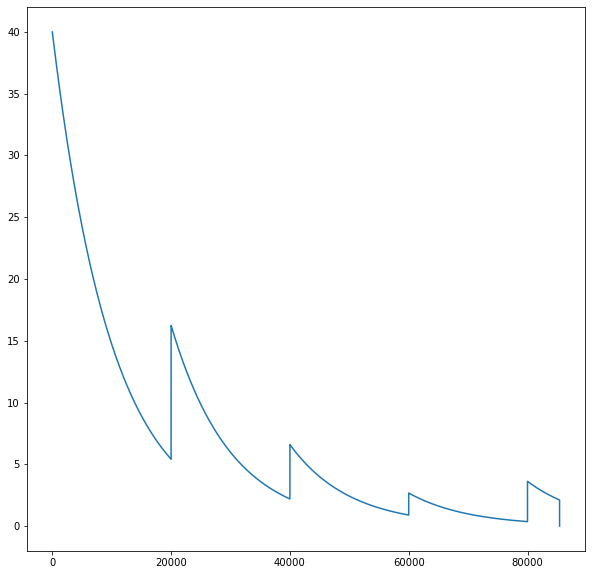

[[1 4 3 9 8 6 2 5 7]
 [6 7 9 4 2 5 3 8 1]
 [2 8 5 7 3 1 6 9 4]
 [9 6 2 3 5 4 1 7 8]
 [3 5 7 6 1 8 9 4 2]
 [4 1 8 2 7 9 5 6 3]
 [8 2 1 5 6 7 4 3 9]
 [7 9 6 1 4 3 8 2 5]
 [5 3 4 8 9 2 7 1 6]]
Znaleziono prawidłowe rozwiązanie w 85400 iteracjach

****************

[[4 8 0 0 0 6 9 0 2]
 [0 0 2 0 0 8 0 0 1]
 [9 0 0 3 7 0 0 6 0]
 [8 4 0 0 1 0 2 0 0]
 [0 0 3 7 0 4 1 0 0]
 [0 0 1 0 6 0 0 4 9]
 [0 2 0 0 8 5 0 0 7]
 [7 0 0 9 0 0 6 0 0]
 [6 0 9 2 0 0 0 1 8]]


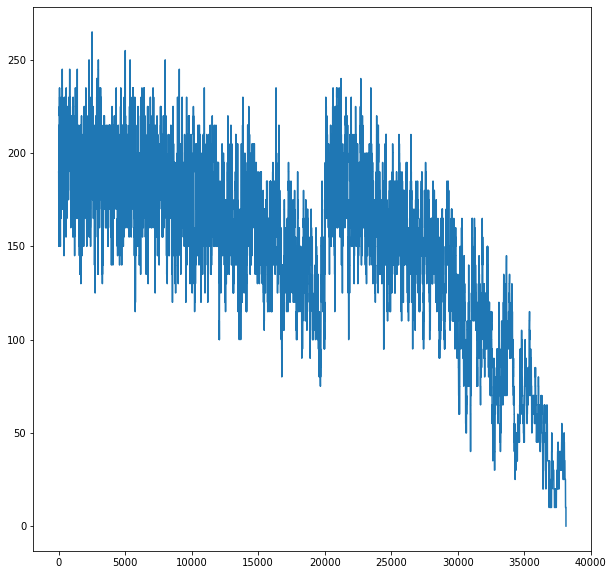

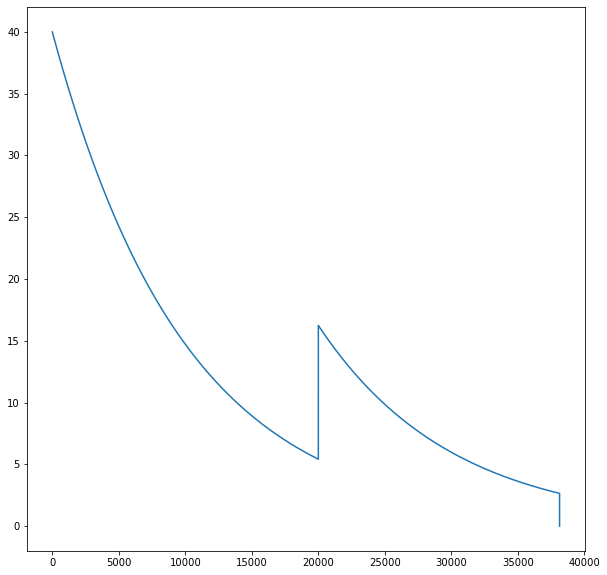

[[4 8 7 1 5 6 9 3 2]
 [3 6 2 4 9 8 7 5 1]
 [9 1 5 3 7 2 8 6 4]
 [8 4 6 5 1 9 2 7 3]
 [5 9 3 7 2 4 1 8 6]
 [2 7 1 8 6 3 5 4 9]
 [1 2 4 6 8 5 3 9 7]
 [7 3 8 9 4 1 6 2 5]
 [6 5 9 2 3 7 4 1 8]]
Znaleziono prawidłowe rozwiązanie w 38135 iteracjach

****************

[[0 0 0 9 0 0 0 0 2]
 [0 5 0 1 2 3 4 0 0]
 [0 3 0 0 0 0 1 6 0]
 [9 0 8 0 0 0 0 0 0]
 [0 7 0 0 0 0 0 9 0]
 [0 0 0 0 0 0 2 0 5]
 [0 9 1 0 0 0 0 5 0]
 [0 0 7 4 3 9 0 2 0]
 [4 0 0 0 0 7 0 0 0]]


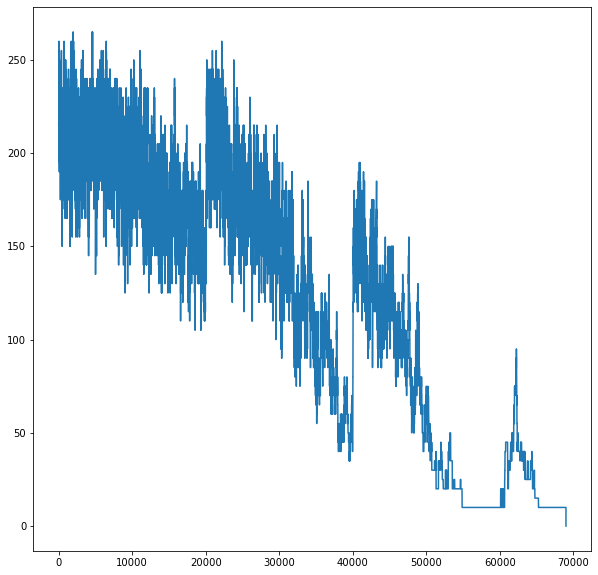

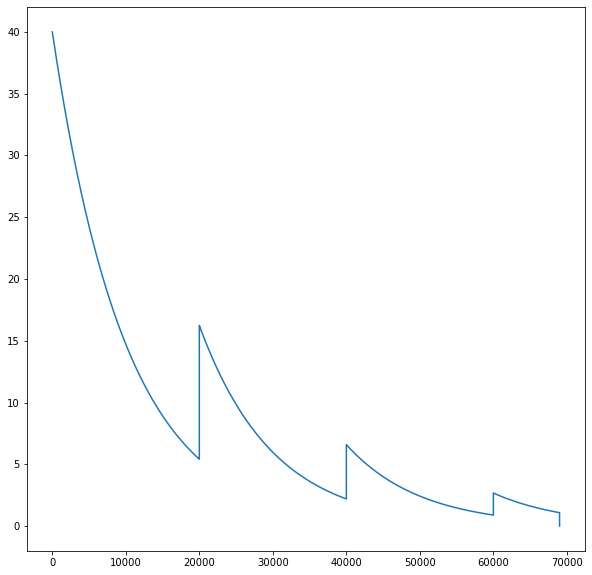

[[8 1 4 9 7 6 5 3 2]
 [6 5 9 1 2 3 4 7 8]
 [7 3 2 8 5 4 1 6 9]
 [9 4 8 2 6 5 3 1 7]
 [2 7 5 3 4 1 8 9 6]
 [1 6 3 7 9 8 2 4 5]
 [3 9 1 6 8 2 7 5 4]
 [5 8 7 4 3 9 6 2 1]
 [4 2 6 5 1 7 9 8 3]]
Znaleziono prawidłowe rozwiązanie w 69008 iteracjach

****************

[[0 0 1 9 0 0 0 0 3]
 [9 0 0 7 0 0 1 6 0]
 [0 3 0 0 0 5 0 0 7]
 [0 5 0 0 0 0 0 0 9]
 [0 0 4 3 0 2 6 0 0]
 [2 0 0 0 0 0 0 7 0]
 [6 0 0 1 0 0 0 3 0]
 [0 4 2 0 0 7 0 0 6]
 [5 0 0 0 0 6 8 0 0]]


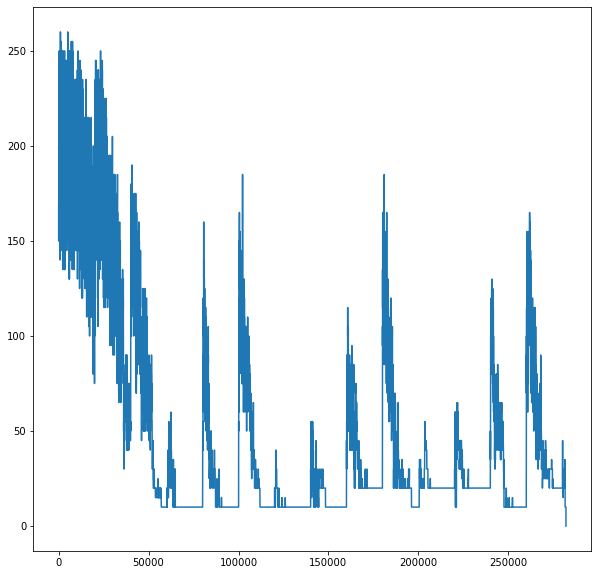

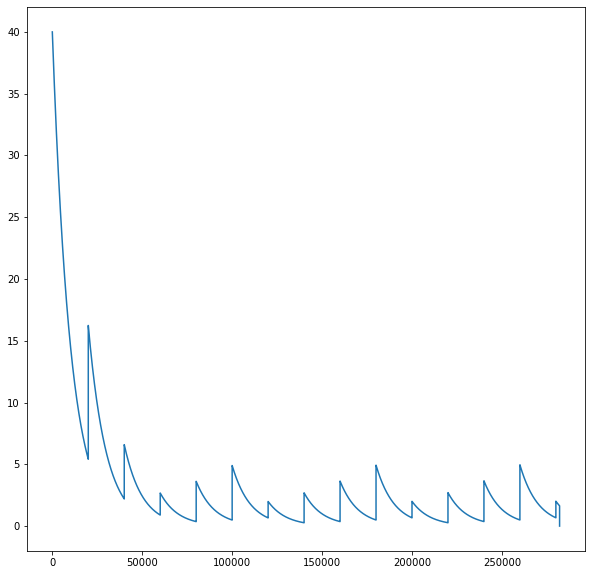

[[7 6 1 9 2 8 4 5 3]
 [9 2 5 7 4 3 1 6 8]
 [4 3 8 6 1 5 9 2 7]
 [3 5 7 4 6 1 2 8 9]
 [8 9 4 3 7 2 6 1 5]
 [2 1 6 5 8 9 3 7 4]
 [6 8 9 1 5 4 7 3 2]
 [1 4 2 8 3 7 5 9 6]
 [5 7 3 2 9 6 8 4 1]]
Znaleziono prawidłowe rozwiązanie w 282063 iteracjach

****************

[[0 0 0 1 2 5 4 0 0]
 [0 0 8 4 0 0 0 0 0]
 [4 2 0 8 0 0 0 0 0]
 [0 3 0 0 0 0 0 9 5]
 [0 6 0 9 0 2 0 1 0]
 [5 1 0 0 0 0 0 6 0]
 [0 0 0 0 0 3 0 4 9]
 [0 0 0 0 0 7 2 0 0]
 [0 0 1 2 9 8 0 0 0]]


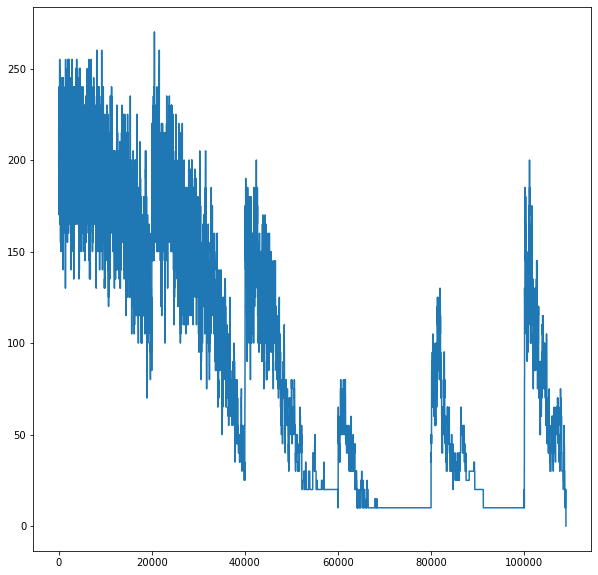

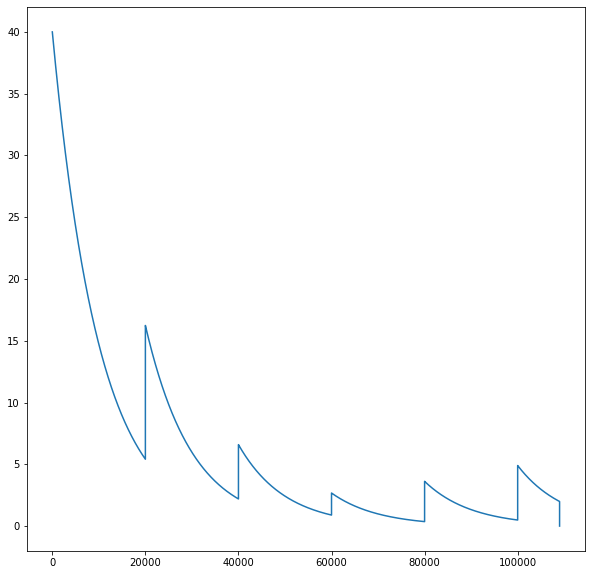

[[9 7 6 1 2 5 4 3 8]
 [1 5 8 4 3 6 9 2 7]
 [4 2 3 8 7 9 1 5 6]
 [2 3 4 7 6 1 8 9 5]
 [8 6 7 9 5 2 3 1 4]
 [5 1 9 3 8 4 7 6 2]
 [7 8 2 5 1 3 6 4 9]
 [3 9 5 6 4 7 2 8 1]
 [6 4 1 2 9 8 5 7 3]]
Znaleziono prawidłowe rozwiązanie w 109007 iteracjach

****************

[[0 6 2 3 4 0 7 5 0]
 [1 0 0 0 0 5 6 0 0]
 [5 7 0 0 0 0 0 4 0]
 [0 0 0 0 9 4 8 0 0]
 [4 0 0 0 0 0 0 0 6]
 [0 0 5 8 3 0 0 0 0]
 [0 3 0 0 0 0 0 9 1]
 [0 0 6 4 0 0 0 0 7]
 [0 5 9 0 8 3 2 6 0]]


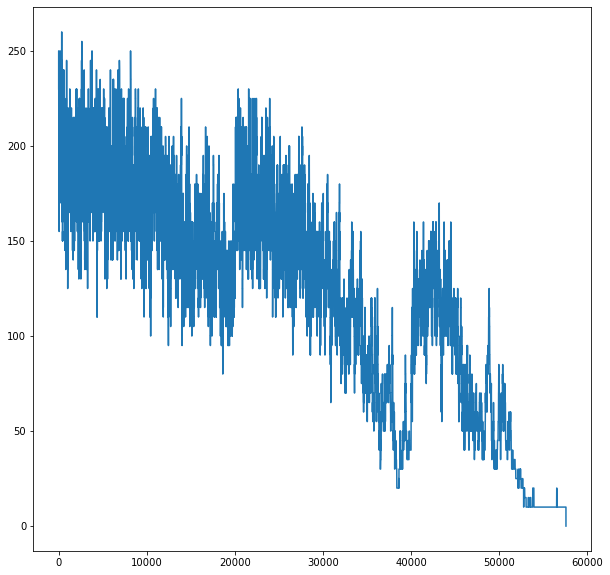

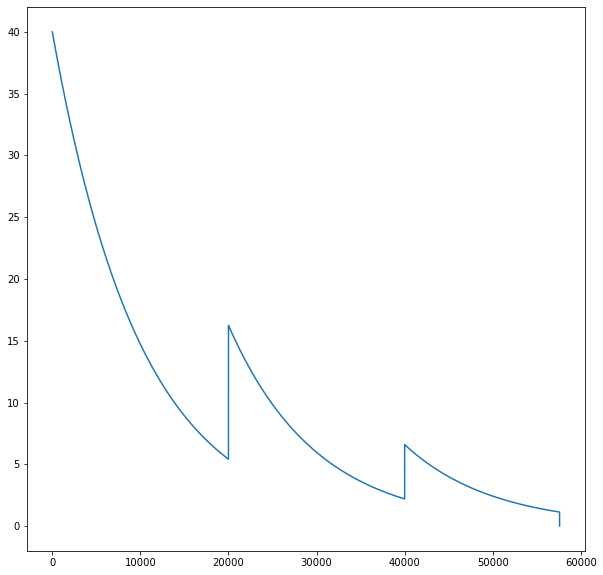

[[9 6 2 3 4 1 7 5 8]
 [1 4 8 9 7 5 6 2 3]
 [5 7 3 2 6 8 1 4 9]
 [3 2 1 6 9 4 8 7 5]
 [4 8 7 5 1 2 9 3 6]
 [6 9 5 8 3 7 4 1 2]
 [8 3 4 7 2 6 5 9 1]
 [2 1 6 4 5 9 3 8 7]
 [7 5 9 1 8 3 2 6 4]]
Znaleziono prawidłowe rozwiązanie w 57591 iteracjach

****************

[[3 0 0 0 0 0 0 0 0]
 [0 0 5 0 0 9 0 0 0]
 [2 0 0 5 0 4 0 0 0]
 [0 2 0 0 0 0 7 0 0]
 [1 6 0 0 0 0 0 5 8]
 [7 0 4 3 1 0 6 0 0]
 [0 0 0 8 9 0 1 0 0]
 [0 0 0 0 6 7 0 8 0]
 [0 0 0 0 0 5 4 3 7]]


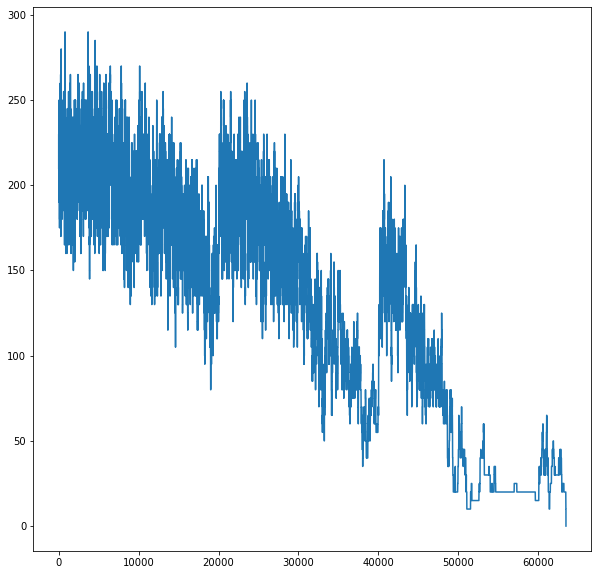

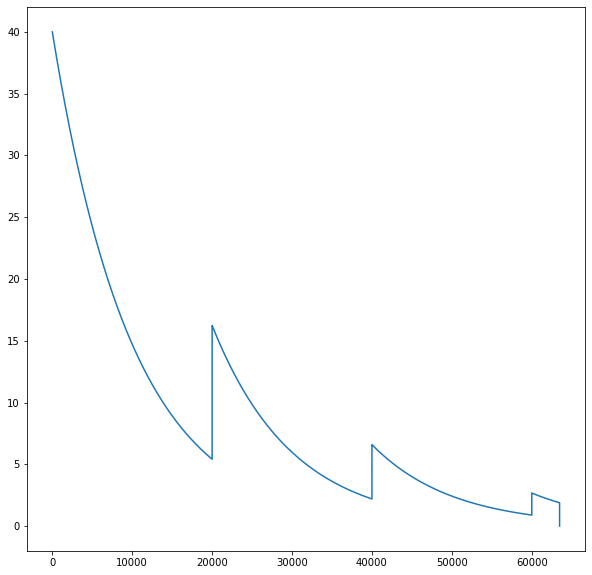

[[3 9 7 6 8 1 5 2 4]
 [6 4 5 2 7 9 8 1 3]
 [2 1 8 5 3 4 9 7 6]
 [8 2 3 9 5 6 7 4 1]
 [1 6 9 7 4 2 3 5 8]
 [7 5 4 3 1 8 6 9 2]
 [4 7 2 8 9 3 1 6 5]
 [5 3 1 4 6 7 2 8 9]
 [9 8 6 1 2 5 4 3 7]]
Znaleziono prawidłowe rozwiązanie w 63480 iteracjach

****************

[[6 3 0 0 0 0 0 0 0]
 [0 0 0 5 0 0 0 0 8]
 [0 0 5 6 7 4 0 0 0]
 [0 0 0 0 2 0 0 0 0]
 [0 0 3 4 0 1 0 2 0]
 [0 0 0 0 0 0 3 4 5]
 [0 0 0 0 0 7 0 0 4]
 [0 8 0 3 0 0 9 0 2]
 [9 4 7 1 0 0 0 8 0]]


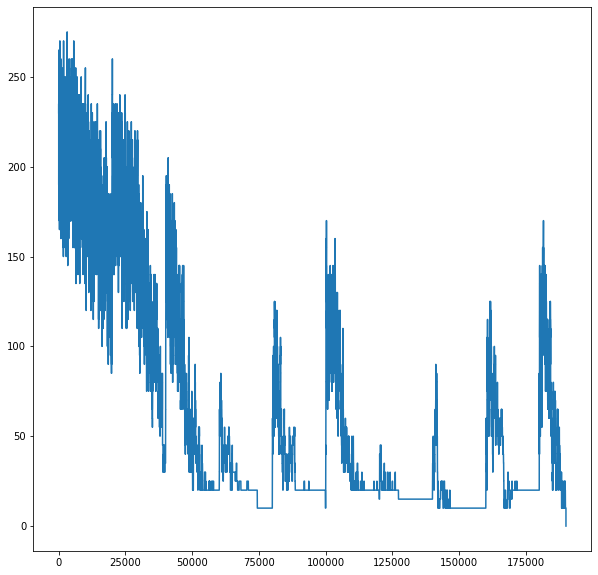

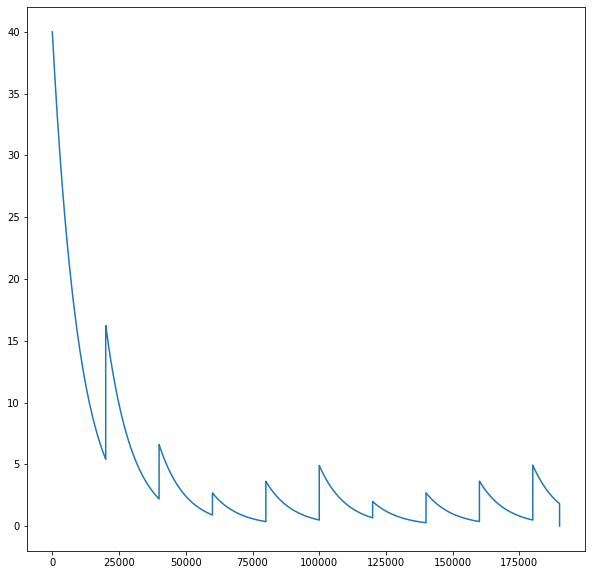

[[6 3 9 2 1 8 4 5 7]
 [4 7 1 5 3 9 2 6 8]
 [8 2 5 6 7 4 1 3 9]
 [5 6 4 8 2 3 7 9 1]
 [7 9 3 4 5 1 8 2 6]
 [2 1 8 7 9 6 3 4 5]
 [3 5 2 9 8 7 6 1 4]
 [1 8 6 3 4 5 9 7 2]
 [9 4 7 1 6 2 5 8 3]]
Znaleziono prawidłowe rozwiązanie w 190033 iteracjach

****************

[[0 0 0 0 2 0 0 4 0]
 [0 0 8 0 3 5 0 0 0]
 [0 0 0 0 7 0 6 0 2]
 [0 3 1 0 4 6 9 7 0]
 [2 0 0 0 0 0 0 0 0]
 [0 0 0 5 0 1 2 0 3]
 [0 4 9 0 0 0 7 3 0]
 [0 0 0 0 0 0 0 1 0]
 [8 0 0 0 0 4 0 0 0]]


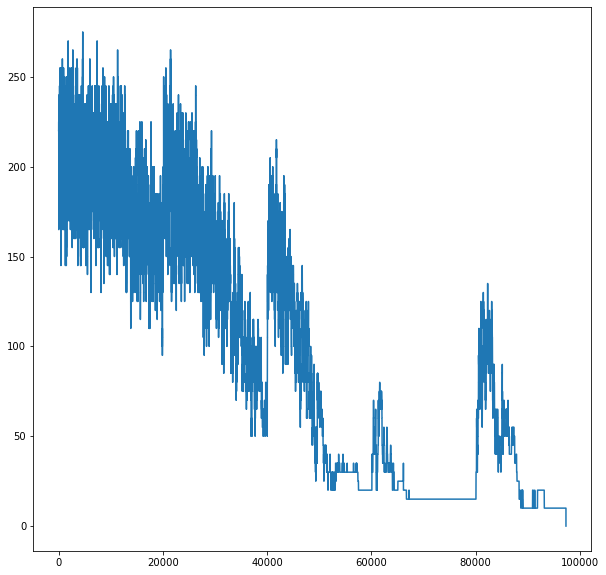

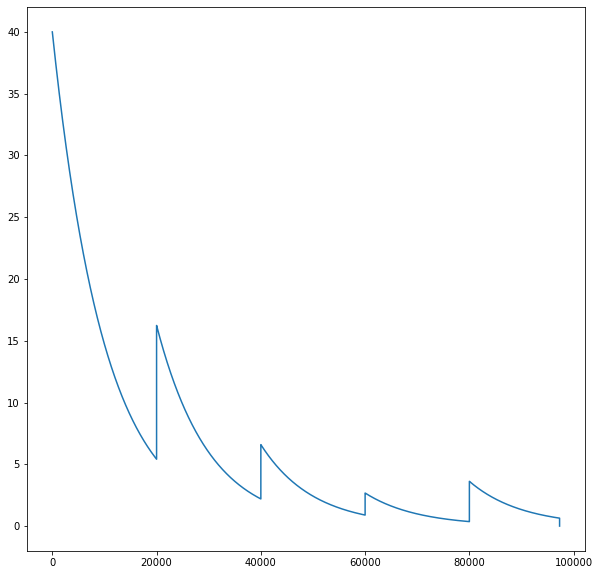

[[6 9 7 1 2 8 3 4 5]
 [4 2 8 6 3 5 1 9 7]
 [3 1 5 4 7 9 6 8 2]
 [5 3 1 2 4 6 9 7 8]
 [2 8 6 3 9 7 4 5 1]
 [9 7 4 5 8 1 2 6 3]
 [1 4 9 8 5 2 7 3 6]
 [7 5 2 9 6 3 8 1 4]
 [8 6 3 7 1 4 5 2 9]]
Znaleziono prawidłowe rozwiązanie w 97301 iteracjach

****************

[[3 6 1 0 2 5 9 0 0]
 [0 8 0 9 6 0 0 1 0]
 [4 0 0 0 0 0 0 5 7]
 [0 0 8 0 0 0 4 7 1]
 [0 0 0 6 0 3 0 0 0]
 [2 5 9 0 0 0 8 0 0]
 [7 4 0 0 0 0 0 0 5]
 [0 2 0 0 1 8 0 6 0]
 [0 0 5 4 7 0 3 2 9]]


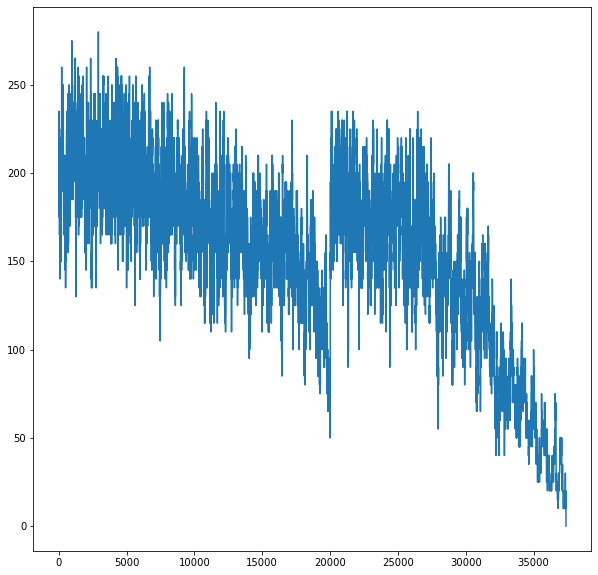

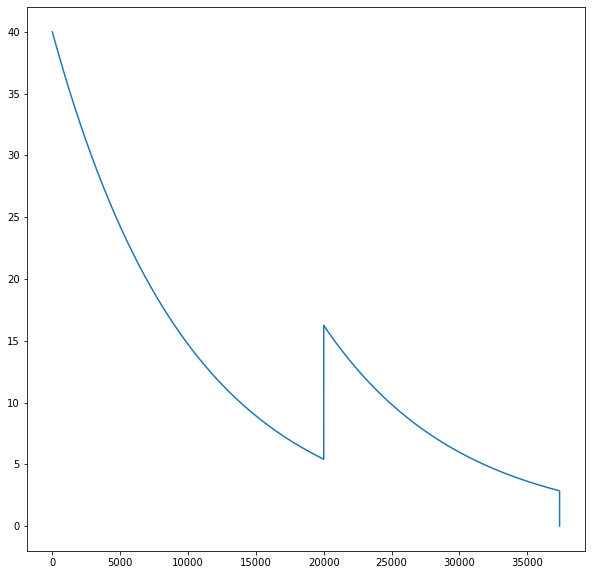

[[3 6 1 7 2 5 9 4 8]
 [5 8 7 9 6 4 2 1 3]
 [4 9 2 8 3 1 6 5 7]
 [6 3 8 2 5 9 4 7 1]
 [1 7 4 6 8 3 5 9 2]
 [2 5 9 1 4 7 8 3 6]
 [7 4 6 3 9 2 1 8 5]
 [9 2 3 5 1 8 7 6 4]
 [8 1 5 4 7 6 3 2 9]]
Znaleziono prawidłowe rozwiązanie w 37377 iteracjach

****************

[[0 5 0 8 0 7 0 2 0]
 [6 0 0 0 1 0 0 9 0]
 [7 0 2 5 4 0 0 0 6]
 [0 7 0 0 2 0 3 0 1]
 [5 0 4 0 0 0 9 0 8]
 [1 0 3 0 8 0 0 7 0]
 [9 0 0 0 7 6 2 0 5]
 [0 6 0 0 9 0 0 0 3]
 [0 8 0 1 0 3 0 4 0]]


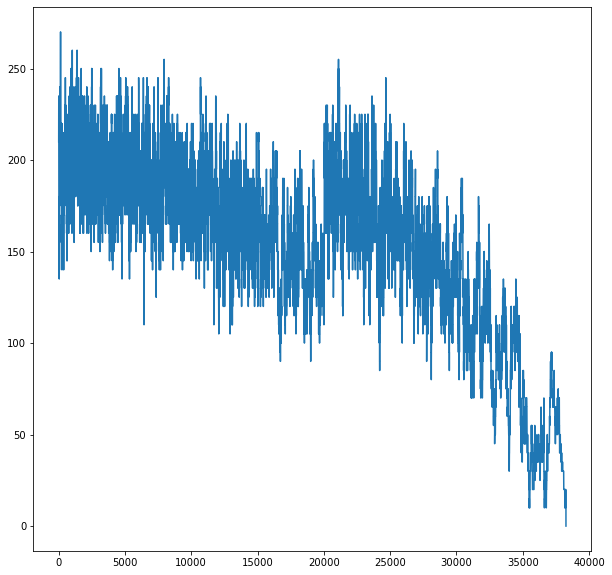

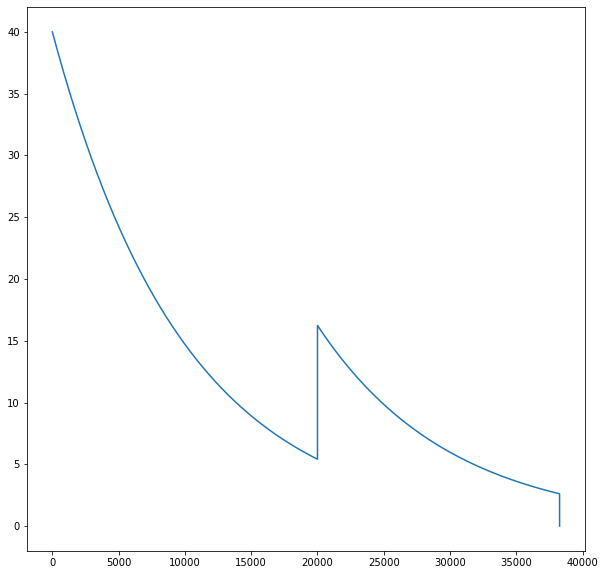

[[3 5 9 8 6 7 1 2 4]
 [6 4 8 3 1 2 5 9 7]
 [7 1 2 5 4 9 8 3 6]
 [8 7 6 9 2 4 3 5 1]
 [5 2 4 7 3 1 9 6 8]
 [1 9 3 6 8 5 4 7 2]
 [9 3 1 4 7 6 2 8 5]
 [4 6 5 2 9 8 7 1 3]
 [2 8 7 1 5 3 6 4 9]]
Znaleziono prawidłowe rozwiązanie w 38260 iteracjach

****************

[[0 8 0 0 0 5 0 0 0]
 [0 0 0 0 0 3 4 5 7]
 [0 0 0 0 7 0 8 0 9]
 [0 6 0 4 0 0 9 0 3]
 [0 0 7 0 1 0 5 0 0]
 [4 0 8 0 0 7 0 2 0]
 [9 0 1 0 2 0 0 0 0]
 [8 4 2 3 0 0 0 0 0]
 [0 0 0 1 0 0 0 8 0]]


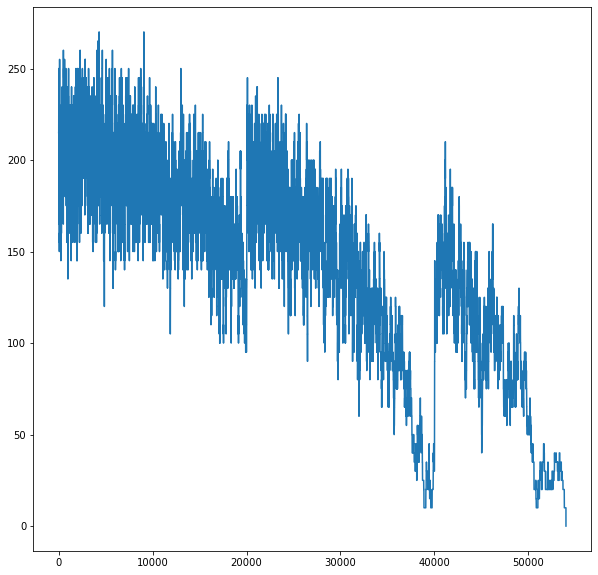

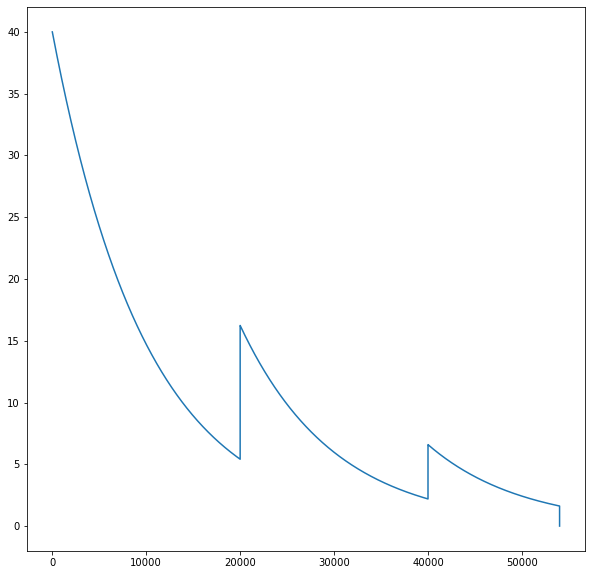

[[7 8 6 9 4 5 3 1 2]
 [2 1 9 8 6 3 4 5 7]
 [5 3 4 2 7 1 8 6 9]
 [1 6 5 4 8 2 9 7 3]
 [3 2 7 6 1 9 5 4 8]
 [4 9 8 5 3 7 1 2 6]
 [9 5 1 7 2 8 6 3 4]
 [8 4 2 3 5 6 7 9 1]
 [6 7 3 1 9 4 2 8 5]]
Znaleziono prawidłowe rozwiązanie w 54009 iteracjach

****************

[[0 0 3 5 0 2 9 0 0]
 [0 0 0 0 4 0 0 0 0]
 [1 0 6 0 0 0 3 0 5]
 [9 0 0 2 5 1 0 0 8]
 [0 7 0 4 0 8 0 3 0]
 [8 0 0 7 6 3 0 0 1]
 [3 0 8 0 0 0 1 0 4]
 [0 0 0 0 2 0 0 0 0]
 [0 0 5 1 0 4 8 0 0]]


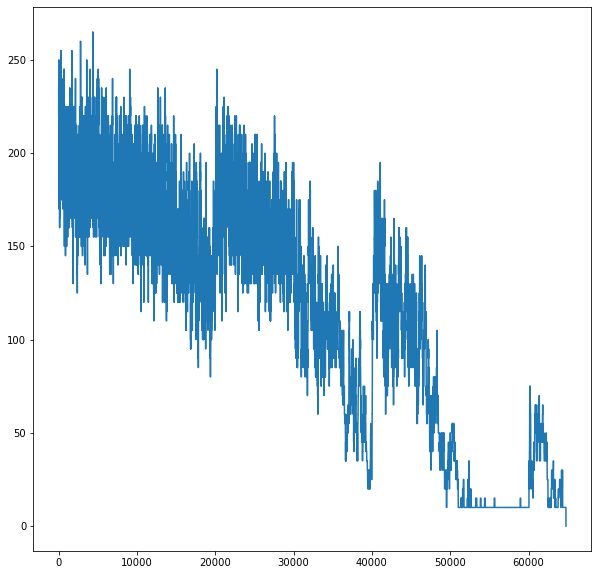

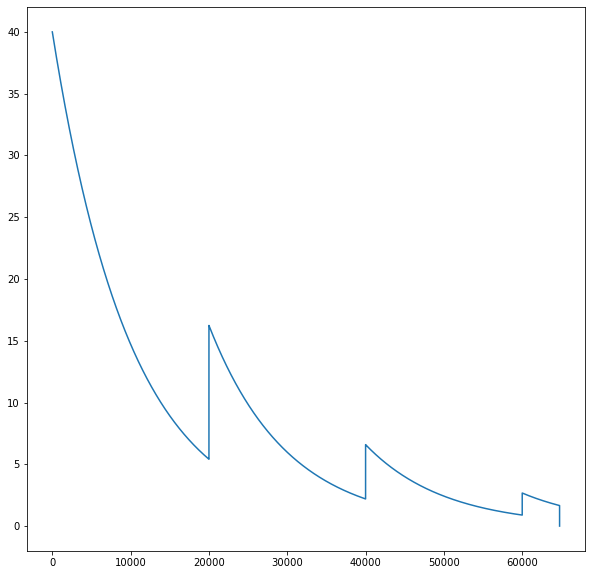

[[7 4 3 5 1 2 9 8 6]
 [5 8 9 3 4 6 2 1 7]
 [1 2 6 9 8 7 3 4 5]
 [9 3 4 2 5 1 7 6 8]
 [6 7 1 4 9 8 5 3 2]
 [8 5 2 7 6 3 4 9 1]
 [3 9 8 6 7 5 1 2 4]
 [4 1 7 8 2 9 6 5 3]
 [2 6 5 1 3 4 8 7 9]]
Znaleziono prawidłowe rozwiązanie w 64770 iteracjach

****************

[[0 0 0 0 0 0 0 0 0]
 [0 0 9 8 0 5 1 0 0]
 [0 5 1 9 0 7 4 2 0]
 [2 9 0 4 0 1 0 6 5]
 [0 0 0 0 0 0 0 0 0]
 [1 4 0 5 0 8 0 9 3]
 [0 2 6 7 0 9 5 8 0]
 [0 0 5 1 0 3 6 0 0]
 [0 0 0 0 0 0 0 0 0]]


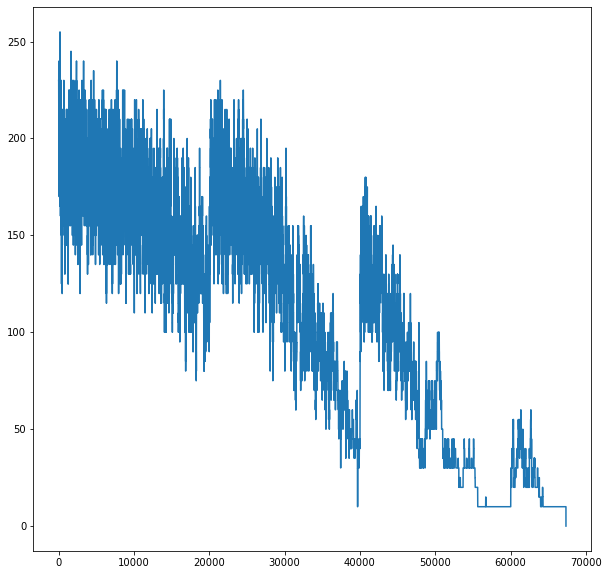

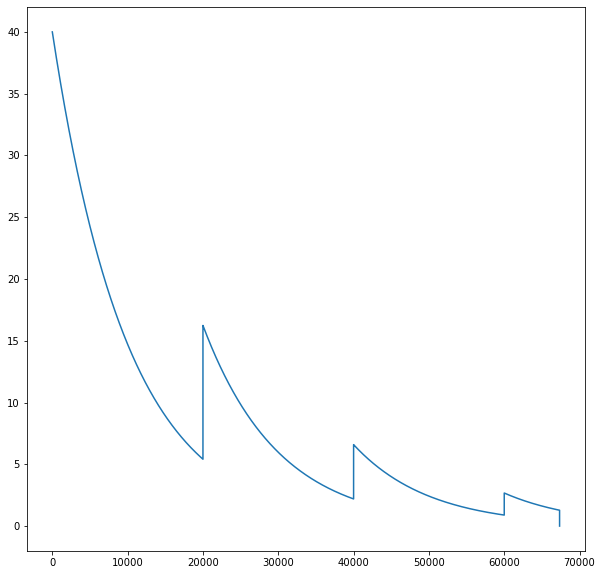

[[7 8 2 6 1 4 3 5 9]
 [4 3 9 8 2 5 1 7 6]
 [6 5 1 9 3 7 4 2 8]
 [2 9 3 4 7 1 8 6 5]
 [5 6 8 3 9 2 7 1 4]
 [1 4 7 5 6 8 2 9 3]
 [3 2 6 7 4 9 5 8 1]
 [9 7 5 1 8 3 6 4 2]
 [8 1 4 2 5 6 9 3 7]]
Znaleziono prawidłowe rozwiązanie w 67347 iteracjach

****************

[[0 2 0 0 3 0 0 9 0]
 [0 0 0 9 0 7 0 0 0]
 [9 0 0 2 0 8 0 0 5]
 [0 0 4 8 0 6 5 0 0]
 [6 0 7 0 0 0 2 0 8]
 [0 0 3 1 0 2 9 0 0]
 [8 0 0 6 0 5 0 0 7]
 [0 0 0 3 0 9 0 0 0]
 [0 3 0 0 2 0 0 5 0]]


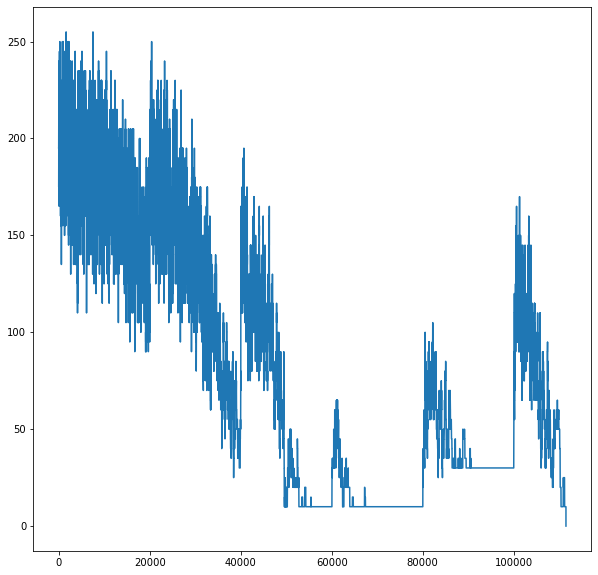

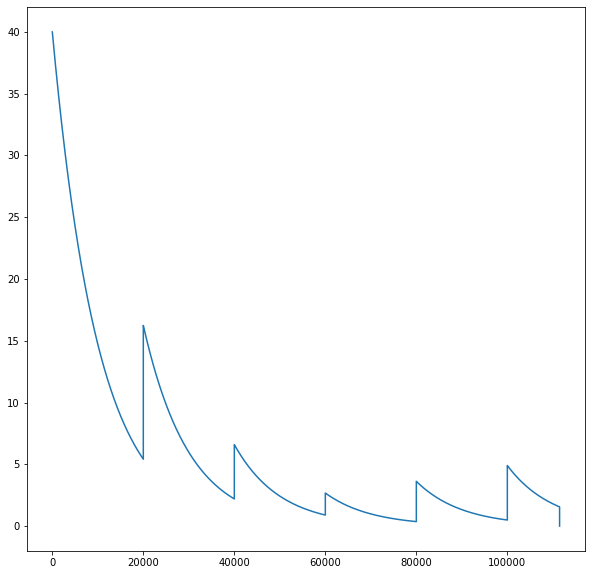

[[4 2 8 5 3 1 7 9 6]
 [3 6 5 9 4 7 1 8 2]
 [9 7 1 2 6 8 4 3 5]
 [2 1 4 8 9 6 5 7 3]
 [6 9 7 4 5 3 2 1 8]
 [5 8 3 1 7 2 9 6 4]
 [8 4 9 6 1 5 3 2 7]
 [7 5 2 3 8 9 6 4 1]
 [1 3 6 7 2 4 8 5 9]]
Znaleziono prawidłowe rozwiązanie w 111483 iteracjach

****************

[[0 0 5 0 0 0 0 0 6]
 [0 7 0 0 0 9 0 2 0]
 [0 0 0 5 0 0 1 0 7]
 [8 0 4 1 5 0 0 0 0]
 [0 0 0 8 0 3 0 0 0]
 [0 0 0 0 9 2 8 0 5]
 [9 0 7 0 0 6 0 0 0]
 [0 3 0 4 0 0 0 1 0]
 [2 0 0 0 0 0 6 0 0]]


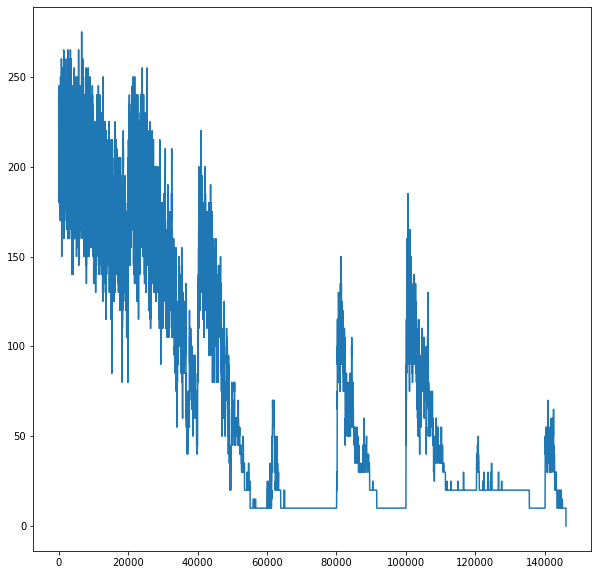

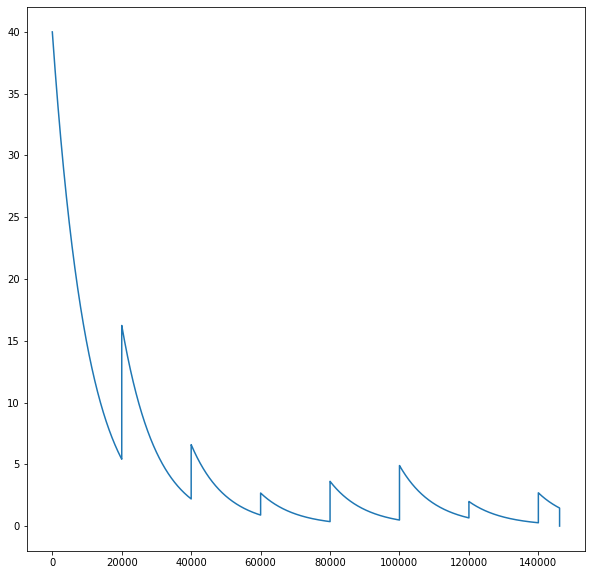

[[4 2 5 7 8 1 9 3 6]
 [1 7 8 3 6 9 5 2 4]
 [3 6 9 5 2 4 1 8 7]
 [8 9 4 1 5 7 3 6 2]
 [6 5 2 8 4 3 7 9 1]
 [7 1 3 6 9 2 8 4 5]
 [9 8 7 2 1 6 4 5 3]
 [5 3 6 4 7 8 2 1 9]
 [2 4 1 9 3 5 6 7 8]]
Znaleziono prawidłowe rozwiązanie w 146113 iteracjach

****************

[[0 4 0 0 0 0 0 5 0]
 [0 0 1 9 4 3 6 0 0]
 [0 0 9 0 0 0 3 0 0]
 [6 0 0 0 5 0 0 0 2]
 [1 0 3 0 0 0 5 0 6]
 [8 0 0 0 2 0 0 0 7]
 [0 0 5 0 0 0 2 0 0]
 [0 0 2 4 3 6 7 0 0]
 [0 3 0 0 0 0 0 4 0]]


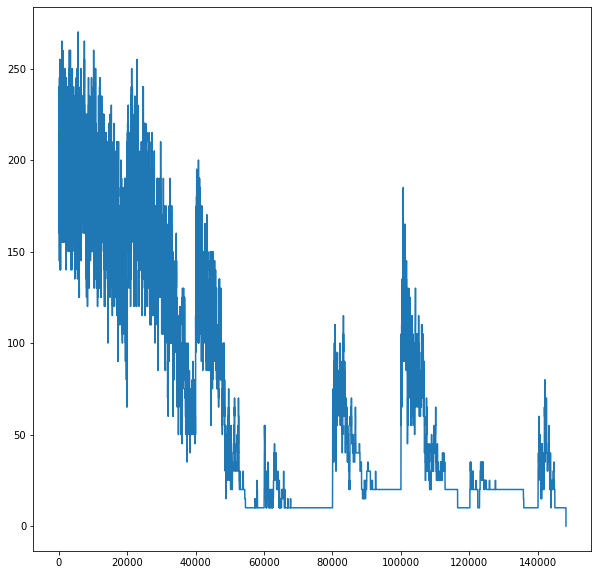

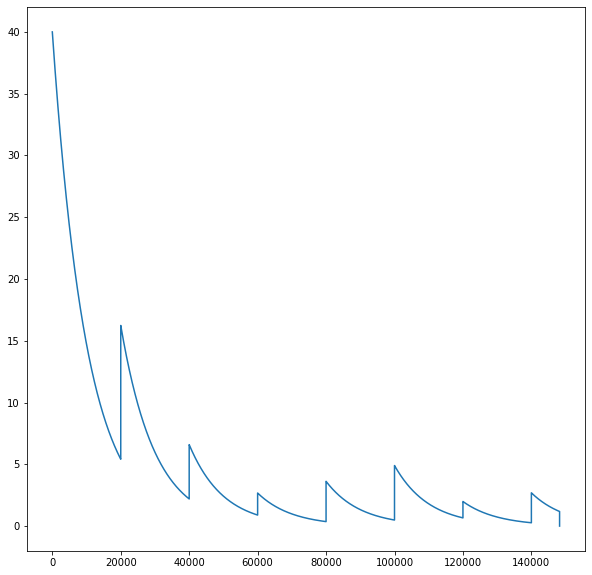

[[3 4 8 2 6 7 9 5 1]
 [5 7 1 9 4 3 6 2 8]
 [2 6 9 1 8 5 3 7 4]
 [6 9 7 3 5 1 4 8 2]
 [1 2 3 8 7 4 5 9 6]
 [8 5 4 6 2 9 1 3 7]
 [4 1 5 7 9 8 2 6 3]
 [9 8 2 4 3 6 7 1 5]
 [7 3 6 5 1 2 8 4 9]]
Znaleziono prawidłowe rozwiązanie w 148242 iteracjach

****************

[[0 0 4 0 0 0 0 0 0]
 [0 0 0 0 3 0 0 0 2]
 [3 9 0 7 0 0 0 8 0]
 [4 0 0 0 0 9 0 0 1]
 [2 0 9 8 0 1 3 0 7]
 [6 0 0 2 0 0 0 0 8]
 [0 1 0 0 0 8 0 5 3]
 [9 0 0 0 4 0 0 0 0]
 [0 0 0 0 0 0 8 0 0]]


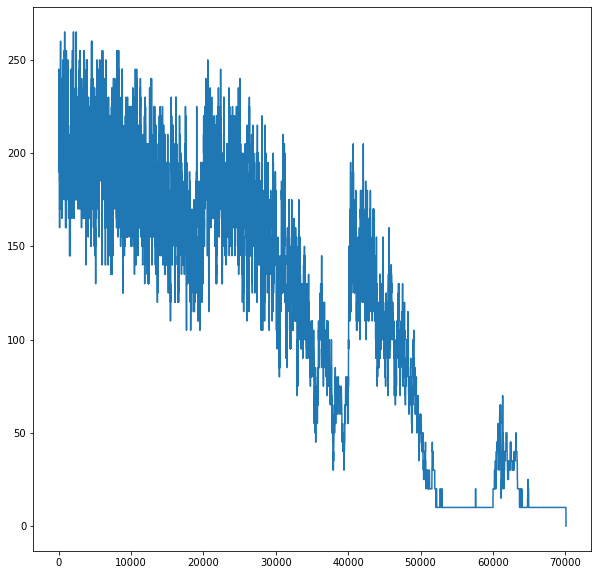

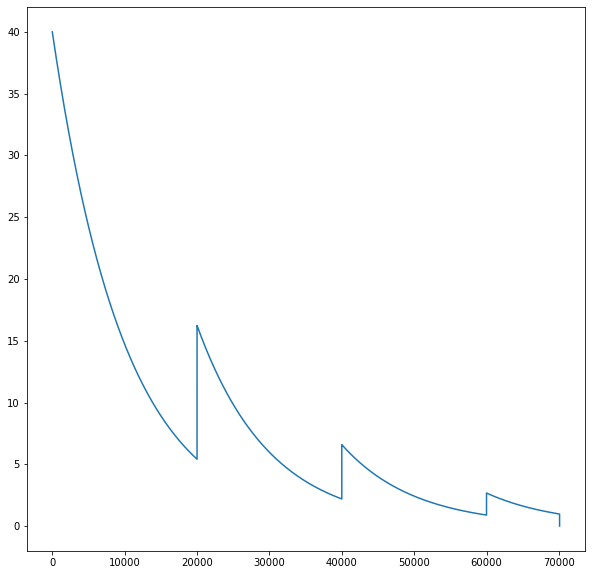

[[1 2 4 9 8 6 7 3 5]
 [8 6 7 4 3 5 9 1 2]
 [3 9 5 7 1 2 6 8 4]
 [4 7 8 3 5 9 2 6 1]
 [2 5 9 8 6 1 3 4 7]
 [6 3 1 2 7 4 5 9 8]
 [7 1 2 6 9 8 4 5 3]
 [9 8 3 5 4 7 1 2 6]
 [5 4 6 1 2 3 8 7 9]]
Znaleziono prawidłowe rozwiązanie w 70096 iteracjach

****************

[[3 6 0 0 2 0 0 8 9]
 [0 0 0 3 6 1 0 0 0]
 [0 0 0 0 0 0 0 0 0]
 [8 0 3 0 0 0 6 0 2]
 [4 0 0 6 0 3 0 0 7]
 [6 0 7 0 0 0 1 0 8]
 [0 0 0 0 0 0 0 0 0]
 [0 0 0 4 1 8 0 0 0]
 [9 7 0 0 3 0 0 1 4]]


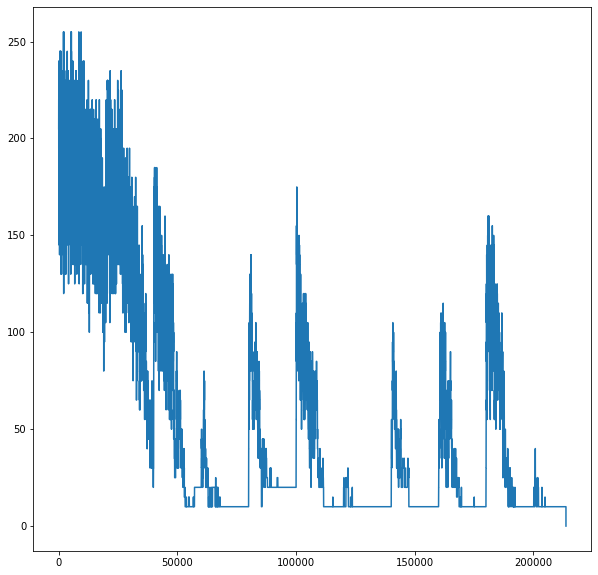

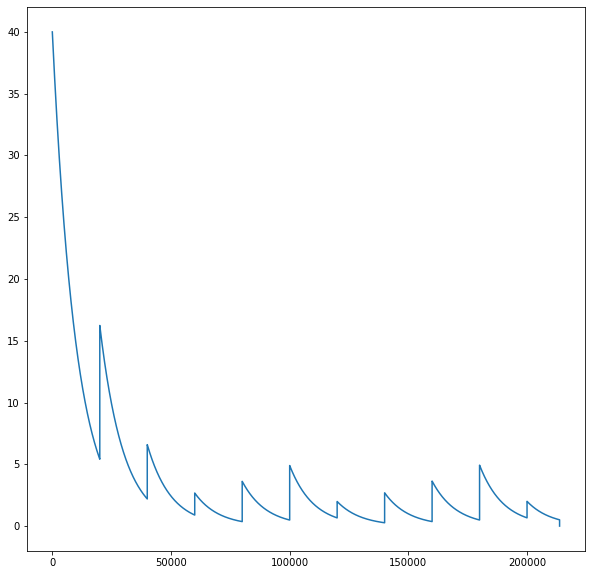

[[3 6 1 5 2 4 7 8 9]
 [7 8 9 3 6 1 4 2 5]
 [5 2 4 8 7 9 3 6 1]
 [8 9 3 1 5 7 6 4 2]
 [4 1 2 6 8 3 5 9 7]
 [6 5 7 9 4 2 1 3 8]
 [1 4 8 7 9 6 2 5 3]
 [2 3 5 4 1 8 9 7 6]
 [9 7 6 2 3 5 8 1 4]]
Znaleziono prawidłowe rozwiązanie w 213711 iteracjach

****************

[[5 0 0 4 0 0 0 6 0]
 [0 0 9 0 0 0 8 0 0]
 [6 4 0 0 2 0 0 0 0]
 [0 0 0 0 0 1 0 0 8]
 [2 0 8 0 0 0 5 0 1]
 [7 0 0 5 0 0 0 0 0]
 [0 0 0 0 9 0 0 8 4]
 [0 0 3 0 0 0 6 0 0]
 [0 6 0 0 0 3 0 0 2]]


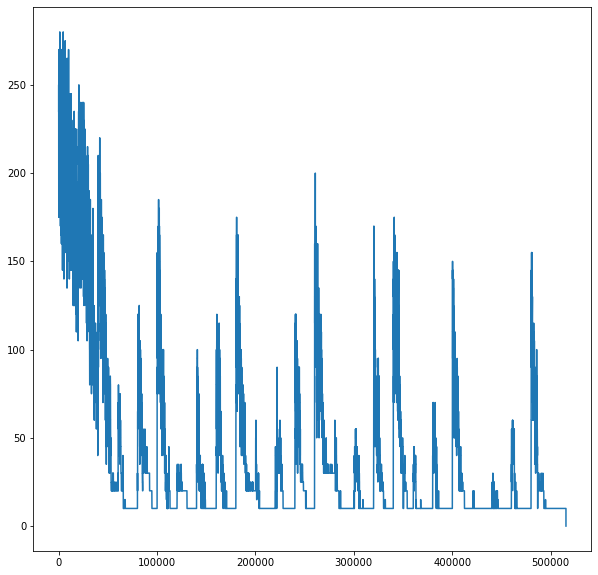

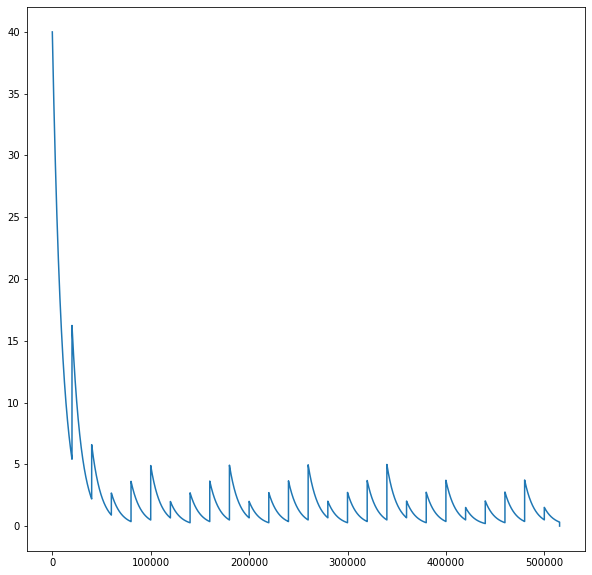

[[5 8 1 4 7 9 2 6 3]
 [3 2 9 1 5 6 8 4 7]
 [6 4 7 3 2 8 1 5 9]
 [9 5 6 7 3 1 4 2 8]
 [2 3 8 9 6 4 5 7 1]
 [7 1 4 5 8 2 9 3 6]
 [1 7 2 6 9 5 3 8 4]
 [8 9 3 2 4 7 6 1 5]
 [4 6 5 8 1 3 7 9 2]]
Znaleziono prawidłowe rozwiązanie w 515527 iteracjach

****************

[[0 0 7 2 5 6 4 0 0]
 [4 0 0 0 0 0 0 0 5]
 [0 1 0 0 3 0 0 6 0]
 [0 0 0 5 0 8 0 0 0]
 [0 0 8 0 6 0 2 0 0]
 [0 0 0 1 0 7 0 0 0]
 [0 3 0 0 7 0 0 9 0]
 [2 0 0 0 0 0 0 0 4]
 [0 0 6 3 1 2 7 0 0]]


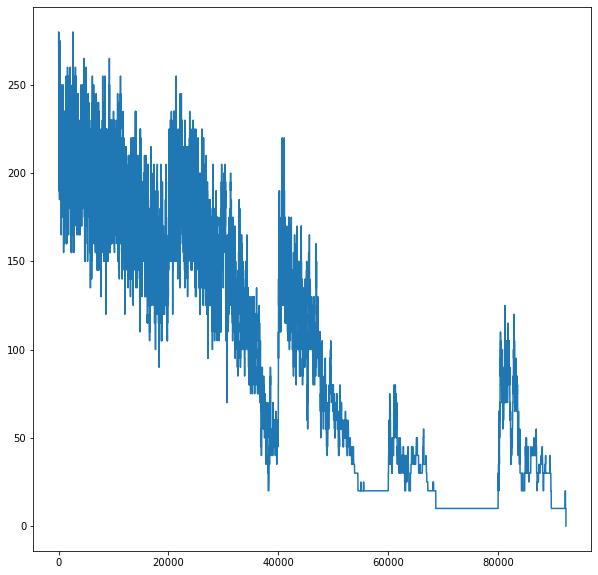

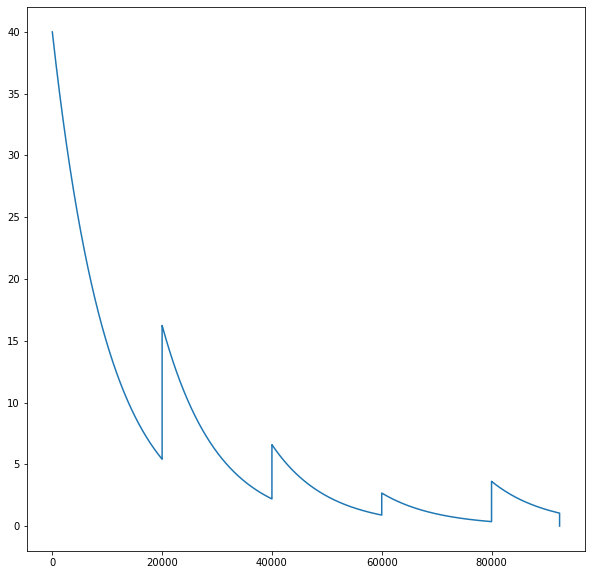

[[3 8 7 2 5 6 4 1 9]
 [4 6 9 7 8 1 3 2 5]
 [5 1 2 4 3 9 8 6 7]
 [1 2 3 5 4 8 9 7 6]
 [7 5 8 9 6 3 2 4 1]
 [6 9 4 1 2 7 5 8 3]
 [8 3 5 6 7 4 1 9 2]
 [2 7 1 8 9 5 6 3 4]
 [9 4 6 3 1 2 7 5 8]]
Znaleziono prawidłowe rozwiązanie w 92392 iteracjach

****************

[[0 0 0 0 0 0 0 0 0]
 [0 7 9 0 5 0 1 8 0]
 [8 0 0 0 0 0 0 0 7]
 [0 0 7 3 0 6 8 0 0]
 [4 5 0 7 0 8 0 9 6]
 [0 0 3 5 0 2 7 0 0]
 [7 0 0 0 0 0 0 0 5]
 [0 1 6 0 3 0 4 2 0]
 [0 0 0 0 0 0 0 0 0]]


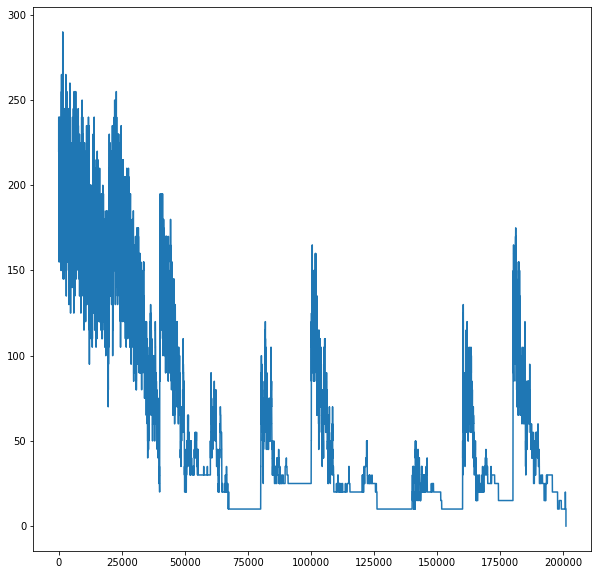

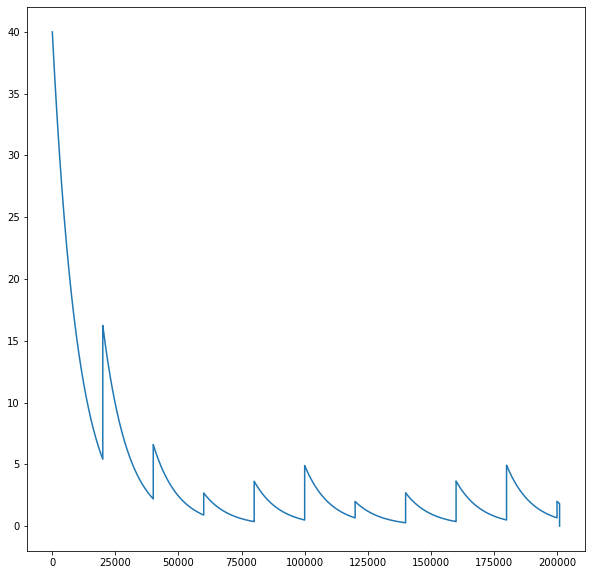

[[3 4 5 8 7 1 2 6 9]
 [2 7 9 6 5 3 1 8 4]
 [8 6 1 4 2 9 5 3 7]
 [1 9 7 3 4 6 8 5 2]
 [4 5 2 7 1 8 3 9 6]
 [6 8 3 5 9 2 7 4 1]
 [7 3 8 2 6 4 9 1 5]
 [5 1 6 9 3 7 4 2 8]
 [9 2 4 1 8 5 6 7 3]]
Znaleziono prawidłowe rozwiązanie w 201014 iteracjach

****************

[[0 3 0 0 0 0 0 8 0]
 [0 0 9 0 0 0 5 0 0]
 [0 0 7 5 0 9 2 0 0]
 [7 0 0 1 0 5 0 0 8]
 [0 2 0 0 9 0 0 3 0]
 [9 0 0 4 0 2 0 0 1]
 [0 0 4 2 0 7 1 0 0]
 [0 0 2 0 0 0 8 0 0]
 [0 7 0 0 0 0 0 9 0]]


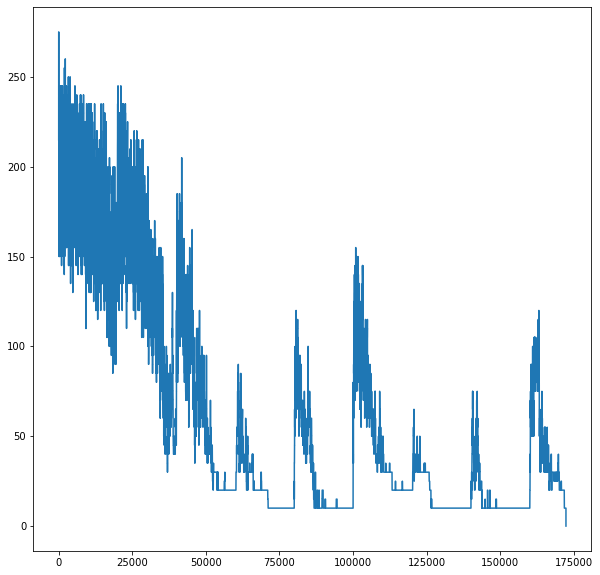

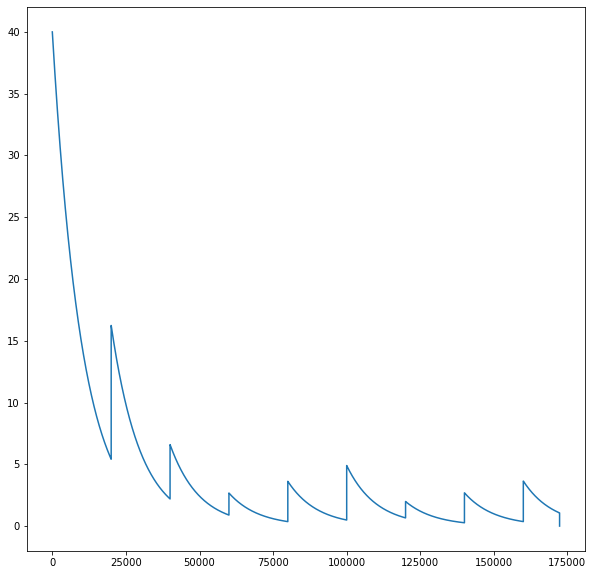

[[2 3 5 7 6 1 4 8 9]
 [4 1 9 3 2 8 5 7 6]
 [8 6 7 5 4 9 2 1 3]
 [7 4 6 1 3 5 9 2 8]
 [5 2 1 8 9 6 7 3 4]
 [9 8 3 4 7 2 6 5 1]
 [3 9 4 2 8 7 1 6 5]
 [6 5 2 9 1 3 8 4 7]
 [1 7 8 6 5 4 3 9 2]]
Znaleziono prawidłowe rozwiązanie w 172320 iteracjach

****************

[[2 0 0 1 7 0 6 0 3]
 [0 5 0 0 0 0 1 0 0]
 [0 0 0 0 0 6 0 7 9]
 [0 0 0 0 4 0 7 0 0]
 [0 0 0 8 0 1 0 0 0]
 [0 0 9 0 5 0 0 0 0]
 [3 1 0 4 0 0 0 0 0]
 [0 0 5 0 0 0 0 6 0]
 [9 0 6 0 3 7 0 0 2]]


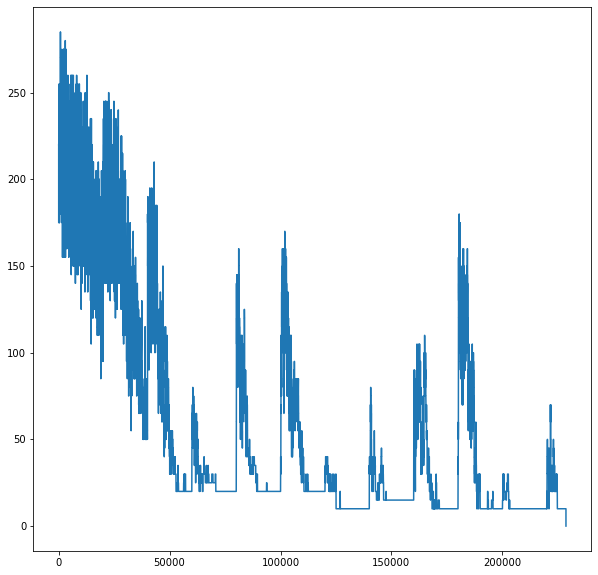

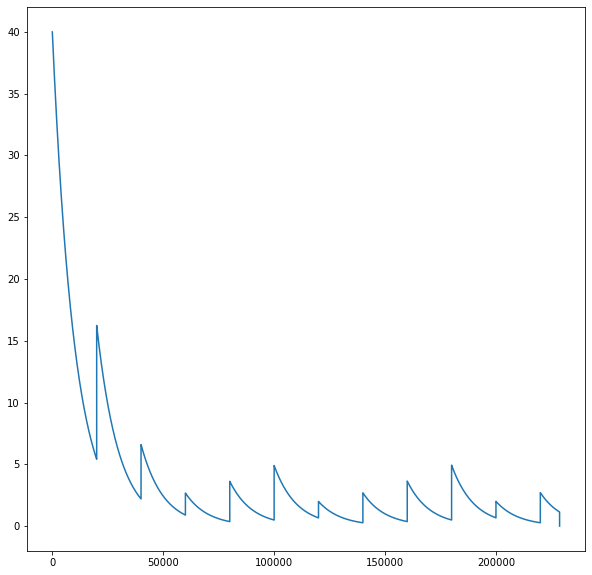

[[2 9 8 1 7 5 6 4 3]
 [6 5 7 3 9 4 1 2 8]
 [1 3 4 2 8 6 5 7 9]
 [8 2 1 6 4 9 7 3 5]
 [5 7 3 8 2 1 4 9 6]
 [4 6 9 7 5 3 2 8 1]
 [3 1 2 4 6 8 9 5 7]
 [7 8 5 9 1 2 3 6 4]
 [9 4 6 5 3 7 8 1 2]]
Znaleziono prawidłowe rozwiązanie w 228683 iteracjach

****************

[[0 0 0 0 0 0 0 8 0]
 [8 0 0 7 0 1 0 4 0]
 [0 4 0 0 2 0 0 3 0]
 [3 7 4 0 0 0 9 0 0]
 [0 0 0 0 3 0 0 0 0]
 [0 0 5 0 0 0 3 2 1]
 [0 1 0 0 6 0 0 5 0]
 [0 5 0 8 0 2 0 0 6]
 [0 8 0 0 0 0 0 0 0]]


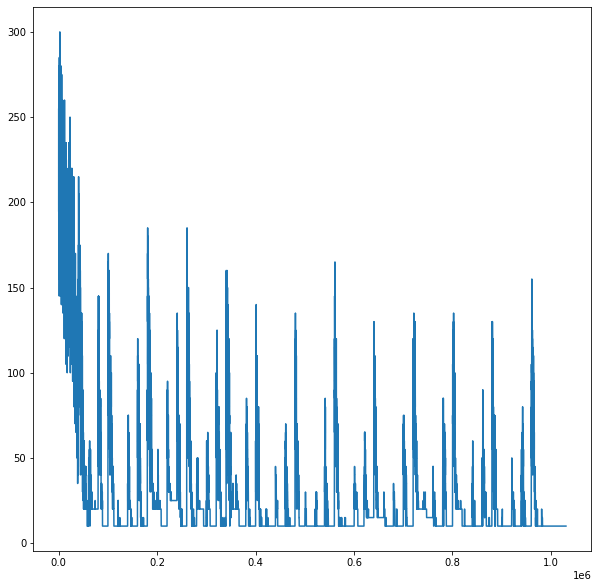

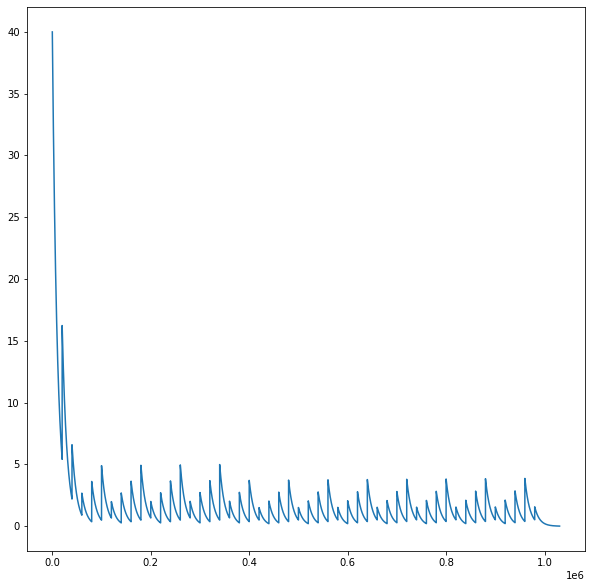

[[5 2 7 3 4 6 1 8 9]
 [8 3 9 7 5 1 6 4 2]
 [6 4 1 9 2 8 7 3 5]
 [3 7 4 2 7 5 9 6 8]
 [2 6 8 1 3 9 5 7 4]
 [1 9 5 6 8 4 3 2 1]
 [9 1 2 4 6 7 8 5 3]
 [7 5 3 8 9 2 4 1 6]
 [4 8 6 5 1 3 2 9 7]]
Nie rozwiązano, liczba pól błędnych 10

****************

[[0 0 0 0 0 0 0 8 5]
 [0 0 0 2 1 0 0 0 9]
 [9 6 0 0 8 0 1 0 0]
 [5 0 0 8 0 0 0 1 6]
 [0 0 0 0 0 0 0 0 0]
 [8 9 0 0 0 6 0 0 7]
 [0 0 9 0 7 0 0 5 2]
 [3 0 0 0 5 4 0 0 0]
 [4 8 0 0 0 0 0 0 0]]


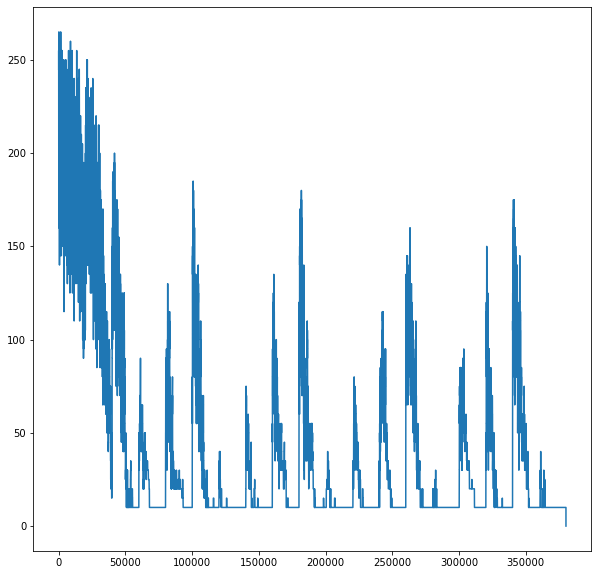

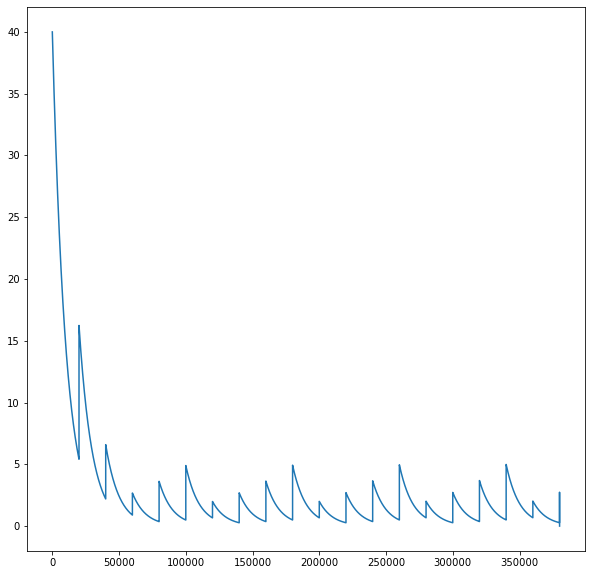

[[1 3 2 6 4 9 7 8 5]
 [7 5 8 2 1 3 6 4 9]
 [9 6 4 7 8 5 1 2 3]
 [5 4 3 8 9 7 2 1 6]
 [2 7 6 5 3 1 8 9 4]
 [8 9 1 4 2 6 5 3 7]
 [6 1 9 3 7 8 4 5 2]
 [3 2 7 1 5 4 9 6 8]
 [4 8 5 9 6 2 3 7 1]]
Znaleziono prawidłowe rozwiązanie w 380029 iteracjach

****************

[[6 0 8 0 7 0 5 0 2]
 [0 5 0 6 0 8 0 7 0]
 [0 0 2 0 0 0 3 0 0]
 [5 0 0 0 9 0 0 0 6]
 [0 4 0 3 0 2 0 5 0]
 [8 0 0 0 5 0 0 0 3]
 [0 0 5 0 0 0 2 0 0]
 [0 1 0 7 0 4 0 9 0]
 [4 0 9 0 6 0 7 0 1]]


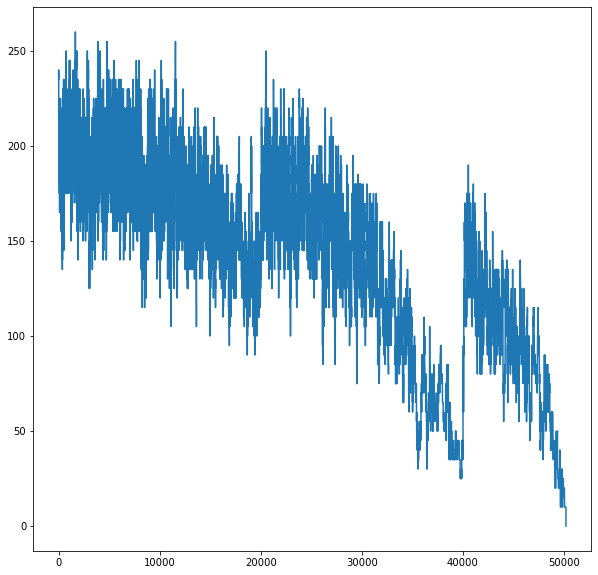

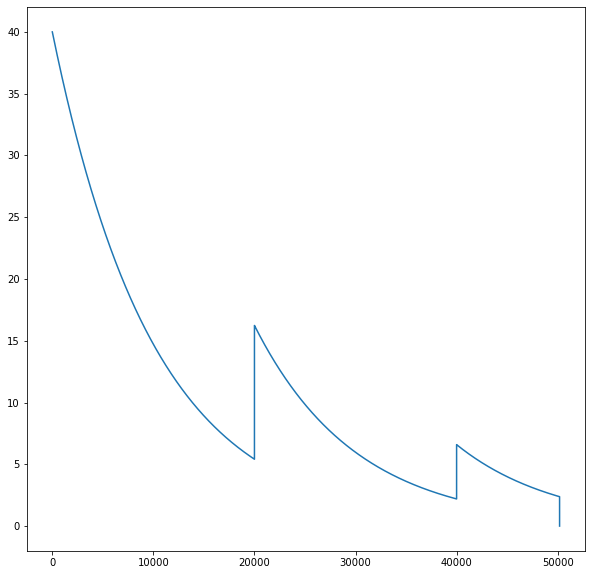

[[6 9 8 1 7 3 5 4 2]
 [3 5 4 6 2 8 1 7 9]
 [1 7 2 5 4 9 3 6 8]
 [5 3 1 8 9 7 4 2 6]
 [9 4 6 3 1 2 8 5 7]
 [8 2 7 4 5 6 9 1 3]
 [7 6 5 9 3 1 2 8 4]
 [2 1 3 7 8 4 6 9 5]
 [4 8 9 2 6 5 7 3 1]]
Znaleziono prawidłowe rozwiązanie w 50189 iteracjach

****************

[[0 5 0 0 1 0 0 4 0]
 [1 0 7 0 0 0 6 0 2]
 [0 0 0 9 0 5 0 0 0]
 [2 0 8 0 3 0 5 0 1]
 [0 4 0 0 7 0 0 2 0]
 [9 0 1 0 8 0 4 0 6]
 [0 0 0 4 0 1 0 0 0]
 [3 0 4 0 0 0 7 0 9]
 [0 2 0 0 6 0 0 1 0]]


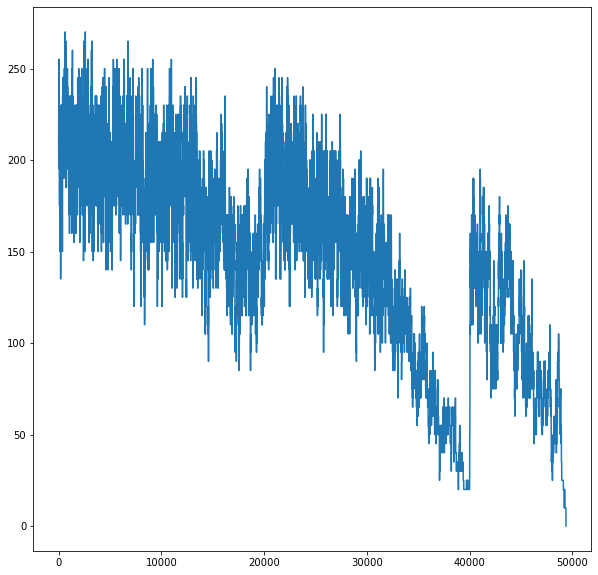

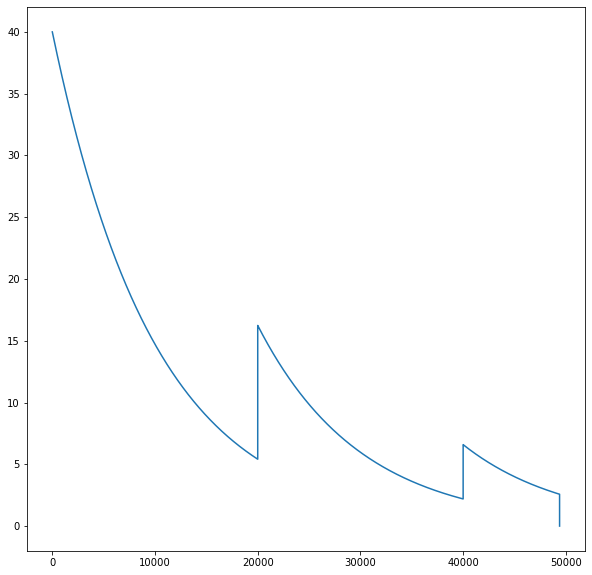

[[8 5 2 7 1 6 9 4 3]
 [1 9 7 8 4 3 6 5 2]
 [4 6 3 9 2 5 1 8 7]
 [2 7 8 6 3 4 5 9 1]
 [6 4 5 1 7 9 3 2 8]
 [9 3 1 5 8 2 4 7 6]
 [7 8 6 4 9 1 2 3 5]
 [3 1 4 2 5 8 7 6 9]
 [5 2 9 3 6 7 8 1 4]]
Znaleziono prawidłowe rozwiązanie w 49389 iteracjach

****************

[[0 5 3 0 0 0 7 9 0]
 [0 0 9 7 5 3 4 0 0]
 [1 0 0 0 0 0 0 0 2]
 [0 9 0 0 8 0 0 1 0]
 [0 0 0 9 0 7 0 0 0]
 [0 8 0 0 3 0 0 7 0]
 [5 0 0 0 0 0 0 0 3]
 [0 0 7 6 4 1 2 0 0]
 [0 6 1 0 0 0 9 4 0]]


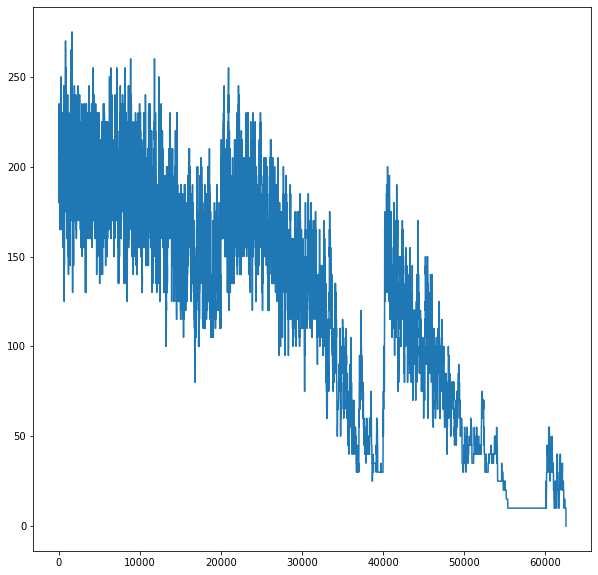

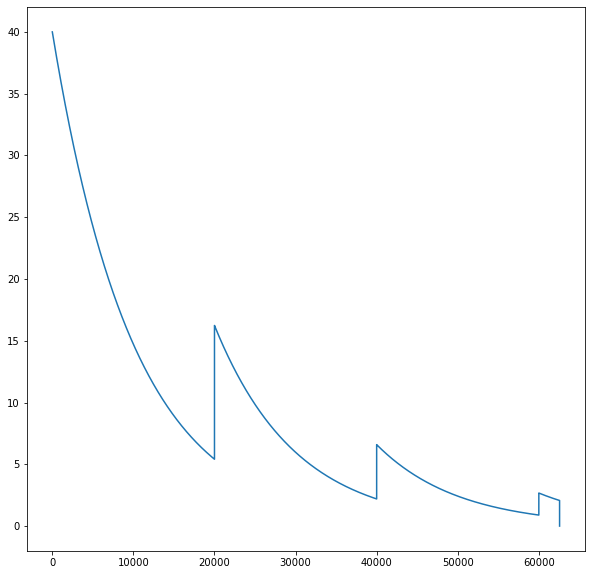

[[4 5 3 2 1 8 7 9 6]
 [6 2 9 7 5 3 4 8 1]
 [1 7 8 4 9 6 5 3 2]
 [7 9 6 5 8 2 3 1 4]
 [3 1 4 9 6 7 8 2 5]
 [2 8 5 1 3 4 6 7 9]
 [5 4 2 8 7 9 1 6 3]
 [9 3 7 6 4 1 2 5 8]
 [8 6 1 3 2 5 9 4 7]]
Znaleziono prawidłowe rozwiązanie w 62559 iteracjach

****************

[[0 0 6 0 8 0 3 0 0]
 [0 4 9 0 7 0 2 5 0]
 [0 0 0 4 0 5 0 0 0]
 [6 0 0 3 1 7 0 0 4]
 [0 0 7 0 0 0 8 0 0]
 [1 0 0 8 2 6 0 0 9]
 [0 0 0 7 0 2 0 0 0]
 [0 7 5 0 4 0 1 9 0]
 [0 0 3 0 9 0 6 0 0]]


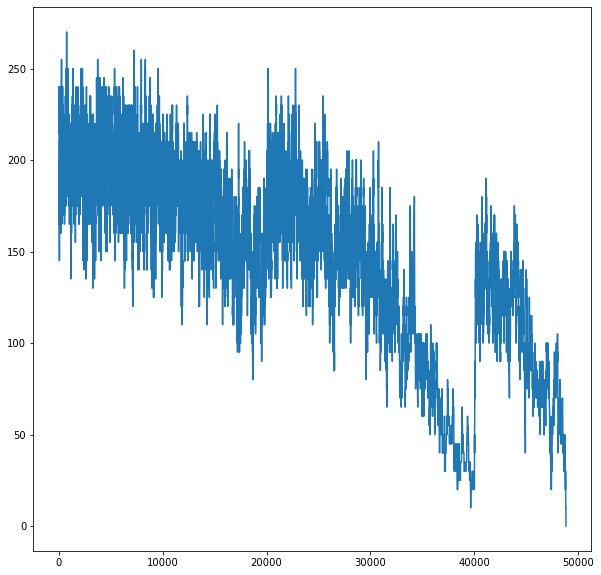

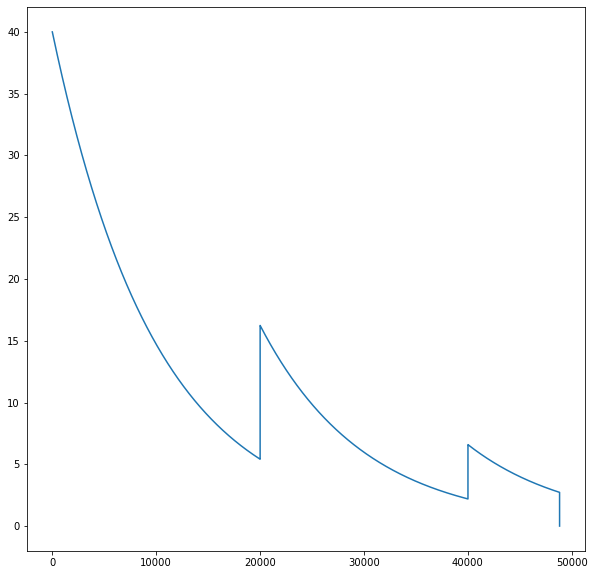

[[5 1 6 2 8 9 3 4 7]
 [8 4 9 1 7 3 2 5 6]
 [7 3 2 4 6 5 9 1 8]
 [6 9 8 3 1 7 5 2 4]
 [3 2 7 9 5 4 8 6 1]
 [1 5 4 8 2 6 7 3 9]
 [9 6 1 7 3 2 4 8 5]
 [2 7 5 6 4 8 1 9 3]
 [4 8 3 5 9 1 6 7 2]]
Znaleziono prawidłowe rozwiązanie w 48817 iteracjach

****************

[[0 0 5 0 8 0 7 0 0]
 [7 0 0 2 0 4 0 0 5]
 [3 2 0 0 0 0 0 8 4]
 [0 6 0 1 0 5 0 4 0]
 [0 0 8 0 0 0 5 0 0]
 [0 7 0 8 0 3 0 1 0]
 [4 5 0 0 0 0 0 9 1]
 [6 0 0 5 0 8 0 0 7]
 [0 0 3 0 1 0 6 0 0]]


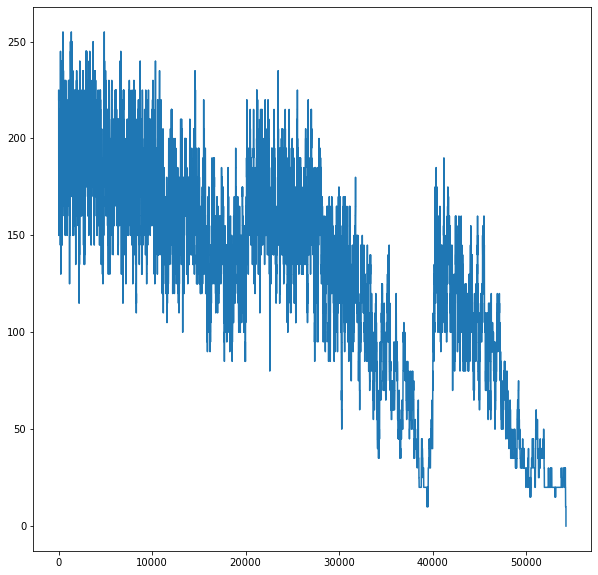

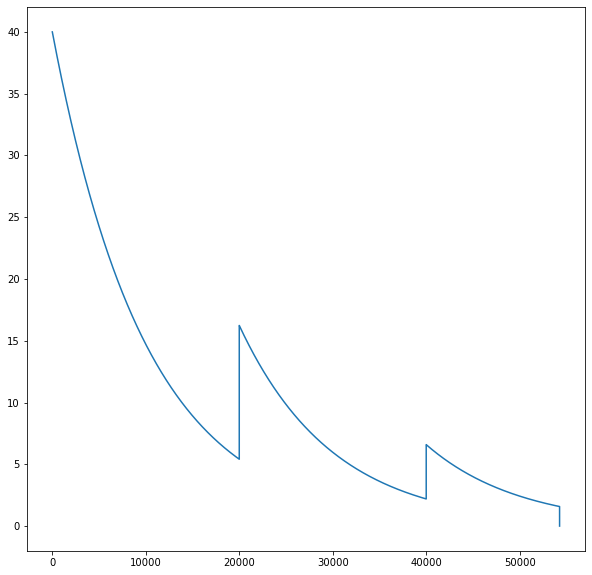

[[9 4 5 6 8 1 7 2 3]
 [7 8 1 2 3 4 9 6 5]
 [3 2 6 7 5 9 1 8 4]
 [2 6 9 1 7 5 3 4 8]
 [1 3 8 9 4 2 5 7 6]
 [5 7 4 8 6 3 2 1 9]
 [4 5 7 3 2 6 8 9 1]
 [6 1 2 5 9 8 4 3 7]
 [8 9 3 4 1 7 6 5 2]]
Znaleziono prawidłowe rozwiązanie w 54267 iteracjach

****************

[[0 0 0 9 0 0 8 0 0]
 [1 2 8 0 0 6 4 0 0]
 [0 7 0 8 0 0 0 6 0]
 [8 0 0 4 3 0 0 0 7]
 [5 0 0 0 0 0 0 0 9]
 [6 0 0 0 7 9 0 0 8]
 [0 9 0 0 0 4 0 1 0]
 [0 0 3 6 0 0 2 8 4]
 [0 0 1 0 0 7 0 0 0]]


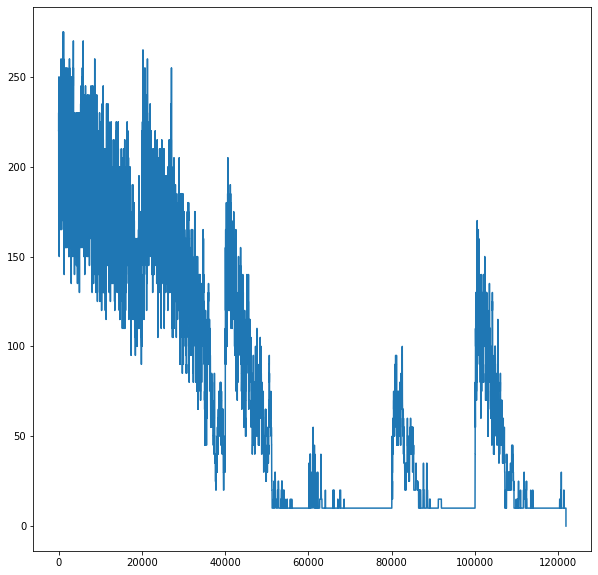

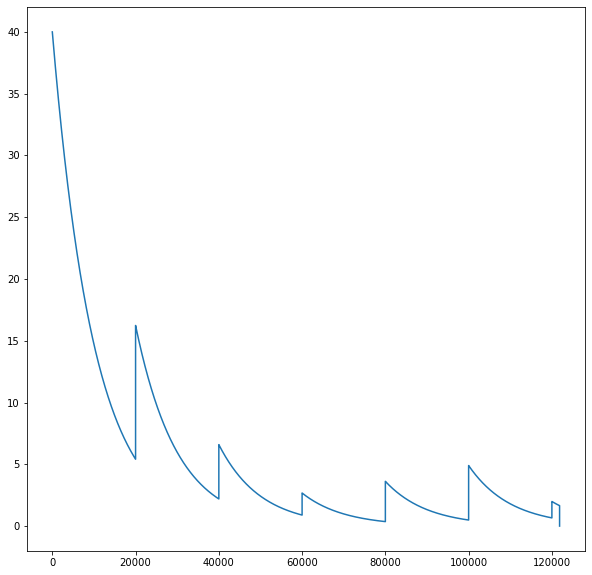

[[3 6 5 9 4 2 8 7 1]
 [1 2 8 7 5 6 4 9 3]
 [9 7 4 8 1 3 5 6 2]
 [8 1 9 4 3 5 6 2 7]
 [5 3 7 2 6 8 1 4 9]
 [6 4 2 1 7 9 3 5 8]
 [2 9 6 3 8 4 7 1 5]
 [7 5 3 6 9 1 2 8 4]
 [4 8 1 5 2 7 9 3 6]]
Znaleziono prawidłowe rozwiązanie w 121848 iteracjach

****************

[[0 0 0 0 8 0 0 0 0]
 [2 7 0 0 0 0 0 5 4]
 [0 9 5 0 0 0 8 1 0]
 [0 0 9 8 0 6 4 0 0]
 [0 2 0 4 0 3 0 6 0]
 [0 0 6 9 0 5 1 0 0]
 [0 1 7 0 0 0 6 2 0]
 [4 6 0 0 0 0 0 3 8]
 [0 0 0 0 9 0 0 0 0]]


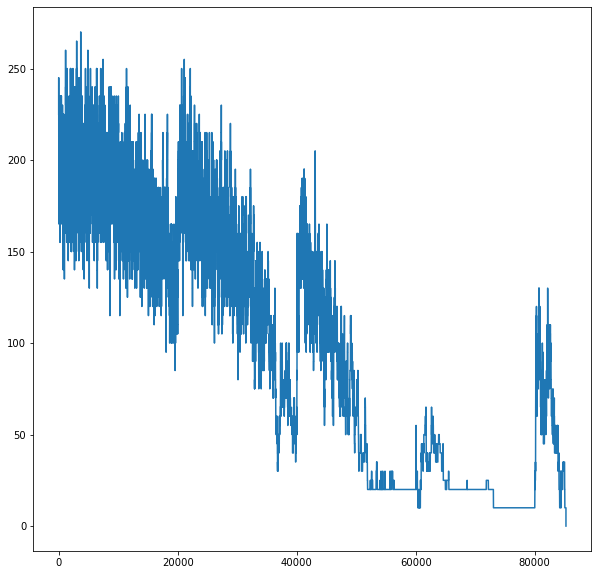

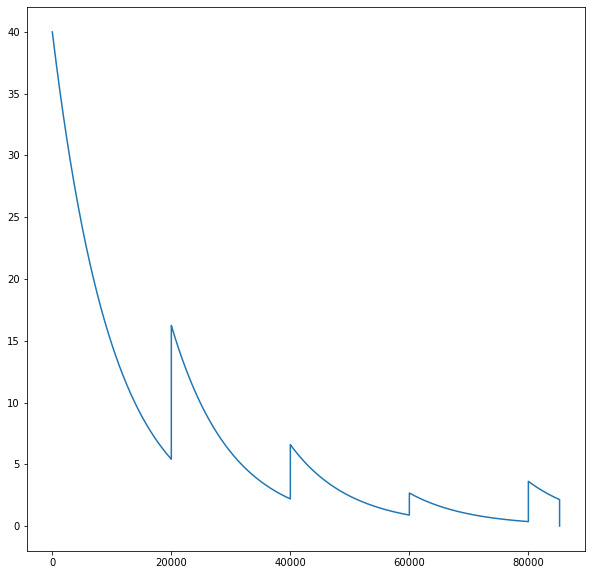

[[1 3 4 5 8 7 2 9 6]
 [2 7 8 1 6 9 3 5 4]
 [6 9 5 2 3 4 8 1 7]
 [3 5 9 8 1 6 4 7 2]
 [8 2 1 4 7 3 5 6 9]
 [7 4 6 9 2 5 1 8 3]
 [9 1 7 3 4 8 6 2 5]
 [4 6 2 7 5 1 9 3 8]
 [5 8 3 6 9 2 7 4 1]]
Znaleziono prawidłowe rozwiązanie w 85244 iteracjach

****************

[[0 0 0 6 0 2 0 0 0]
 [4 0 0 0 5 0 0 0 1]
 [0 8 5 0 1 0 6 2 0]
 [0 3 8 2 0 6 7 1 0]
 [0 0 0 0 0 0 0 0 0]
 [0 1 9 4 0 7 3 5 0]
 [0 2 6 0 4 0 5 3 0]
 [9 0 0 0 2 0 0 0 7]
 [0 0 0 8 0 9 0 0 0]]


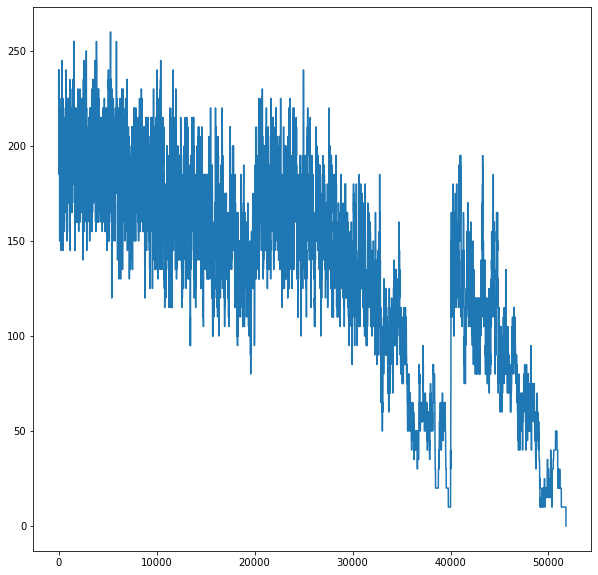

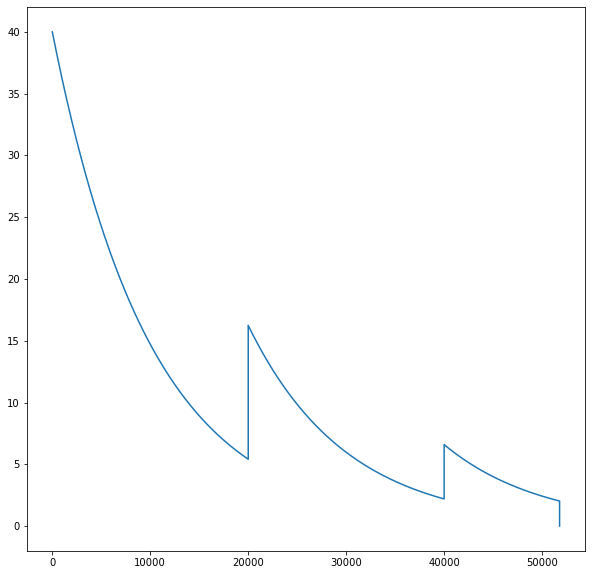

[[1 9 3 6 7 2 4 8 5]
 [4 6 2 3 5 8 9 7 1]
 [7 8 5 9 1 4 6 2 3]
 [5 3 8 2 9 6 7 1 4]
 [6 7 4 1 3 5 2 9 8]
 [2 1 9 4 8 7 3 5 6]
 [8 2 6 7 4 1 5 3 9]
 [9 4 1 5 2 3 8 6 7]
 [3 5 7 8 6 9 1 4 2]]
Znaleziono prawidłowe rozwiązanie w 51783 iteracjach

****************

[[0 0 0 9 0 0 0 0 2]
 [0 5 0 1 2 3 4 0 0]
 [0 3 0 0 0 0 1 6 0]
 [9 0 8 0 0 0 0 0 0]
 [0 7 0 0 0 0 0 9 0]
 [0 0 0 0 0 0 2 0 5]
 [0 9 1 0 0 0 0 5 0]
 [0 0 7 4 3 9 0 2 0]
 [4 0 0 0 0 7 0 0 0]]


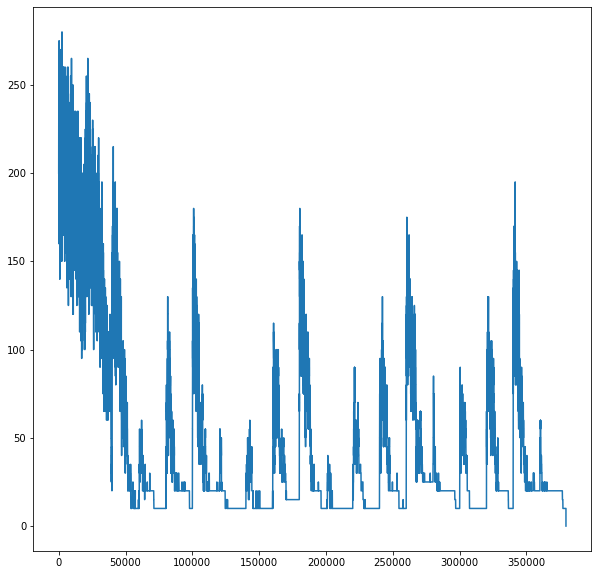

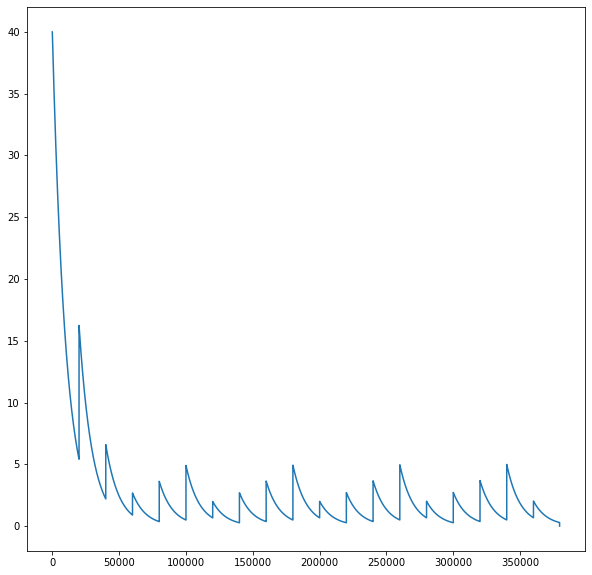

[[8 1 4 9 7 6 5 3 2]
 [6 5 9 1 2 3 4 7 8]
 [7 3 2 8 5 4 1 6 9]
 [9 4 8 2 6 5 3 1 7]
 [2 7 5 3 4 1 8 9 6]
 [1 6 3 7 9 8 2 4 5]
 [3 9 1 6 8 2 7 5 4]
 [5 8 7 4 3 9 6 2 1]
 [4 2 6 5 1 7 9 8 3]]
Znaleziono prawidłowe rozwiązanie w 379541 iteracjach

****************

[[3 8 0 0 0 0 0 0 0]
 [0 0 0 4 0 0 7 8 5]
 [0 0 9 0 2 0 3 0 0]
 [0 6 0 0 9 0 0 0 0]
 [8 0 0 3 0 2 0 0 9]
 [0 0 0 0 4 0 0 7 0]
 [0 0 1 0 7 0 5 0 0]
 [4 9 5 0 0 6 0 0 0]
 [0 0 0 0 0 0 0 9 2]]


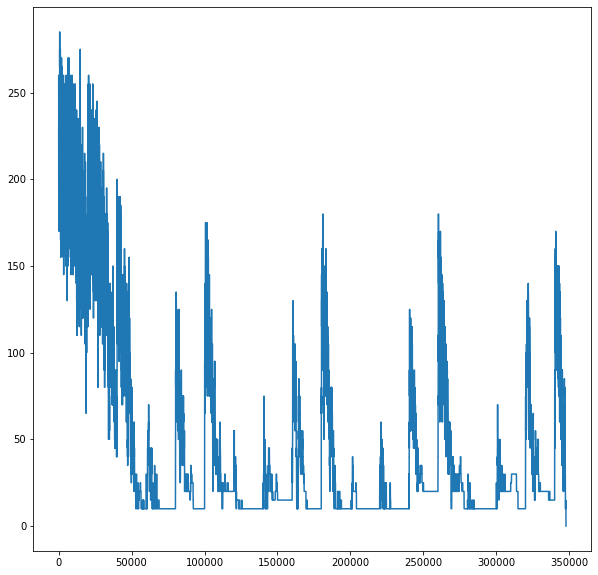

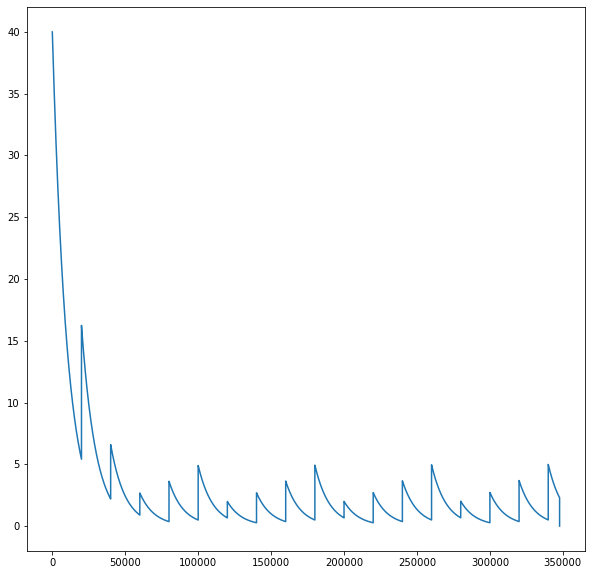

[[3 8 4 5 6 7 9 2 1]
 [1 2 6 4 3 9 7 8 5]
 [7 5 9 8 2 1 3 4 6]
 [5 6 3 7 9 8 2 1 4]
 [8 4 7 3 1 2 6 5 9]
 [9 1 2 6 4 5 8 7 3]
 [2 3 1 9 7 4 5 6 8]
 [4 9 5 2 8 6 1 3 7]
 [6 7 8 1 5 3 4 9 2]]
Znaleziono prawidłowe rozwiązanie w 347776 iteracjach

****************

[[0 0 0 1 5 8 0 0 0]
 [0 0 2 0 6 0 8 0 0]
 [0 3 0 0 0 0 0 4 0]
 [0 2 7 0 3 0 5 1 0]
 [0 0 0 0 0 0 0 0 0]
 [0 4 6 0 8 0 7 9 0]
 [0 5 0 0 0 0 0 8 0]
 [0 0 4 0 7 0 1 0 0]
 [0 0 0 3 2 5 0 0 0]]


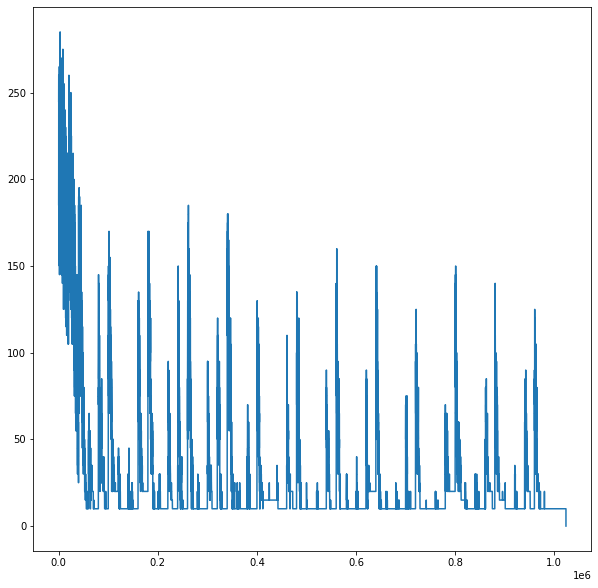

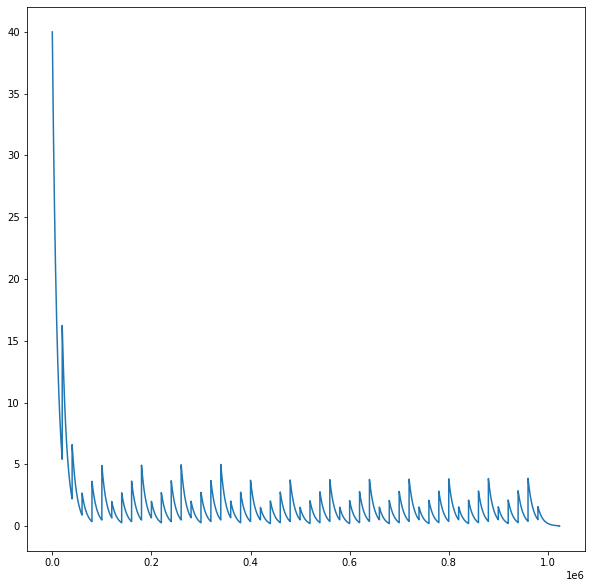

[[4 6 9 1 5 8 3 7 2]
 [7 1 2 4 6 3 8 5 9]
 [5 3 8 2 9 7 6 4 1]
 [9 2 7 6 3 4 5 1 8]
 [3 8 5 7 1 9 4 2 6]
 [1 4 6 5 8 2 7 9 3]
 [6 5 3 9 4 1 2 8 7]
 [2 9 4 8 7 6 1 3 5]
 [8 7 1 3 2 5 9 6 4]]
Znaleziono prawidłowe rozwiązanie w 1023695 iteracjach

****************

[[0 1 0 5 0 0 2 0 0]
 [9 0 0 0 0 1 0 0 0]
 [0 0 2 0 0 8 0 3 0]
 [5 0 0 0 3 0 0 0 7]
 [0 0 8 0 0 0 5 0 0]
 [6 0 0 0 8 0 0 0 4]
 [0 4 0 1 0 0 7 0 0]
 [0 0 0 7 0 0 0 0 6]
 [0 0 3 0 0 4 0 5 0]]


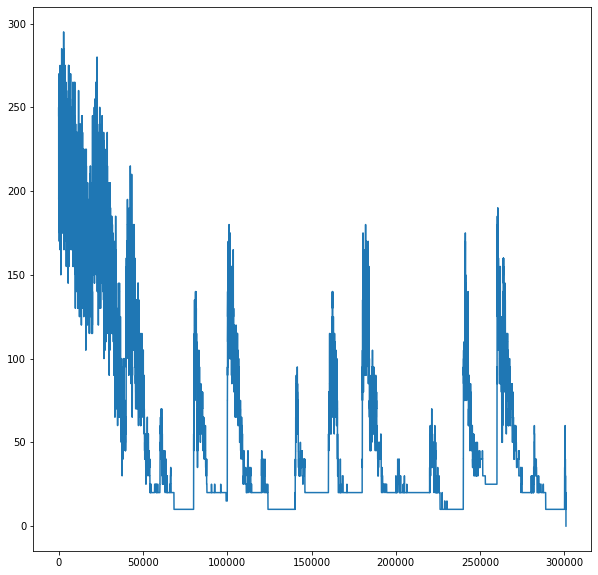

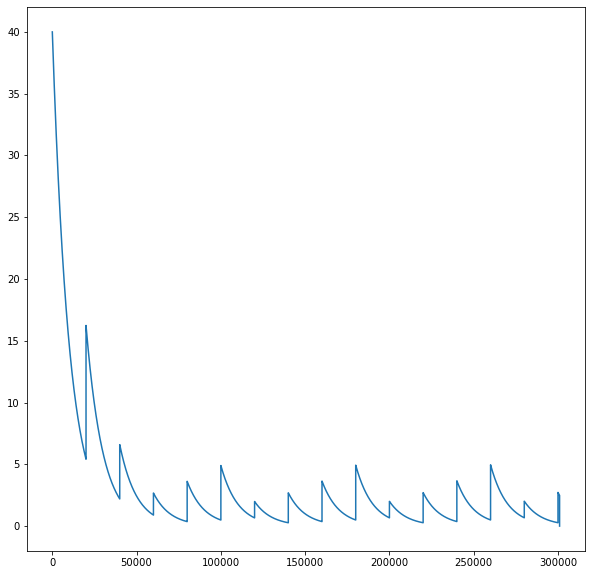

[[3 1 6 5 4 9 2 7 8]
 [9 8 7 3 2 1 6 4 5]
 [4 5 2 6 7 8 9 3 1]
 [5 9 4 2 3 6 8 1 7]
 [2 3 8 4 1 7 5 6 9]
 [6 7 1 9 8 5 3 2 4]
 [8 4 5 1 6 2 7 9 3]
 [1 2 9 7 5 3 4 8 6]
 [7 6 3 8 9 4 1 5 2]]
Znaleziono prawidłowe rozwiązanie w 300947 iteracjach

****************

[[0 8 0 0 0 0 0 4 0]
 [0 0 0 4 6 9 0 0 0]
 [4 0 0 0 0 0 0 0 7]
 [0 0 5 9 0 4 6 0 0]
 [0 7 0 6 0 8 0 3 0]
 [0 0 8 5 0 2 1 0 0]
 [9 0 0 0 0 0 0 0 5]
 [0 0 0 7 8 1 0 0 0]
 [0 6 0 0 0 0 0 1 0]]


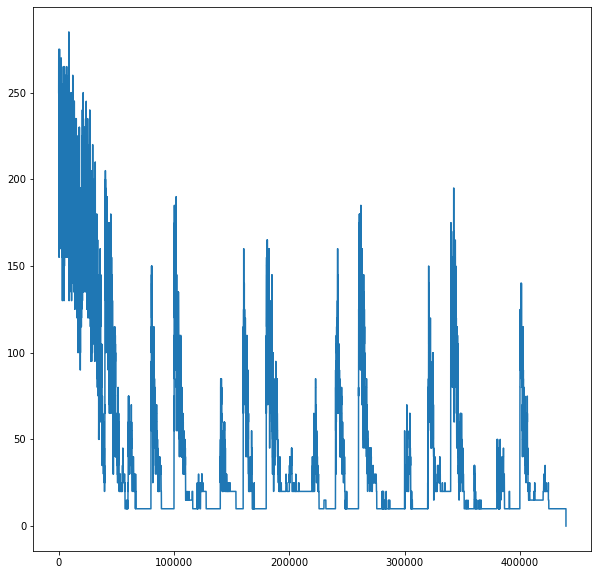

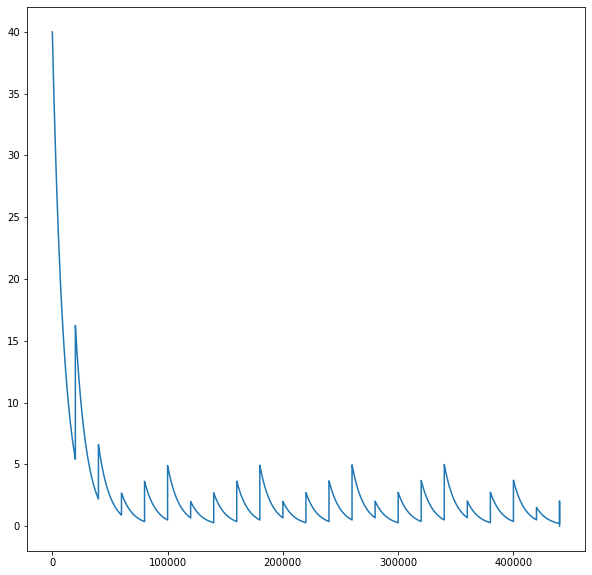

[[5 8 6 1 2 7 9 4 3]
 [7 2 3 4 6 9 8 5 1]
 [4 9 1 8 5 3 2 6 7]
 [1 3 5 9 7 4 6 2 8]
 [2 7 9 6 1 8 5 3 4]
 [6 4 8 5 3 2 1 7 9]
 [9 1 7 2 4 6 3 8 5]
 [3 5 2 7 8 1 4 9 6]
 [8 6 4 3 9 5 7 1 2]]
Znaleziono prawidłowe rozwiązanie w 440033 iteracjach

****************

[[9 0 4 2 0 0 0 0 7]
 [0 1 0 0 0 0 0 0 0]
 [0 0 0 7 0 6 5 0 0]
 [0 0 0 8 0 0 0 9 0]
 [0 2 0 9 0 4 0 6 0]
 [0 4 0 0 0 2 0 0 0]
 [0 0 1 6 0 7 0 0 0]
 [0 0 0 0 0 0 0 3 0]
 [3 0 0 0 0 5 7 0 2]]


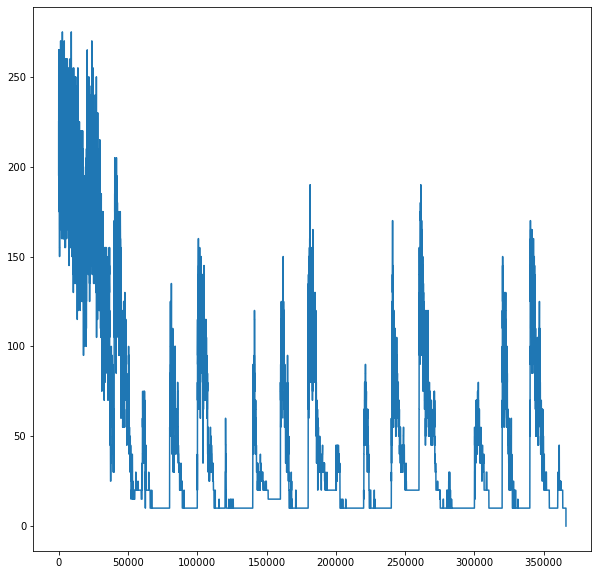

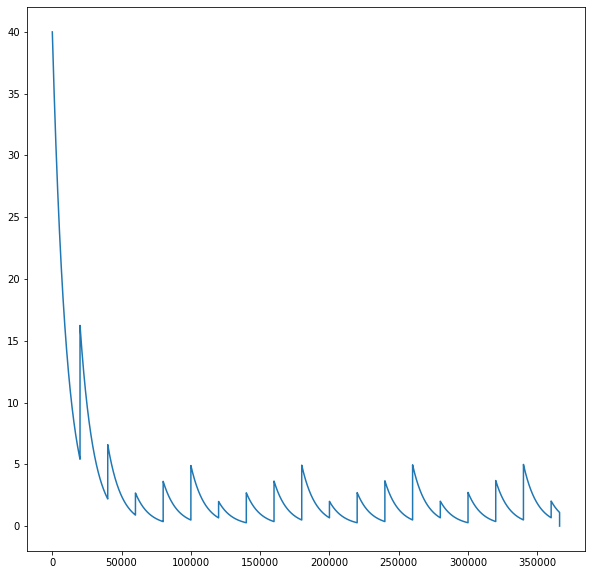

[[9 5 4 2 1 3 6 8 7]
 [6 1 7 5 4 8 9 2 3]
 [8 3 2 7 9 6 5 4 1]
 [7 6 3 8 5 1 2 9 4]
 [1 2 8 9 7 4 3 6 5]
 [5 4 9 3 6 2 1 7 8]
 [2 8 1 6 3 7 4 5 9]
 [4 7 5 1 2 9 8 3 6]
 [3 9 6 4 8 5 7 1 2]]
Znaleziono prawidłowe rozwiązanie w 366080 iteracjach

****************

[[0 0 0 7 0 0 8 0 0]
 [0 0 6 0 0 0 0 3 1]
 [0 4 0 0 0 2 0 0 0]
 [0 2 4 0 7 0 0 0 0]
 [0 1 0 0 3 0 0 8 0]
 [0 0 0 0 6 0 2 9 0]
 [0 0 0 8 0 0 0 7 0]
 [8 6 0 0 0 0 5 0 0]
 [0 0 2 0 0 6 0 0 0]]


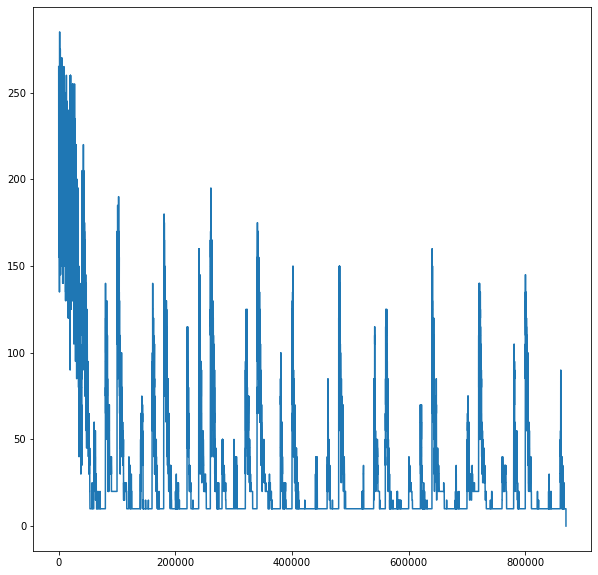

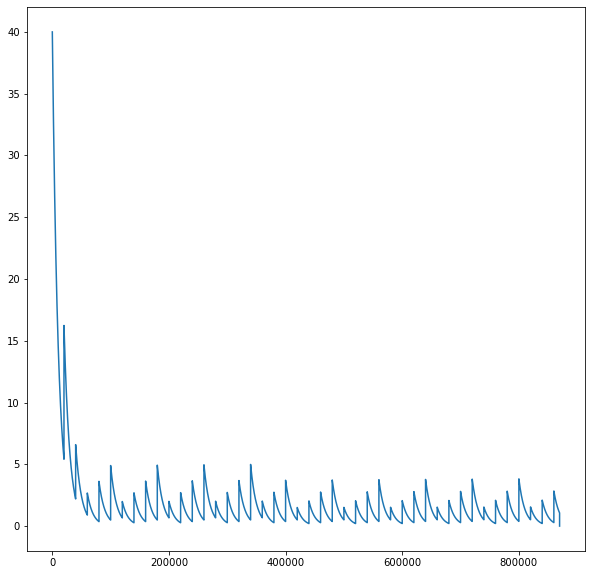

[[1 5 9 7 4 3 8 6 2]
 [2 7 6 5 8 9 4 3 1]
 [3 4 8 6 1 2 7 5 9]
 [6 2 4 9 7 8 3 1 5]
 [9 1 7 2 3 5 6 8 4]
 [5 8 3 1 6 4 2 9 7]
 [4 3 5 8 2 1 9 7 6]
 [8 6 1 4 9 7 5 2 3]
 [7 9 2 3 5 6 1 4 8]]
Znaleziono prawidłowe rozwiązanie w 869813 iteracjach

****************

[[0 0 1 0 0 7 0 9 0]
 [5 9 0 0 8 0 0 0 1]
 [0 3 0 0 0 0 0 8 0]
 [0 0 0 0 0 5 8 0 0]
 [0 5 0 0 6 0 0 2 0]
 [0 0 4 1 0 0 0 0 0]
 [0 8 0 0 0 0 0 3 0]
 [1 0 0 0 2 0 0 7 9]
 [0 2 0 7 0 0 4 0 0]]


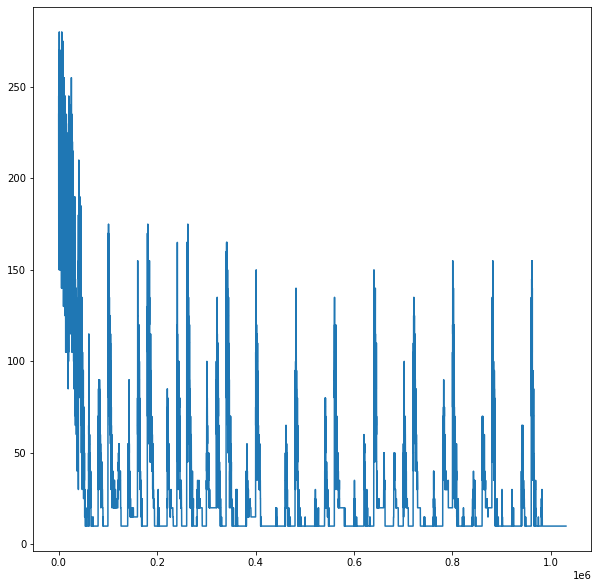

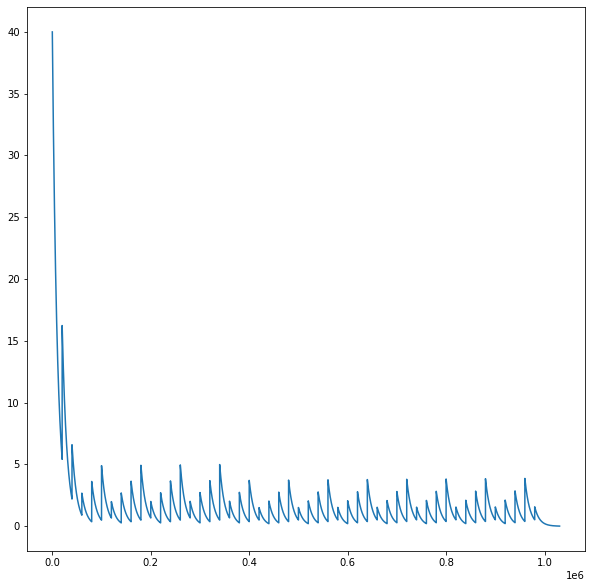

[[8 6 1 5 3 7 2 9 4]
 [5 9 7 4 8 2 3 6 1]
 [4 3 2 6 9 1 7 8 5]
 [6 1 9 2 7 5 8 4 3]
 [3 5 8 9 6 4 1 2 7]
 [2 7 4 1 3 8 9 5 6]
 [7 8 5 4 1 9 6 3 2]
 [1 4 6 8 2 3 5 7 9]
 [9 2 3 7 5 6 4 1 8]]
Nie rozwiązano, liczba pól błędnych 10

****************

[[0 0 0 0 0 3 0 1 7]
 [0 1 5 0 0 9 0 0 8]
 [0 6 0 0 0 0 0 0 0]
 [1 0 0 0 0 7 0 0 0]
 [0 0 9 0 0 0 2 0 0]
 [0 0 0 5 0 0 0 0 4]
 [0 0 0 0 0 0 0 2 0]
 [5 0 0 6 0 0 3 4 0]
 [3 4 0 2 0 0 0 0 0]]


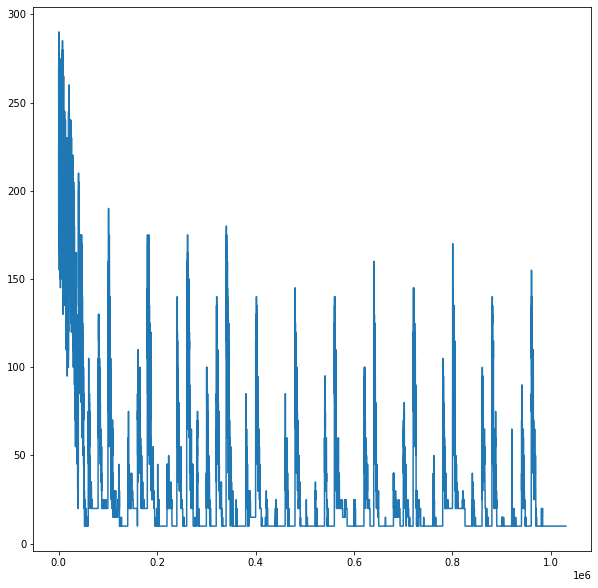

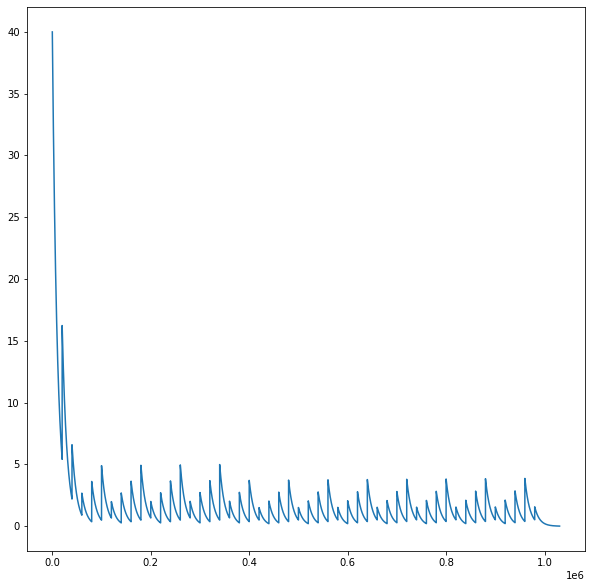

[[2 3 8 4 5 3 9 1 7]
 [4 1 5 7 2 9 6 3 8]
 [9 6 7 8 1 6 4 5 2]
 [1 2 4 9 3 7 8 6 5]
 [6 5 9 1 4 8 2 7 3]
 [8 7 3 5 6 2 1 9 4]
 [7 9 1 3 8 4 5 2 6]
 [5 8 2 6 7 1 3 4 9]
 [3 4 6 2 9 5 7 8 1]]
Nie rozwiązano, liczba pól błędnych 10

****************

[[3 0 0 2 0 0 0 0 0]
 [0 0 0 1 0 7 0 0 0]
 [7 0 6 0 3 0 5 0 0]
 [0 7 0 0 0 9 0 8 0]
 [9 0 0 0 2 0 0 0 4]
 [0 1 0 8 0 0 0 5 0]
 [0 0 9 0 4 0 3 0 1]
 [0 0 0 7 0 2 0 0 0]
 [0 0 0 0 0 8 0 0 6]]


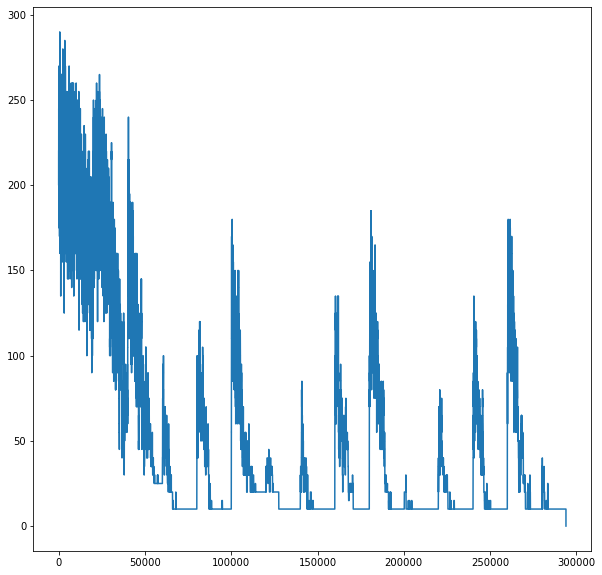

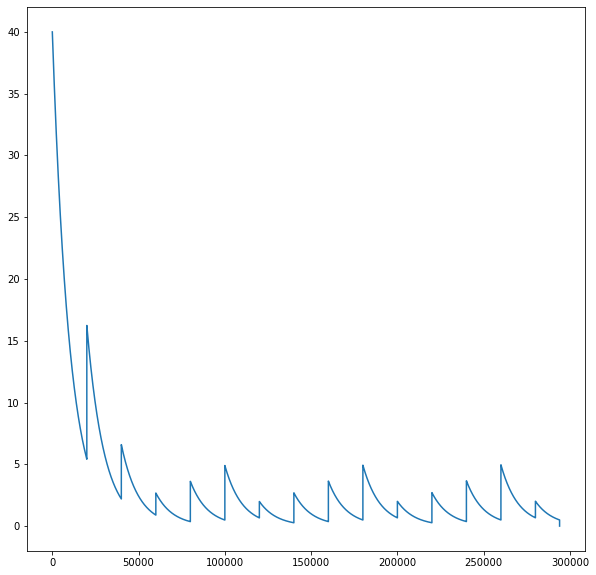

[[3 5 1 2 8 6 4 9 7]
 [4 9 2 1 5 7 6 3 8]
 [7 8 6 9 3 4 5 1 2]
 [2 7 5 4 6 9 1 8 3]
 [9 3 8 5 2 1 7 6 4]
 [6 1 4 8 7 3 2 5 9]
 [8 2 9 6 4 5 3 7 1]
 [1 6 3 7 9 2 8 4 5]
 [5 4 7 3 1 8 9 2 6]]
Znaleziono prawidłowe rozwiązanie w 294000 iteracjach

****************

[[1 0 0 0 3 0 0 0 9]
 [0 2 0 6 4 0 0 8 0]
 [0 0 3 2 0 0 7 4 0]
 [2 0 0 0 0 0 0 0 0]
 [0 1 4 0 0 0 0 0 0]
 [0 0 0 0 6 2 8 0 0]
 [0 0 7 0 0 0 3 0 0]
 [0 8 0 4 5 0 0 2 0]
 [0 0 0 0 0 0 0 0 1]]


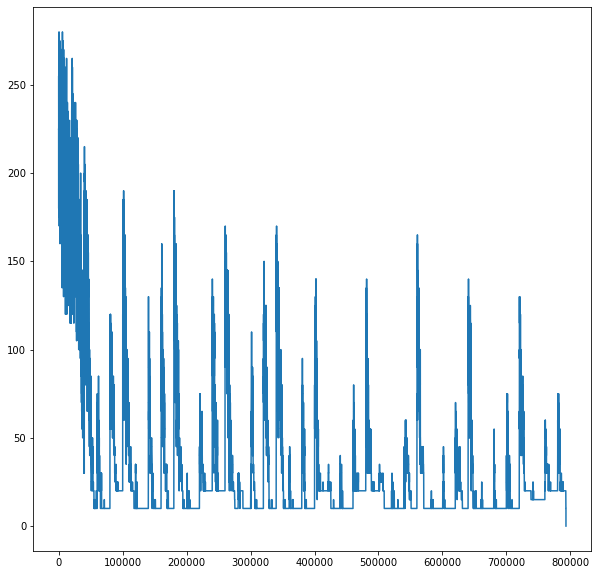

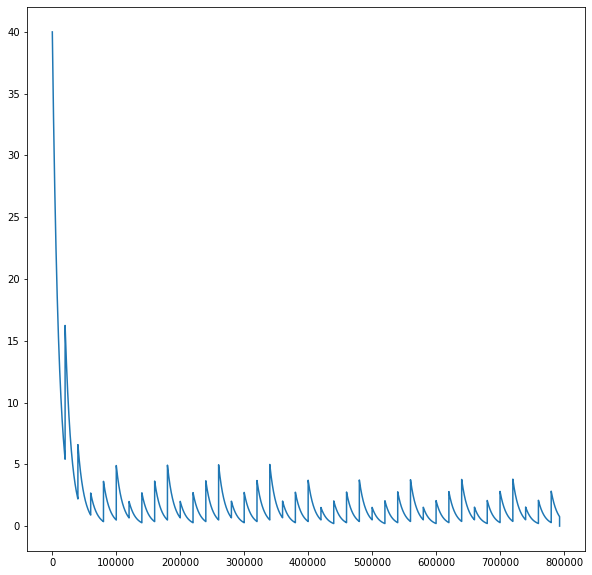

[[1 4 8 7 3 5 2 6 9]
 [7 2 5 6 4 9 1 8 3]
 [6 9 3 2 1 8 7 4 5]
 [2 3 6 8 9 4 5 1 7]
 [8 1 4 5 7 3 6 9 2]
 [5 7 9 1 6 2 8 3 4]
 [4 6 7 9 2 1 3 5 8]
 [3 8 1 4 5 7 9 2 6]
 [9 5 2 3 8 6 4 7 1]]
Znaleziono prawidłowe rozwiązanie w 793085 iteracjach

****************

[[1 5 0 2 0 0 0 6 7]
 [8 0 7 0 5 6 1 4 0]
 [4 0 0 0 0 3 0 0 2]
 [0 0 0 0 2 0 0 1 0]
 [0 0 0 0 0 0 0 0 0]
 [2 1 6 0 0 0 0 3 0]
 [0 3 0 0 0 0 0 2 0]
 [0 0 0 0 4 0 0 0 0]
 [5 7 0 0 0 1 0 0 4]]


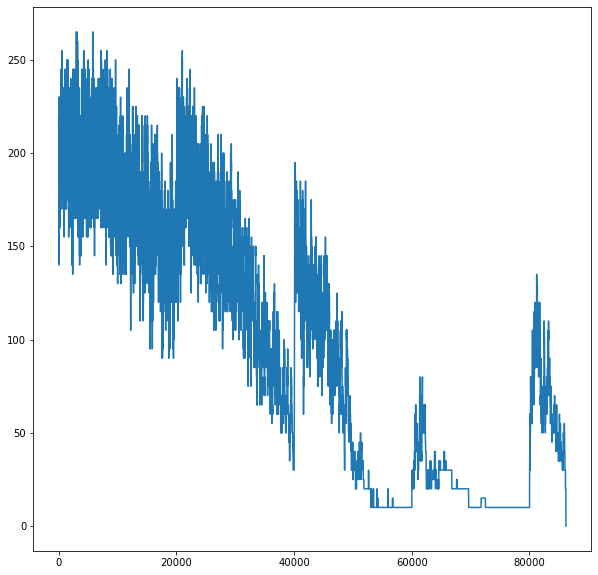

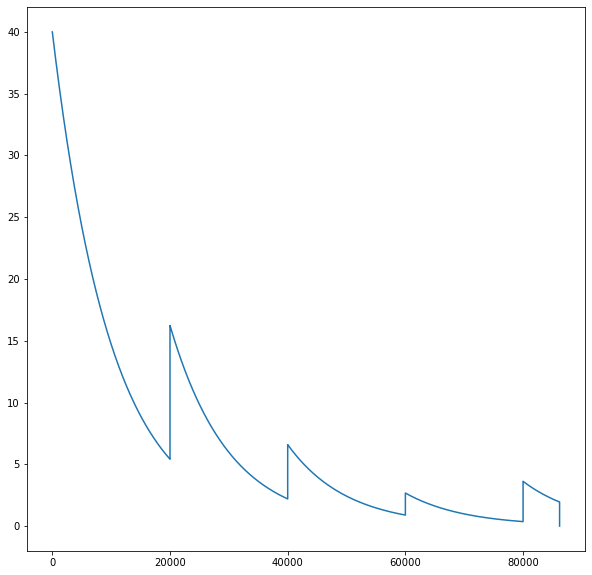

[[1 5 3 2 8 4 9 6 7]
 [8 2 7 9 5 6 1 4 3]
 [4 6 9 7 1 3 5 8 2]
 [7 9 5 3 2 8 4 1 6]
 [3 4 8 1 6 7 2 5 9]
 [2 1 6 4 9 5 7 3 8]
 [6 3 4 5 7 9 8 2 1]
 [9 8 1 6 4 2 3 7 5]
 [5 7 2 8 3 1 6 9 4]]
Znaleziono prawidłowe rozwiązanie w 86205 iteracjach

****************

[[0 0 9 0 7 1 0 6 0]
 [0 0 0 2 0 5 0 0 7]
 [8 0 2 3 0 0 0 0 0]
 [1 8 0 0 0 0 0 5 0]
 [0 0 0 0 0 0 0 0 0]
 [6 3 0 0 0 0 4 0 0]
 [0 0 3 9 5 0 7 0 8]
 [0 1 0 0 4 0 0 0 0]
 [0 0 0 0 0 0 3 0 0]]


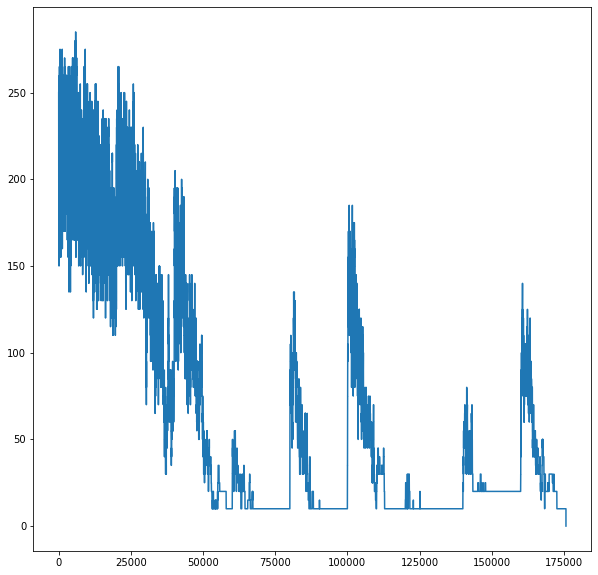

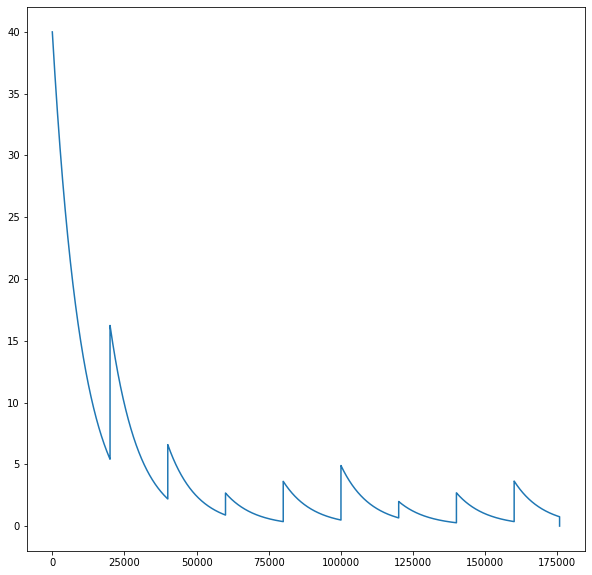

[[3 5 9 8 7 1 2 6 4]
 [4 6 1 2 9 5 8 3 7]
 [8 7 2 3 6 4 5 9 1]
 [1 8 4 6 2 7 9 5 3]
 [9 2 5 4 3 8 1 7 6]
 [6 3 7 5 1 9 4 8 2]
 [2 4 3 9 5 6 7 1 8]
 [5 1 8 7 4 3 6 2 9]
 [7 9 6 1 8 2 3 4 5]]
Znaleziono prawidłowe rozwiązanie w 175738 iteracjach

****************

[[0 0 0 0 1 0 0 0 0]
 [0 5 0 3 0 6 1 0 0]
 [0 4 0 0 2 0 3 0 6]
 [0 0 0 0 0 0 7 1 3]
 [5 0 1 0 0 0 0 0 0]
 [7 0 8 0 0 0 9 0 2]
 [2 0 6 1 0 0 5 0 0]
 [0 0 0 7 0 9 0 0 0]
 [0 0 0 0 0 3 0 0 0]]


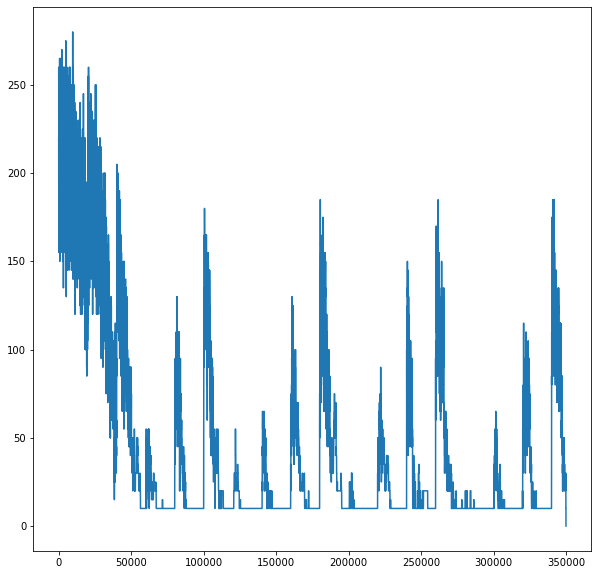

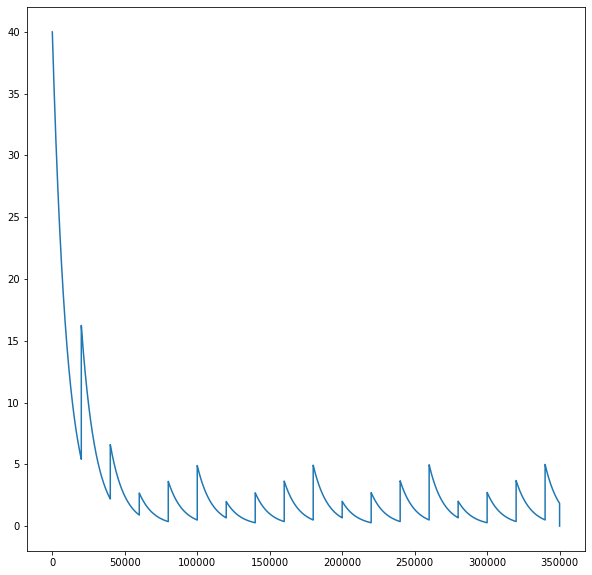

[[6 7 3 8 1 4 2 9 5]
 [8 5 2 3 9 6 1 7 4]
 [1 4 9 5 2 7 3 8 6]
 [9 2 4 6 8 5 7 1 3]
 [5 3 1 9 7 2 6 4 8]
 [7 6 8 4 3 1 9 5 2]
 [2 9 6 1 4 8 5 3 7]
 [3 8 5 7 6 9 4 2 1]
 [4 1 7 2 5 3 8 6 9]]
Znaleziono prawidłowe rozwiązanie w 349992 iteracjach

****************

[[0 0 0 4 6 5 0 0 0]
 [0 5 0 9 0 8 2 4 0]
 [0 0 0 0 0 0 0 0 0]
 [0 0 4 0 0 0 9 2 0]
 [0 0 0 0 0 0 0 0 1]
 [0 2 6 0 0 0 8 0 0]
 [0 0 9 1 0 2 0 5 0]
 [0 8 0 0 5 0 0 7 3]
 [3 0 0 0 0 0 0 0 0]]


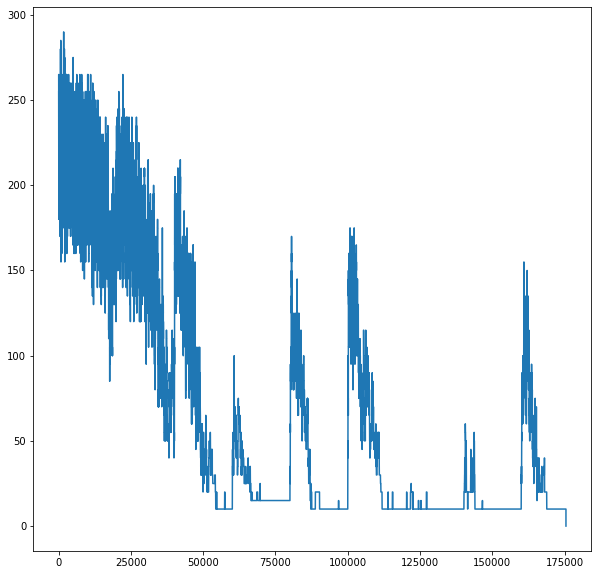

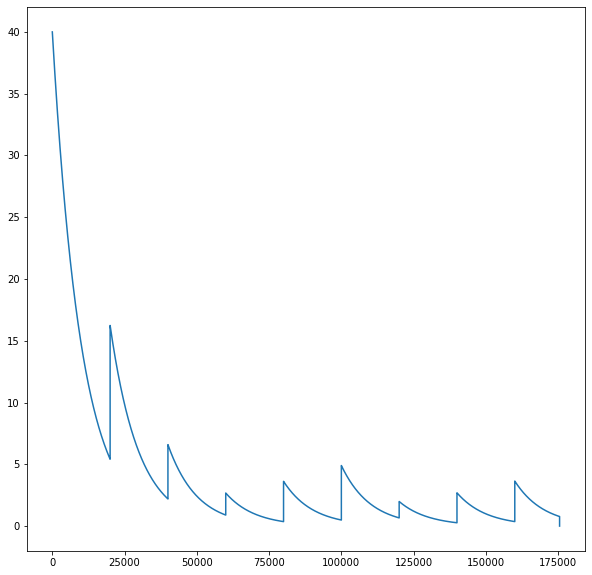

[[8 9 2 4 6 5 3 1 7]
 [1 5 3 9 7 8 2 4 6]
 [6 4 7 2 1 3 5 8 9]
 [7 1 4 3 8 6 9 2 5]
 [9 3 8 5 2 4 7 6 1]
 [5 2 6 7 9 1 8 3 4]
 [4 7 9 1 3 2 6 5 8]
 [2 8 1 6 5 9 4 7 3]
 [3 6 5 8 4 7 1 9 2]]
Znaleziono prawidłowe rozwiązanie w 175499 iteracjach

****************

[[0 0 7 0 0 1 0 0 3]
 [0 4 0 0 2 0 0 6 0]
 [8 0 0 3 0 0 5 0 0]
 [0 0 4 0 0 2 0 0 6]
 [0 5 0 0 3 0 0 4 0]
 [6 0 0 7 0 0 9 0 0]
 [0 0 8 0 0 3 0 0 2]
 [0 3 0 0 8 0 0 1 0]
 [7 0 0 2 0 0 8 0 0]]


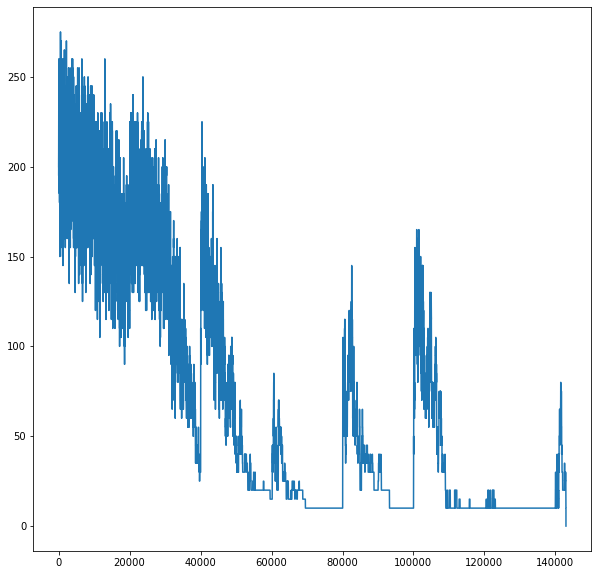

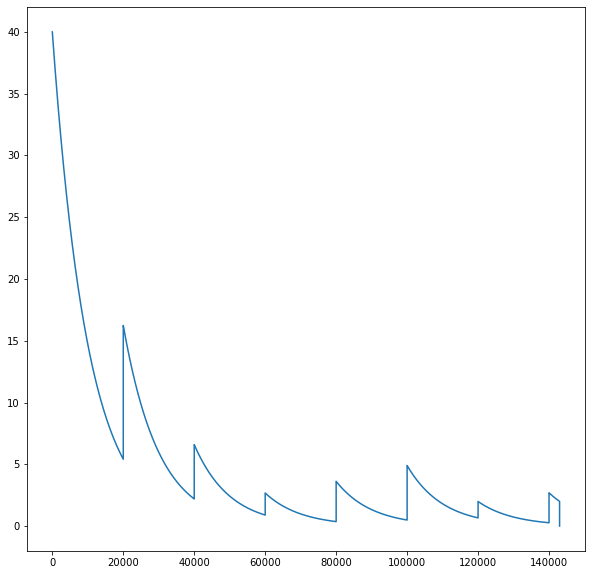

[[5 6 7 4 9 1 2 8 3]
 [3 4 9 5 2 8 1 6 7]
 [8 2 1 3 7 6 5 9 4]
 [9 7 4 8 1 2 3 5 6]
 [1 5 2 6 3 9 7 4 8]
 [6 8 3 7 4 5 9 2 1]
 [4 9 8 1 5 3 6 7 2]
 [2 3 6 9 8 7 4 1 5]
 [7 1 5 2 6 4 8 3 9]]
Znaleziono prawidłowe rozwiązanie w 142973 iteracjach

****************

[[0 0 1 0 0 0 2 0 0]
 [0 3 0 4 0 1 0 5 0]
 [5 0 0 0 2 0 0 0 6]
 [0 4 0 5 0 7 0 8 0]
 [0 0 5 0 6 0 3 0 0]
 [0 6 0 3 0 2 0 1 0]
 [8 0 0 0 5 0 0 0 3]
 [0 5 0 7 0 8 0 6 0]
 [0 0 9 0 0 0 5 0 0]]


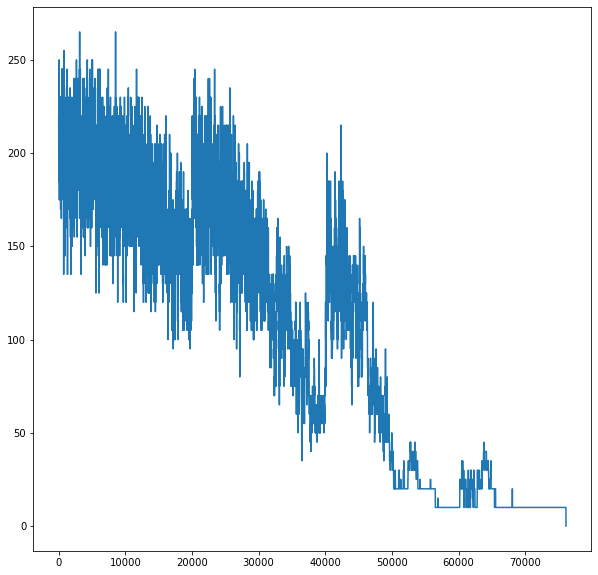

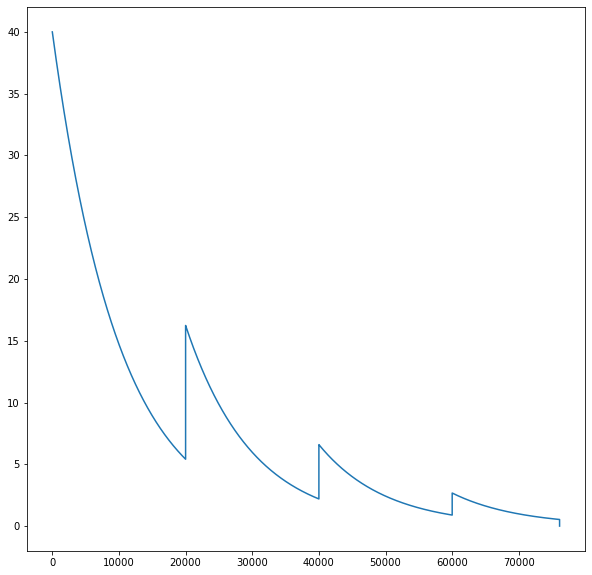

[[4 9 1 6 8 5 2 3 7]
 [2 3 6 4 7 1 8 5 9]
 [5 8 7 9 2 3 1 4 6]
 [9 4 3 5 1 7 6 8 2]
 [1 2 5 8 6 9 3 7 4]
 [7 6 8 3 4 2 9 1 5]
 [8 1 4 2 5 6 7 9 3]
 [3 5 2 7 9 8 4 6 1]
 [6 7 9 1 3 4 5 2 8]]
Znaleziono prawidłowe rozwiązanie w 76114 iteracjach

****************

[[0 0 0 0 0 0 0 0 0]
 [0 7 4 1 0 3 5 0 0]
 [0 0 6 5 0 8 4 7 0]
 [0 1 2 0 0 0 3 4 0]
 [0 0 0 0 0 0 0 0 0]
 [0 4 5 0 0 0 1 2 0]
 [0 6 1 3 0 0 8 5 0]
 [0 0 8 7 0 4 6 1 0]
 [0 0 0 0 0 0 0 0 0]]


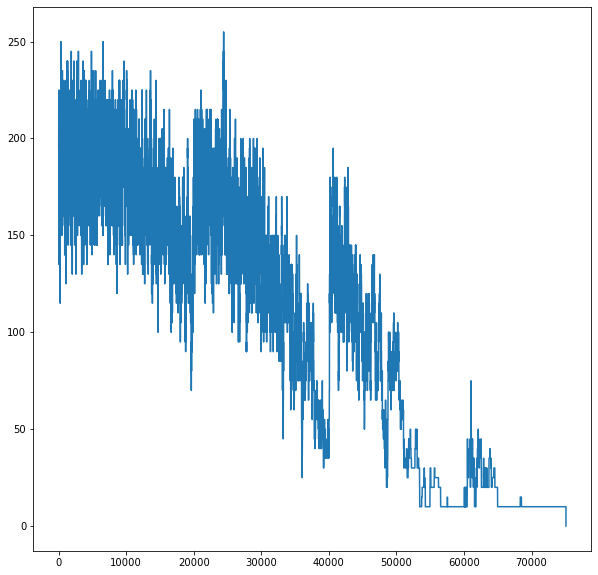

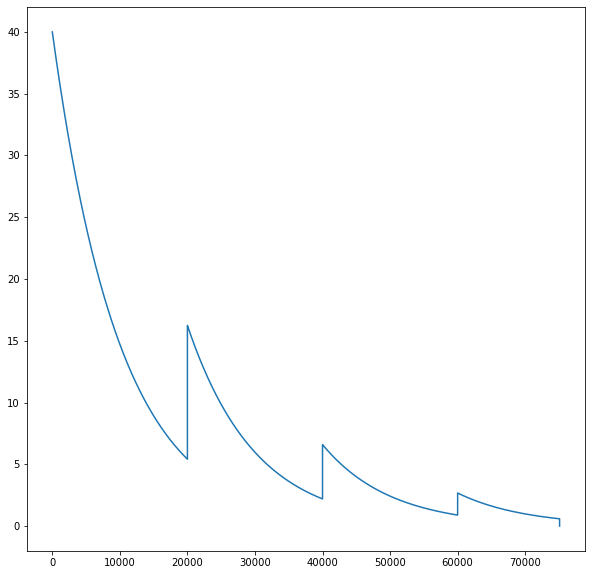

[[5 8 3 4 7 9 2 6 1]
 [2 7 4 1 6 3 5 9 8]
 [1 9 6 5 2 8 4 7 3]
 [9 1 2 6 8 5 3 4 7]
 [6 3 7 2 4 1 9 8 5]
 [8 4 5 9 3 7 1 2 6]
 [7 6 1 3 9 2 8 5 4]
 [3 2 8 7 5 4 6 1 9]
 [4 5 9 8 1 6 7 3 2]]
Znaleziono prawidłowe rozwiązanie w 75091 iteracjach

****************

[[0 0 0 0 0 0 0 0 0]
 [0 0 3 8 0 1 7 0 0]
 [0 6 0 3 0 0 0 9 0]
 [0 5 2 9 0 6 8 7 0]
 [0 0 0 0 0 0 0 0 0]
 [0 9 6 0 0 7 3 0 0]
 [0 4 0 6 0 2 0 5 0]
 [0 0 8 1 0 9 6 0 0]
 [0 0 0 0 0 0 0 0 0]]


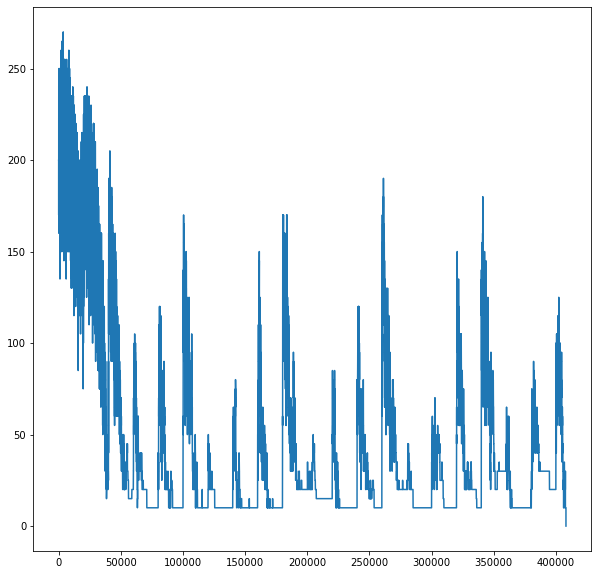

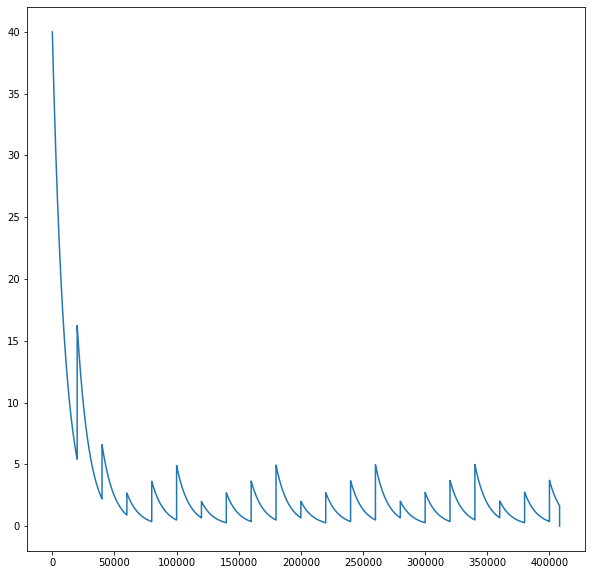

[[9 8 7 2 6 4 5 1 3]
 [5 2 3 8 9 1 7 4 6]
 [1 6 4 3 7 5 2 9 8]
 [4 5 2 9 3 6 8 7 1]
 [7 3 1 5 2 8 4 6 9]
 [8 9 6 4 1 7 3 2 5]
 [3 4 9 6 8 2 1 5 7]
 [2 7 8 1 5 9 6 3 4]
 [6 1 5 7 4 3 9 8 2]]
Znaleziono prawidłowe rozwiązanie w 408152 iteracjach

****************

[[0 0 7 0 0 0 5 0 0]
 [0 4 0 7 0 6 0 2 0]
 [8 0 0 0 1 0 0 0 6]
 [2 0 0 0 6 0 0 0 5]
 [0 1 6 4 0 5 2 8 0]
 [5 0 0 0 8 0 0 0 9]
 [1 0 0 0 3 0 0 0 7]
 [0 2 0 6 0 8 0 5 0]
 [0 0 9 0 0 0 8 0 0]]


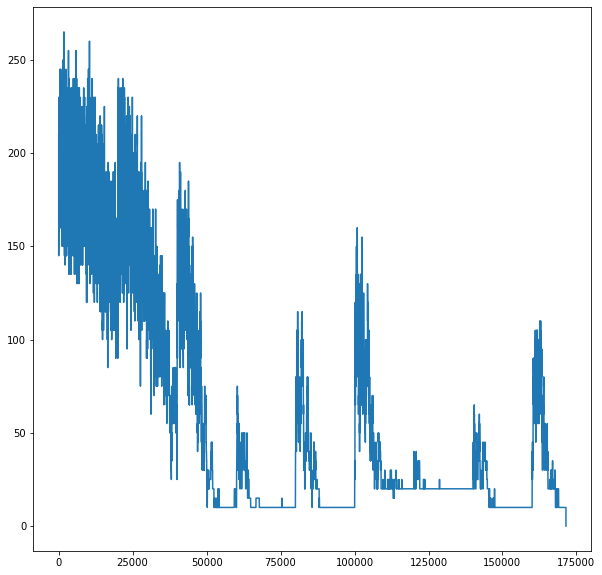

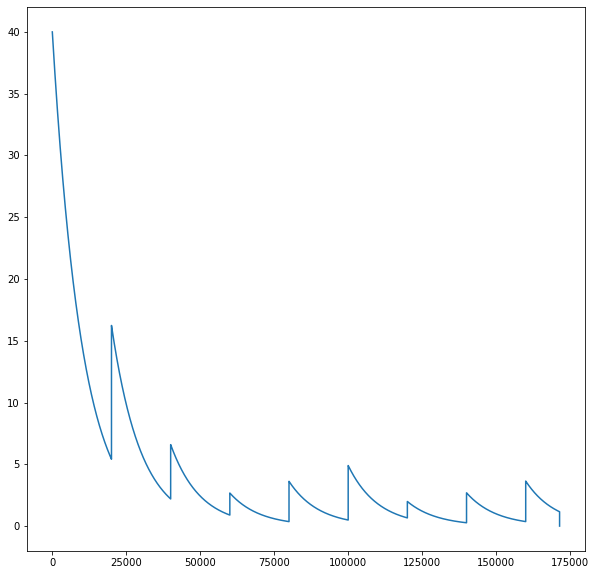

[[3 6 7 8 2 9 5 1 4]
 [9 4 1 7 5 6 3 2 8]
 [8 5 2 3 1 4 7 9 6]
 [2 9 8 1 6 3 4 7 5]
 [7 1 6 4 9 5 2 8 3]
 [5 3 4 2 8 7 1 6 9]
 [1 8 5 9 3 2 6 4 7]
 [4 2 3 6 7 8 9 5 1]
 [6 7 9 5 4 1 8 3 2]]
Znaleziono prawidłowe rozwiązanie w 171449 iteracjach

****************

[[0 0 4 0 0 0 6 0 0]
 [0 7 0 2 0 6 0 8 0]
 [2 0 0 0 1 0 0 0 7]
 [7 0 0 0 9 0 0 0 4]
 [0 8 5 1 0 3 7 2 0]
 [4 0 0 0 5 0 0 0 1]
 [9 0 0 0 2 0 0 0 6]
 [0 1 0 4 0 9 0 5 0]
 [0 0 2 0 0 0 9 0 0]]


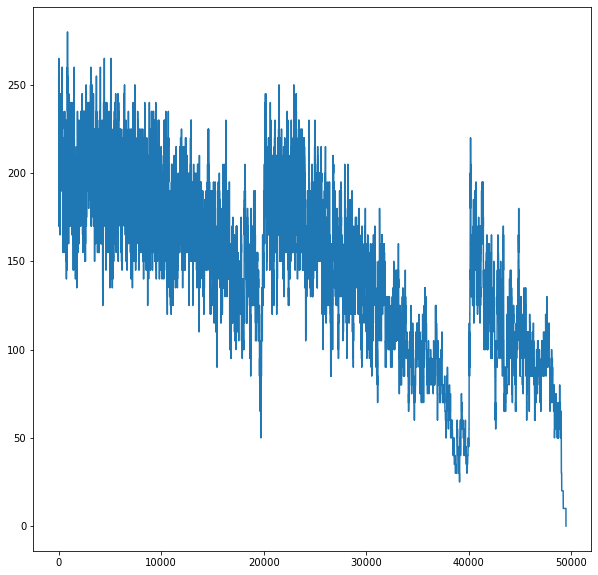

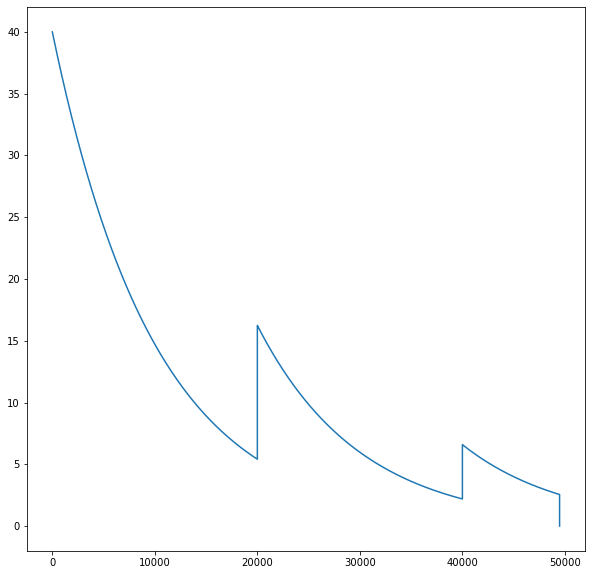

[[3 5 4 9 8 7 6 1 2]
 [1 7 9 2 3 6 4 8 5]
 [2 6 8 5 1 4 3 9 7]
 [7 2 1 6 9 8 5 3 4]
 [6 8 5 1 4 3 7 2 9]
 [4 9 3 7 5 2 8 6 1]
 [9 3 7 8 2 5 1 4 6]
 [8 1 6 4 7 9 2 5 3]
 [5 4 2 3 6 1 9 7 8]]
Znaleziono prawidłowe rozwiązanie w 49479 iteracjach

****************

[[0 0 9 0 0 0 2 0 0]
 [0 1 0 8 0 6 0 7 0]
 [3 0 0 0 9 0 0 0 4]
 [6 0 0 0 8 0 0 0 5]
 [0 5 7 9 0 4 3 2 0]
 [4 0 0 0 3 0 0 0 7]
 [2 0 0 0 1 0 0 0 9]
 [0 6 0 3 0 9 0 4 0]
 [0 0 8 0 0 0 7 0 0]]


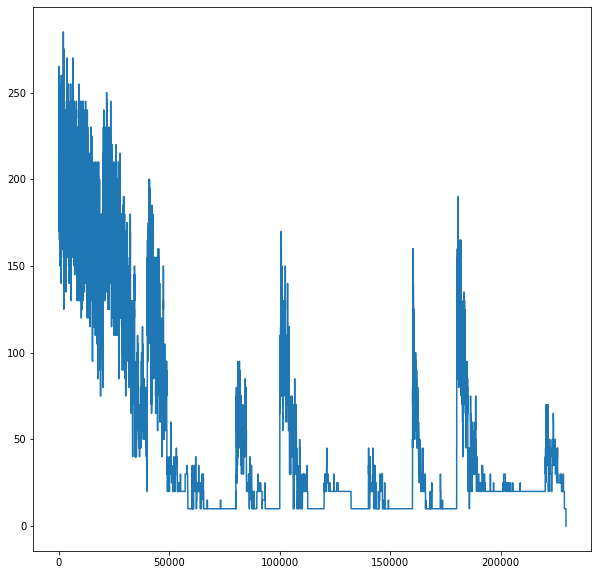

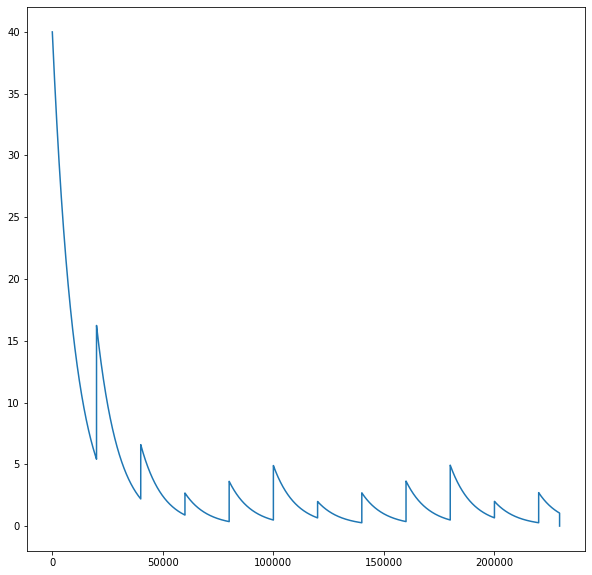

[[7 4 9 1 5 3 2 6 8]
 [5 1 2 8 4 6 9 7 3]
 [3 8 6 2 9 7 1 5 4]
 [6 2 3 7 8 1 4 9 5]
 [8 5 7 9 6 4 3 2 1]
 [4 9 1 5 3 2 6 8 7]
 [2 7 4 6 1 8 5 3 9]
 [1 6 5 3 7 9 8 4 2]
 [9 3 8 4 2 5 7 1 6]]
Znaleziono prawidłowe rozwiązanie w 229463 iteracjach

****************

[[0 0 3 0 0 0 7 0 0]
 [0 7 0 6 0 9 0 2 0]
 [8 0 0 0 2 0 0 0 1]
 [3 0 0 0 6 0 0 0 7]
 [0 5 6 4 0 3 2 1 0]
 [4 0 0 0 1 0 0 0 3]
 [9 0 0 0 5 0 0 0 2]
 [0 3 0 9 0 8 0 4 0]
 [0 0 5 0 0 0 1 0 0]]


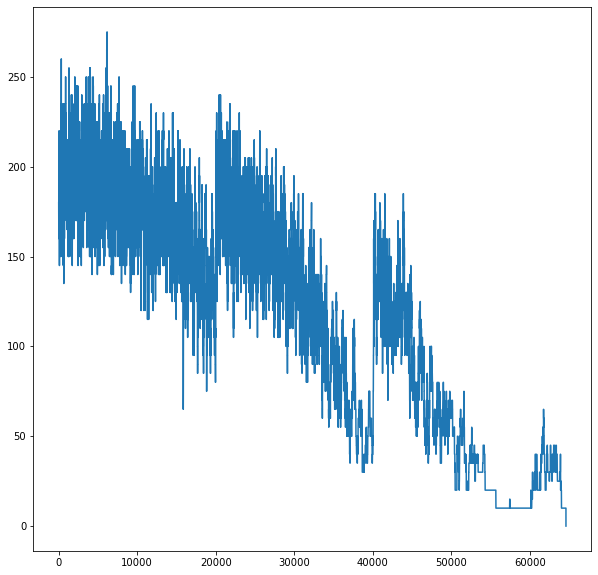

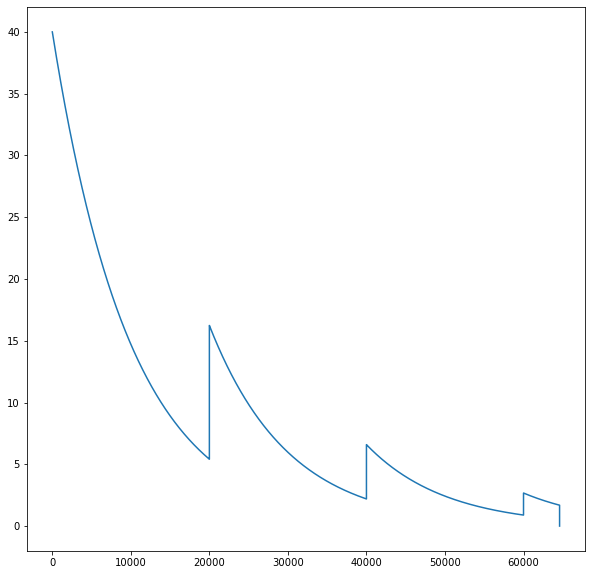

[[2 9 3 5 4 1 7 8 6]
 [5 7 1 6 8 9 3 2 4]
 [8 6 4 3 2 7 5 9 1]
 [3 1 9 8 6 2 4 5 7]
 [7 5 6 4 9 3 2 1 8]
 [4 2 8 7 1 5 9 6 3]
 [9 4 7 1 5 6 8 3 2]
 [1 3 2 9 7 8 6 4 5]
 [6 8 5 2 3 4 1 7 9]]
Znaleziono prawidłowe rozwiązanie w 64592 iteracjach

****************

[[0 0 0 0 0 0 0 0 0]
 [0 2 1 4 0 7 6 8 0]
 [0 8 7 3 0 6 1 5 0]
 [0 4 6 0 0 0 9 1 0]
 [0 0 0 0 0 0 0 0 0]
 [0 3 9 0 0 0 2 4 0]
 [0 9 5 7 0 8 4 2 0]
 [0 7 4 5 0 2 3 6 0]
 [0 0 0 0 0 0 0 0 0]]


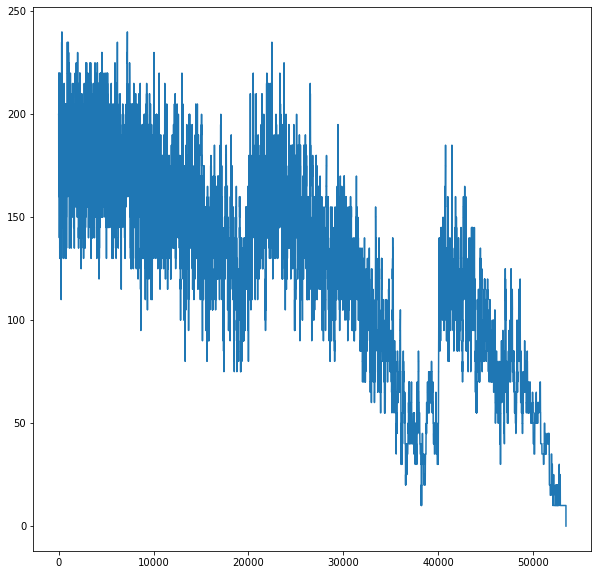

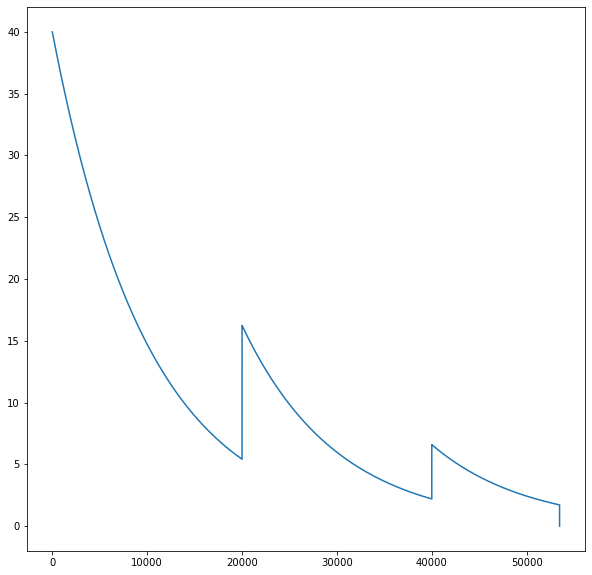

[[6 5 3 8 2 1 7 9 4]
 [9 2 1 4 5 7 6 8 3]
 [4 8 7 3 9 6 1 5 2]
 [5 4 6 2 7 3 9 1 8]
 [2 1 8 6 4 9 5 3 7]
 [7 3 9 1 8 5 2 4 6]
 [3 9 5 7 6 8 4 2 1]
 [8 7 4 5 1 2 3 6 9]
 [1 6 2 9 3 4 8 7 5]]
Znaleziono prawidłowe rozwiązanie w 53469 iteracjach

****************

[[0 0 0 0 0 0 0 0 0]
 [0 0 6 9 0 2 3 0 0]
 [0 5 0 3 0 1 0 7 0]
 [0 8 3 7 0 5 2 9 0]
 [0 0 0 0 0 0 0 0 0]
 [0 4 7 1 0 9 6 8 0]
 [0 7 0 8 0 4 0 6 0]
 [0 0 8 2 0 6 1 0 0]
 [0 0 0 0 0 0 0 0 0]]


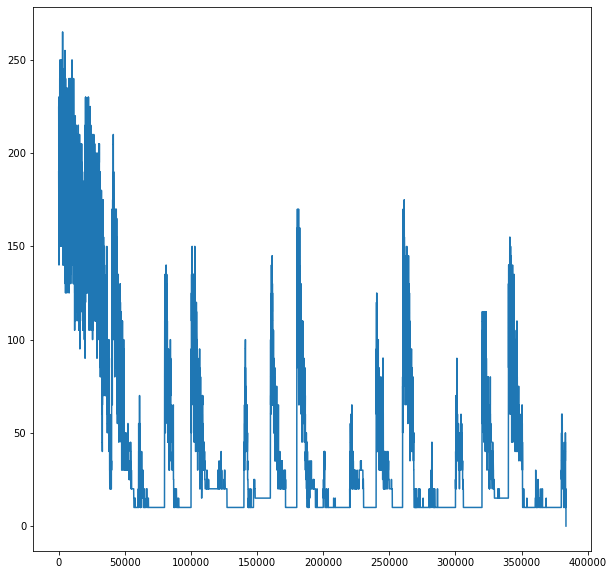

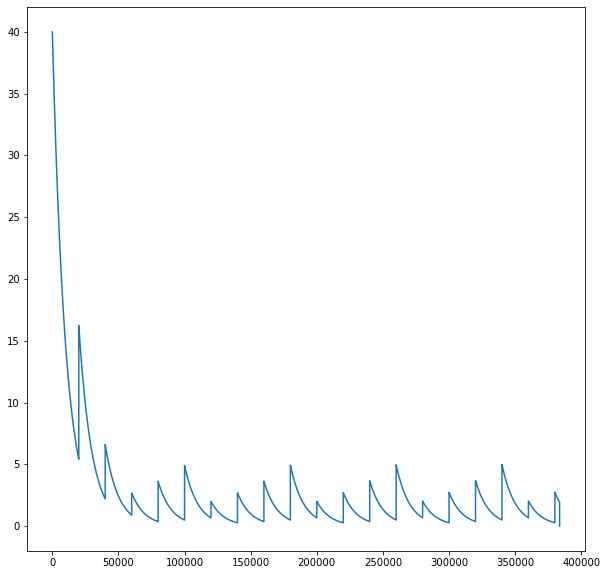

[[3 2 9 4 5 7 8 1 6]
 [7 1 6 9 8 2 3 5 4]
 [8 5 4 3 6 1 9 7 2]
 [6 8 3 7 4 5 2 9 1]
 [1 9 5 6 2 8 4 3 7]
 [2 4 7 1 3 9 6 8 5]
 [9 7 2 8 1 4 5 6 3]
 [5 3 8 2 7 6 1 4 9]
 [4 6 1 5 9 3 7 2 8]]
Znaleziono prawidłowe rozwiązanie w 383561 iteracjach

****************

[[0 0 2 0 0 0 7 0 0]
 [0 6 0 0 0 0 1 9 0]
 [1 0 0 0 0 0 6 5 8]
 [0 0 0 8 2 6 0 0 0]
 [0 0 0 0 0 7 0 0 0]
 [0 0 0 1 9 3 0 0 0]
 [8 0 6 0 0 0 4 3 5]
 [0 7 3 0 0 0 8 6 0]
 [0 0 4 0 0 0 2 0 0]]


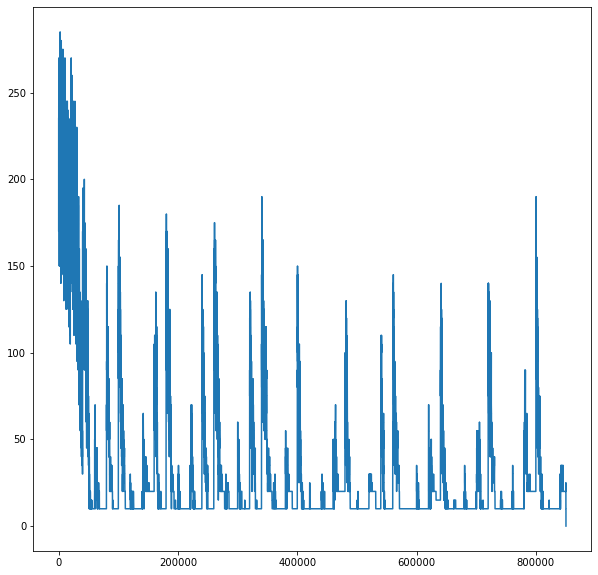

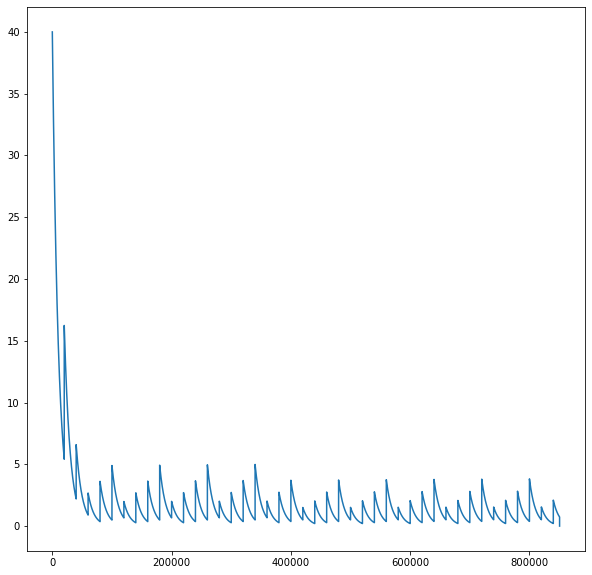

[[5 8 2 9 6 1 7 4 3]
 [4 6 7 3 8 5 1 9 2]
 [1 3 9 7 4 2 6 5 8]
 [7 9 5 8 2 6 3 1 4]
 [3 2 1 4 5 7 9 8 6]
 [6 4 8 1 9 3 5 2 7]
 [8 1 6 2 7 9 4 3 5]
 [2 7 3 5 1 4 8 6 9]
 [9 5 4 6 3 8 2 7 1]]
Znaleziono prawidłowe rozwiązanie w 850526 iteracjach

****************

[[0 4 0 0 7 0 0 0 9]
 [8 5 0 0 0 0 0 0 0]
 [0 0 1 0 0 0 0 0 0]
 [0 0 0 0 4 3 9 0 0]
 [0 0 0 2 0 0 0 0 5]
 [6 0 0 5 0 0 0 0 1]
 [0 0 2 0 5 0 0 0 0]
 [0 9 0 0 0 8 3 4 0]
 [0 0 7 0 9 0 0 6 0]]


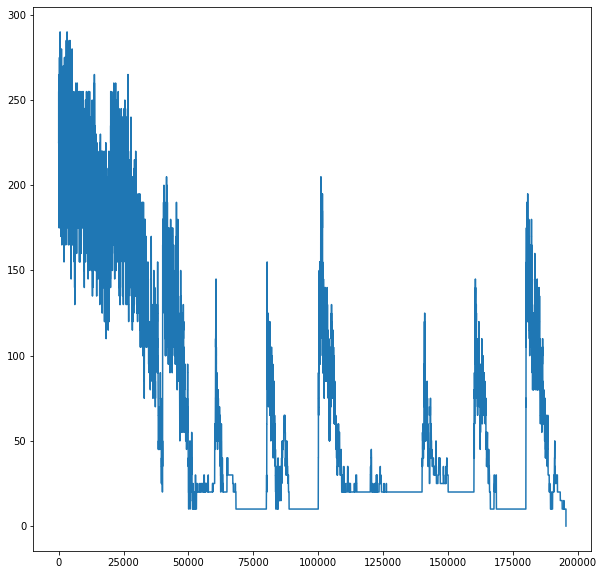

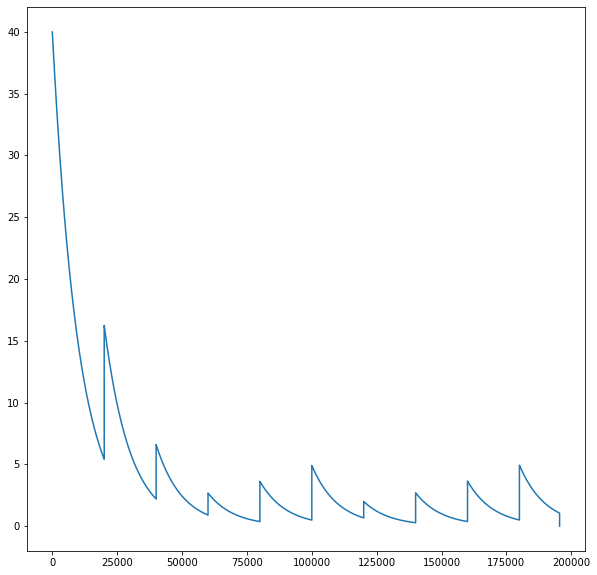

[[2 4 3 8 7 5 6 1 9]
 [8 5 6 9 3 1 2 7 4]
 [9 7 1 4 6 2 8 5 3]
 [5 1 8 7 4 3 9 2 6]
 [7 3 9 2 1 6 4 8 5]
 [6 2 4 5 8 9 7 3 1]
 [4 6 2 3 5 7 1 9 8]
 [1 9 5 6 2 8 3 4 7]
 [3 8 7 1 9 4 5 6 2]]
Znaleziono prawidłowe rozwiązanie w 195476 iteracjach

****************

[[0 4 0 0 0 0 1 7 9]
 [0 0 2 0 0 8 0 5 4]
 [0 0 6 0 0 5 0 0 8]
 [0 8 0 0 7 0 9 1 0]
 [0 5 0 0 9 0 0 3 0]
 [0 1 9 0 6 0 0 4 0]
 [3 0 0 4 0 0 7 0 0]
 [5 7 0 1 0 0 2 0 0]
 [9 2 8 0 0 0 0 6 0]]


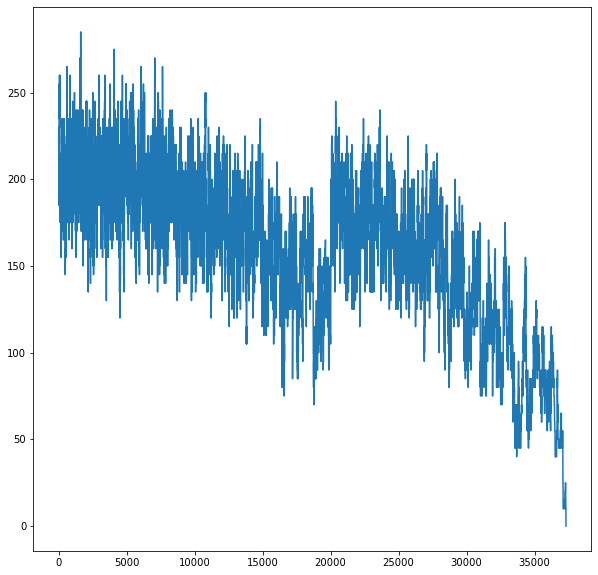

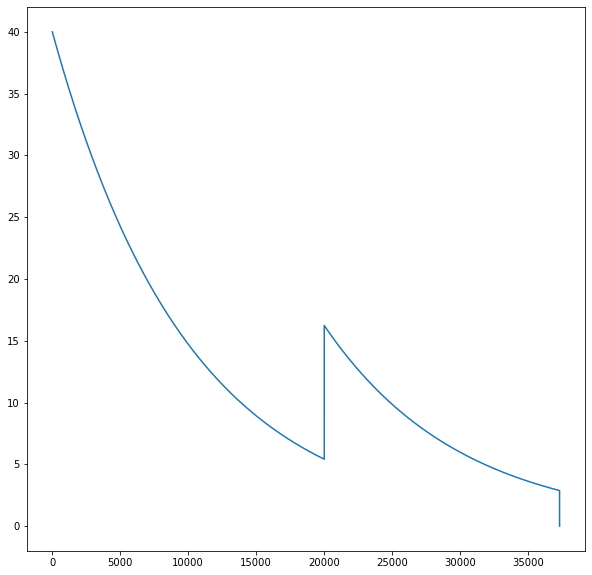

[[8 4 5 6 3 2 1 7 9]
 [7 3 2 9 1 8 6 5 4]
 [1 9 6 7 4 5 3 2 8]
 [6 8 3 5 7 4 9 1 2]
 [4 5 7 2 9 1 8 3 6]
 [2 1 9 8 6 3 5 4 7]
 [3 6 1 4 2 9 7 8 5]
 [5 7 4 1 8 6 2 9 3]
 [9 2 8 3 5 7 4 6 1]]
Znaleziono prawidłowe rozwiązanie w 37308 iteracjach

****************

[[0 5 0 0 1 0 0 4 0]
 [1 0 7 0 0 0 6 0 2]
 [0 0 0 9 0 5 0 0 0]
 [2 0 8 0 3 0 5 0 1]
 [0 4 0 0 7 0 0 2 0]
 [9 0 1 0 8 0 4 0 6]
 [0 0 0 4 0 1 0 0 0]
 [3 0 4 0 0 0 7 0 9]
 [0 2 0 0 6 0 0 1 0]]


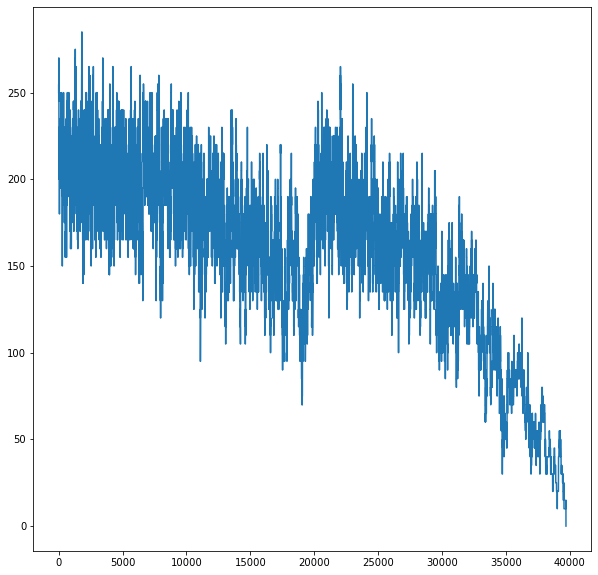

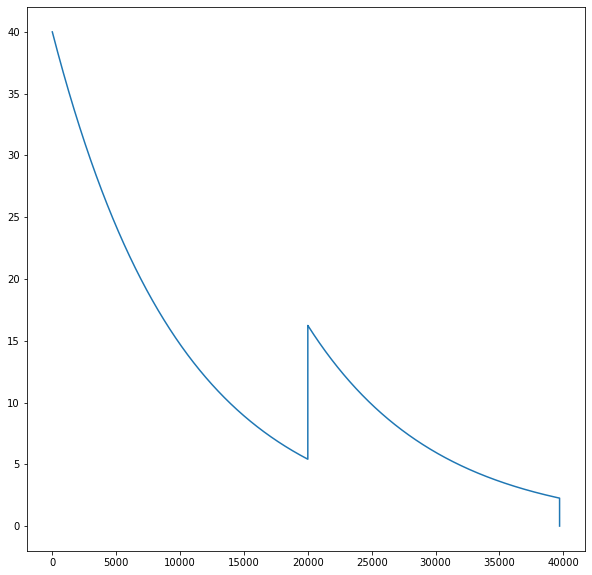

[[8 5 2 7 1 6 9 4 3]
 [1 9 7 8 4 3 6 5 2]
 [4 6 3 9 2 5 1 8 7]
 [2 7 8 6 3 4 5 9 1]
 [6 4 5 1 7 9 3 2 8]
 [9 3 1 5 8 2 4 7 6]
 [7 8 6 4 9 1 2 3 5]
 [3 1 4 2 5 8 7 6 9]
 [5 2 9 3 6 7 8 1 4]]
Znaleziono prawidłowe rozwiązanie w 39706 iteracjach

****************

[[0 0 8 0 6 0 9 0 0]
 [0 0 0 2 0 3 6 7 8]
 [7 0 6 0 5 1 0 0 4]
 [9 7 3 0 4 8 1 0 0]
 [6 2 0 0 3 9 0 5 0]
 [0 0 1 7 0 0 0 0 0]
 [5 8 0 9 0 0 3 0 6]
 [0 0 0 0 0 0 0 0 0]
 [0 4 0 0 0 5 7 2 1]]


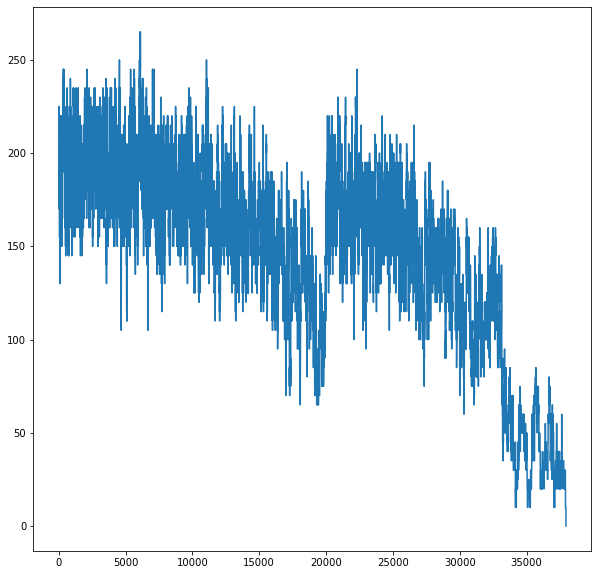

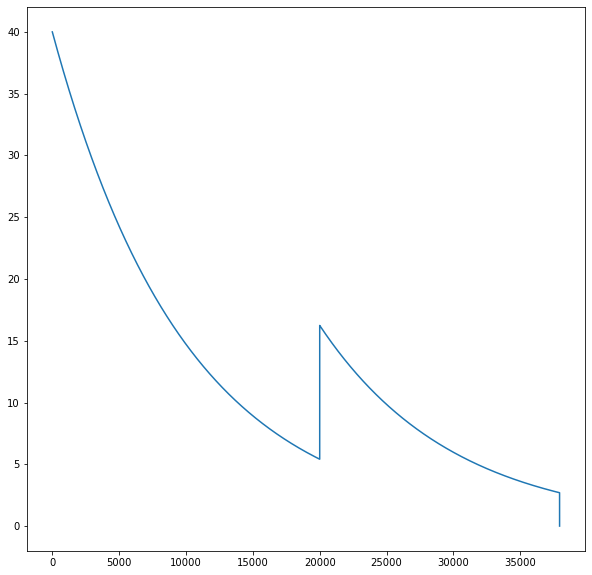

[[2 3 8 4 6 7 9 1 5]
 [4 1 5 2 9 3 6 7 8]
 [7 9 6 8 5 1 2 3 4]
 [9 7 3 5 4 8 1 6 2]
 [6 2 4 1 3 9 8 5 7]
 [8 5 1 7 2 6 4 9 3]
 [5 8 7 9 1 2 3 4 6]
 [1 6 2 3 7 4 5 8 9]
 [3 4 9 6 8 5 7 2 1]]
Znaleziono prawidłowe rozwiązanie w 37941 iteracjach

****************

[[0 5 0 2 0 0 0 0 0]
 [3 0 0 0 0 5 0 8 0]
 [9 6 0 0 7 8 2 0 0]
 [0 0 0 0 3 0 0 2 0]
 [7 0 8 0 0 0 1 0 3]
 [0 4 0 0 8 0 0 0 0]
 [0 0 1 6 4 0 0 3 2]
 [0 7 0 5 0 0 0 0 1]
 [0 0 0 0 0 9 0 5 0]]


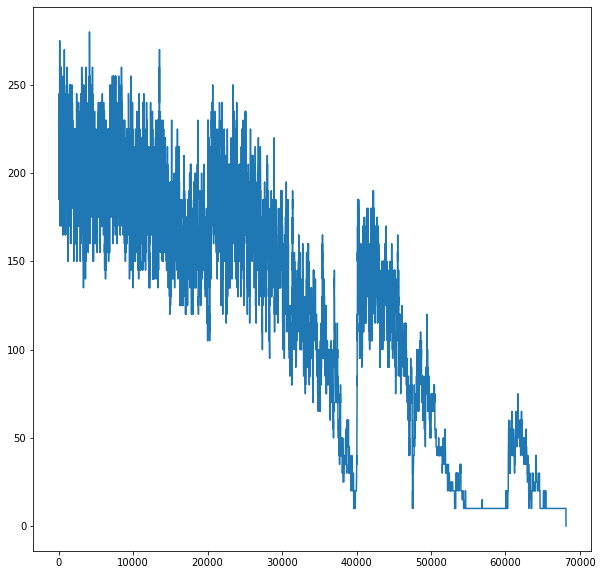

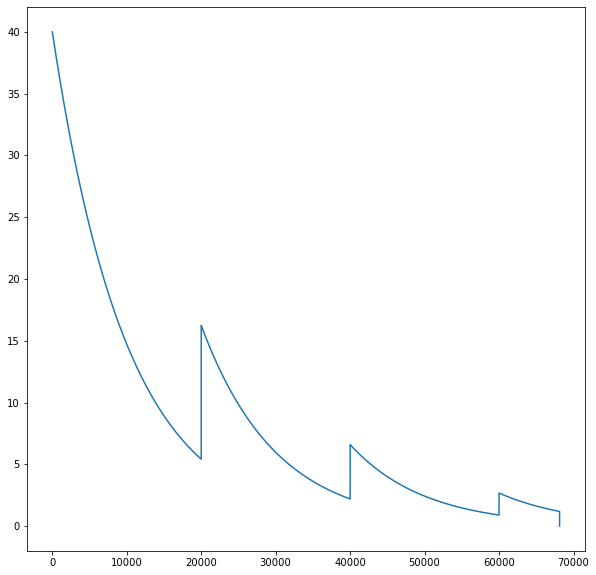

[[8 5 7 2 6 1 3 9 4]
 [3 1 2 4 9 5 7 8 6]
 [9 6 4 3 7 8 2 1 5]
 [1 9 5 7 3 4 6 2 8]
 [7 2 8 9 5 6 1 4 3]
 [6 4 3 1 8 2 5 7 9]
 [5 8 1 6 4 7 9 3 2]
 [4 7 9 5 2 3 8 6 1]
 [2 3 6 8 1 9 4 5 7]]
Znaleziono prawidłowe rozwiązanie w 68129 iteracjach

****************

[[0 2 7 0 0 0 8 0 0]
 [0 0 1 0 0 0 7 0 0]
 [0 0 0 4 0 0 0 0 0]
 [3 0 0 0 0 0 0 8 0]
 [0 5 0 0 0 0 0 0 9]
 [0 7 0 0 2 8 0 0 0]
 [0 9 0 0 6 7 0 0 0]
 [5 8 0 0 0 0 0 3 0]
 [0 0 0 0 4 0 0 5 6]]


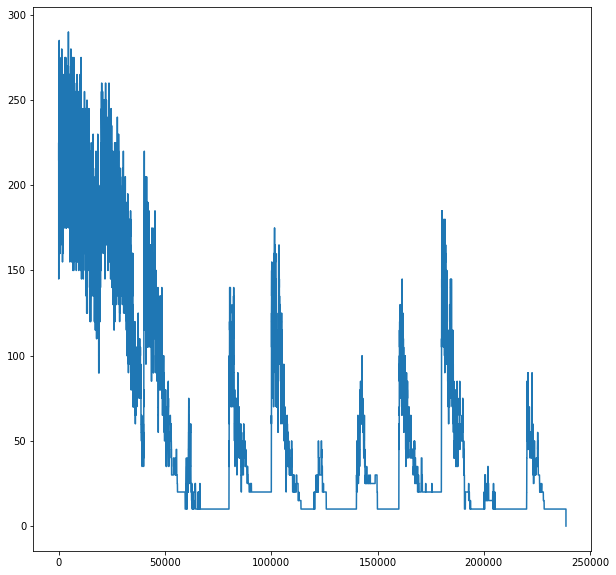

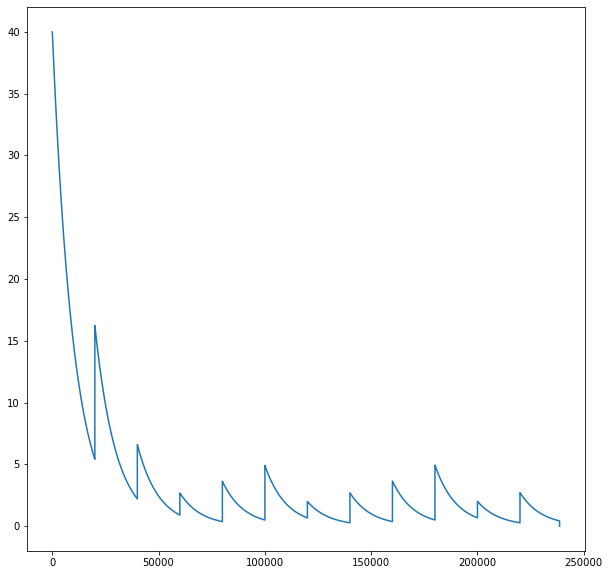

[[9 2 7 1 3 6 8 4 5]
 [6 4 1 9 8 5 7 2 3]
 [8 3 5 4 7 2 6 9 1]
 [3 6 4 7 5 9 1 8 2]
 [2 5 8 6 1 4 3 7 9]
 [1 7 9 3 2 8 5 6 4]
 [4 9 3 5 6 7 2 1 8]
 [5 8 6 2 9 1 4 3 7]
 [7 1 2 8 4 3 9 5 6]]
Znaleziono prawidłowe rozwiązanie w 238625 iteracjach

****************

[[0 0 0 0 0 0 0 0 0]
 [0 7 9 0 5 0 1 8 0]
 [8 0 0 0 0 0 0 0 7]
 [0 0 7 3 0 6 8 0 0]
 [4 5 0 7 0 8 0 9 6]
 [0 0 3 5 0 2 7 0 0]
 [7 0 0 0 0 0 0 0 5]
 [0 1 6 0 3 0 4 2 0]
 [0 0 0 0 0 0 0 0 0]]


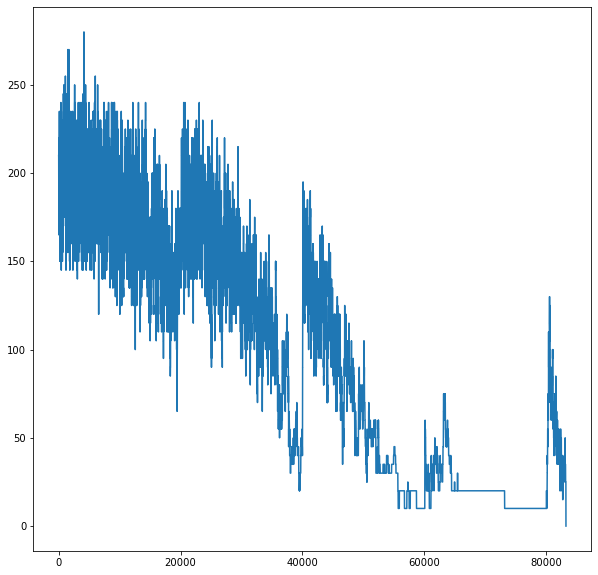

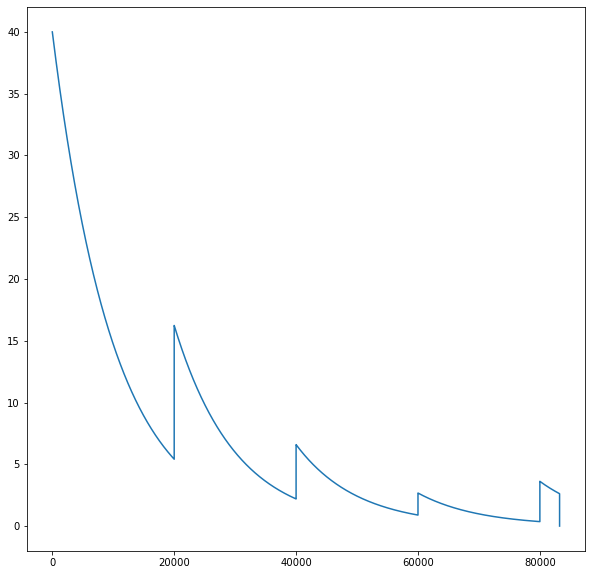

[[3 4 5 8 7 1 2 6 9]
 [2 7 9 6 5 3 1 8 4]
 [8 6 1 4 2 9 5 3 7]
 [1 9 7 3 4 6 8 5 2]
 [4 5 2 7 1 8 3 9 6]
 [6 8 3 5 9 2 7 4 1]
 [7 3 8 2 6 4 9 1 5]
 [5 1 6 9 3 7 4 2 8]
 [9 2 4 1 8 5 6 7 3]]
Znaleziono prawidłowe rozwiązanie w 83234 iteracjach

****************

[[0 9 0 3 8 4 0 0 0]
 [0 0 2 0 7 0 0 0 0]
 [0 0 0 0 0 0 0 7 1]
 [5 0 0 0 0 3 2 4 0]
 [0 3 0 0 0 0 0 0 0]
 [0 0 1 0 0 5 0 9 0]
 [0 0 0 8 0 0 0 0 0]
 [7 0 6 5 2 0 0 0 0]
 [0 0 0 0 0 6 4 0 0]]


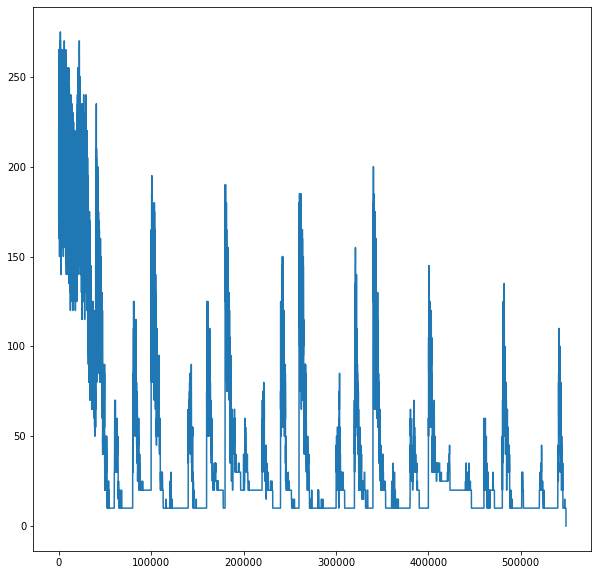

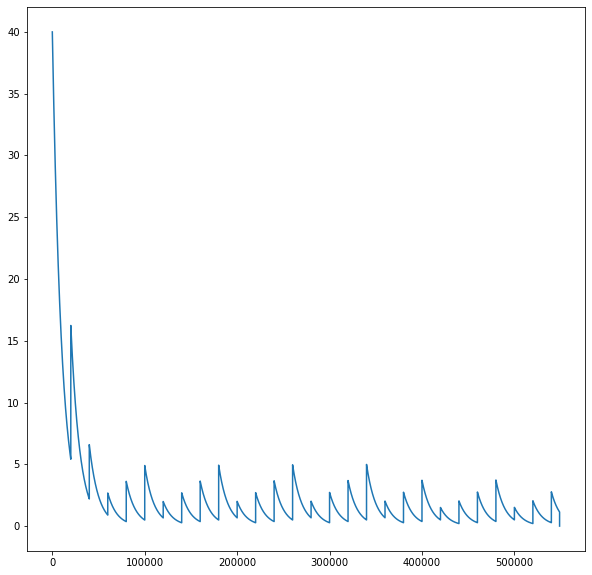

[[1 9 7 3 8 4 5 6 2]
 [8 5 2 6 7 1 9 3 4]
 [4 6 3 9 5 2 8 7 1]
 [5 8 9 7 1 3 2 4 6]
 [6 3 4 2 9 8 7 1 5]
 [2 7 1 4 6 5 3 9 8]
 [3 1 5 8 4 7 6 2 9]
 [7 4 6 5 2 9 1 8 3]
 [9 2 8 1 3 6 4 5 7]]
Znaleziono prawidłowe rozwiązanie w 548898 iteracjach

****************

[[6 7 0 0 0 8 0 1 0]
 [0 2 0 0 6 0 0 0 0]
 [0 0 0 0 3 0 0 0 0]
 [2 0 1 0 0 0 0 0 6]
 [4 8 0 0 0 1 7 0 0]
 [0 0 0 0 0 0 0 0 9]
 [0 0 4 5 0 0 0 0 0]
 [0 0 0 0 0 0 3 0 0]
 [0 0 3 4 0 0 8 0 2]]


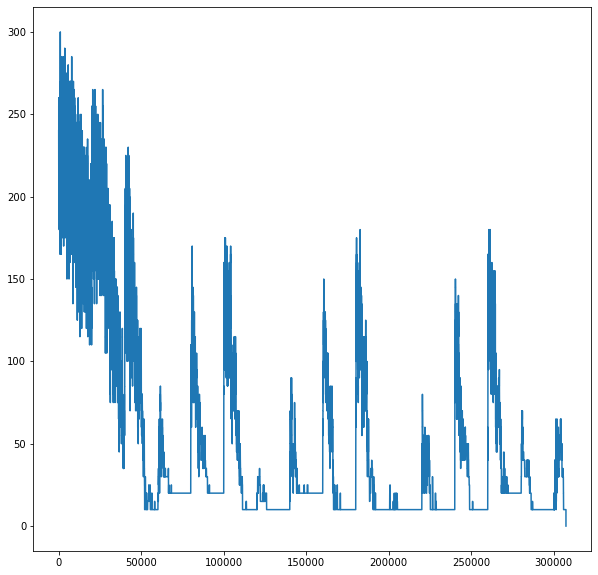

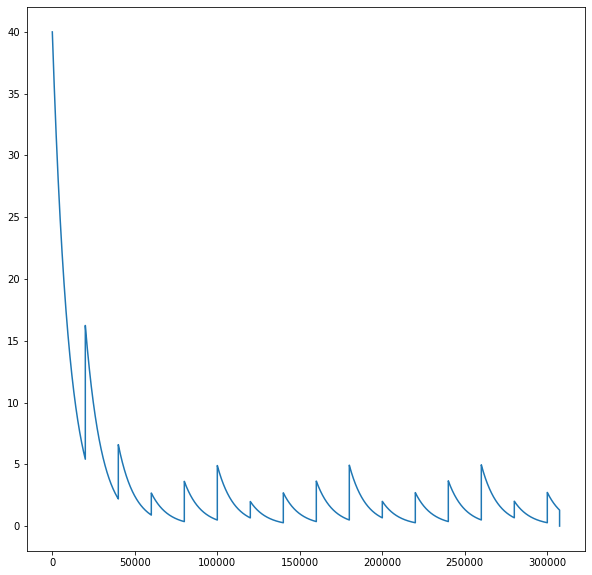

[[6 7 5 9 4 8 2 1 3]
 [3 2 8 1 6 5 9 7 4]
 [1 4 9 7 3 2 5 6 8]
 [2 9 1 3 5 7 4 8 6]
 [4 8 6 2 9 1 7 3 5]
 [5 3 7 6 8 4 1 2 9]
 [8 1 4 5 2 3 6 9 7]
 [9 5 2 8 7 6 3 4 1]
 [7 6 3 4 1 9 8 5 2]]
Znaleziono prawidłowe rozwiązanie w 307439 iteracjach

****************

[[8 0 6 0 0 0 0 5 2]
 [0 9 0 7 4 0 0 0 0]
 [0 7 2 6 5 8 0 3 4]
 [0 0 0 2 0 0 0 6 3]
 [9 0 3 1 6 0 0 0 7]
 [0 0 0 0 0 0 0 0 0]
 [0 0 0 5 0 0 6 0 0]
 [4 1 0 0 0 0 3 2 5]
 [5 0 7 0 0 0 0 0 8]]


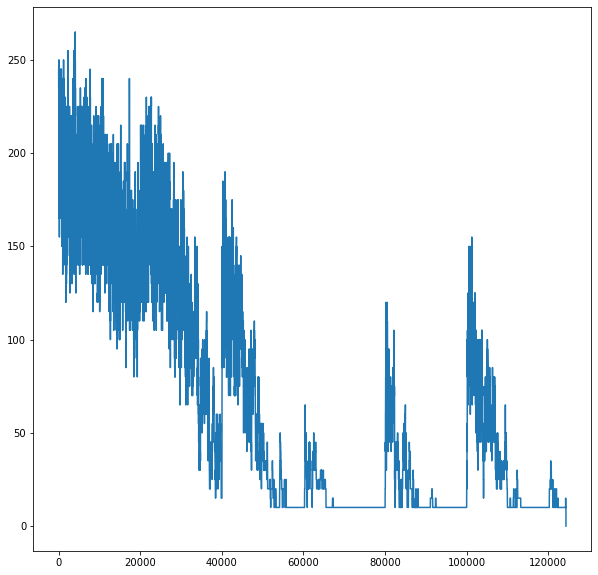

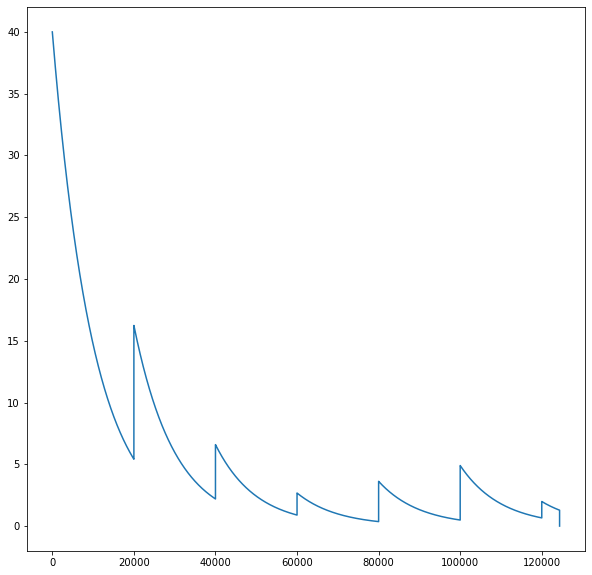

[[8 4 6 9 1 3 7 5 2]
 [3 9 5 7 4 2 8 1 6]
 [1 7 2 6 5 8 9 3 4]
 [7 5 4 2 8 9 1 6 3]
 [9 8 3 1 6 5 2 4 7]
 [6 2 1 4 3 7 5 8 9]
 [2 3 8 5 9 4 6 7 1]
 [4 1 9 8 7 6 3 2 5]
 [5 6 7 3 2 1 4 9 8]]
Znaleziono prawidłowe rozwiązanie w 124367 iteracjach

****************

[[0 0 1 7 2 5 0 0 0]
 [0 8 0 0 1 0 0 0 0]
 [2 5 0 0 0 0 1 3 0]
 [0 7 0 0 0 0 5 0 0]
 [0 0 0 1 8 6 0 0 0]
 [0 0 9 0 0 0 0 8 0]
 [0 4 5 0 0 0 0 2 9]
 [0 0 0 0 9 0 0 6 0]
 [0 0 0 6 4 8 3 0 0]]


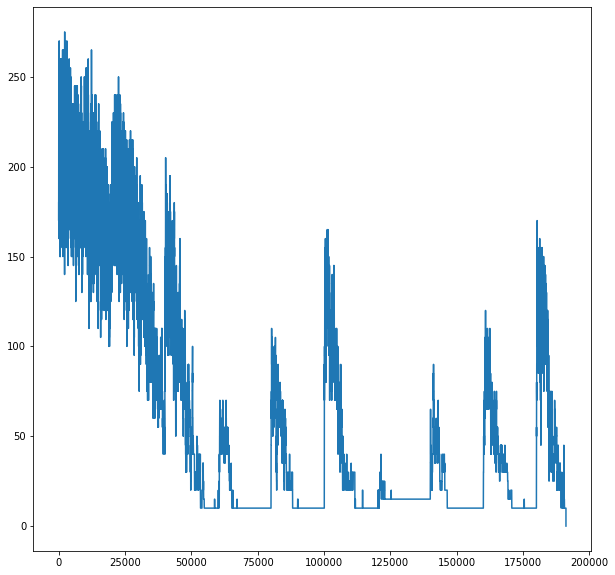

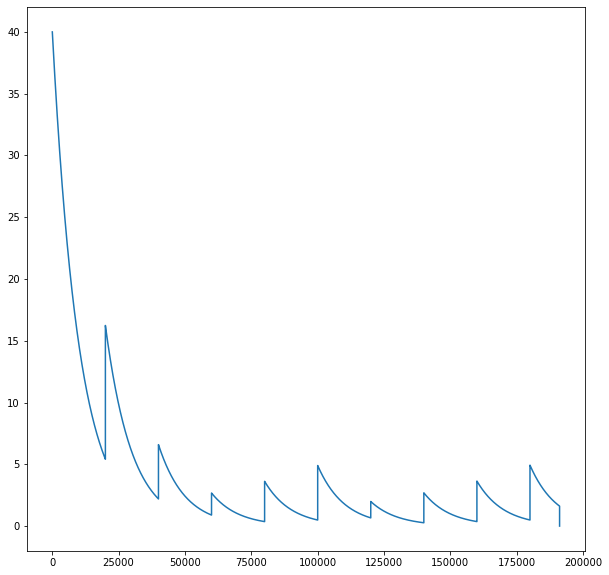

[[3 6 1 7 2 5 9 4 8]
 [9 8 7 4 1 3 2 5 6]
 [2 5 4 8 6 9 1 3 7]
 [8 7 6 9 3 4 5 1 2]
 [5 2 3 1 8 6 7 9 4]
 [4 1 9 2 5 7 6 8 3]
 [6 4 5 3 7 1 8 2 9]
 [7 3 8 5 9 2 4 6 1]
 [1 9 2 6 4 8 3 7 5]]
Znaleziono prawidłowe rozwiązanie w 191154 iteracjach

****************

[[0 0 0 8 1 5 4 0 0]
 [1 0 5 0 0 0 0 3 0]
 [0 0 0 0 0 4 0 0 1]
 [0 1 9 0 0 0 0 8 0]
 [0 6 0 4 0 0 0 0 0]
 [2 0 8 7 9 0 0 0 0]
 [0 0 1 0 0 0 0 4 3]
 [8 0 0 0 0 0 2 9 7]
 [0 0 6 0 0 2 0 0 0]]


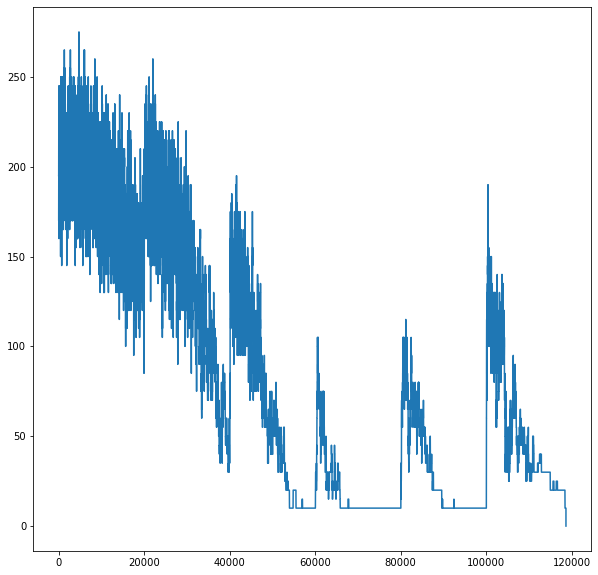

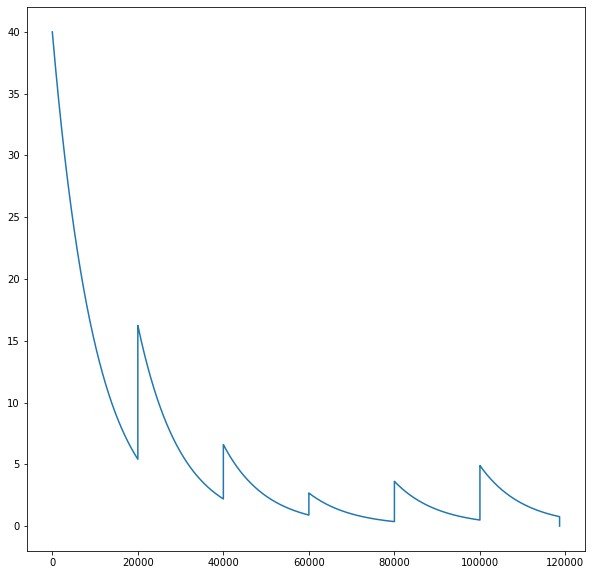

[[6 7 3 8 1 5 4 2 9]
 [1 4 5 2 7 9 8 3 6]
 [9 8 2 6 3 4 5 7 1]
 [4 1 9 5 6 3 7 8 2]
 [3 6 7 4 2 8 9 1 5]
 [2 5 8 7 9 1 3 6 4]
 [5 2 1 9 8 7 6 4 3]
 [8 3 4 1 5 6 2 9 7]
 [7 9 6 3 4 2 1 5 8]]
Znaleziono prawidłowe rozwiązanie w 118624 iteracjach

****************

[[0 0 0 0 0 0 0 8 5]
 [0 0 0 2 1 0 0 0 9]
 [9 6 0 0 8 0 1 0 0]
 [5 0 0 8 0 0 0 1 6]
 [0 0 0 0 0 0 0 0 0]
 [8 9 0 0 0 6 0 0 7]
 [0 0 9 0 7 0 0 5 2]
 [3 0 0 0 5 4 0 0 0]
 [4 8 0 0 0 0 0 0 0]]


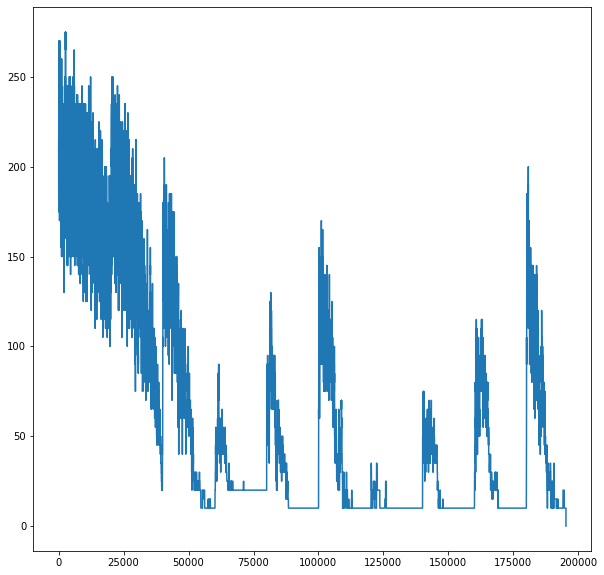

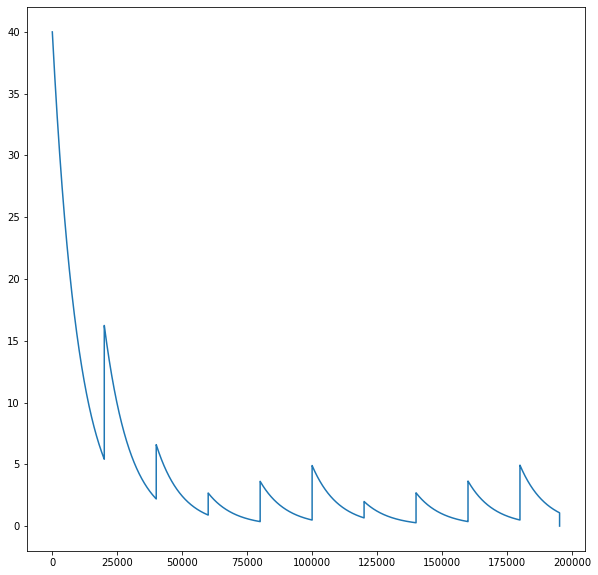

[[1 3 2 6 4 9 7 8 5]
 [7 5 8 2 1 3 6 4 9]
 [9 6 4 7 8 5 1 2 3]
 [5 4 3 8 9 7 2 1 6]
 [2 7 6 5 3 1 8 9 4]
 [8 9 1 4 2 6 5 3 7]
 [6 1 9 3 7 8 4 5 2]
 [3 2 7 1 5 4 9 6 8]
 [4 8 5 9 6 2 3 7 1]]
Znaleziono prawidłowe rozwiązanie w 195248 iteracjach

****************

[[0 0 7 0 0 1 4 0 0]
 [0 6 0 0 0 0 0 0 0]
 [2 0 5 0 0 0 0 0 0]
 [0 0 1 7 6 0 0 5 8]
 [0 0 0 0 3 0 0 0 0]
 [0 9 0 2 0 4 0 0 0]
 [0 3 0 0 5 0 0 0 9]
 [0 0 4 0 0 0 6 0 0]
 [0 5 0 0 8 0 7 2 1]]


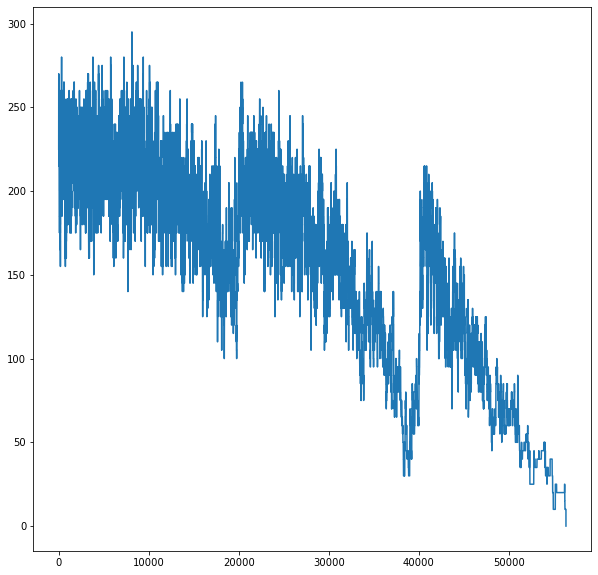

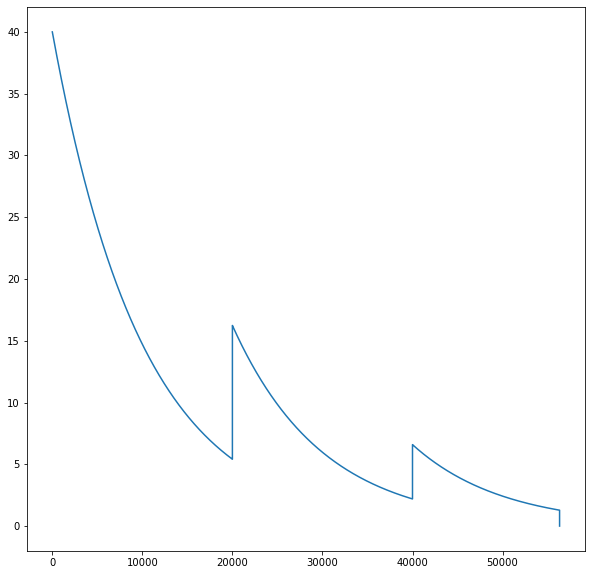

[[9 8 7 5 2 1 4 6 3]
 [4 6 3 9 7 8 5 1 2]
 [2 1 5 3 4 6 9 8 7]
 [3 4 1 7 6 9 2 5 8]
 [7 2 6 8 3 5 1 9 4]
 [5 9 8 2 1 4 3 7 6]
 [1 3 2 6 5 7 8 4 9]
 [8 7 4 1 9 2 6 3 5]
 [6 5 9 4 8 3 7 2 1]]
Znaleziono prawidłowe rozwiązanie w 56334 iteracjach

****************

[[0 0 0 0 5 9 0 2 0]
 [0 9 0 7 4 0 0 0 0]
 [4 0 6 0 0 1 9 0 8]
 [0 1 7 0 2 0 5 0 0]
 [8 0 0 0 0 5 7 0 2]
 [0 0 0 0 0 3 0 4 1]
 [5 8 0 6 0 0 0 0 0]
 [9 3 4 0 0 0 2 8 0]
 [0 6 1 0 0 2 0 0 0]]


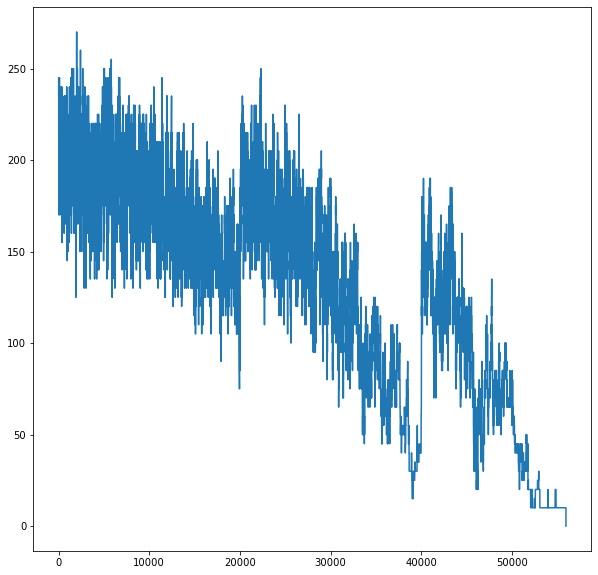

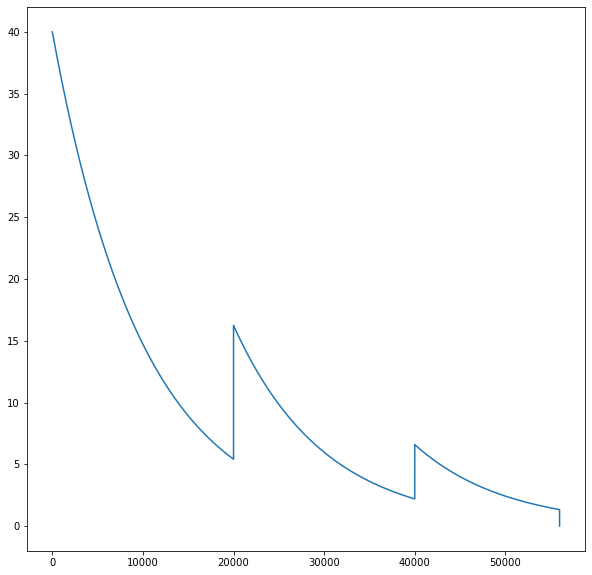

[[1 7 3 8 5 9 6 2 4]
 [2 9 8 7 4 6 1 5 3]
 [4 5 6 2 3 1 9 7 8]
 [3 1 7 4 2 8 5 6 9]
 [8 4 9 1 6 5 7 3 2]
 [6 2 5 9 7 3 8 4 1]
 [5 8 2 6 9 4 3 1 7]
 [9 3 4 5 1 7 2 8 6]
 [7 6 1 3 8 2 4 9 5]]
Znaleziono prawidłowe rozwiązanie w 55980 iteracjach

****************

[[0 0 0 6 0 2 0 0 0]
 [4 0 0 0 5 0 0 0 1]
 [0 8 5 0 1 0 6 2 0]
 [0 3 8 2 0 6 7 1 0]
 [0 0 0 0 0 0 0 0 0]
 [0 1 9 4 0 7 3 5 0]
 [0 2 6 0 4 0 5 3 0]
 [9 0 0 0 2 0 0 0 7]
 [0 0 0 8 0 9 0 0 0]]


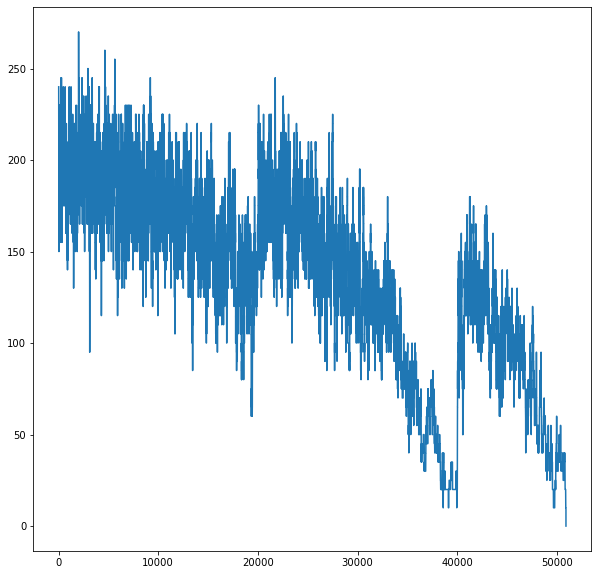

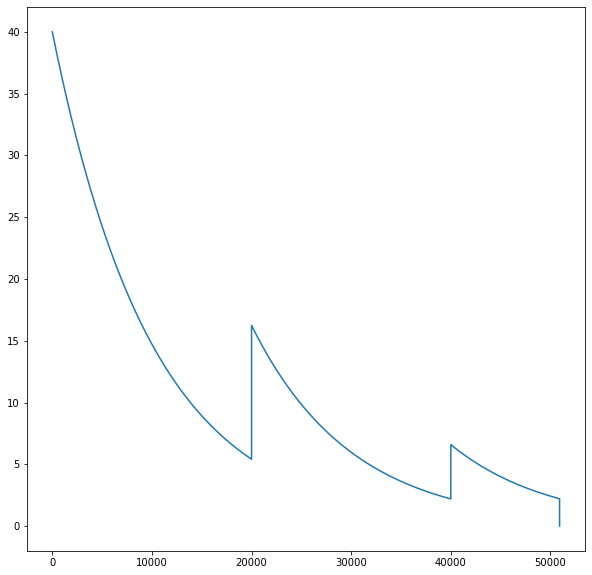

[[1 9 3 6 7 2 4 8 5]
 [4 6 2 3 5 8 9 7 1]
 [7 8 5 9 1 4 6 2 3]
 [5 3 8 2 9 6 7 1 4]
 [6 7 4 1 3 5 2 9 8]
 [2 1 9 4 8 7 3 5 6]
 [8 2 6 7 4 1 5 3 9]
 [9 4 1 5 2 3 8 6 7]
 [3 5 7 8 6 9 1 4 2]]
Znaleziono prawidłowe rozwiązanie w 50919 iteracjach

****************

[[7 0 0 0 0 4 0 0 1]
 [0 2 0 0 6 0 0 8 0]
 [0 0 1 5 0 0 2 0 0]
 [8 0 0 0 9 0 7 0 0]
 [0 5 0 3 0 7 0 2 0]
 [0 0 6 0 5 0 0 0 8]
 [0 0 8 0 0 9 1 0 0]
 [0 9 0 0 1 0 0 6 0]
 [5 0 0 8 0 0 0 0 3]]


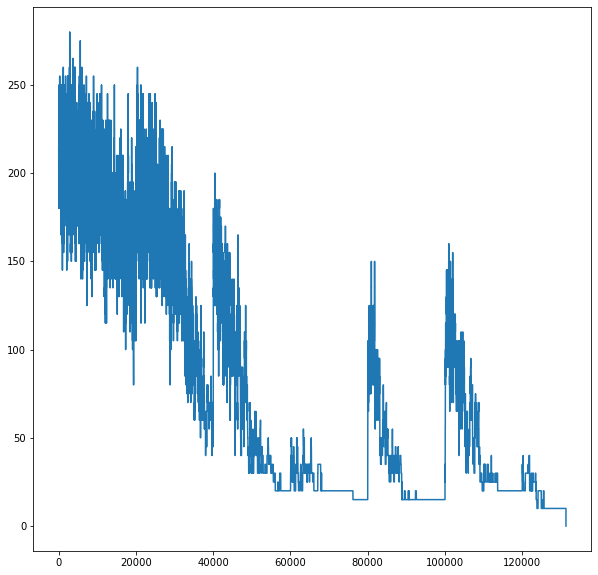

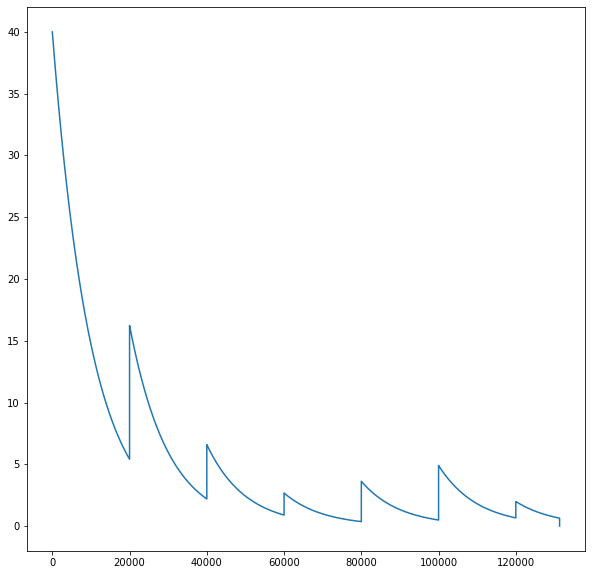

[[7 8 5 9 2 4 6 3 1]
 [9 2 4 1 6 3 5 8 7]
 [6 3 1 5 7 8 2 4 9]
 [8 4 3 6 9 2 7 1 5]
 [1 5 9 3 8 7 4 2 6]
 [2 7 6 4 5 1 3 9 8]
 [4 6 8 7 3 9 1 5 2]
 [3 9 7 2 1 5 8 6 4]
 [5 1 2 8 4 6 9 7 3]]
Znaleziono prawidłowe rozwiązanie w 131327 iteracjach

****************

[[0 7 1 0 3 9 0 0 0]
 [4 6 0 0 7 5 0 1 0]
 [8 3 0 0 6 0 7 0 2]
 [0 4 2 0 0 0 0 5 8]
 [6 0 0 0 0 0 9 7 0]
 [0 1 0 5 0 0 0 0 4]
 [0 0 0 0 0 8 4 6 9]
 [7 9 0 3 4 2 0 0 0]
 [5 0 0 0 0 1 3 0 0]]


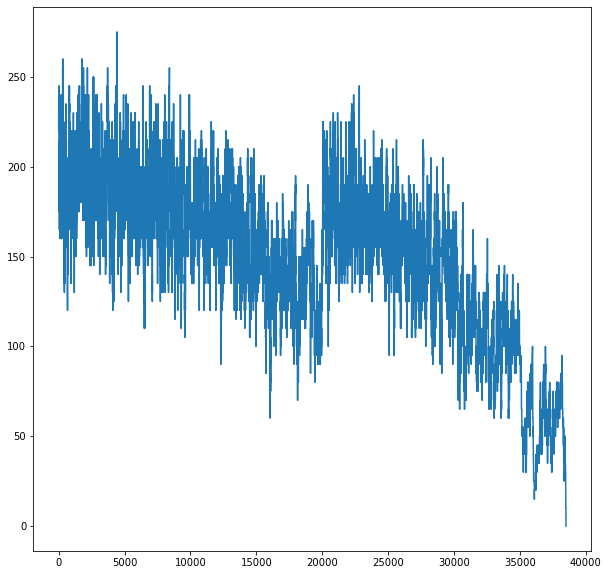

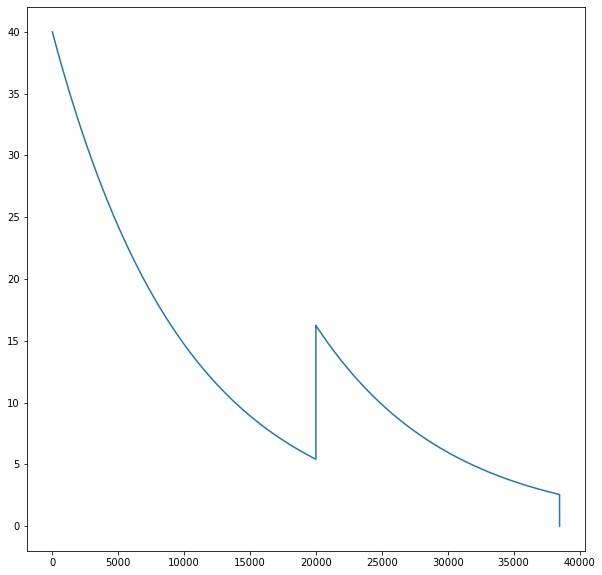

[[2 7 1 8 3 9 5 4 6]
 [4 6 9 2 7 5 8 1 3]
 [8 3 5 1 6 4 7 9 2]
 [3 4 2 9 1 7 6 5 8]
 [6 5 8 4 2 3 9 7 1]
 [9 1 7 5 8 6 2 3 4]
 [1 2 3 7 5 8 4 6 9]
 [7 9 6 3 4 2 1 8 5]
 [5 8 4 6 9 1 3 2 7]]
Znaleziono prawidłowe rozwiązanie w 38489 iteracjach

****************

[[1 0 0 0 0 7 0 9 0]
 [0 3 0 0 2 0 0 0 8]
 [0 0 9 6 0 0 5 0 0]
 [0 0 5 3 0 0 9 0 0]
 [0 1 0 0 8 0 0 0 2]
 [6 0 0 0 0 4 0 0 0]
 [3 0 0 0 0 0 0 1 0]
 [0 4 0 0 0 0 0 0 7]
 [0 0 7 0 0 0 3 0 0]]


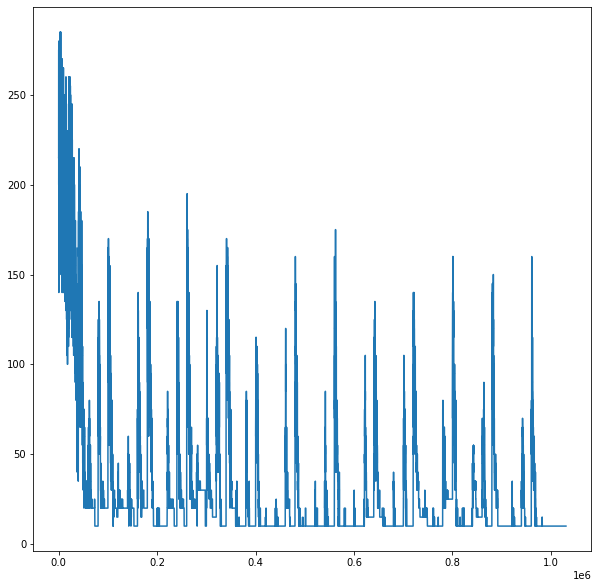

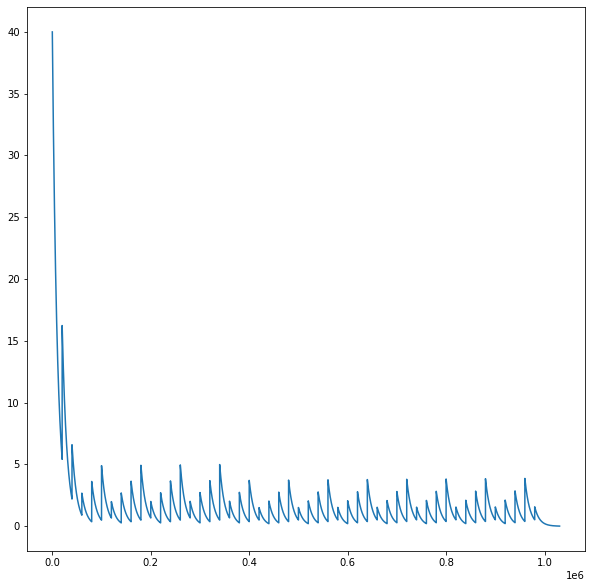

[[1 5 4 8 3 7 2 9 6]
 [7 3 6 5 2 9 1 4 8]
 [8 2 9 6 4 1 5 7 3]
 [4 7 5 3 6 2 9 8 1]
 [9 1 3 7 8 5 4 6 2]
 [6 8 2 1 9 4 7 3 5]
 [3 9 8 2 7 6 5 1 4]
 [2 4 1 9 5 3 6 8 7]
 [5 6 7 4 1 8 3 2 9]]
Nie rozwiązano, liczba pól błędnych 10

****************

[[9 0 7 5 0 1 8 2 0]
 [0 3 5 0 2 0 0 1 0]
 [0 1 8 0 0 6 0 0 3]
 [0 0 0 0 0 0 2 0 9]
 [0 9 0 6 5 2 0 0 1]
 [1 0 2 0 4 9 5 0 0]
 [3 8 6 4 0 0 0 0 0]
 [7 5 0 2 1 0 6 0 0]
 [4 0 0 0 0 0 0 8 0]]


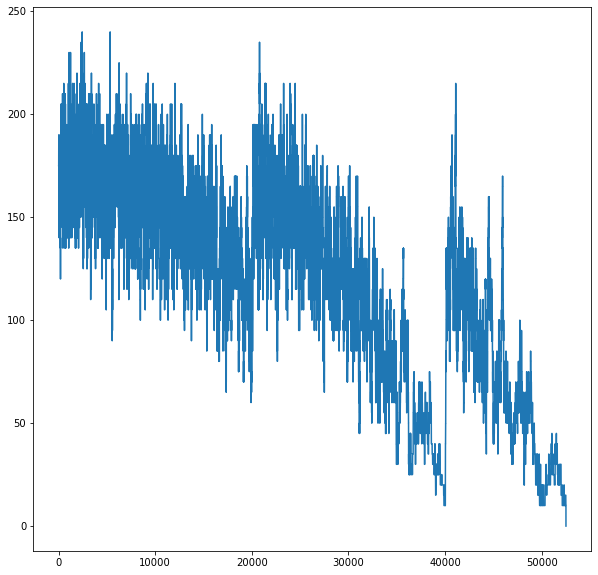

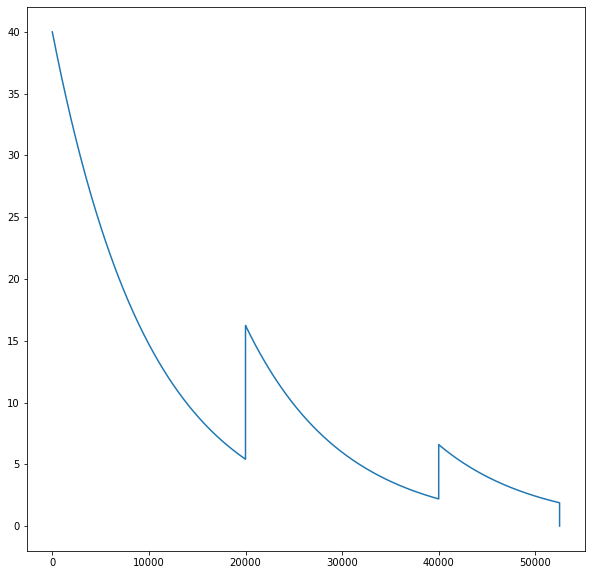

[[9 4 7 5 3 1 8 2 6]
 [6 3 5 8 2 4 9 1 7]
 [2 1 8 7 9 6 4 5 3]
 [5 6 3 1 8 7 2 4 9]
 [8 9 4 6 5 2 3 7 1]
 [1 7 2 3 4 9 5 6 8]
 [3 8 6 4 7 5 1 9 2]
 [7 5 9 2 1 8 6 3 4]
 [4 2 1 9 6 3 7 8 5]]
Znaleziono prawidłowe rozwiązanie w 52513 iteracjach

****************

[[0 4 0 0 0 0 0 0 0]
 [8 0 6 0 0 0 0 0 7]
 [5 0 0 0 0 0 1 0 0]
 [0 0 5 1 9 0 0 6 0]
 [0 0 4 0 5 0 0 0 0]
 [0 0 0 3 0 0 0 9 1]
 [0 0 0 0 0 2 4 3 6]
 [0 9 0 0 0 0 0 0 0]
 [0 0 0 0 0 8 0 2 0]]


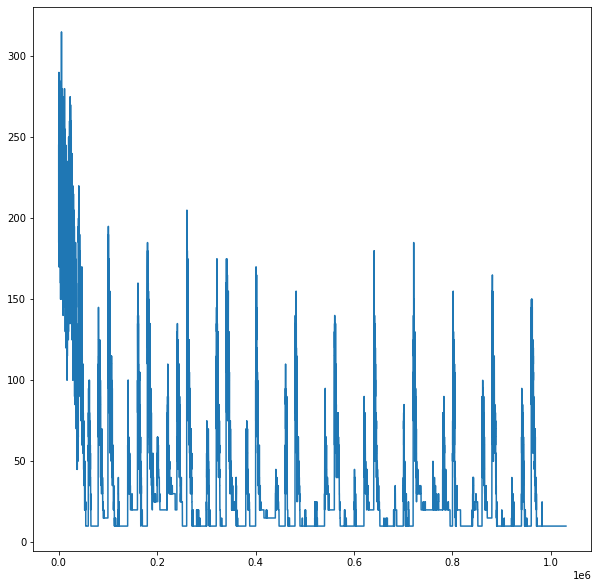

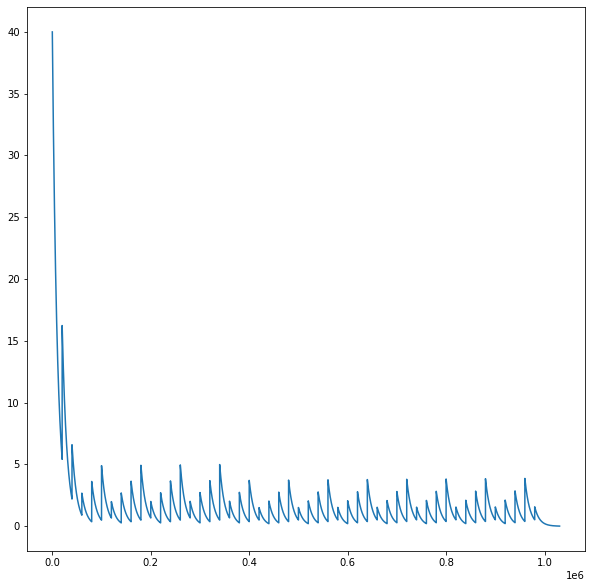

[[1 4 2 5 7 9 6 8 3]
 [8 3 6 2 4 1 9 5 7]
 [5 7 9 6 8 3 1 4 2]
 [3 2 5 1 9 7 8 6 4]
 [9 1 4 8 5 6 2 7 5]
 [6 8 7 3 2 4 3 9 1]
 [7 5 8 9 1 2 4 3 6]
 [2 9 3 4 6 5 7 1 8]
 [4 6 1 7 3 8 5 2 9]]
Nie rozwiązano, liczba pól błędnych 10

****************

[[0 0 0 0 4 0 0 0 9]
 [0 0 0 7 0 0 0 0 0]
 [0 0 1 0 0 0 6 0 0]
 [0 1 3 6 9 0 4 0 0]
 [0 0 0 0 0 0 0 0 8]
 [0 0 0 5 2 8 0 0 0]
 [0 6 7 1 8 0 0 0 0]
 [0 0 0 0 0 0 9 0 2]
 [9 5 4 0 3 0 0 1 0]]


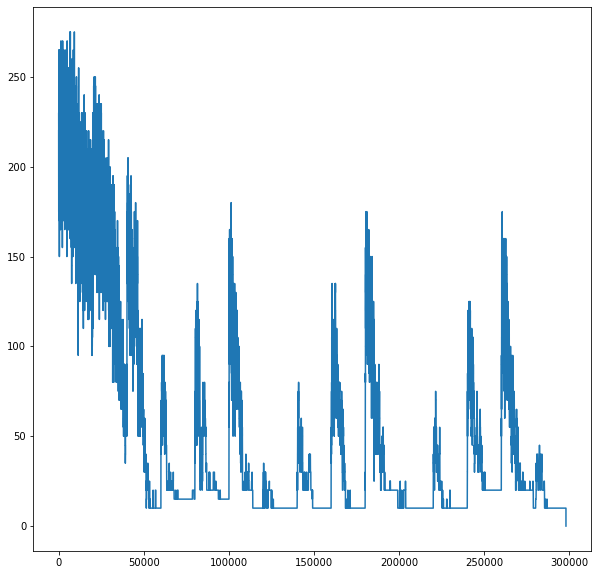

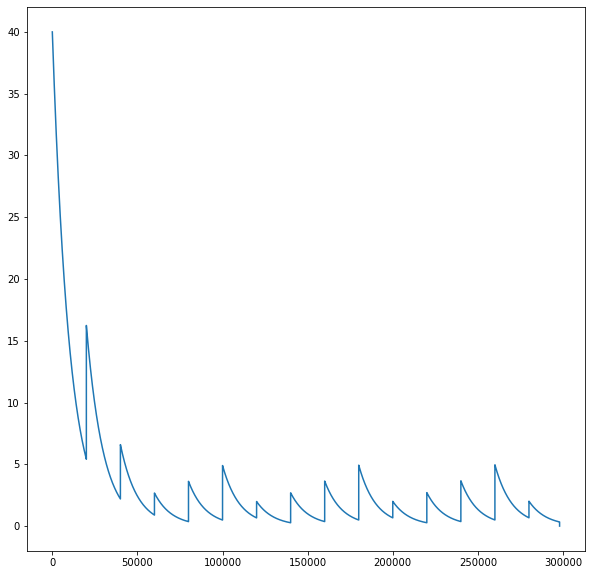

[[6 7 2 8 4 1 3 5 9]
 [4 9 5 7 6 3 2 8 1]
 [3 8 1 9 5 2 6 7 4]
 [8 1 3 6 9 7 4 2 5]
 [5 2 6 3 1 4 7 9 8]
 [7 4 9 5 2 8 1 3 6]
 [2 6 7 1 8 9 5 4 3]
 [1 3 8 4 7 5 9 6 2]
 [9 5 4 2 3 6 8 1 7]]
Znaleziono prawidłowe rozwiązanie w 297992 iteracjach

****************

[[0 0 2 0 0 4 0 0 0]
 [0 0 8 6 0 0 0 0 0]
 [0 9 0 0 0 0 0 3 0]
 [8 0 0 0 6 2 0 0 0]
 [1 4 0 0 3 0 5 0 9]
 [0 7 0 0 0 0 0 0 0]
 [0 3 5 0 0 8 6 0 7]
 [0 0 0 0 0 0 0 4 2]
 [0 0 0 9 0 1 0 0 3]]


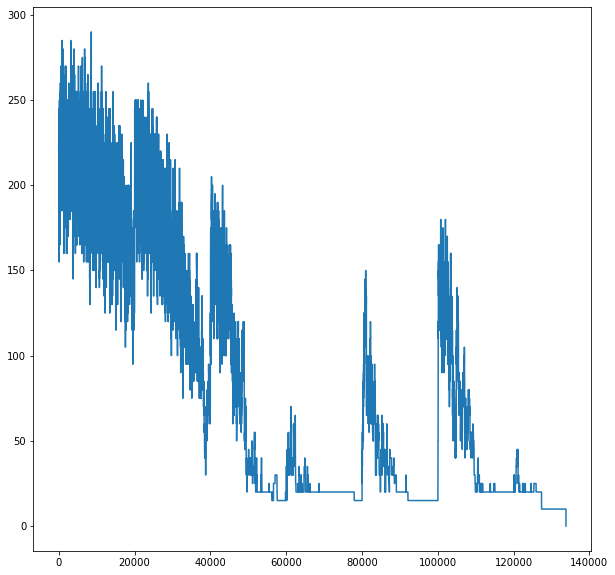

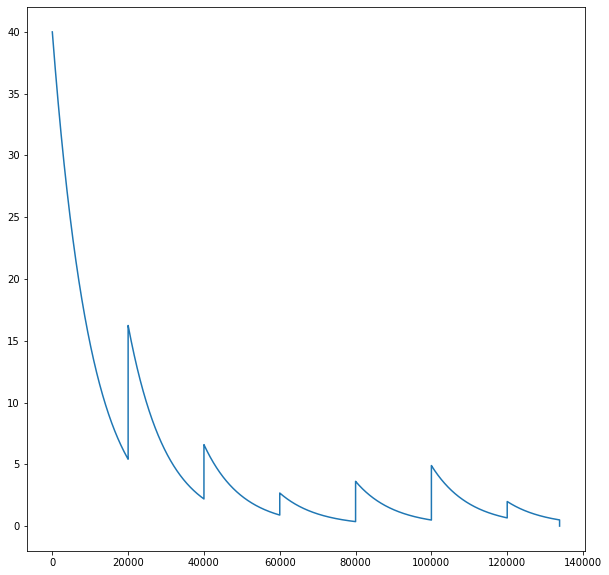

[[3 6 2 7 9 4 1 8 5]
 [5 1 8 6 2 3 7 9 4]
 [4 9 7 1 8 5 2 3 6]
 [8 5 9 4 6 2 3 7 1]
 [1 4 6 8 3 7 5 2 9]
 [2 7 3 5 1 9 4 6 8]
 [9 3 5 2 4 8 6 1 7]
 [7 8 1 3 5 6 9 4 2]
 [6 2 4 9 7 1 8 5 3]]
Znaleziono prawidłowe rozwiązanie w 133814 iteracjach

****************

[[3 8 0 0 0 0 0 0 0]
 [0 0 0 4 0 0 7 8 5]
 [0 0 9 0 2 0 3 0 0]
 [0 6 0 0 9 0 0 0 0]
 [8 0 0 3 0 2 0 0 9]
 [0 0 0 0 4 0 0 7 0]
 [0 0 1 0 7 0 5 0 0]
 [4 9 5 0 0 6 0 0 0]
 [0 0 0 0 0 0 0 9 2]]


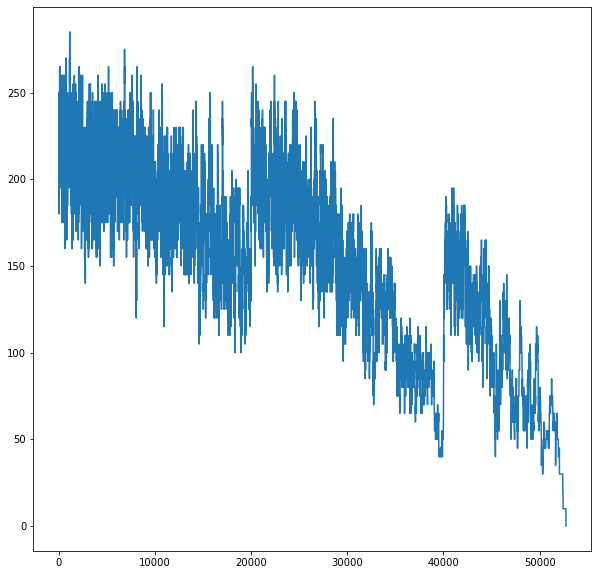

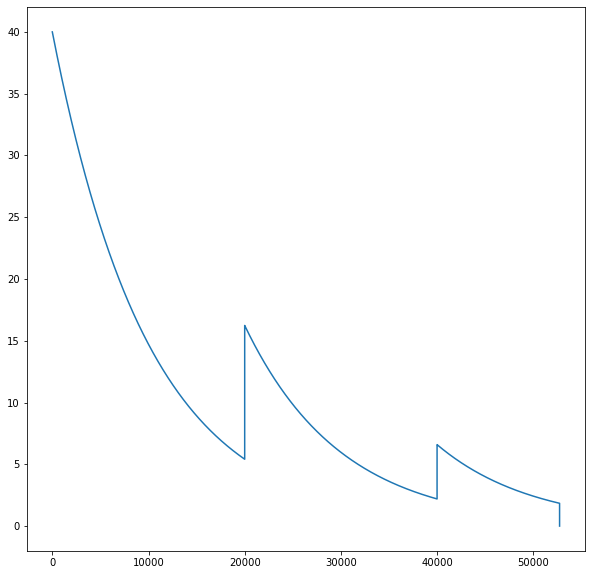

[[3 8 4 5 6 7 9 2 1]
 [1 2 6 4 3 9 7 8 5]
 [7 5 9 8 2 1 3 4 6]
 [5 6 3 7 9 8 2 1 4]
 [8 4 7 3 1 2 6 5 9]
 [9 1 2 6 4 5 8 7 3]
 [2 3 1 9 7 4 5 6 8]
 [4 9 5 2 8 6 1 3 7]
 [6 7 8 1 5 3 4 9 2]]
Znaleziono prawidłowe rozwiązanie w 52736 iteracjach

****************

[[0 0 0 0 0 0 0 0 7]
 [7 2 0 3 0 9 0 0 1]
 [0 0 8 7 0 5 0 6 0]
 [5 0 2 8 9 0 0 0 0]
 [0 4 0 5 0 1 0 9 0]
 [0 0 0 0 6 3 7 0 5]
 [0 3 0 9 0 6 1 0 0]
 [2 0 0 1 0 7 0 5 3]
 [9 0 0 0 0 0 0 0 0]]


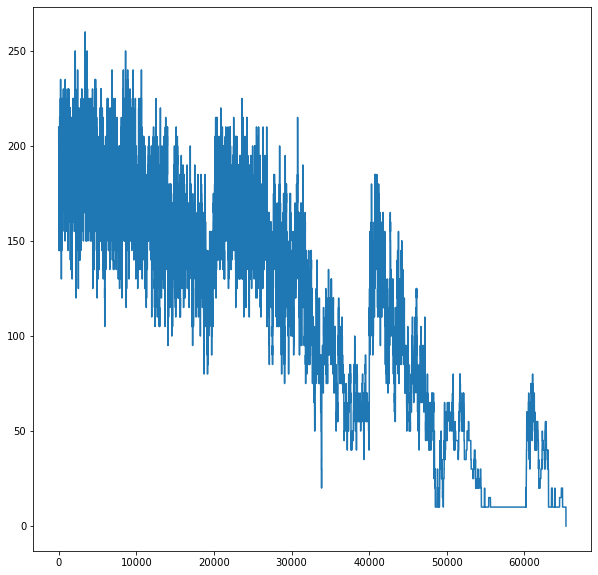

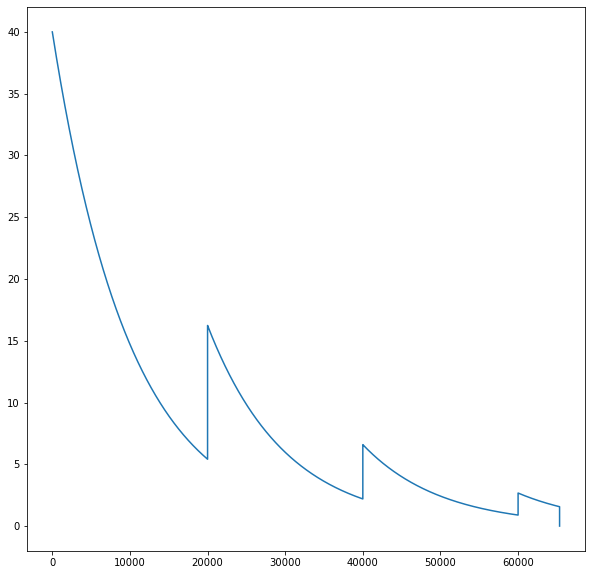

[[4 9 5 6 1 8 2 3 7]
 [7 2 6 3 4 9 5 8 1]
 [3 1 8 7 2 5 4 6 9]
 [5 7 2 8 9 4 3 1 6]
 [6 4 3 5 7 1 8 9 2]
 [1 8 9 2 6 3 7 4 5]
 [8 3 7 9 5 6 1 2 4]
 [2 6 4 1 8 7 9 5 3]
 [9 5 1 4 3 2 6 7 8]]
Znaleziono prawidłowe rozwiązanie w 65345 iteracjach

****************

[[0 2 5 0 0 7 0 0 4]
 [0 0 1 0 0 5 0 2 0]
 [7 0 0 0 2 0 5 0 0]
 [5 0 9 0 0 4 8 0 0]
 [0 0 0 0 0 0 0 0 0]
 [0 0 7 5 0 0 6 0 9]
 [0 0 3 0 7 0 0 0 6]
 [0 4 0 1 0 0 7 0 0]
 [8 0 0 2 0 0 9 1 0]]


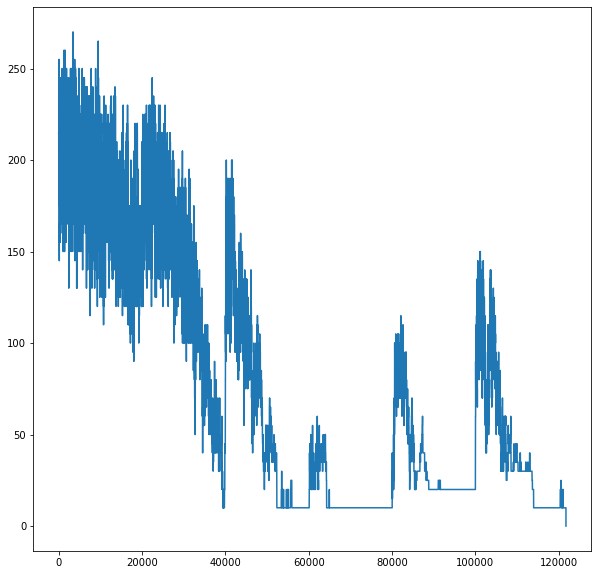

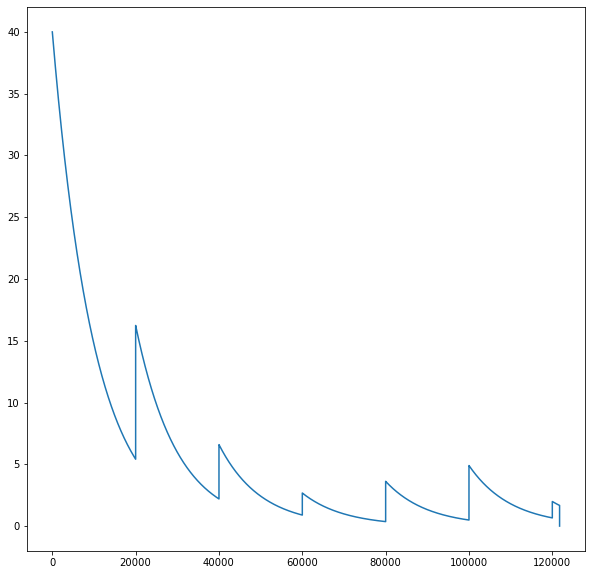

[[3 2 5 8 6 7 1 9 4]
 [6 8 1 4 9 5 3 2 7]
 [7 9 4 3 2 1 5 6 8]
 [5 3 9 6 1 4 8 7 2]
 [2 6 8 7 3 9 4 5 1]
 [4 1 7 5 8 2 6 3 9]
 [1 5 3 9 7 8 2 4 6]
 [9 4 2 1 5 6 7 8 3]
 [8 7 6 2 4 3 9 1 5]]
Znaleziono prawidłowe rozwiązanie w 121744 iteracjach

****************

[[0 0 0 0 5 4 3 0 6]
 [0 0 0 0 0 3 2 7 0]
 [0 0 0 7 2 0 0 0 1]
 [9 0 0 0 7 0 0 5 3]
 [0 0 0 0 0 0 0 0 0]
 [8 2 0 0 1 0 0 0 9]
 [3 0 0 0 6 1 0 0 0]
 [0 4 6 9 0 0 0 0 0]
 [7 0 1 5 4 0 0 0 0]]


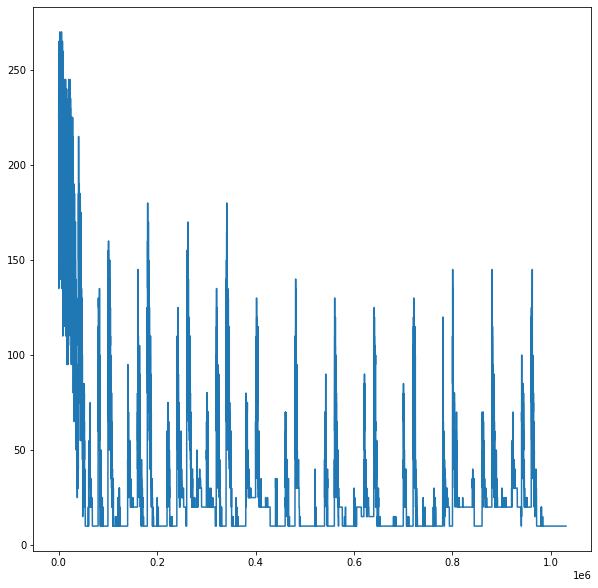

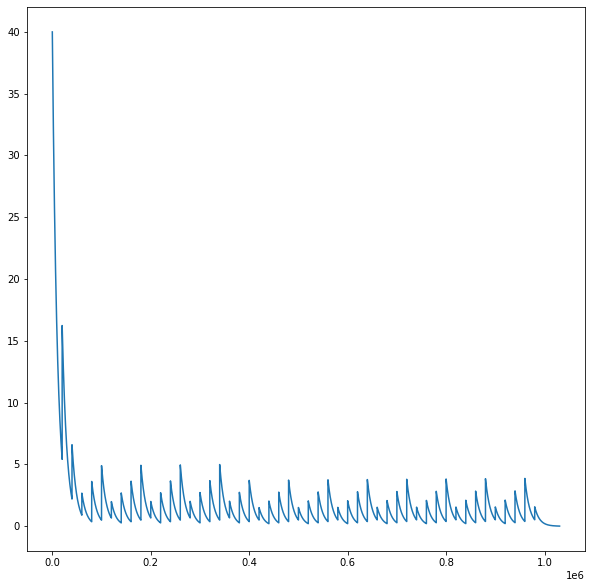

[[1 7 2 9 5 4 3 8 6]
 [6 5 9 1 8 3 2 7 4]
 [4 3 8 7 2 6 5 9 1]
 [9 6 4 8 7 2 1 5 3]
 [5 1 7 6 3 9 4 2 8]
 [8 2 3 4 1 5 7 6 9]
 [3 8 5 2 6 1 9 4 7]
 [2 4 6 9 3 7 8 1 5]
 [7 9 1 5 4 8 6 3 2]]
Nie rozwiązano, liczba pól błędnych 10

****************

[[0 0 0 4 0 0 7 0 2]
 [0 6 4 0 0 0 0 5 0]
 [1 0 0 0 0 7 0 0 9]
 [2 1 0 0 0 8 0 0 3]
 [0 0 0 0 5 0 0 0 0]
 [8 0 0 1 0 0 0 7 5]
 [9 0 0 7 0 0 0 0 8]
 [0 8 0 0 0 0 9 2 0]
 [5 0 7 0 0 2 0 0 0]]


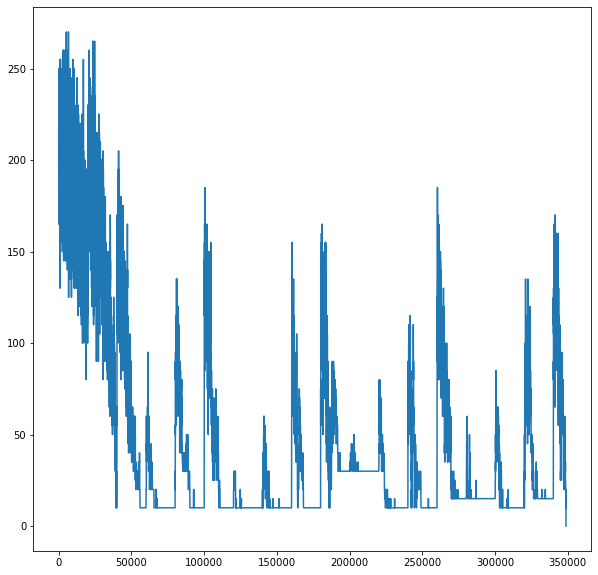

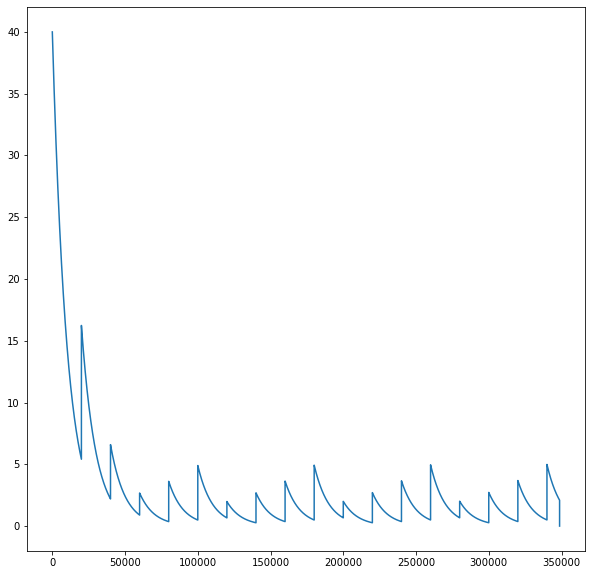

[[3 5 9 4 8 1 7 6 2]
 [7 6 4 9 2 3 8 5 1]
 [1 2 8 5 6 7 3 4 9]
 [2 1 5 6 7 8 4 9 3]
 [4 7 3 2 5 9 1 8 6]
 [8 9 6 1 3 4 2 7 5]
 [9 4 2 7 1 6 5 3 8]
 [6 8 1 3 4 5 9 2 7]
 [5 3 7 8 9 2 6 1 4]]
Znaleziono prawidłowe rozwiązanie w 348684 iteracjach

****************

[[0 0 1 3 0 0 7 0 2]
 [0 0 6 2 0 0 0 1 0]
 [0 2 0 0 0 0 0 0 4]
 [2 0 0 6 0 1 3 0 9]
 [0 0 0 0 0 0 0 0 0]
 [4 0 3 8 0 9 0 0 7]
 [1 0 0 0 0 0 0 8 0]
 [0 5 0 0 0 6 4 0 0]
 [9 0 4 0 0 8 5 0 0]]


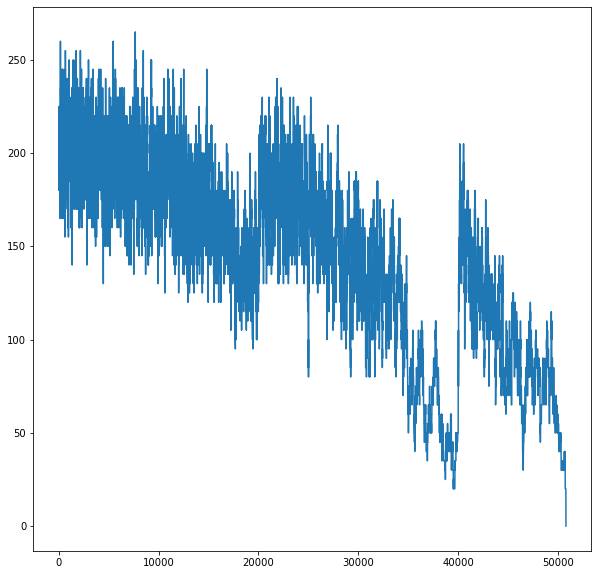

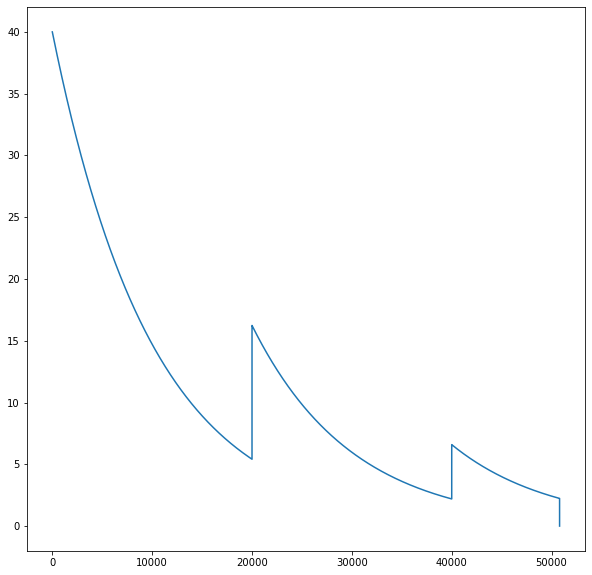

[[8 4 1 3 6 5 7 9 2]
 [7 3 6 2 9 4 8 1 5]
 [5 2 9 1 8 7 6 3 4]
 [2 8 5 6 7 1 3 4 9]
 [6 9 7 4 3 2 1 5 8]
 [4 1 3 8 5 9 2 6 7]
 [1 7 2 5 4 3 9 8 6]
 [3 5 8 9 2 6 4 7 1]
 [9 6 4 7 1 8 5 2 3]]
Znaleziono prawidłowe rozwiązanie w 50801 iteracjach

****************

[[7 9 0 0 0 0 0 0 3]
 [4 0 0 0 0 0 0 6 0]
 [8 0 1 0 0 4 0 0 2]
 [0 0 5 0 0 0 0 0 0]
 [3 0 0 1 0 0 0 0 0]
 [0 4 0 0 0 6 2 0 9]
 [2 0 0 0 3 0 5 0 6]
 [0 3 0 6 0 5 4 2 1]
 [0 0 0 0 0 0 3 0 0]]


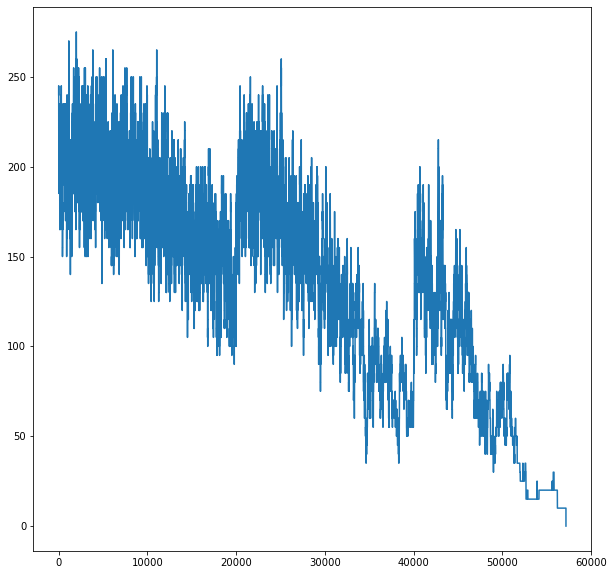

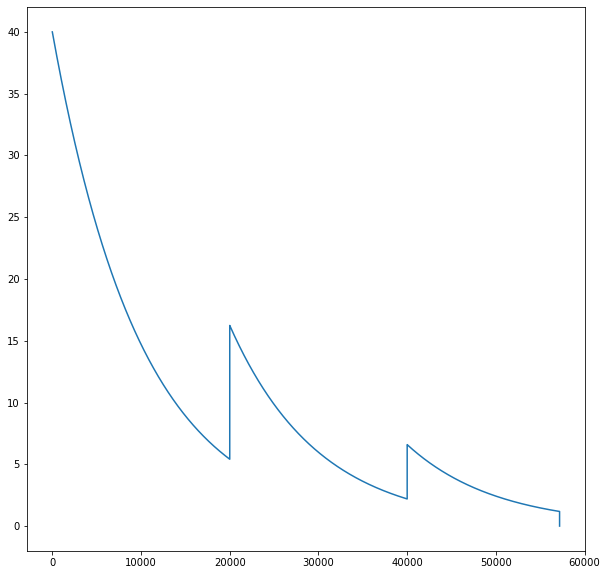

[[7 9 2 5 6 8 1 4 3]
 [4 5 3 2 1 9 8 6 7]
 [8 6 1 3 7 4 9 5 2]
 [6 2 5 8 9 3 7 1 4]
 [3 7 9 1 4 2 6 8 5]
 [1 4 8 7 5 6 2 3 9]
 [2 8 4 9 3 1 5 7 6]
 [9 3 7 6 8 5 4 2 1]
 [5 1 6 4 2 7 3 9 8]]
Znaleziono prawidłowe rozwiązanie w 57178 iteracjach

****************

[[0 5 0 0 9 0 0 0 0]
 [0 0 4 8 0 0 0 0 9]
 [0 0 0 1 0 7 2 8 0]
 [5 6 0 0 0 0 1 3 7]
 [0 0 0 0 0 0 0 0 0]
 [1 7 3 0 0 0 0 4 2]
 [0 2 1 5 0 8 0 0 0]
 [6 0 0 0 0 3 8 0 0]
 [0 0 0 0 1 0 0 6 0]]


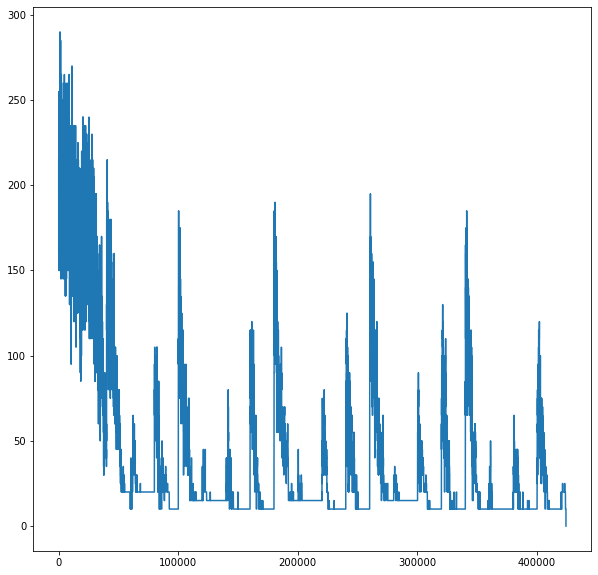

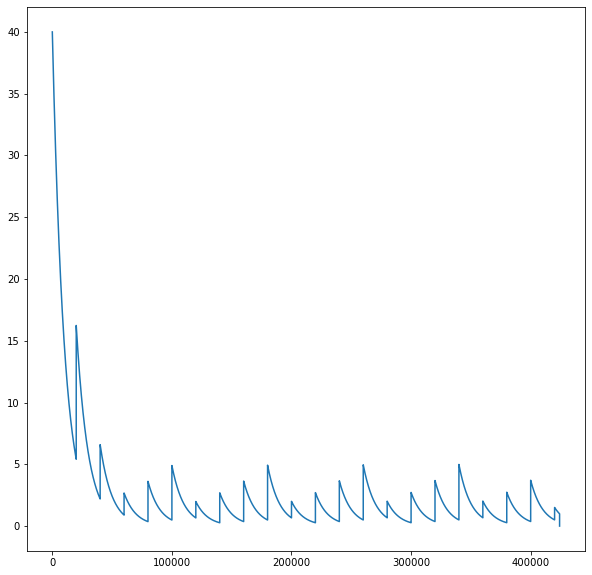

[[8 5 7 3 9 2 4 1 6]
 [2 1 4 8 5 6 3 7 9]
 [9 3 6 1 4 7 2 8 5]
 [5 6 8 4 2 9 1 3 7]
 [4 9 2 7 3 1 6 5 8]
 [1 7 3 6 8 5 9 4 2]
 [3 2 1 5 6 8 7 9 4]
 [6 4 5 9 7 3 8 2 1]
 [7 8 9 2 1 4 5 6 3]]
Znaleziono prawidłowe rozwiązanie w 424176 iteracjach

****************

[[7 9 0 0 0 0 0 0 3]
 [0 0 0 0 0 0 0 6 0]
 [8 0 1 0 0 4 0 0 2]
 [0 0 5 0 0 0 0 0 0]
 [3 0 0 1 0 0 0 0 0]
 [0 4 0 0 0 6 2 0 9]
 [2 0 0 0 3 0 0 0 6]
 [0 3 0 6 0 5 4 2 1]
 [0 0 0 0 0 0 0 0 0]]


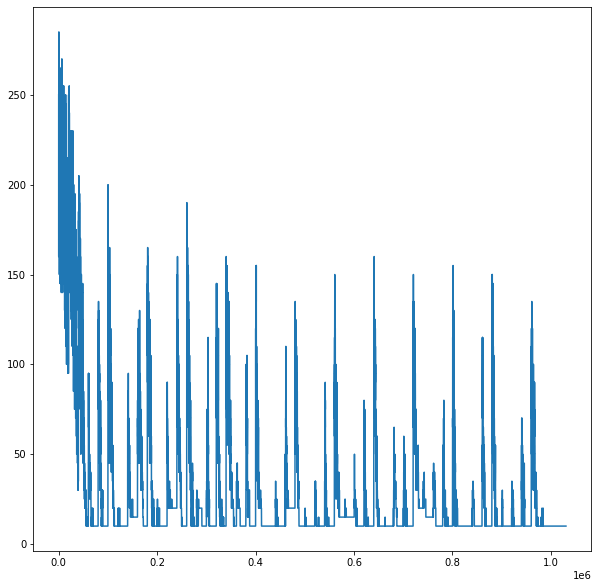

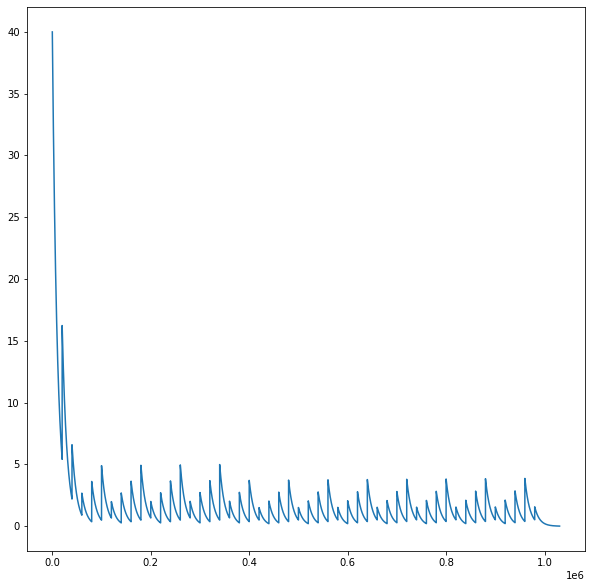

[[7 9 6 8 2 1 5 4 3]
 [4 2 3 9 5 7 1 6 8]
 [8 5 1 3 6 4 9 7 2]
 [9 7 5 2 8 3 6 1 4]
 [3 6 2 1 4 9 8 5 7]
 [1 4 8 5 7 6 2 3 9]
 [2 1 9 4 3 8 7 8 6]
 [5 3 7 6 9 5 4 2 1]
 [6 8 4 7 1 2 3 9 5]]
Nie rozwiązano, liczba pól błędnych 10

****************

[[9 0 3 0 0 0 0 2 4]
 [0 0 7 0 9 4 0 0 0]
 [0 0 1 0 0 6 0 3 0]
 [0 6 4 0 0 8 0 0 0]
 [0 0 0 0 0 0 0 4 0]
 [0 0 0 9 0 0 0 5 0]
 [0 0 0 0 0 3 7 0 0]
 [5 0 0 0 0 0 1 0 0]
 [0 8 0 0 6 0 0 0 0]]


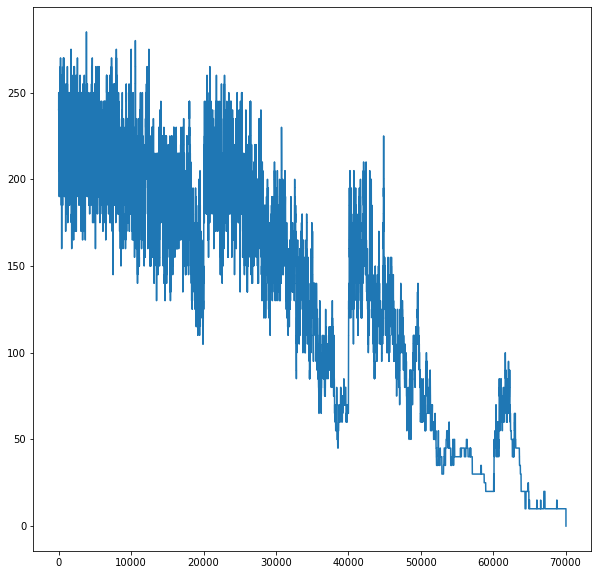

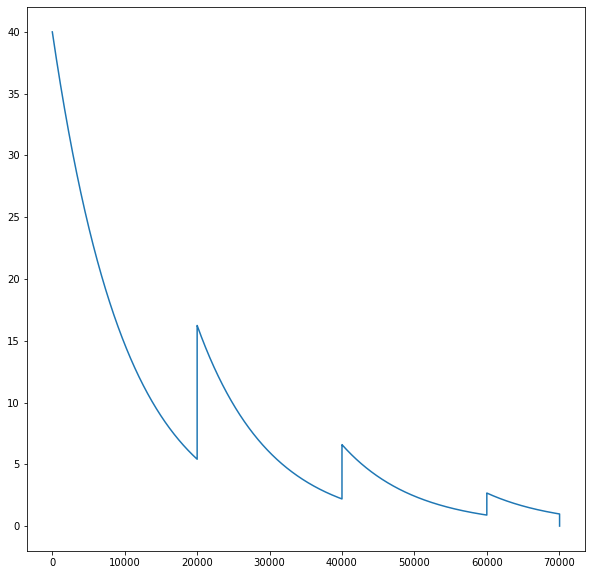

[[9 5 3 7 8 1 6 2 4]
 [6 2 7 3 9 4 5 1 8]
 [8 4 1 2 5 6 9 3 7]
 [3 6 4 5 1 8 2 7 9]
 [2 9 5 6 3 7 8 4 1]
 [1 7 8 9 4 2 3 5 6]
 [4 1 9 8 2 3 7 6 5]
 [5 3 6 4 7 9 1 8 2]
 [7 8 2 1 6 5 4 9 3]]
Znaleziono prawidłowe rozwiązanie w 70047 iteracjach

****************

[[1 0 5 0 0 0 3 7 0]
 [0 0 0 0 0 0 2 0 0]
 [0 9 7 3 0 0 0 1 0]
 [0 0 0 0 5 3 1 0 2]
 [3 0 0 8 0 1 0 0 4]
 [2 0 1 4 7 0 0 0 0]
 [0 7 0 0 0 8 6 4 0]
 [0 0 8 0 0 0 0 0 0]
 [0 1 2 0 0 0 8 0 7]]


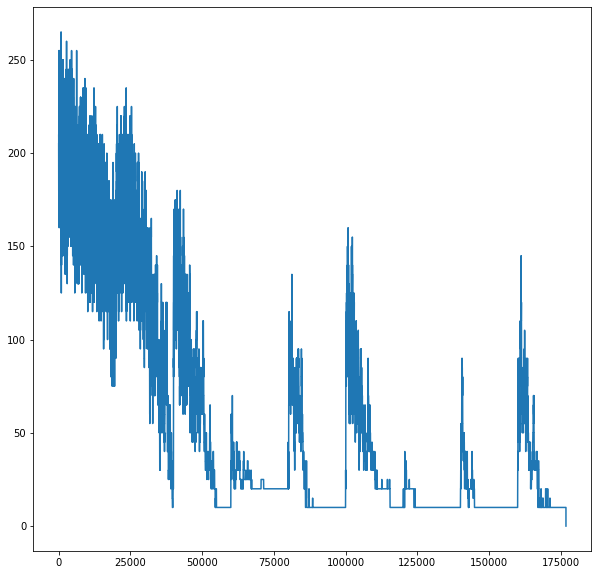

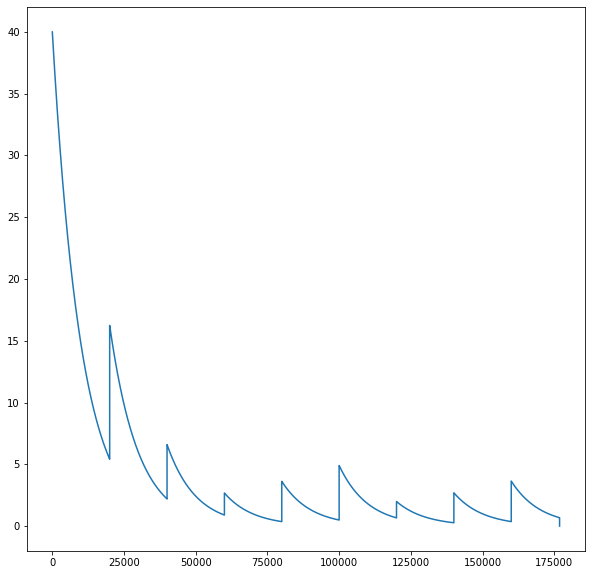

[[1 2 5 6 4 9 3 7 8]
 [8 3 4 7 1 5 2 9 6]
 [6 9 7 3 8 2 4 1 5]
 [7 4 6 9 5 3 1 8 2]
 [3 5 9 8 2 1 7 6 4]
 [2 8 1 4 7 6 9 5 3]
 [5 7 3 2 9 8 6 4 1]
 [4 6 8 1 3 7 5 2 9]
 [9 1 2 5 6 4 8 3 7]]
Znaleziono prawidłowe rozwiązanie w 176854 iteracjach

****************

[[0 0 1 7 2 5 0 0 0]
 [0 8 0 0 1 0 0 0 0]
 [2 5 0 0 0 0 1 3 0]
 [0 7 0 0 0 0 5 0 0]
 [0 0 0 1 0 6 0 0 0]
 [0 0 9 0 0 0 0 8 0]
 [0 4 5 0 0 0 0 2 9]
 [0 0 0 0 9 0 0 6 0]
 [0 0 0 6 4 8 3 0 0]]


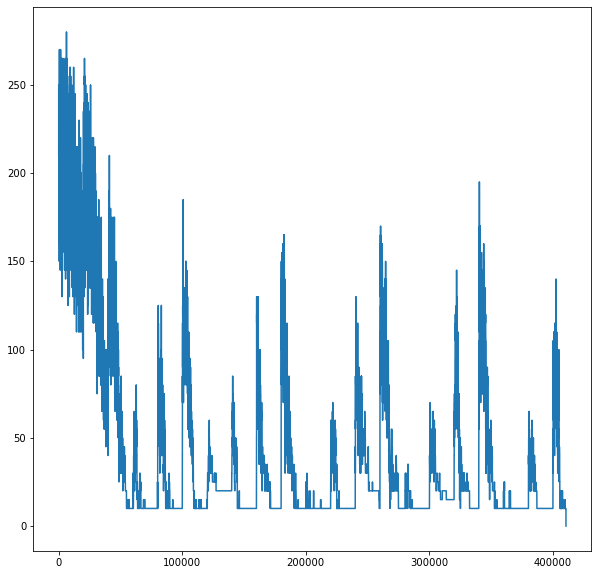

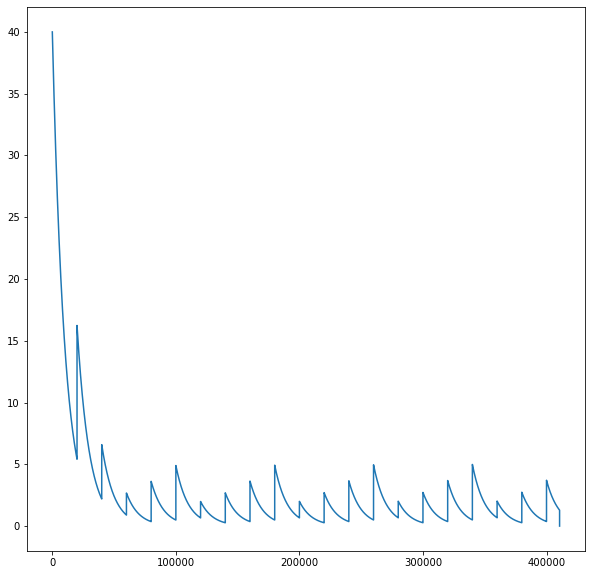

[[3 6 1 7 2 5 9 4 8]
 [9 8 7 4 1 3 2 5 6]
 [2 5 4 8 6 9 1 3 7]
 [8 7 6 9 3 4 5 1 2]
 [5 2 3 1 8 6 7 9 4]
 [4 1 9 2 5 7 6 8 3]
 [6 4 5 3 7 1 8 2 9]
 [7 3 8 5 9 2 4 6 1]
 [1 9 2 6 4 8 3 7 5]]
Znaleziono prawidłowe rozwiązanie w 410583 iteracjach

****************

[[7 0 3 1 0 8 4 5 9]
 [9 0 0 0 6 0 8 0 0]
 [0 0 0 0 0 0 0 0 0]
 [0 1 0 2 9 0 3 6 7]
 [0 7 5 0 0 3 0 0 8]
 [0 0 0 7 0 1 0 0 0]
 [0 0 2 0 7 0 0 1 5]
 [0 8 6 3 5 0 0 2 0]
 [0 0 0 0 1 0 0 0 0]]


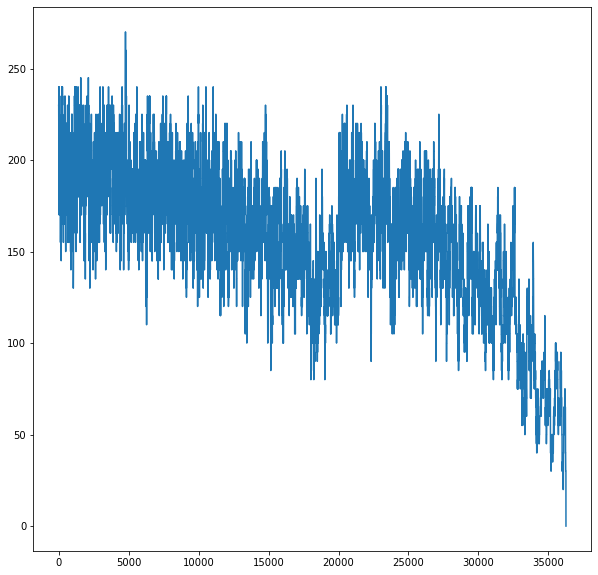

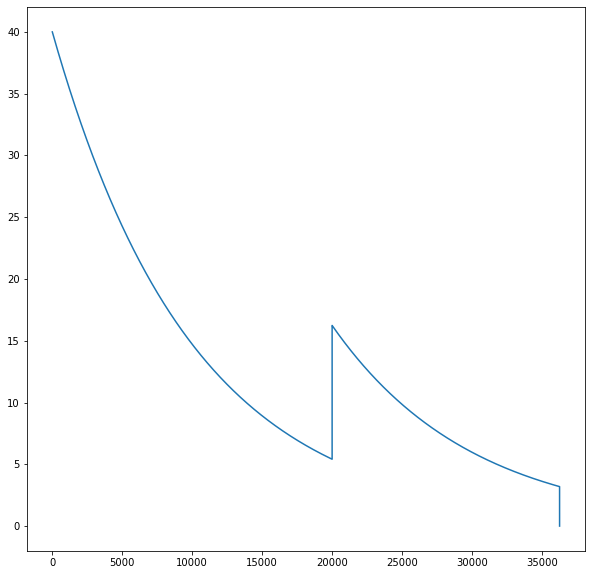

[[7 6 3 1 2 8 4 5 9]
 [9 2 4 5 6 7 8 3 1]
 [8 5 1 9 3 4 2 7 6]
 [4 1 8 2 9 5 3 6 7]
 [2 7 5 6 4 3 1 9 8]
 [6 3 9 7 8 1 5 4 2]
 [3 4 2 8 7 6 9 1 5]
 [1 8 6 3 5 9 7 2 4]
 [5 9 7 4 1 2 6 8 3]]
Znaleziono prawidłowe rozwiązanie w 36257 iteracjach

****************

[[0 0 0 0 6 0 0 0 5]
 [6 2 4 0 0 0 0 1 0]
 [0 0 1 0 0 0 3 0 0]
 [0 0 8 0 0 4 0 3 7]
 [0 0 9 1 0 0 5 0 0]
 [0 0 7 5 0 0 0 9 0]
 [0 8 2 4 7 0 0 0 0]
 [0 9 0 3 1 0 0 0 0]
 [0 0 0 0 2 9 0 5 3]]


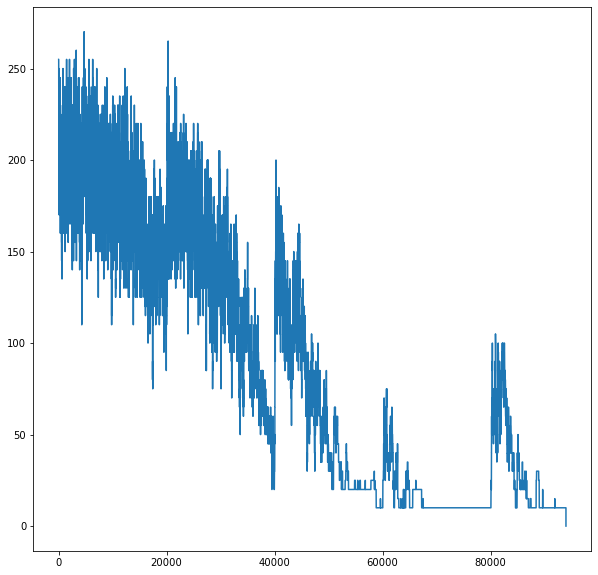

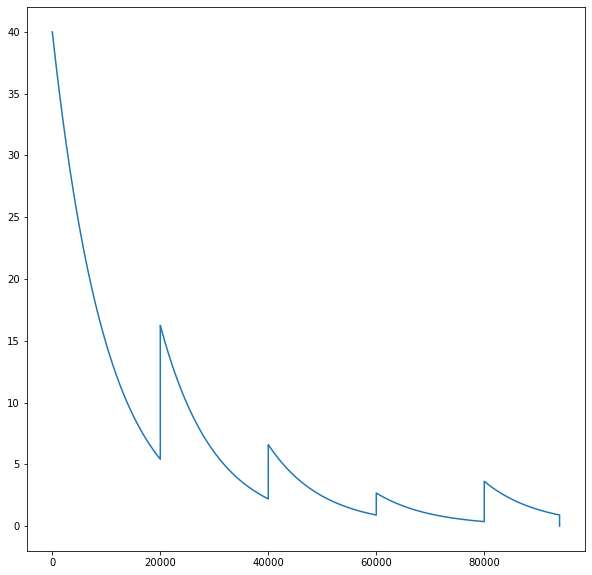

[[8 7 3 9 6 1 4 2 5]
 [6 2 4 7 5 3 9 1 8]
 [9 5 1 2 4 8 3 7 6]
 [5 1 8 6 9 4 2 3 7]
 [2 6 9 1 3 7 5 8 4]
 [4 3 7 5 8 2 6 9 1]
 [3 8 2 4 7 5 1 6 9]
 [7 9 5 3 1 6 8 4 2]
 [1 4 6 8 2 9 7 5 3]]
Znaleziono prawidłowe rozwiązanie w 93947 iteracjach

****************

[[8 0 2 0 5 0 7 0 1]
 [0 0 7 0 8 2 4 6 0]
 [0 1 0 9 0 0 0 0 0]
 [6 0 0 0 0 1 8 3 2]
 [5 0 0 0 0 0 0 0 9]
 [1 8 4 3 0 0 0 0 6]
 [0 0 0 0 0 4 0 2 0]
 [0 9 5 6 1 0 3 0 0]
 [3 0 8 0 9 0 6 0 7]]


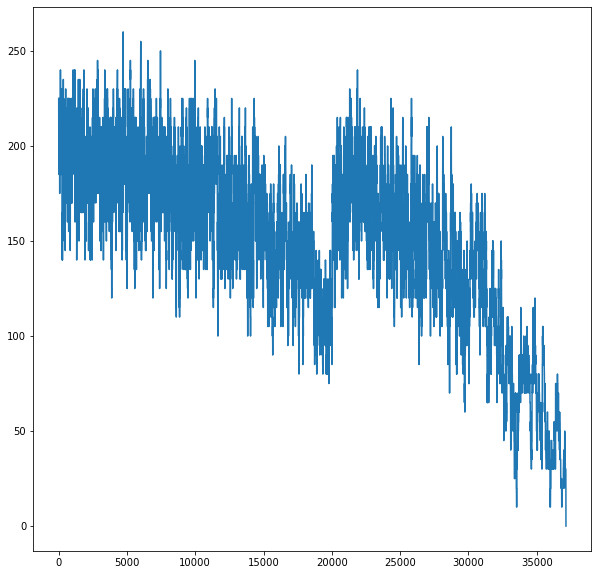

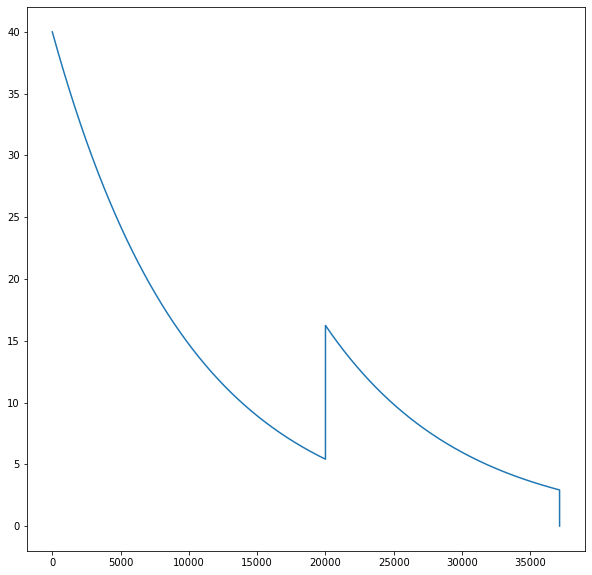

[[8 3 2 4 5 6 7 9 1]
 [9 5 7 1 8 2 4 6 3]
 [4 1 6 9 7 3 2 5 8]
 [6 7 9 5 4 1 8 3 2]
 [5 2 3 7 6 8 1 4 9]
 [1 8 4 3 2 9 5 7 6]
 [7 6 1 8 3 4 9 2 5]
 [2 9 5 6 1 7 3 8 4]
 [3 4 8 2 9 5 6 1 7]]
Znaleziono prawidłowe rozwiązanie w 37140 iteracjach

****************

[[1 0 0 8 4 3 0 0 0]
 [0 0 8 0 2 7 0 3 1]
 [6 0 0 0 0 0 0 0 0]
 [0 0 4 3 0 0 1 0 0]
 [5 3 7 9 0 0 0 8 0]
 [0 1 0 0 0 4 3 0 5]
 [4 9 0 0 3 0 0 7 0]
 [3 0 0 1 0 0 0 0 0]
 [0 0 0 4 0 5 0 1 0]]


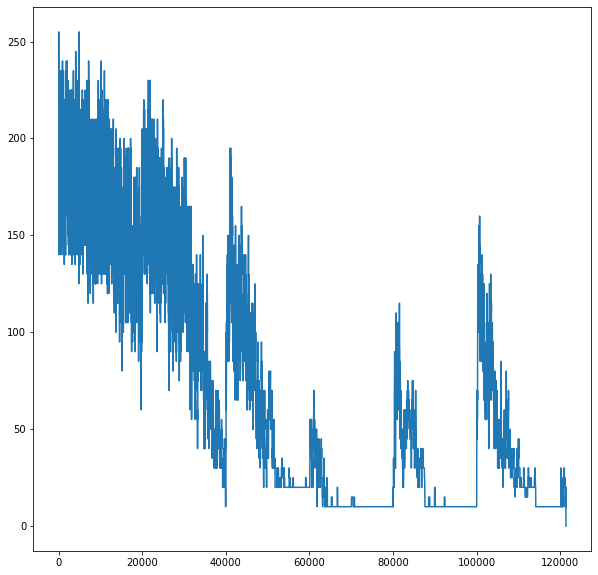

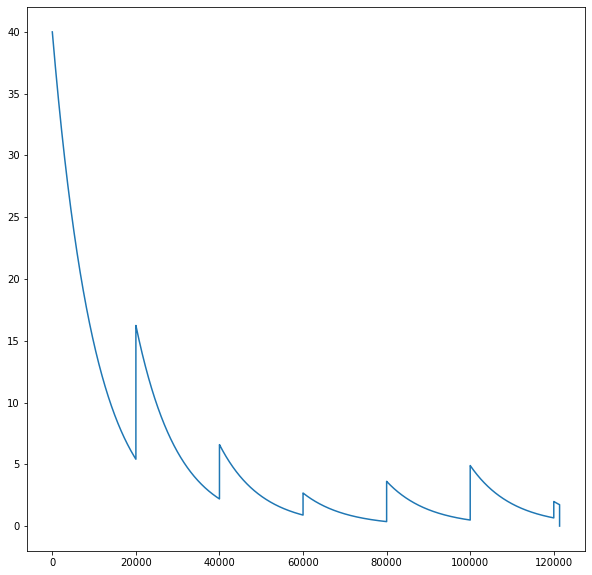

[[1 7 2 8 4 3 6 5 9]
 [9 5 8 6 2 7 4 3 1]
 [6 4 3 5 1 9 7 2 8]
 [8 6 4 3 5 2 1 9 7]
 [5 3 7 9 6 1 2 8 4]
 [2 1 9 7 8 4 3 6 5]
 [4 9 1 2 3 8 5 7 6]
 [3 8 5 1 7 6 9 4 2]
 [7 2 6 4 9 5 8 1 3]]
Znaleziono prawidłowe rozwiązanie w 121387 iteracjach

****************

[[2 0 6 0 0 0 0 4 9]
 [0 3 7 0 0 9 0 0 0]
 [1 0 0 7 0 0 0 0 6]
 [0 0 0 5 8 0 9 0 0]
 [7 0 5 0 0 0 8 0 4]
 [0 0 9 0 6 2 0 0 0]
 [9 0 0 0 0 4 0 0 1]
 [0 0 0 3 0 0 4 9 0]
 [4 1 0 0 0 0 2 0 8]]


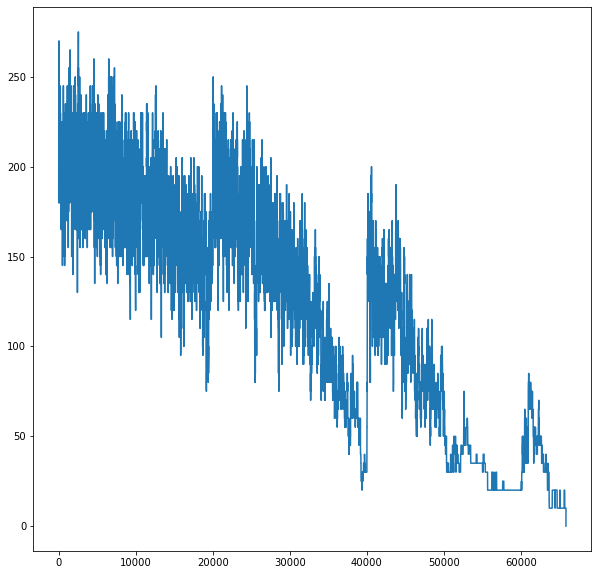

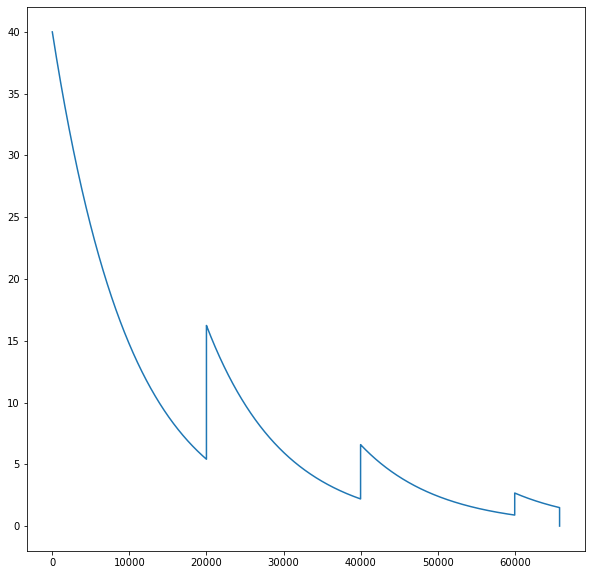

[[2 5 6 8 3 1 7 4 9]
 [8 3 7 6 4 9 5 1 2]
 [1 9 4 7 2 5 3 8 6]
 [6 4 1 5 8 7 9 2 3]
 [7 2 5 1 9 3 8 6 4]
 [3 8 9 4 6 2 1 7 5]
 [9 7 8 2 5 4 6 3 1]
 [5 6 2 3 1 8 4 9 7]
 [4 1 3 9 7 6 2 5 8]]
Znaleziono prawidłowe rozwiązanie w 65822 iteracjach

****************

[[0 0 0 7 0 0 8 0 0]
 [0 0 6 0 0 0 0 3 1]
 [0 4 0 0 0 2 0 0 0]
 [0 2 4 0 7 0 0 0 0]
 [0 1 0 0 3 0 0 8 0]
 [0 0 0 0 6 0 2 9 0]
 [0 0 0 8 0 0 0 7 0]
 [8 6 0 0 0 0 5 0 0]
 [0 0 2 0 0 6 0 0 0]]


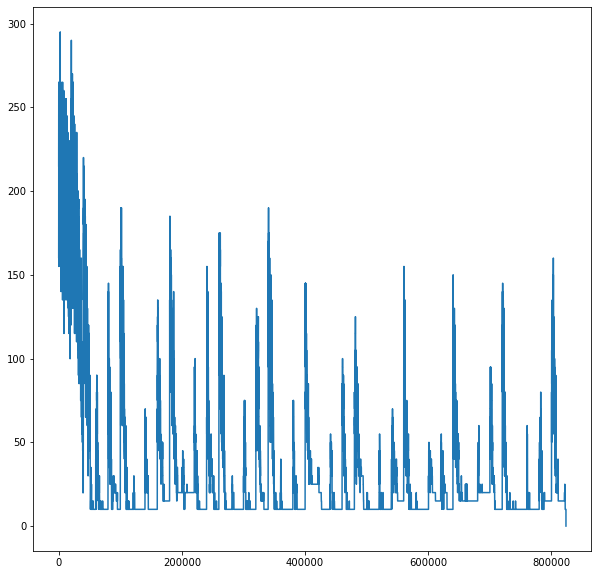

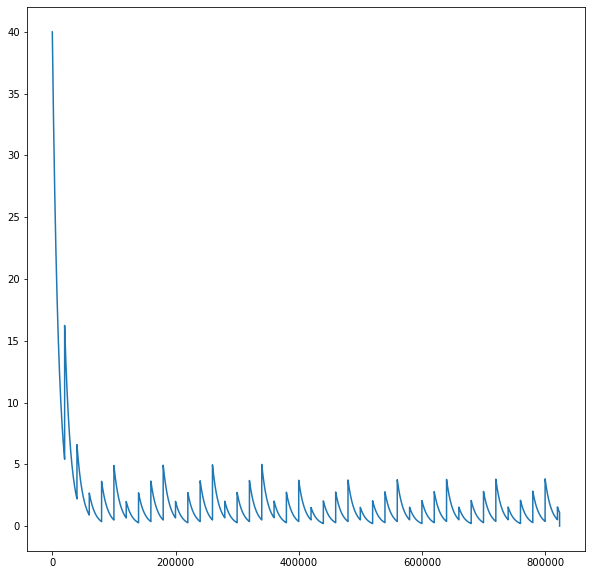

[[1 5 9 7 4 3 8 6 2]
 [2 7 6 5 8 9 4 3 1]
 [3 4 8 6 1 2 7 5 9]
 [6 2 4 9 7 8 3 1 5]
 [9 1 7 2 3 5 6 8 4]
 [5 8 3 1 6 4 2 9 7]
 [4 3 5 8 2 1 9 7 6]
 [8 6 1 4 9 7 5 2 3]
 [7 9 2 3 5 6 1 4 8]]
Znaleziono prawidłowe rozwiązanie w 823498 iteracjach

****************

[[3 0 2 0 6 5 0 4 7]
 [0 5 0 0 3 4 1 8 2]
 [0 9 0 1 7 0 0 6 0]
 [2 0 6 0 9 0 3 0 8]
 [1 0 0 0 0 0 2 7 0]
 [0 8 9 5 0 3 4 0 0]
 [4 7 0 3 0 0 0 0 5]
 [0 0 0 6 4 8 0 9 1]
 [0 0 0 2 0 0 0 0 0]]


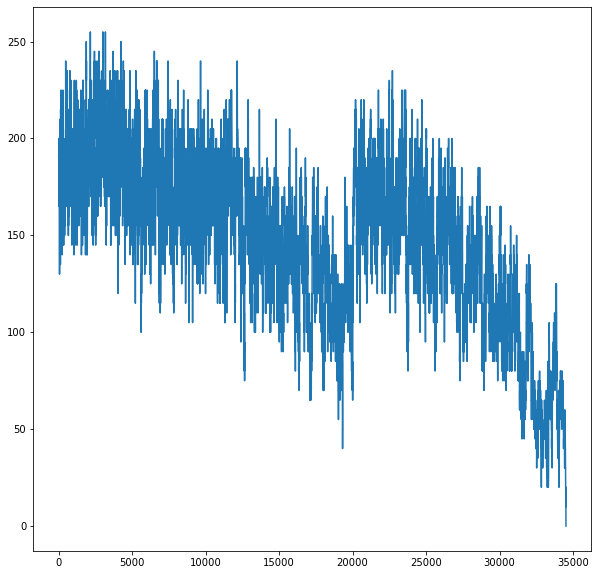

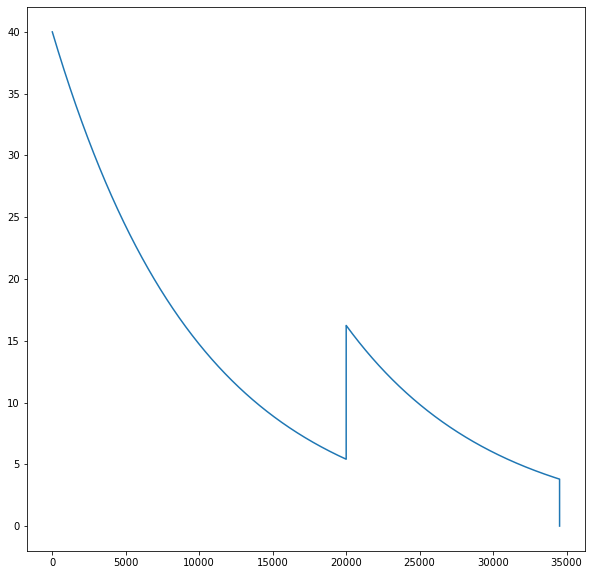

[[3 1 2 8 6 5 9 4 7]
 [6 5 7 9 3 4 1 8 2]
 [8 9 4 1 7 2 5 6 3]
 [2 4 6 7 9 1 3 5 8]
 [1 3 5 4 8 6 2 7 9]
 [7 8 9 5 2 3 4 1 6]
 [4 7 8 3 1 9 6 2 5]
 [5 2 3 6 4 8 7 9 1]
 [9 6 1 2 5 7 8 3 4]]
Znaleziono prawidłowe rozwiązanie w 34522 iteracjach

****************

[[0 0 0 0 0 0 0 0 0]
 [1 0 0 0 4 0 0 7 0]
 [7 0 0 5 0 0 0 2 0]
 [0 1 7 6 0 0 5 0 0]
 [0 6 0 0 0 0 3 0 0]
 [0 0 0 8 0 2 6 0 0]
 [0 0 0 9 0 0 0 4 5]
 [0 0 9 2 0 8 0 0 0]
 [0 0 8 0 3 0 0 0 0]]


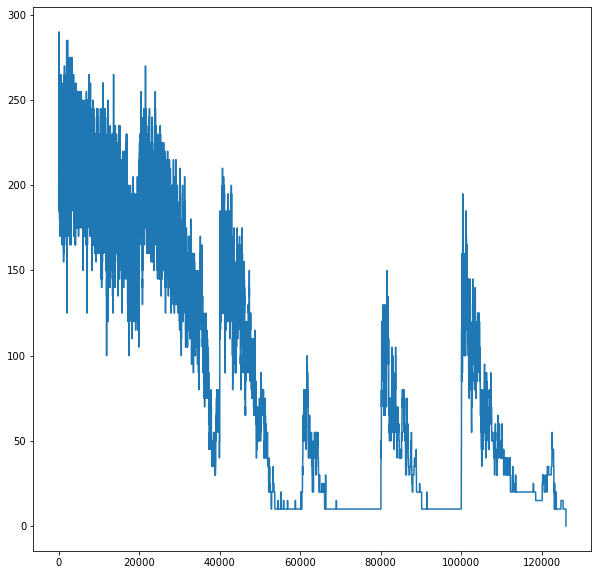

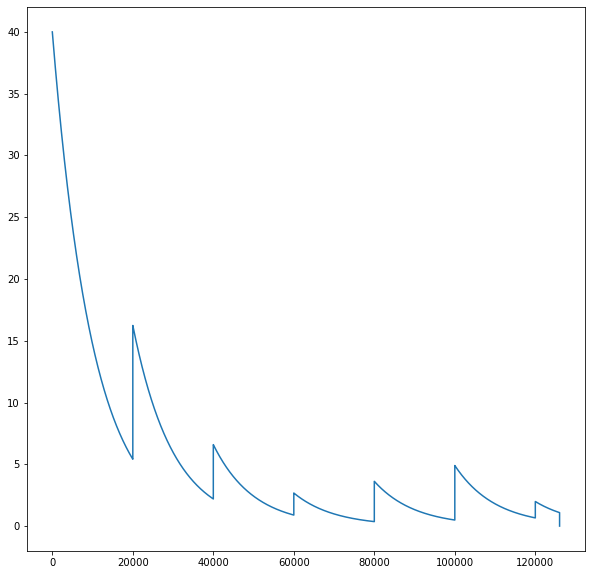

[[3 8 4 7 2 9 1 5 6]
 [1 2 5 3 4 6 9 7 8]
 [7 9 6 5 8 1 4 2 3]
 [4 1 7 6 9 3 5 8 2]
 [8 6 2 4 1 5 3 9 7]
 [9 5 3 8 7 2 6 1 4]
 [2 3 1 9 6 7 8 4 5]
 [6 4 9 2 5 8 7 3 1]
 [5 7 8 1 3 4 2 6 9]]
Znaleziono prawidłowe rozwiązanie w 126029 iteracjach

****************

[[0 0 2 0 0 0 5 0 0]
 [0 1 0 7 0 5 0 2 0]
 [4 0 0 0 9 0 0 0 7]
 [0 4 9 0 0 0 7 3 0]
 [8 0 1 0 3 0 4 0 9]
 [0 3 6 0 0 0 2 1 0]
 [2 0 0 0 8 0 0 0 4]
 [0 8 0 9 0 2 0 6 0]
 [0 0 7 0 0 0 8 0 0]]


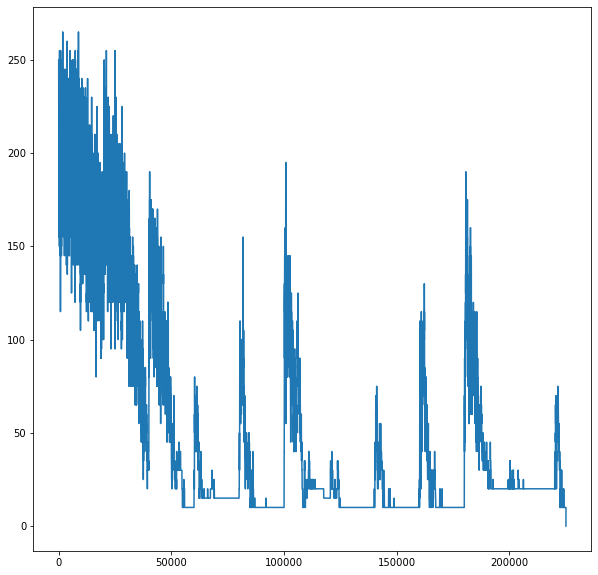

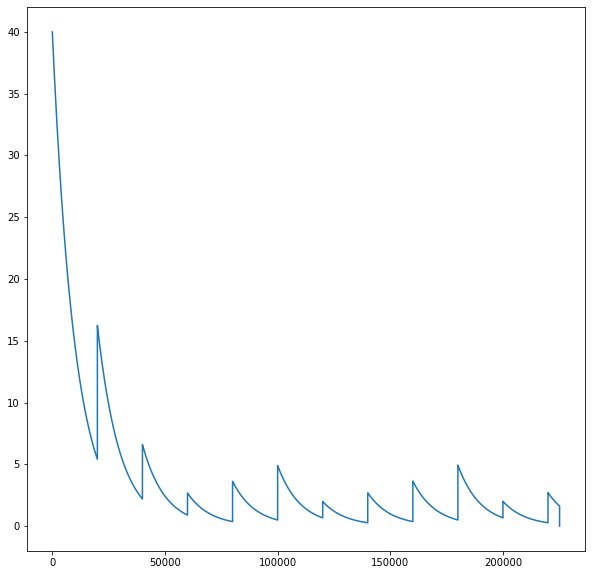

[[9 7 2 8 6 3 5 4 1]
 [6 1 8 7 4 5 9 2 3]
 [4 5 3 2 9 1 6 8 7]
 [5 4 9 1 2 8 7 3 6]
 [8 2 1 6 3 7 4 5 9]
 [7 3 6 4 5 9 2 1 8]
 [2 9 5 3 8 6 1 7 4]
 [1 8 4 9 7 2 3 6 5]
 [3 6 7 5 1 4 8 9 2]]
Znaleziono prawidłowe rozwiązanie w 225137 iteracjach

****************

[[8 0 0 2 0 0 0 4 6]
 [0 0 7 9 0 0 0 0 0]
 [1 0 0 0 0 0 5 0 0]
 [0 0 0 5 0 0 0 3 2]
 [4 0 8 0 0 0 7 0 1]
 [3 2 0 0 0 7 0 0 0]
 [0 0 6 0 0 0 0 0 9]
 [0 0 0 0 0 3 2 0 0]
 [2 8 0 0 0 6 0 0 3]]


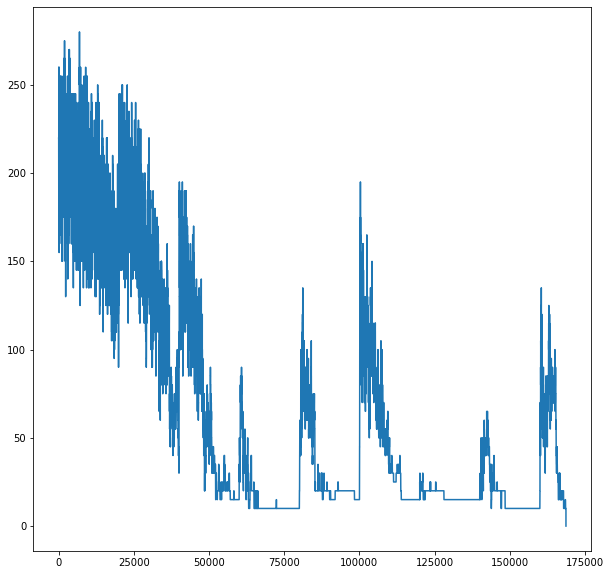

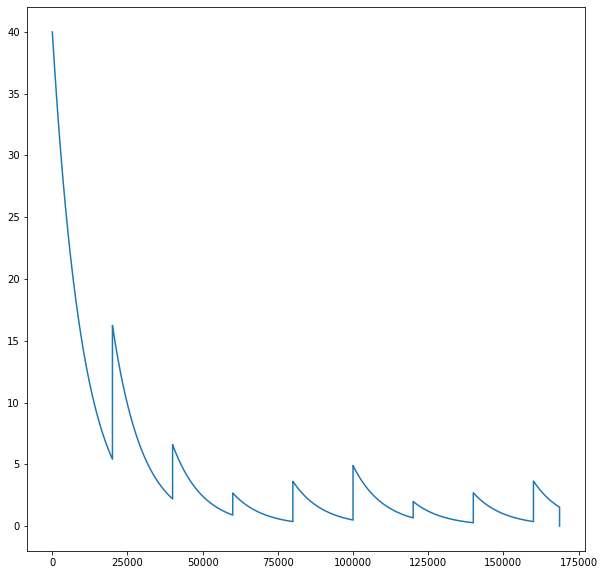

[[8 9 3 2 7 5 1 4 6]
 [6 5 7 9 4 1 3 2 8]
 [1 4 2 6 3 8 5 9 7]
 [9 7 1 5 8 4 6 3 2]
 [4 6 8 3 2 9 7 5 1]
 [3 2 5 1 6 7 9 8 4]
 [5 3 6 4 1 2 8 7 9]
 [7 1 4 8 9 3 2 6 5]
 [2 8 9 7 5 6 4 1 3]]
Znaleziono prawidłowe rozwiązanie w 168688 iteracjach

****************

[[0 0 1 7 2 5 0 0 0]
 [0 8 0 0 1 0 0 0 6]
 [2 5 0 0 0 0 1 3 0]
 [0 7 0 0 0 0 5 0 0]
 [0 0 0 1 0 6 0 0 0]
 [0 0 9 0 0 0 0 8 0]
 [0 4 5 0 0 0 0 2 9]
 [7 0 0 0 9 0 0 6 0]
 [0 0 0 6 4 8 3 0 0]]


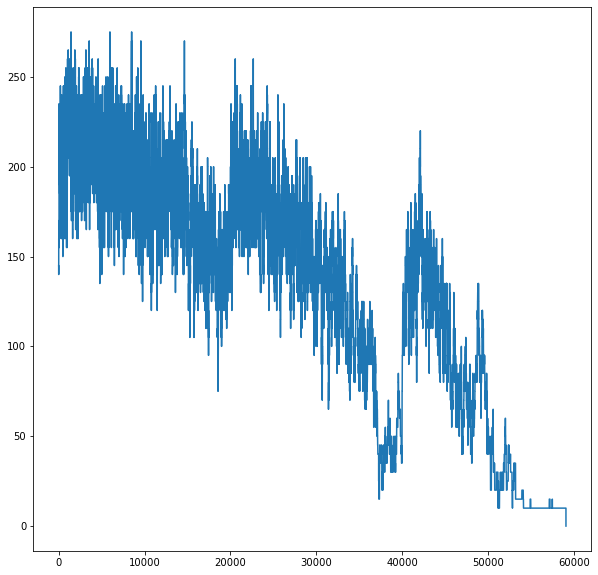

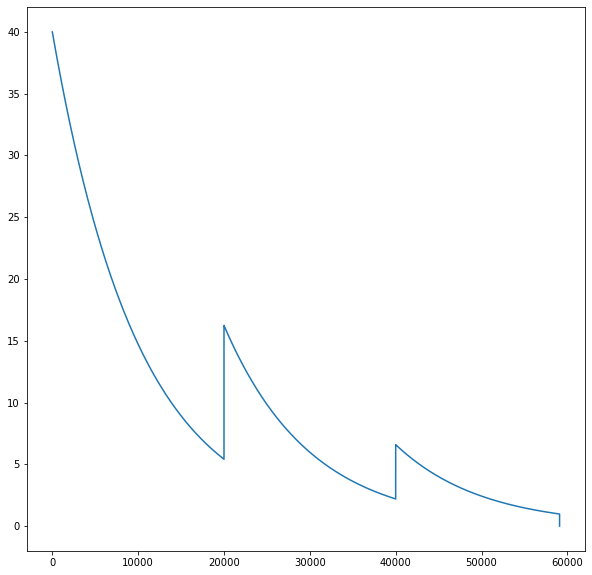

[[3 6 1 7 2 5 9 4 8]
 [9 8 7 4 1 3 2 5 6]
 [2 5 4 8 6 9 1 3 7]
 [8 7 6 9 3 4 5 1 2]
 [5 2 3 1 8 6 7 9 4]
 [4 1 9 2 5 7 6 8 3]
 [6 4 5 3 7 1 8 2 9]
 [7 3 8 5 9 2 4 6 1]
 [1 9 2 6 4 8 3 7 5]]
Znaleziono prawidłowe rozwiązanie w 59092 iteracjach

****************

[[0 0 0 0 0 3 0 1 7]
 [0 1 5 0 0 9 0 0 8]
 [0 6 0 0 0 0 0 0 0]
 [1 0 0 0 0 7 0 0 0]
 [0 0 9 0 0 0 2 0 0]
 [0 0 0 5 0 0 0 0 4]
 [0 0 0 0 0 0 0 2 0]
 [5 0 0 6 0 0 3 4 0]
 [3 4 0 2 0 0 0 0 0]]


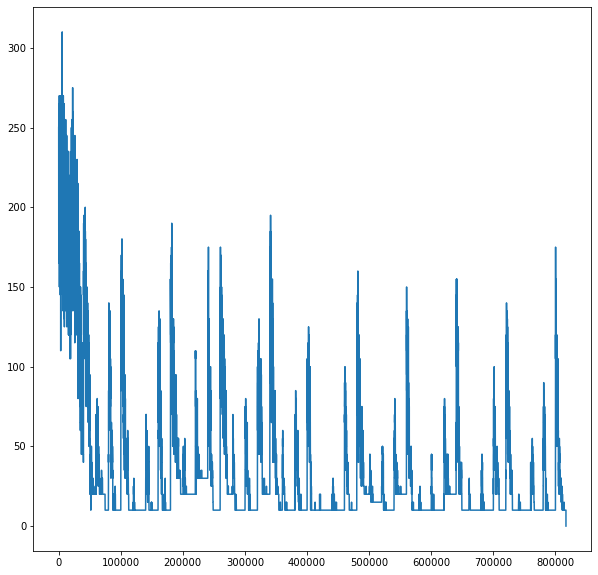

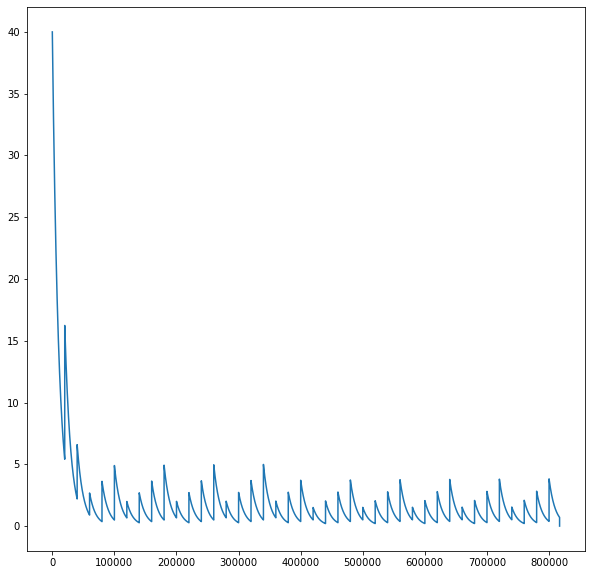

[[2 9 4 8 6 3 5 1 7]
 [7 1 5 4 2 9 6 3 8]
 [8 6 3 7 5 1 4 9 2]
 [1 5 2 9 4 7 8 6 3]
 [4 7 9 3 8 6 2 5 1]
 [6 3 8 5 1 2 9 7 4]
 [9 8 6 1 3 4 7 2 5]
 [5 2 1 6 7 8 3 4 9]
 [3 4 7 2 9 5 1 8 6]]
Znaleziono prawidłowe rozwiązanie w 816954 iteracjach

****************

Prawidłowo rozwiązano 106 sudoku, co stanowi 93.80530973451327 procent wszystkich.


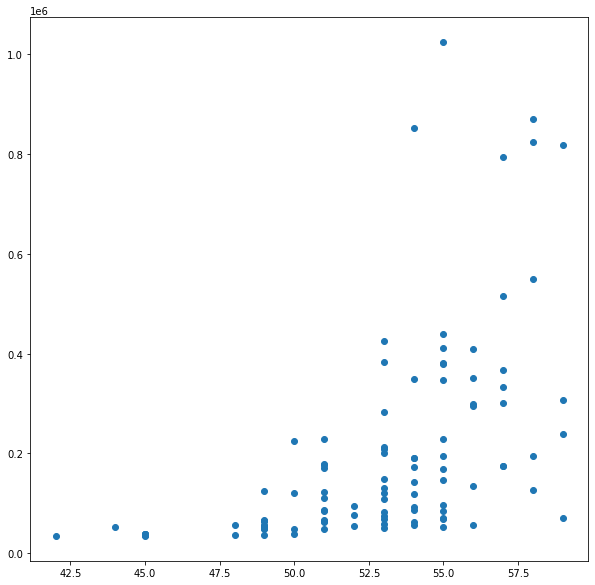

In [80]:
sudokus = read_sudoku()
bad_sudoku = []

good = 0
bad = 0
X = []
Y = []
for sud, fill, bef in sudokus:
    t = np.sum (bef == 0)
    s = Sudoku (sud, fill, temperature = 40, stop = 0.01)
    print (bef)
    res, en, ite = s.anneal ()
    print (res)
    if en == 0:
        X.append(t)
        Y.append(ite)
        print ("Znaleziono prawidłowe rozwiązanie w", ite, "iteracjach")
        good += 1
    else:
        bad_sudoku.append((res, fill, bef))
        print ("Nie rozwiązano, liczba pól błędnych", en)
        bad += 1
    print ()
    print ("****************")
    print ()
        
print ("Prawidłowo rozwiązano", good, "sudoku, co stanowi", 100*good/(good+bad), "procent wszystkich.")

plt.figure (1, figsize = (10, 10))
plt.scatter (X, Y)
plt.show ()

Na ostatnim wykresie możemy zauważyć zależność, że im wiecej pól do uzupełnienia tym więcej iteracji potrzebuje algorytm do znalezienia prawidłowego rozwiązania. Jednakże ta zależność ma swoje mankamenty. Istnieją takie plansze, które pomimo dużej liczby pól do uzupełnienia rozwiązują się w małej liczbie iteracji. Udaje się rozwiązać ok. 93% sudoku. Liczba rozwiązanych sudoku wzrasta wraz z zwiększaniem liczby iteracji, a tak naprawdę zwiększeniem liczby cykli. Możemy to dobrze zaobserwowoać na wykresach funkcji energii, gdzie widoczne są cykle. Gdy nie uda się znaleźć prawidłowego rozwiąznia możemy ponownie zastosować algorytm wyżarzania w poszukiwaniu rozwiązania. Jednakże w swoim rozwiązaniu przyjąłem, aby nie przekraczać bardzo miliona iteracji. Źle rozwiązane sudoku zapamiętuje w tablicy `bad_sudoku` i próbuje je rozwiązać ponownie wywołując algorytm wyżarzania poniżej. Ważnym aspektem jest fakt zapamiętania rezultatu wyżarzania powyżej przez co na początku startuje z w miarę rozsądnym przyporządkowaniem liczb. Podczas ponownego wyszukiwania rozwiązania udaje się rozwiązać kolejne 3 plansze. Pozostałe plansze próbuję jeszcze raz zgodnie z powiedzeniem: "Do trzech razy sztuka".

[[0 0 0 0 0 0 0 8 0]
 [8 0 0 7 0 1 0 4 0]
 [0 4 0 0 2 0 0 3 0]
 [3 7 4 0 0 0 9 0 0]
 [0 0 0 0 3 0 0 0 0]
 [0 0 5 0 0 0 3 2 1]
 [0 1 0 0 6 0 0 5 0]
 [0 5 0 8 0 2 0 0 6]
 [0 8 0 0 0 0 0 0 0]]


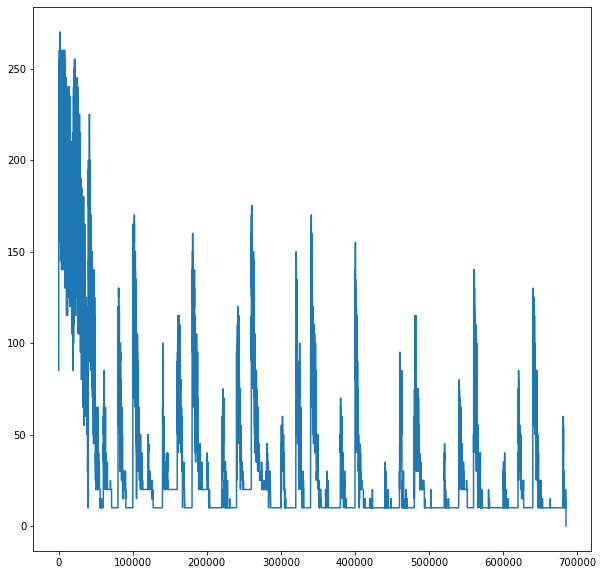

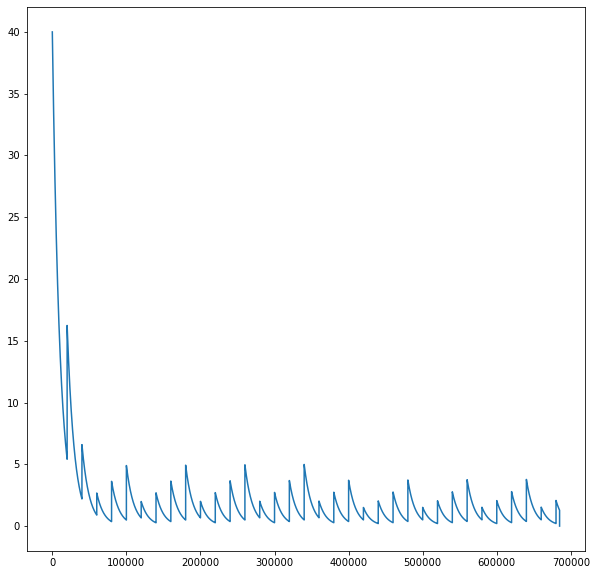

[[7 6 1 5 4 3 2 8 9]
 [8 3 2 7 9 1 6 4 5]
 [5 4 9 6 2 8 1 3 7]
 [3 7 4 2 1 5 9 6 8]
 [1 2 8 9 3 6 5 7 4]
 [6 9 5 4 8 7 3 2 1]
 [4 1 7 3 6 9 8 5 2]
 [9 5 3 8 7 2 4 1 6]
 [2 8 6 1 5 4 7 9 3]]
Znaleziono prawidłowe rozwiązanie w 684808 iteracjach

****************

[[0 0 1 0 0 7 0 9 0]
 [5 9 0 0 8 0 0 0 1]
 [0 3 0 0 0 0 0 8 0]
 [0 0 0 0 0 5 8 0 0]
 [0 5 0 0 6 0 0 2 0]
 [0 0 4 1 0 0 0 0 0]
 [0 8 0 0 0 0 0 3 0]
 [1 0 0 0 2 0 0 7 9]
 [0 2 0 7 0 0 4 0 0]]


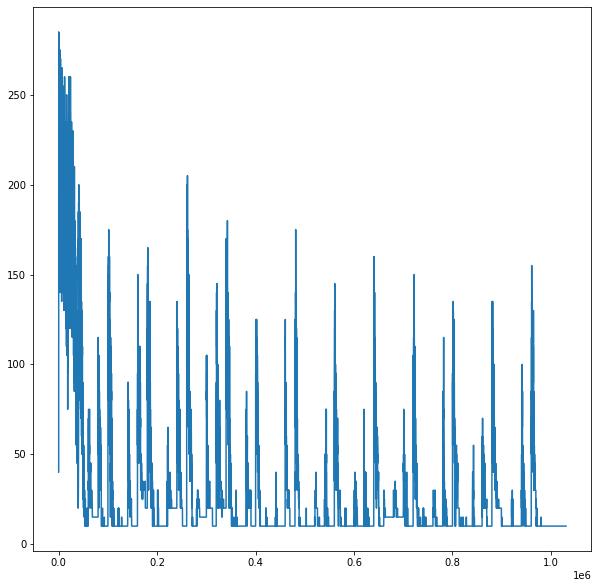

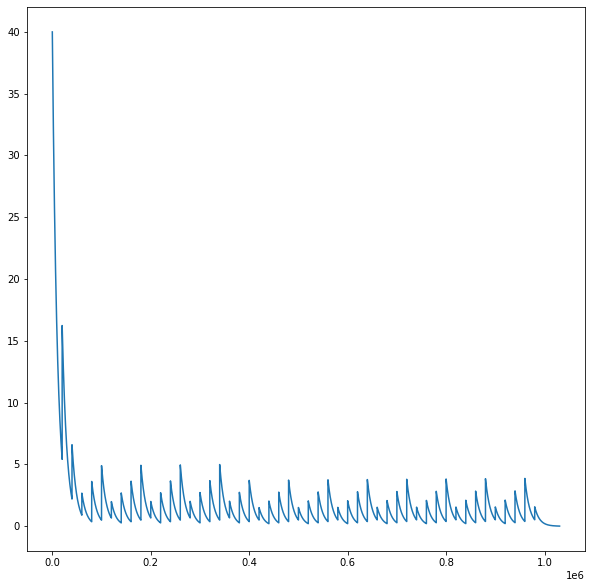

[[8 4 1 6 5 7 3 9 2]
 [5 9 6 3 8 2 7 4 1]
 [7 3 2 9 4 1 6 8 5]
 [6 1 9 2 7 5 8 4 3]
 [3 5 8 4 6 9 1 2 7]
 [2 7 4 1 3 8 9 5 6]
 [4 8 7 5 9 6 2 3 1]
 [1 6 3 8 2 4 5 7 9]
 [9 2 5 7 1 3 4 6 8]]
Nie rozwiązano, liczba pól błędnych 10

****************

[[0 0 0 0 0 3 0 1 7]
 [0 1 5 0 0 9 0 0 8]
 [0 6 0 0 0 0 0 0 0]
 [1 0 0 0 0 7 0 0 0]
 [0 0 9 0 0 0 2 0 0]
 [0 0 0 5 0 0 0 0 4]
 [0 0 0 0 0 0 0 2 0]
 [5 0 0 6 0 0 3 4 0]
 [3 4 0 2 0 0 0 0 0]]


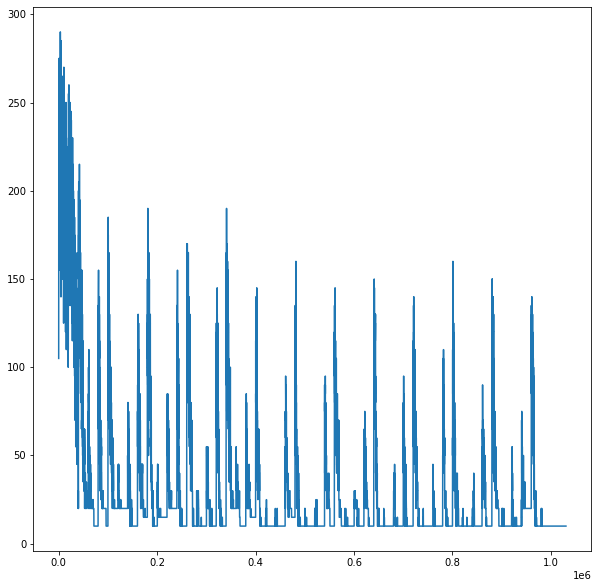

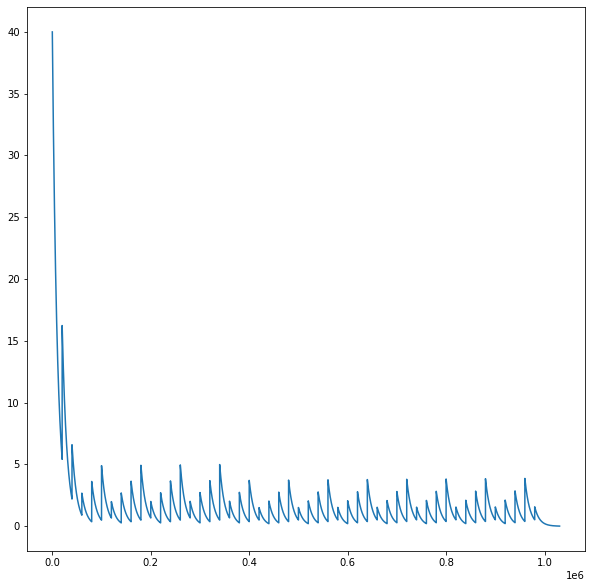

[[2 3 4 8 5 3 9 1 7]
 [7 1 5 4 2 9 6 3 8]
 [9 6 8 7 6 1 4 5 2]
 [1 5 2 9 4 7 8 6 3]
 [4 8 9 1 3 6 2 7 5]
 [6 7 3 5 8 2 1 9 4]
 [8 9 1 3 7 4 5 2 6]
 [5 2 7 6 1 8 3 4 9]
 [3 4 6 2 9 5 7 8 1]]
Nie rozwiązano, liczba pól błędnych 10

****************

[[1 0 0 0 0 7 0 9 0]
 [0 3 0 0 2 0 0 0 8]
 [0 0 9 6 0 0 5 0 0]
 [0 0 5 3 0 0 9 0 0]
 [0 1 0 0 8 0 0 0 2]
 [6 0 0 0 0 4 0 0 0]
 [3 0 0 0 0 0 0 1 0]
 [0 4 0 0 0 0 0 0 7]
 [0 0 7 0 0 0 3 0 0]]


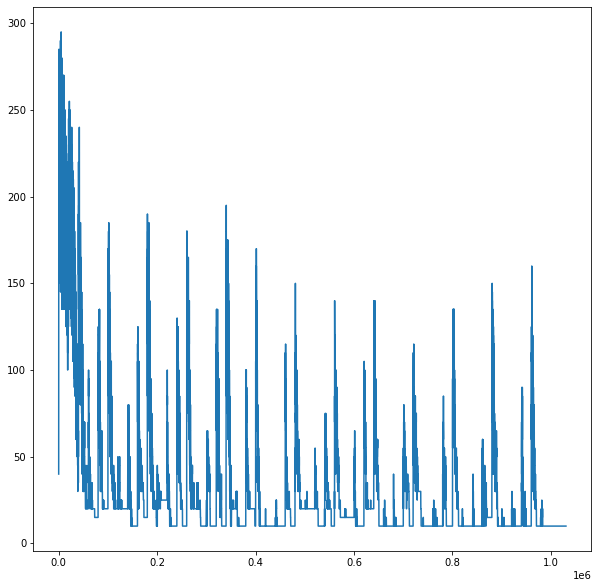

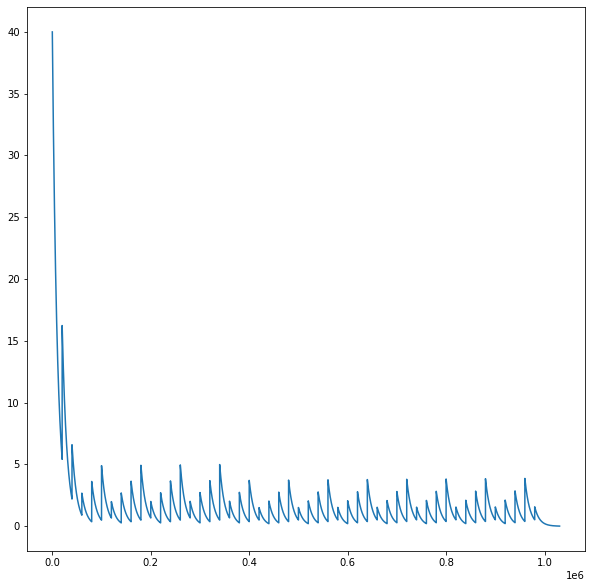

[[1 5 4 8 3 7 2 9 6]
 [8 3 6 4 2 5 1 7 8]
 [7 2 9 6 9 1 5 4 3]
 [2 7 5 3 1 6 9 8 4]
 [4 1 3 7 8 9 6 5 2]
 [6 9 8 2 5 4 7 3 1]
 [3 6 2 9 7 8 4 1 5]
 [9 4 1 5 6 3 8 2 7]
 [5 8 7 1 4 2 3 6 9]]
Nie rozwiązano, liczba pól błędnych 10

****************

[[0 4 0 0 0 0 0 0 0]
 [8 0 6 0 0 0 0 0 7]
 [5 0 0 0 0 0 1 0 0]
 [0 0 5 1 9 0 0 6 0]
 [0 0 4 0 5 0 0 0 0]
 [0 0 0 3 0 0 0 9 1]
 [0 0 0 0 0 2 4 3 6]
 [0 9 0 0 0 0 0 0 0]
 [0 0 0 0 0 8 0 2 0]]


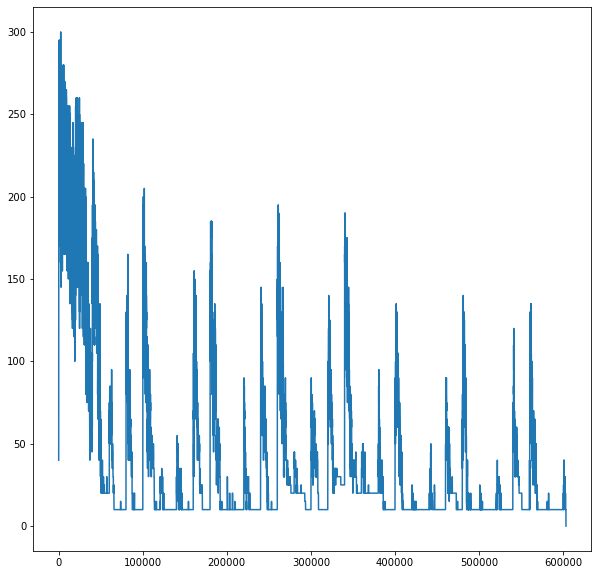

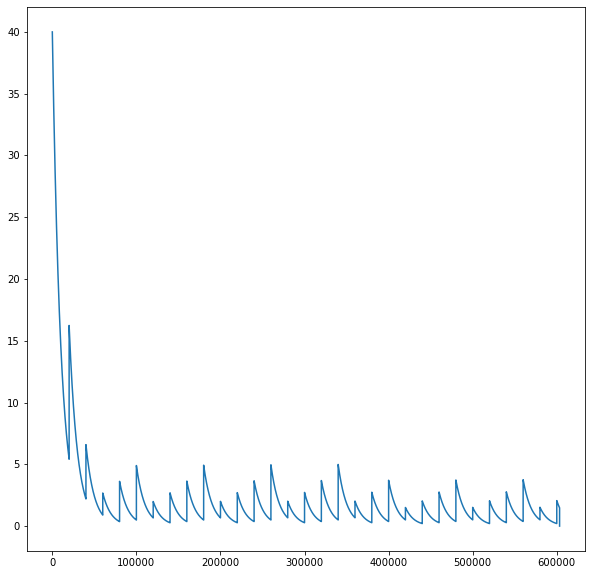

[[1 4 9 7 2 5 6 8 3]
 [8 2 6 4 3 1 9 5 7]
 [5 7 3 8 6 9 1 4 2]
 [3 8 5 1 9 7 2 6 4]
 [9 1 4 2 5 6 3 7 8]
 [2 6 7 3 8 4 5 9 1]
 [7 5 8 9 1 2 4 3 6]
 [4 9 2 6 7 3 8 1 5]
 [6 3 1 5 4 8 7 2 9]]
Znaleziono prawidłowe rozwiązanie w 603349 iteracjach

****************

[[0 0 0 0 5 4 3 0 6]
 [0 0 0 0 0 3 2 7 0]
 [0 0 0 7 2 0 0 0 1]
 [9 0 0 0 7 0 0 5 3]
 [0 0 0 0 0 0 0 0 0]
 [8 2 0 0 1 0 0 0 9]
 [3 0 0 0 6 1 0 0 0]
 [0 4 6 9 0 0 0 0 0]
 [7 0 1 5 4 0 0 0 0]]


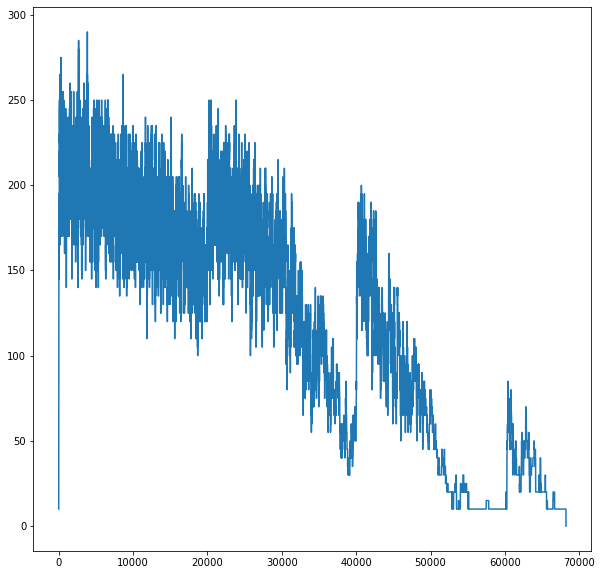

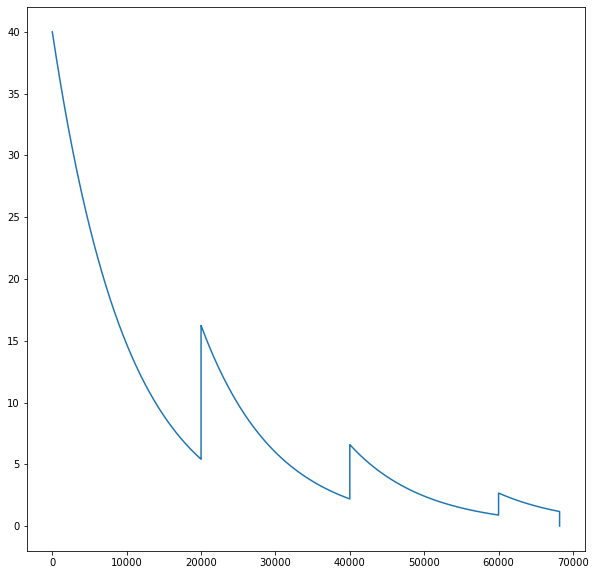

[[1 7 2 8 5 4 3 9 6]
 [4 6 8 1 9 3 2 7 5]
 [5 3 9 7 2 6 4 8 1]
 [9 1 4 6 7 2 8 5 3]
 [6 5 7 3 8 9 1 2 4]
 [8 2 3 4 1 5 7 6 9]
 [3 8 5 2 6 1 9 4 7]
 [2 4 6 9 3 7 5 1 8]
 [7 9 1 5 4 8 6 3 2]]
Znaleziono prawidłowe rozwiązanie w 68202 iteracjach

****************

[[7 9 0 0 0 0 0 0 3]
 [0 0 0 0 0 0 0 6 0]
 [8 0 1 0 0 4 0 0 2]
 [0 0 5 0 0 0 0 0 0]
 [3 0 0 1 0 0 0 0 0]
 [0 4 0 0 0 6 2 0 9]
 [2 0 0 0 3 0 0 0 6]
 [0 3 0 6 0 5 4 2 1]
 [0 0 0 0 0 0 0 0 0]]


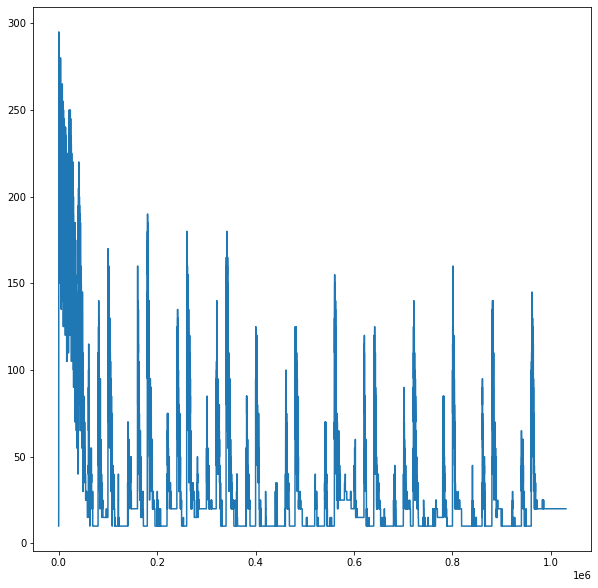

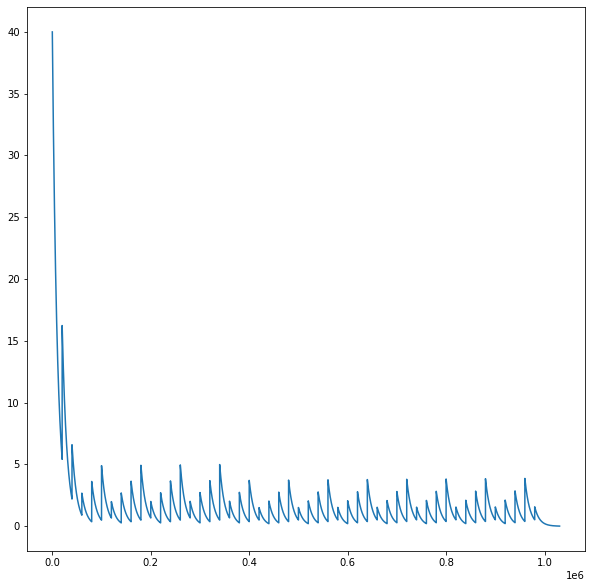

[[7 9 4 2 6 1 5 8 3]
 [5 2 3 7 8 9 1 6 4]
 [8 6 1 3 5 4 7 9 2]
 [6 7 5 9 2 4 3 1 8]
 [3 9 2 1 7 8 6 4 5]
 [1 4 8 5 3 6 2 7 9]
 [2 1 9 4 3 7 8 5 6]
 [8 3 7 6 9 5 4 2 1]
 [4 5 6 8 1 2 9 3 7]]
Nie rozwiązano, liczba pól błędnych 20

****************

Ze zbioru nieprawidłowo rozwiązanych sudoku prawidłowo rozwiązano 3 sudoku, co stanowi 42.857142857142854 procent wszystkich nieprawidłowych.


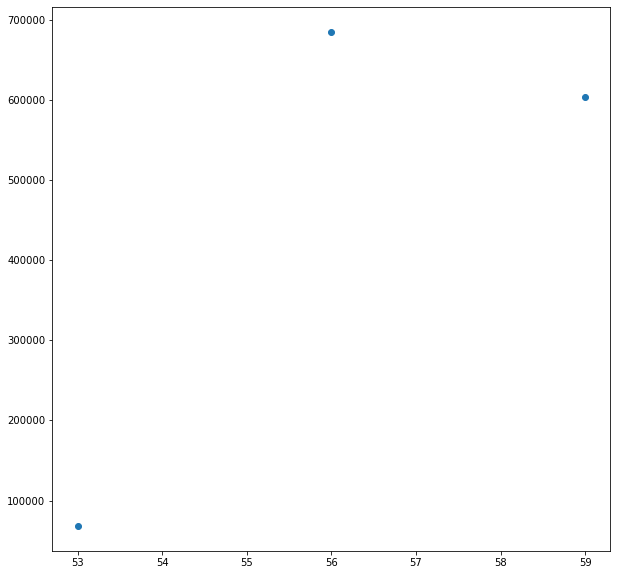

In [82]:
bad_sudoku_again = []

good = 0
bad = 0
X = []
Y = []
for sud, fill, bef in bad_sudoku:
    t = np.sum (bef == 0)
    s = Sudoku (sud, fill, temperature = 40, stop = 0.01)
    print (bef)
    res, en, ite = s.anneal ()
    print (res)
    if en == 0:
        X.append(t)
        Y.append(ite)
        print ("Znaleziono prawidłowe rozwiązanie w", ite, "iteracjach")
        good += 1
    else:
        bad_sudoku_again.append((res, fill, bef))
        print ("Nie rozwiązano, liczba pól błędnych", en)
        bad += 1
    print ()
    print ("****************")
    print ()
        
print ("Ze zbioru nieprawidłowo rozwiązanych sudoku prawidłowo rozwiązano", good, "sudoku, co stanowi", 100*good/(good+bad), "procent wszystkich nieprawidłowych.")

plt.figure (1, figsize = (10, 10))
plt.scatter (X, Y)
plt.show ()

In [85]:
print ("Nadal nie udało się rozwiązać", len(bad_sudoku_again), "plansze.")

Nadal nie udało się rozwiązać 4 plansze.


[[0 0 1 0 0 7 0 9 0]
 [5 9 0 0 8 0 0 0 1]
 [0 3 0 0 0 0 0 8 0]
 [0 0 0 0 0 5 8 0 0]
 [0 5 0 0 6 0 0 2 0]
 [0 0 4 1 0 0 0 0 0]
 [0 8 0 0 0 0 0 3 0]
 [1 0 0 0 2 0 0 7 9]
 [0 2 0 7 0 0 4 0 0]]


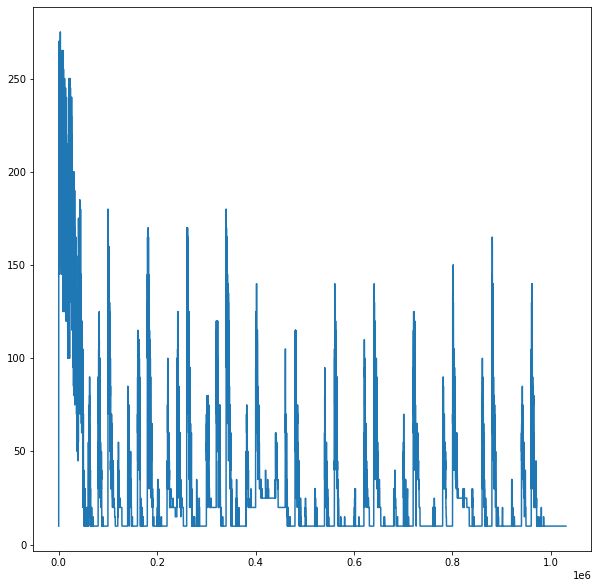

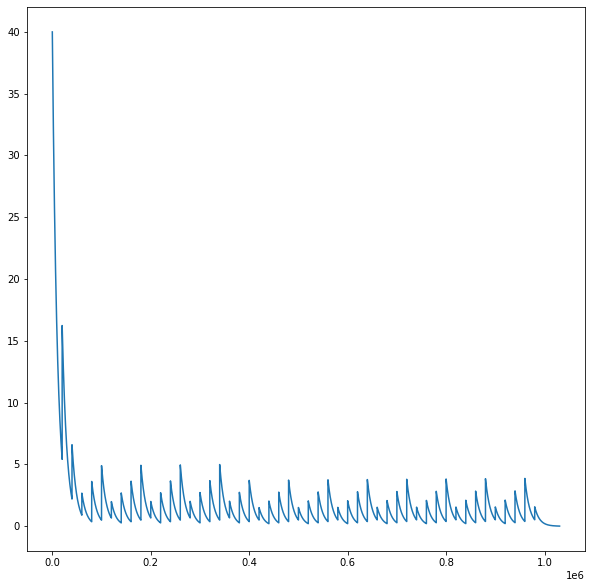

[[6 8 1 2 4 7 3 9 5]
 [5 9 2 3 8 6 7 4 1]
 [4 3 7 5 9 1 6 8 2]
 [2 7 1 9 3 5 8 6 4]
 [3 5 9 8 6 4 1 2 7]
 [8 6 4 1 7 2 9 5 3]
 [7 8 5 4 1 9 2 3 6]
 [1 4 3 6 2 8 5 7 9]
 [9 2 6 7 5 3 4 1 8]]
Nie rozwiązano, liczba pól błędnych 10

****************

[[0 0 0 0 0 3 0 1 7]
 [0 1 5 0 0 9 0 0 8]
 [0 6 0 0 0 0 0 0 0]
 [1 0 0 0 0 7 0 0 0]
 [0 0 9 0 0 0 2 0 0]
 [0 0 0 5 0 0 0 0 4]
 [0 0 0 0 0 0 0 2 0]
 [5 0 0 6 0 0 3 4 0]
 [3 4 0 2 0 0 0 0 0]]


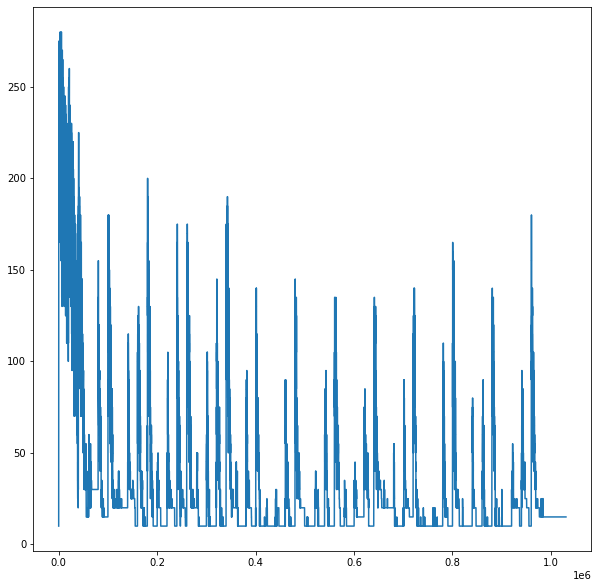

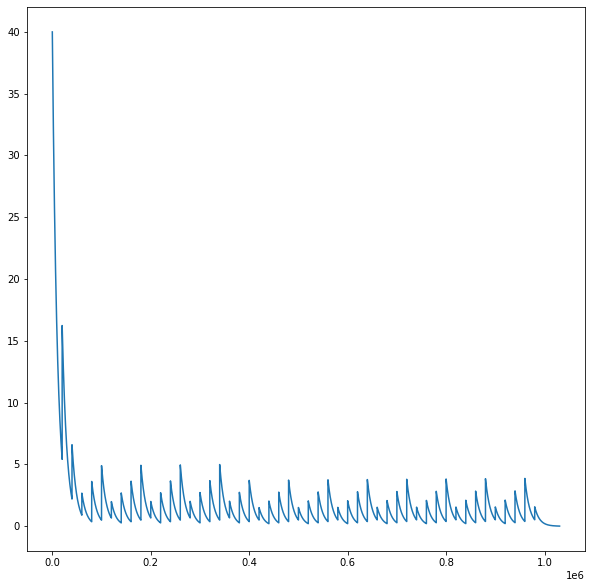

[[9 8 2 5 6 3 4 1 7]
 [4 1 5 7 2 9 6 3 8]
 [7 6 3 8 4 1 5 9 2]
 [1 5 4 3 2 7 9 8 6]
 [8 7 9 4 1 6 2 5 3]
 [2 3 6 5 8 9 1 7 4]
 [6 9 8 1 3 4 7 2 5]
 [5 2 1 6 7 8 3 4 9]
 [3 4 7 2 9 5 8 6 1]]
Nie rozwiązano, liczba pól błędnych 15

****************

[[1 0 0 0 0 7 0 9 0]
 [0 3 0 0 2 0 0 0 8]
 [0 0 9 6 0 0 5 0 0]
 [0 0 5 3 0 0 9 0 0]
 [0 1 0 0 8 0 0 0 2]
 [6 0 0 0 0 4 0 0 0]
 [3 0 0 0 0 0 0 1 0]
 [0 4 0 0 0 0 0 0 7]
 [0 0 7 0 0 0 3 0 0]]


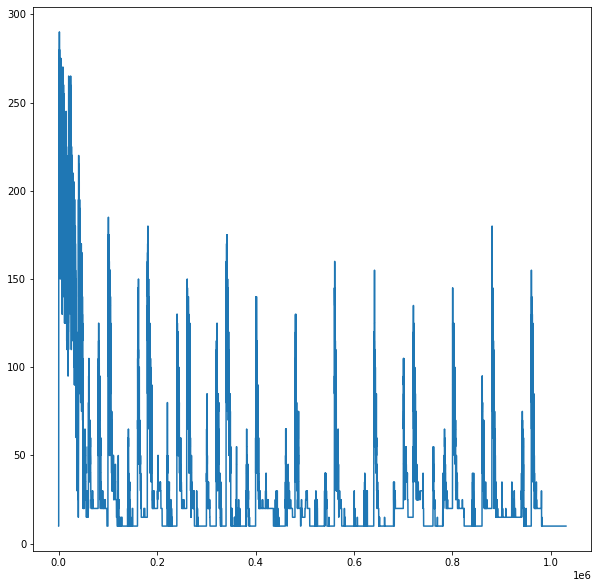

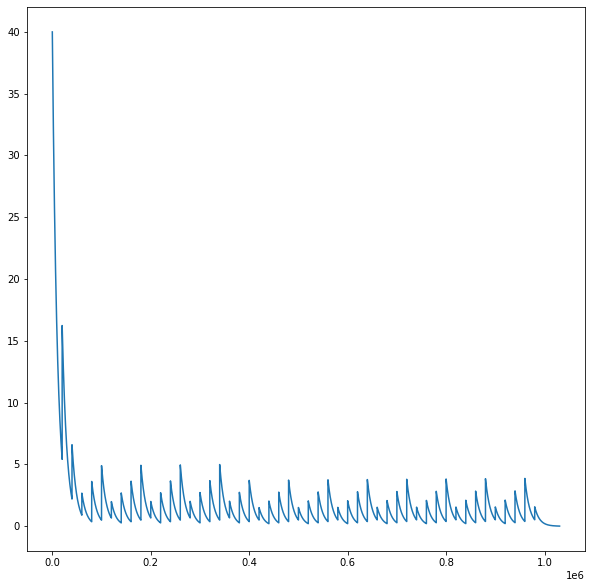

[[1 6 8 5 3 7 2 9 4]
 [5 3 4 1 2 9 7 6 8]
 [2 7 9 6 4 8 5 3 1]
 [7 8 5 3 1 2 9 4 5]
 [4 1 3 9 8 6 6 7 2]
 [6 9 2 7 5 4 1 8 3]
 [3 2 6 8 7 5 4 1 9]
 [9 4 1 2 6 3 8 5 7]
 [8 5 7 4 9 1 3 2 6]]
Nie rozwiązano, liczba pól błędnych 10

****************

[[7 9 0 0 0 0 0 0 3]
 [0 0 0 0 0 0 0 6 0]
 [8 0 1 0 0 4 0 0 2]
 [0 0 5 0 0 0 0 0 0]
 [3 0 0 1 0 0 0 0 0]
 [0 4 0 0 0 6 2 0 9]
 [2 0 0 0 3 0 0 0 6]
 [0 3 0 6 0 5 4 2 1]
 [0 0 0 0 0 0 0 0 0]]


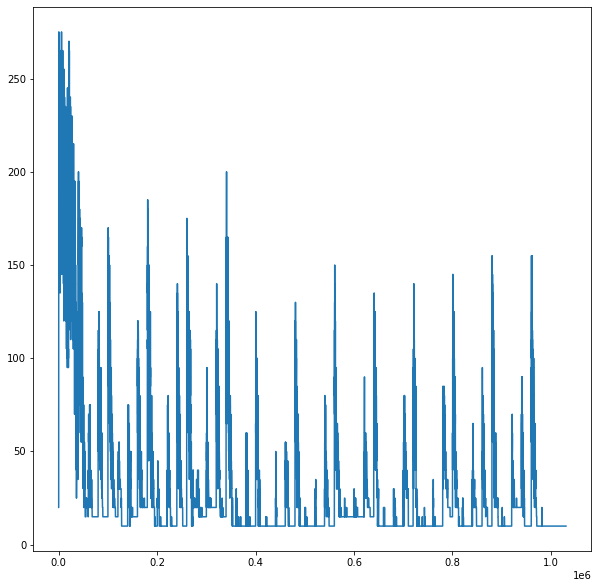

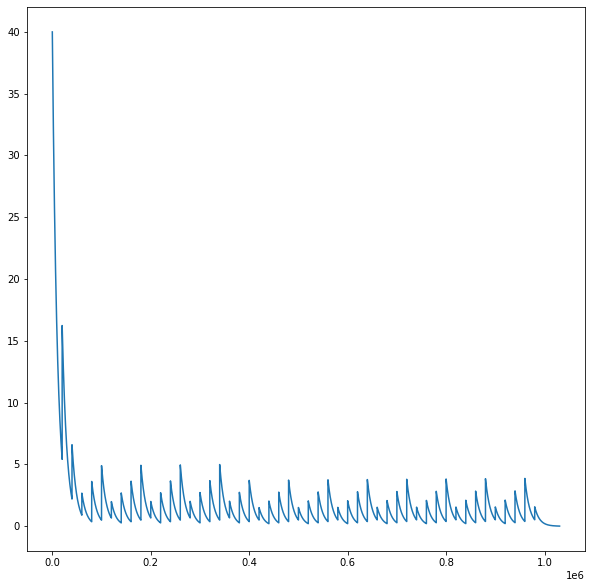

[[7 9 6 2 8 1 5 4 3]
 [4 2 3 9 5 7 1 6 8]
 [8 5 1 3 6 4 7 9 2]
 [9 7 5 8 2 3 6 1 4]
 [3 6 2 1 4 9 8 7 5]
 [1 4 8 5 7 6 2 3 9]
 [2 1 4 7 3 8 9 5 6]
 [5 3 7 6 9 5 4 2 1]
 [6 8 9 4 1 2 3 8 7]]
Nie rozwiązano, liczba pól błędnych 10

****************

Ze zbioru nieprawidłowo rozwiązanych sudoku prawidłowo rozwiązano 0 sudoku, co stanowi 0.0 procent wszystkich nieprawidłowych.


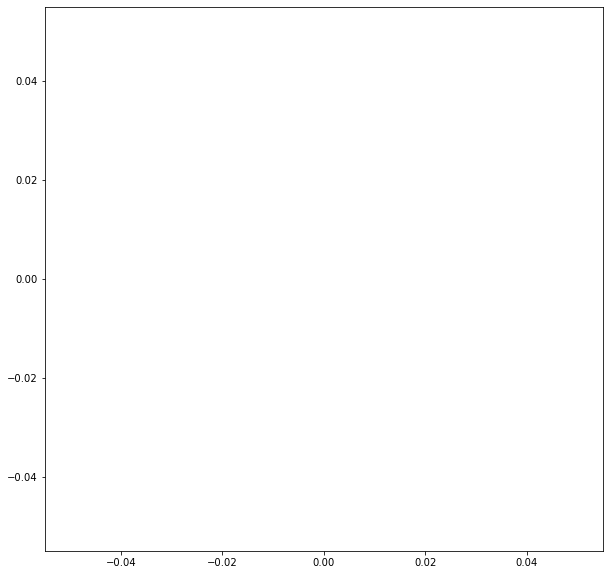

In [84]:
good = 0
bad = 0
X = []
Y = []
for sud, fill, bef in bad_sudoku_again:
    t = np.sum (bef == 0)
    s = Sudoku (sud, fill, temperature = 40, stop = 0.01)
    print (bef)
    res, en, ite = s.anneal ()
    print (res)
    if en == 0:
        X.append(t)
        Y.append(ite)
        print ("Znaleziono prawidłowe rozwiązanie w", ite, "iteracjach")
        good += 1
    else:
        print ("Nie rozwiązano, liczba pól błędnych", en)
        bad += 1
    print ()
    print ("****************")
    print ()
        
print ("Ze zbioru nieprawidłowo rozwiązanych sudoku prawidłowo rozwiązano", good, "sudoku, co stanowi", 100*good/(good+bad), "procent wszystkich nieprawidłowych.")

plt.figure (1, figsize = (10, 10))
plt.scatter (X, Y)
plt.show ()

Po trzech próbach pozostaje 4 plansze nierozwiązanych. Nie udało się rozwiązać kolejnych plansz. Można zauważyć, że w symulowanym wyżarzaniu występuje pewien element losowości oraz, a więc przy odrobinie szczęscia jest szansa znaleźć rozwiązanie dla każdej planszy.